## Stops

We study the stops of the participants. Recalling that we consider a stop when the time difference between two consecutive geo-locations is greater than 10 seconds:

    1. We represent all the stops (At>10s) on a map together with 7 predefined action units (from a previous cartographic study). Then we obtain the number of stops and the duration of the stops in each action unit. 
    
    2. We repeat the above procedure for each group separately.
    
    3. Missions of each group. We treat each group individually, representing the stops locations from the collected data (Wikiloc) and using the locations they provided from the videos they recorded performing each mission in the public space: 
    
    https://www.google.com/maps/d/u/0/edit?mid=1lroCj5JDv9YVo4a3eolDFiLmePjYL6Dd&ll=41.60312274114557%2C2.284456534082313&z=17
    
    Then we create a new map for each group only with the stops corresponding to the missions and their duration. Each stop is labelled with the code of the action/group (for instance Jg1 is "Jugar" of group G1) and the duration of the stop (for cartographic purposes).
    
    
    4. Map of missions (all groups). We create a new map for the whole groups but only representing the stops corresponding to the missions.
    
    5. New DataFrame for each group. After defining the missions (actions), localizations and durations for each group, we store them as a .csv file for each group of participants.
    
    6. Unit actions. We represent only the actions (missions) from all groups on a map together with the 7 predefined action units.
    
    7. Action maps. We create a map for each one of the missions (actions). Each stop contains the code of the group and the duration of the mission (jugar, xerrar, ballar, menjar, confeti, brindar).
    
    8. Stops children. We represent only these stops corresponding to a groups of children.
    
    9. Stops women. Only these stops corresponding to groups composed mostly of women.
    
    10. Stops men. Only these stops corresponding to groups composed mostly of men.

In [1]:
from gpxcsv import gpxtolist
import pandas as pd
import networkx as nx
import osmnx as ox


import matplotlib.pyplot as plt
import numpy as np
import glob
import os
from math import sin, cos, sqrt, atan2, radians
from mpl_toolkits.axes_grid1.inset_locator import inset_axes
from folium import Map
from folium.plugins import HeatMap, HeatMapWithTime
import utm
from matplotlib.animation import FuncAnimation
import matplotlib.animation as animation
from scipy.stats import gaussian_kde
from shapely.geometry import Point, LineString, Polygon
import folium

#%matplotlib notebook
#matplotlib inline
ox.config(use_cache=True, log_console=True)
ox.__version__





'1.0.1'

In [2]:
def GPScoordinates_to_utm(lat,lon):
    """" Function that projects the GPS coordinates in degrees (latitude, longitude) into the UTM coordinate system
    in order to work with the concept of "point" and "Euclidean distance" in a plane.
    (https://en.wikipedia.org/wiki/Universal_Transverse_Mercator_coordinate_system)
    
    Note: We are dealing with locations in the same area/region. Otherwise, we should be careful if two locations 
    belong to different UTM zones when calculating distances, etc. 
    
    Input:
        - lists of GPS coordinates: latitude and longitude
        
    Output:
        - lists of the UTM projections of the GPS coordinates: 
        - The utm package returns Easting, Northing, Zone_number and Zone_letter. So we only store the two first elements
    """
    
    lat_utm=[]
    lon_utm=[]
    for i in range(len(lat)):
        u=utm.from_latlon(lat[i],lon[i])  # get the UTM projection
        lat_utm.append(u[0])   # Store the projection of latitude and longitude in lists
        lon_utm.append(u[1])
        
    return lat_utm, lon_utm
        
    

def EuclidianDistance(x1,y1,x2,y2):
    """ Function that returns the distance in metres between 2 points in a p(NO GPS locs.) 
    
    Note: Be careful as the GPS coordinates (lat,lon) cannot be used, but their projections to a plane (e.g. utm projection).

    
    Input:
        - The coordinates of two points in a plane: (x1,y1) and (x2,y2).
        
    Output:
        - Euclidian distance in metres between the two points.
    """
    Euclidian_distance = ( (x2-x1)**2 + (y2-y1)**2 ) ** 0.5
        
    return Euclidian_distance
        
    
        
def getDistanceFromLatLonInM(lat1,lon1,lat2,lon2):
    """ Function that returns the distance in metres between 2 GPS locations in degrees (latitude and longitude).
    It is based in the Haversine formula (https://en.wikipedia.org/wiki/Haversine_formula) which takes into account the
    Earth's curvature. 
    
    Input:
        - 2 GPS coordinates: (latitude1,longitude1) of the first point and (latitude2,longitude2) of the second point. 
        
    Output:
        - Distance in metres between the two GPS locations.
    """
    
    R = 6371 # Radius of the earth in km
    dLat = radians(lat2-lat1)  # Diference between latitudes in radians
    dLon = radians(lon2-lon1) # Diference between longitudes in radians
    rLat1 = radians(lat1)   # Latitudes in radians
    rLat2 = radians(lat2)
    a = sin(dLat/2) * sin(dLat/2) + cos(rLat1) * cos(rLat2) * sin(dLon/2) * sin(dLon/2) 
    c = 2 * atan2(sqrt(a), sqrt(1-a))
    d = R * c # Distance in km
    e= d*1000 # Distance in m
   
    return e
   
    
    
def instantaneous_velocity(distance,time):
    """" Function that computes the instantenous velocity between two points, given their distance and their time difference.
    
    Input:
        - Distance between two points or two locations
        - Time difference between the two points/locations
        
    Output:
        - Instantenous velocity between the two points
    """
    
    v=distance/time
    
    return v


def convert(seconds):
    """" Function that converts the seconds to hours, minuts and seconds
    
    Input:
        - Number of seconds
        
    Output:
        - Hours, minuts and seconds
    """
    
    seconds = seconds % (24 * 3600)
    hour = seconds // 3600
    seconds %= 3600
    minutes = seconds // 60
    seconds %= 60
    
    return hour, minutes, seconds


def map_network(latitude, longitude, dist):
    """" Function that creates a map of the urban network in a given radius around a gps location.
    
    Input:
        - latitude and longitude (GPS coordinates)
        - dist: distance (radius) from which the network is constructed
        
    Output:
        - The figure and the axes.
        
    """
    
    G = ox.graph_from_point((latitude, longitude), dist, network_type='all')   # Create the graph from lat and lon
    fig, ax = ox.plot_graph(G, show=False, close=False, bgcolor="#333333",edge_color="w", edge_linewidth=0.8, node_size=0)
    
    #for _, edge in ox.graph_to_gdfs(G, nodes=False).fillna('').iterrows():     # Name of the street
        #c = edge['geometry'].centroid
        #text = edge['name']
        #ax.annotate(text, (c.x, c.y), c='w')       
 
    return fig, ax


def map_network2(lat1,lon1,lat2,lon2,lat3,lon3,lat4,lon4):
    """" Function that creates a map of the urban network from a polygon (given the 4 bounds).
    
    Input:
        - bounds: 4 latitude and longitude points (GPS coordinates)
        
    Output:
        - The figure and the axes.
        
    """
    
    P = Polygon([(lat1,lon1), (lat2,lon2),(lat3,lon3),(lat4,lon4)])  # Create the graph from lat and lon bounds
    G = ox.graph_from_polygon(P, network_type='all') 
    fig, ax = ox.plot_graph(G, show=False, close=False, bgcolor="#333333",edge_color="w", edge_linewidth=0.8, node_size=0)
    place_name = "Granollers, Vallès Oriental"
    tags={"building": True}
    gdf = ox.geometries_from_place(place_name, tags)
    gdf.shape
    gdf.plot(ax=ax,color='silver',alpha=0.5)
    buildings = ox.geometries_from_place(place_name, tags={'building':True}) # Retrieve buildings from the area:
    
    #for _, edge in ox.graph_to_gdfs(G, nodes=False).fillna('').iterrows():     # Name of the street
        #c = edge['geometry'].centroid
        #text = edge['name']
        #ax.annotate(text, (c.x, c.y), c='w')       
 
    return fig, ax


def RadiusOfGyration(x,y):
    """" Function that computes the radius of gyration of a 2-d trajectory with x and y coordinates.
    
    M. C. Gonzalez, C. a C. A. Hidalgo, A. L. A.-L. Barabási, M. C. González, C. A. H. 
    & A.-L. B. Marta C. González, and M. C. Gonz, Nature 453, 779 (2008).
    
    Note: x,y coordinates can't be lat,lon in degrees. Before we must project them into a plane (e.g UTM projection)
    
    
    Input:
        - Lists of coordinates x and y
    
    Output:
        - Radius of gyration
    """
    
    r_cm_x=sum(x)/len(x)
    r_cm_y=sum(y)/len(y)
    
    radius2=[]
    for i in range(len(x)):
        r_new_x=x[i]-r_cm_x
        r_new_y=y[i]-r_cm_y
        radius2.append((r_new_x*r_new_x) + (r_new_y*r_new_y))
    
    mean_radius2=sum(radius2)/len(radius2)
    
    rg=mean_radius2**0.5
    
    return rg
        
    
        

            

def vector(latitude0,longitude0,latitude1,longitude1): 
    """ Given two points returns the vector from the origin point to destination. If GPS coordinates, use UTM projection.
    
    Input:
        - Coordinates of origin point (p0x,p0y) and destionation point (p1x, p1y).
    
    Oputput:
        - Coordinates of the vector from p0 to p1. 
    """
    
    p0=(latitude0,longitude0)   
    p1=(latitude1,longitude1)
    vec=(p1[0]-p0[0], p1[1]-p0[1]) 
    return vec


def determinant(vec0,vec1):
    """  Returns determinant of two vectors. If det<0 means that the second vector has turned in the clockwise direction.
    
    Input:
        - Two consecutive vectors (vec0, vec1) characterized with their x,y coordinates.
        
    Output:
        - Determinant of two vectors. If det<0 the second vector has turned in the clockwise direction respect to the first.
    """
    det=vec0[0]*vec1[1]-vec0[1]*vec1[0]
    return det

# Obtain the angle between two consecutive vectors (change in orientation, reorientation, turning angle).
# This angle is <0 if det<0 (clockwise) and >0 if counter clockwise
def reorientation(vec0,vec1):
    """Returns the angle between two consecutive vectors (change in orientation, reorientation, turning angle)
    The range is from -pi to +pi. If det<0 the second vector has turned in the clockwise direction and therefore the 
    reorientation angle is also <0. On contrary, if has turned counter-clockwise is >0. 
    
    Input: 
        - Two consecutive vectors (vec0, vec1) characterized with their x,y coordinates.
    
    Output:
        - Reorientation angle between them 
    """
    unit_vec0=vec0/np.linalg.norm(vec0)
    unit_vec1=vec1/np.linalg.norm(vec1)
    dot_product=np.dot(unit_vec0,unit_vec1)
    a=np.arccos(dot_product)
    det=determinant(vec0,vec1)
    if det<0:
        return -a
    else:
        return a

    
        
def turtuosity(latitudes,longitudes):
    """ Given the two lists of latitudes and longitudes (utm projection), it returns the turtuosity of the trajectory. 
    If turtuosity is near 0 means that the trajectory is very straight to the final destionation. If its near to 1 means that
    is the movement is very turtuous (not direct).
    
    Input:
        - Lists of x and y points (latitudes and longitudes projected) of a trajectory.
        
    Output:
        - Estimation of the turtuosity of the trajectory.
    """

    vectors=[]
    vectors_straight=[]
    for i in range(1,len(latitudes)):
        vectors.append(vector(latitudes[i-1],longitudes[i-1],latitudes[i],longitudes[i]))  # Vector between the point i-1 and  i.
        vectors_straight.append(vector(latitudes[i-1],longitudes[i-1],latitudes[-1],longitudes[-1]))  # straight vector between  
                                                                                         # point i and final point (destination)
        
    reorientations=[]   
    for i in range(len(vectors)-1):
        reorientations.append(np.cos(abs(reorientation(vectors_straight[i],vectors[i])))) # Reorientation angle 
        #reorientations2 = [x for x in reorientations if np.isnan(x) == False]  # avoid nan values                                                                           # vector and the straight vector (>=0)
            
    turtuo=1.-(sum(reorientations)/len(reorientations))  # The average value of the movement re-orientations gives the effiency
                                                         # of the trajectory (how straightforward/directed is towards the final
                                                         # destionation. Then 1 - effiency is the turtuosity
            
    return turtuo



def flights_stops(latitudes,longitudes,times,velocities,v_threshold):
    """ Given the velocities and the velocity threshold, it split the dataframe into 2 for flights and for stops 
    
    Input:
        - Lists of latitudes, longitudes, times, velocities
        - Velocity threshold for consider a point as a "stop"
        
    Output:
        - Two DataFrames for stops and flights with the information of latitude, longitude, time and velocity 
    """
    
    lat_flight=[]
    lon_flight=[]
    time_flight=[]
    v_flight=[]
    lat_stop=[]
    lon_stop=[]
    time_stop=[]  
    v_stop=[]
    for i in range(len(velocities)):
        if velocities[i]<=v_threshold:
            lat_stop.append(latitudes[i])
            lon_stop.append(longitudes[i])
            time_stop.append(times[i])
            v_stop.append(velocities[i])
            
        else:
            lat_flight.append(latitudes[i])
            lon_flight.append(longitudes[i])
            time_flight.append(times[i])
            v_flight.append(velocities[i])
            
    df_flights=pd.DataFrame()
    df_stops=pd.DataFrame()
    
    df_flights['lat']=lat_flight
    df_flights['lon']=lon_flight
    df_flights['time']=time_flight
    df_flights['v']=v_flight
    df_stops['lat']=lat_stop
    df_stops['lon']=lon_stop
    df_stops['time']=time_stop
    df_stops['v']=v_stop
    
    return df_flights, df_stops

## 1- All groups of participants

We obtain for the whole of the participating groups:

    - The total number of stops.
    - The total duration of the stops.
    - The mean stop duration.
    - The duration of each stop.
    - El temps de cada aturada.
    - Number of stops and duration in each one of the 7 action units.
   

C:\Users\josep\anaconda3\envs\ox\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


<IPython.core.display.Javascript object>


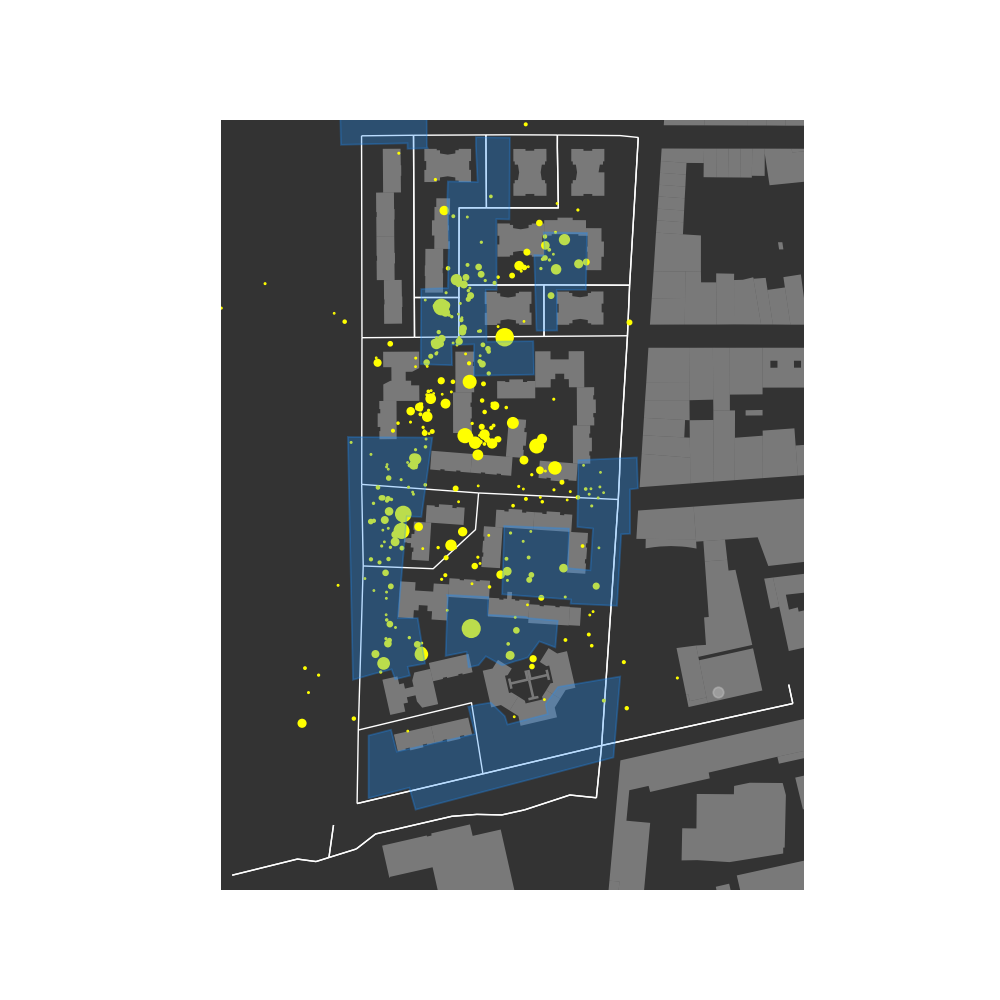

TOTS ELS GRUPS:

Nombre total daturades: 339
Temps total daturada: 64606.0 s
Temps promig daturada: 190.57817109144543 s
Desviació estandàrd temps daturada: 370.4900632366907 s
Temps més curt daturada: 10.0 s
Temps més llarg daturada: 2669.0 s


####################################################


UNITATS DACCIÓ

p01:

nombre aturades a la unitat dacció p01: 0
temps total aturada a la unitat daccio p01: 0 s
temps de cada aturada a la unitat daccio p01 [] s

-------------------------------------------------------------------------


c01:

nombre aturades a la unitat dacció c01: 59
temps total aturada a la unitat daccio c01: 10279.0 s
temps de cada aturada a la unitat daccio c01 [836.0, 105.0, 44.0, 36.0, 180.0, 42.0, 1130.0, 740.0, 291.0, 12.0, 197.0, 10.0, 20.0, 12.0, 376.0, 458.0, 256.0, 61.0, 340.0, 12.0, 52.0, 13.0, 325.0, 13.0, 10.0, 12.0, 57.0, 15.0, 244.0, 80.0, 24.0, 239.0, 17.0, 12.0, 35.0, 13.0, 96.0, 63.0, 64.0, 12.0, 14.0, 212.0, 277.0, 32.0, 10.0, 235.0, 12.0, 43.0, 129.0

In [4]:
from gpxcsv import gpxtolist
import pandas as pd
import networkx as nx
import osmnx as ox


import matplotlib.pyplot as plt
import numpy as np
import glob
import os
from math import sin, cos, sqrt, atan2, radians
from mpl_toolkits.axes_grid1.inset_locator import inset_axes
from folium import Map
from folium.plugins import HeatMap, HeatMapWithTime
import utm
from matplotlib.animation import FuncAnimation
import matplotlib.animation as animation
from scipy.stats import gaussian_kde
from shapely.geometry import Point, LineString, Polygon
import folium

%matplotlib notebook
#%matplotlib inline
ox.config(use_cache=True, log_console=True)
ox.__version__



fig, ax = map_network2(2.2804419490443517, 41.605107921345585, 2.28054397694062,41.60183248235341,  
                       2.283748215236327,41.602065783859004,  2.2840062702794897, 41.60530532450823)  # Create the graph from a given latitude and longitude


from turfpy.measurement import boolean_point_in_polygon
from geojson import Point, Polygon, Feature


all_files = glob.glob(os.path.join("*.csv"))

lat_tots=[]  # Initialise list for all the latitudes and longitudes
lon_tots=[]
At_tots=[]
stops_tots=[]


for file in all_files:   # Loop over all gpx files in the folder/directory  
    
    df = pd.read_csv(file) 

    
    lat=df['lat'].tolist()  # Time, Latitude and Longitude to lists
    lon=df['lon'].tolist()
    At=df['At'].tolist()
    
    lat_tots.extend(lat)   # list of Time increment, latitude and longitude for all groups.
    lon_tots.extend(lon)
    At_tots.extend(At)
   
    stops=df['stops'] 
    stops_tots.extend(stops)
    

    
# STOPS DURATION (At_cs) and geolocalization of each stop
At_cs=[]
lat_stop=[]
lon_stop=[]
i=0
while i < len(stops_tots):
    
    if stops_tots[i]=='flight':
        i=i+1
    
    else:
        s=0
        stopss=[]
        while stops_tots[i+s]=='stop':
            stopss.append(At_tots[i+s])
            s=s+1

        At_c=sum(stopss)
        At_cs.append(At_c)
        
        lat_stop.append(lat_tots[i])
        lon_stop.append(lon_tots[i])

    
        i=i+s
      
    

# For plotting purposes, we rescale the list of stops duration (dividing by the maximum value)
max_At=max(At_cs)
new_At_cs=[]
for j in range(len(At_cs)):
    new_At_cs.append(At_cs[j]/max_At)
    
# For a better visualisation in the map, we multiply each value by ·100 (otherwise it looks too small on the map)
new_At_cs2=[]
for i in range(len(new_At_cs)):
    new_At_cs2.append(100*new_At_cs[i])
    
    
print('TOTS ELS GRUPS:')
print('')
print('Nombre total daturades:', len(At_cs))
print('Temps total daturada:', sum(At_cs),'s')
print('Temps promig daturada:', sum(At_cs)/len(At_cs), 's')
print('Desviació estandàrd temps daturada:', np.std(At_cs) , 's')
print('Temps més curt daturada:', min(At_cs),'s')
print('Temps més llarg daturada:', max(At_cs),'s')
print('')
print('')
print('####################################################')
print('')
print('')
print('UNITATS DACCIÓ')
print('')
    
p01=Polygon([[(2.281903, 41.6047224), (2.2819017, 41.6049109), (2.2817113, 41.6049139), (2.2817193, 41.6054674),
       (2.281439, 41.6054674), (2.2814618, 41.6047274), (2.2818038, 41.6047334), (2.2818038, 41.6047123), 
       (2.2819071, 41.6047143), (2.281903, 41.6047224),]])


c01=Polygon([[(2.2821551, 41.6047224), (2.2821638, 41.6045846), (2.2820109, 41.6045866), (2.2820083, 41.6045224), 
       (2.2820163, 41.6043559), (2.2820109, 41.6041774), (2.2818741, 41.6041734), (2.2818715, 41.6038846),
       (2.2820324, 41.6038806), (2.2820297, 41.6039588), (2.2821451, 41.6039608), (2.2821451, 41.6038405), 
       (2.2824535, 41.6038445), (2.2824497, 41.603973), (2.2822096, 41.603971), (2.2822092, 41.6040323), 
       (2.2822058, 41.6041707), (2.2822615, 41.6041702), (2.2822604, 41.6044421), (2.2823274, 41.6044406), 
       (2.2823294, 41.604755), (2.2821551, 41.6047565), (2.2821551, 41.6047224),]])

c02=Polygon([[(2.2824656, 41.6040279), (2.2824669, 41.6040134), (2.2825729, 41.6040139), (2.2825702, 41.6041703),
       (2.2827204, 41.6041703), (2.2827258, 41.6043889), (2.2825032, 41.6043909), (2.2825085, 41.6043027),
       (2.2824549, 41.6043047), (2.2824656, 41.6040279),]])

p02=Polygon([[(2.2815208, 41.6036047), (2.2814974, 41.6036052), (2.2815235, 41.6026721), (2.2816362, 41.6026962), 
       (2.281722, 41.6027122), (2.2817408, 41.6026741), (2.2818159, 41.6026881), (2.2818051, 41.6027222), 
       (2.2818936, 41.6027343), (2.2818561, 41.6029088), (2.2817542, 41.6029088), (2.2817998, 41.6032999),
       (2.2818749, 41.6032979), (2.2819312, 41.6036027), (2.2815208, 41.6036047),]])

c04=Polygon([[(2.2820103, 41.6029885), (2.2819996, 41.6027639), (2.2821069, 41.6027799), (2.2821176, 41.6027198), 
       (2.2821688, 41.6027284), (2.2822063, 41.6027625), (2.2822895, 41.6027274), (2.282321, 41.6027349), 
       (2.2823364, 41.6027384), (2.2823585, 41.6027439), (2.2823773, 41.6027475), (2.2824001, 41.6027525), 
       (2.2824222, 41.6027585), (2.2824812, 41.6028196), (2.282563, 41.6027966), (2.2825751, 41.6028989), 
       (2.2824263, 41.6029089), (2.2824102, 41.6029139), (2.2822157, 41.6029219), (2.2822197, 41.6029901),
       (2.2820065, 41.6029981), (2.2820103, 41.6029885),]])

p04=Polygon([[(2.2828616, 41.6023738), (2.2828965, 41.6026847), (2.2825773, 41.6026446), (2.282513, 41.6025784), 
       (2.2825237, 41.6025403), (2.2823172, 41.6025002), (2.2823037, 41.6025322), (2.2822313, 41.6025844),
       (2.2821643, 41.6025764), (2.282116, 41.6025683), (2.2821509, 41.6024641), (2.2817485, 41.6023959), 
       (2.281719, 41.6024801), (2.2816037, 41.602458), (2.2816037, 41.6022174), (2.2818129, 41.6022575), 
       (2.2818451, 41.6021732), (2.2828616, 41.6023738),]])

p03=Polygon([[(2.2826815, 41.603516), (2.2826762, 41.6032593), (2.2827566, 41.6032533), (2.2827432, 41.6030928), 
       (2.2826279, 41.6031009), (2.2826333, 41.6032533), (2.2823007, 41.6032633), (2.2822899, 41.6030006),
       (2.282644, 41.6029805), (2.2826413, 41.6029645), (2.28288, 41.6029565), (2.2829015, 41.6032312),
       (2.2829471, 41.6032332), (2.2829471, 41.6034037), (2.2829873, 41.6034077), (2.282982, 41.6035261),
       (2.2826815, 41.603516),]])


x_p01=[2.281903,2.2819017,2.2817113,2.2817193,2.281439,2.2814618,2.2818038,2.2818038,2.2819071,2.281903]
y_p01=[41.6047224,41.6049109, 41.6049139, 41.6054674, 41.6054674, 41.6047274, 41.6047334, 41.6047123, 41.6047143, 41.6047224]

x_c01=[2.2821551,2.2821638,2.2820109,2.2820083,2.2820163,2.2820109,2.2818741,2.2818715,2.2820324,2.2820297,2.2821451,2.2821451,
       2.2824535,2.2824497,2.2822096,2.2822092,2.2822058,2.2822615,2.2822604,2.2823274,2.2823294,2.2821551,2.2821551]
y_c01=[41.6047224,41.6045846,41.6045866,41.6045224,41.6043559, 41.6041774, 41.6041734, 41.6038846, 41.6038806, 41.6039588,
       41.6039608, 41.6038405, 41.6038445, 41.603973, 41.603971, 41.6040323, 41.6041707, 41.6041702, 41.6044421, 41.6044406, 
       41.604755, 41.6047565, 41.6047224]

x_c02=[2.2824656,2.2824669,2.2825729,2.2825702,2.2827204,2.2827258,2.2825032,2.2825085,2.2824549,2.2824656]
y_c02=[41.6040279, 41.6040134, 41.6040139, 41.6041703, 41.6041703, 41.6043889, 41.6043909, 41.6043027, 41.6043047, 41.6040279]

x_p02=[2.2815208,2.2814974,2.2815235,2.2816362,2.281722,2.2817408,2.2818159,2.2818051,2.2818936,2.2818561,2.2817542,2.2817998,
       2.2818749,2.2819312, 2.2815208]
y_p02=[41.6036047, 41.6036052, 41.6026721, 41.6026962, 41.6027122, 41.6026741, 41.6026881, 41.6027222, 41.6027343, 41.6029088, 
       41.6029088, 41.6032999, 41.6032979, 41.6036027, 41.6036047]

x_c04=[2.2820103,2.2819996,2.2821069,2.2821176,2.2821688,2.2822063,2.2822895,2.282321,2.2823364,2.2823585,2.2823773,2.2824001,
       2.2824222,2.2824812,2.282563,2.2825751,2.2824263,2.2824102,2.2822157,2.2822197,2.2820065,2.2820103]
y_c04=[41.6029885, 41.6027639, 41.6027799, 41.6027198, 41.6027284, 41.6027625, 41.6027274, 41.6027349, 41.6027384, 41.6027439, 
       41.6027475, 41.6027525, 41.6027585, 41.6028196, 41.6027966, 41.6028989, 41.6029089, 41.6029139, 41.6029219, 41.6029901, 
       41.6029981, 41.6029885]

x_p04=[2.2828616,2.2828965,2.2825773,2.282513,2.2825237,2.2823172,2.2823037,2.2822313,2.2821643,2.282116,2.2821509,2.2817485,
       2.281719,2.2816037,2.2816037,2.2818129,2.2818451,2.2828616]
y_p04=[41.6023738, 41.6026847, 41.6026446, 41.6025784, 41.6025403, 41.6025002, 41.6025322, 41.6025844, 41.6025764, 41.6025683, 
       41.6024641, 41.6023959, 41.6024801, 41.602458, 41.6022174, 41.6022575, 41.6021732, 41.6023738]

x_p03=[2.2826815,2.2826762,2.2827566,2.2827432,2.2826279,2.2826333,2.2823007,2.2822899,2.282644,2.2826413,2.28288,2.2829015,
       2.2829471,2.2829471,2.2829873,2.282982,2.2826815]
y_p03=[41.603516, 41.6032593, 41.6032533, 41.6030928, 41.6031009, 41.6032533, 41.6032633, 41.6030006, 41.6029805, 41.6029645, 
       41.6029565, 41.6032312, 41.6032332, 41.6034037, 41.6034077, 41.6035261, 41.603516]

plt.fill(x_p01,y_p01,alpha=0.3,c='dodgerblue')
plt.fill(x_c01,y_c01,alpha=0.3,c='dodgerblue')
plt.fill(x_c02,y_c02,alpha=0.3,c='dodgerblue')
plt.fill(x_p02,y_p02,alpha=0.3,c='dodgerblue')
plt.fill(x_c04,y_c04,alpha=0.3,c='dodgerblue')
plt.fill(x_p04,y_p04,alpha=0.3,c='dodgerblue')
plt.fill(x_p03,y_p03,alpha=0.3,c='dodgerblue') 
    
    
At_cs_inside_p01=[]
lon_stop_inside_p01=[]
lat_stop_inside_p01=[]
At_cs_inside_c01=[]
lon_stop_inside_c01=[]
lat_stop_inside_c01=[]
At_cs_inside_c02=[]
lon_stop_inside_c02=[]
lat_stop_inside_c02=[]
At_cs_inside_p02=[]
lon_stop_inside_p02=[]
lat_stop_inside_p02=[]
At_cs_inside_c04=[]
lon_stop_inside_c04=[]
lat_stop_inside_c04=[]
At_cs_inside_p04=[]
lon_stop_inside_p04=[]
lat_stop_inside_p04=[]
At_cs_inside_p03=[]
lon_stop_inside_p03=[]
lat_stop_inside_p03=[]

for i in range(len(lon_stop)):

    point_p01 = Feature(geometry=Point((lon_stop[i],lat_stop[i])))
    point_c01 = Feature(geometry=Point((lon_stop[i],lat_stop[i])))
    point_c02 = Feature(geometry=Point((lon_stop[i],lat_stop[i])))
    point_p02 = Feature(geometry=Point((lon_stop[i],lat_stop[i])))
    point_c04 = Feature(geometry=Point((lon_stop[i],lat_stop[i])))
    point_p04 = Feature(geometry=Point((lon_stop[i],lat_stop[i])))
    point_p03 = Feature(geometry=Point((lon_stop[i],lat_stop[i])))
    
    check_p01=boolean_point_in_polygon(point_p01, p01)
    check_c01=boolean_point_in_polygon(point_c01, c01)
    check_c02=boolean_point_in_polygon(point_c02, c02)
    check_p02=boolean_point_in_polygon(point_p02, p02)
    check_c04=boolean_point_in_polygon(point_c04, c04)
    check_p04=boolean_point_in_polygon(point_p04, p04)
    check_p03=boolean_point_in_polygon(point_p03, p03)
    
    if check_p01==True:
        lon_stop_inside_p01.append(lon_stop[i])
        lat_stop_inside_p01.append(lat_stop[i])
        At_cs_inside_p01.append(At_cs[i])
    
    if check_c01==True:
        lon_stop_inside_c01.append(lon_stop[i])
        lat_stop_inside_c01.append(lat_stop[i])
        At_cs_inside_c01.append(At_cs[i])
        
    if check_c02==True:
        lon_stop_inside_c02.append(lon_stop[i])
        lat_stop_inside_c02.append(lat_stop[i])
        At_cs_inside_c02.append(At_cs[i])
        
    if check_p02==True:
        lon_stop_inside_p02.append(lon_stop[i])
        lat_stop_inside_p02.append(lat_stop[i])
        At_cs_inside_p02.append(At_cs[i])
        
    if check_c04==True:
        lon_stop_inside_c04.append(lon_stop[i])
        lat_stop_inside_c04.append(lat_stop[i])
        At_cs_inside_c04.append(At_cs[i])
        
    if check_p04==True:
        lon_stop_inside_p04.append(lon_stop[i])
        lat_stop_inside_p04.append(lat_stop[i])
        At_cs_inside_p04.append(At_cs[i])
        
    if check_p03==True:
        lon_stop_inside_p03.append(lon_stop[i])
        lat_stop_inside_p03.append(lat_stop[i])
        At_cs_inside_p03.append(At_cs[i])
        
    
print('p01:')
print('')
print('nombre aturades a la unitat dacció p01:', len(At_cs_inside_p01))
print('temps total aturada a la unitat daccio p01:', sum(At_cs_inside_p01),'s' )
print('temps de cada aturada a la unitat daccio p01', At_cs_inside_p01,'s')

if len(At_cs_inside_p01)!=0:
    mean_p01=sum(At_cs_inside_p01)/len(At_cs_inside_p01)
    max_p01=max(At_cs_inside_p01)
    min_p01=min(At_cs_inside_p01)
    print('Temps més curt daturada:', min(At_cs_inside_p01),'s')
    print('Temps més llarg daturada:', max(At_cs_inside_p01),'s')
else:
    mean_p01=0
    max_p01=0
    min_p01=0
print('')
print('-------------------------------------------------------------------------')
print('')
print('')

print('c01:')
print('')
print('nombre aturades a la unitat dacció c01:', len(At_cs_inside_c01))
print('temps total aturada a la unitat daccio c01:', sum(At_cs_inside_c01),'s' )
print('temps de cada aturada a la unitat daccio c01', At_cs_inside_c01,'s')
if len(At_cs_inside_c01)!=0:
    mean_c01=sum(At_cs_inside_c01)/len(At_cs_inside_c01)
    max_c01=max(At_cs_inside_c01)
    min_c01=min(At_cs_inside_c01)
    print('Temps més curt daturada:', min(At_cs_inside_c01),'s')
    print('Temps més llarg daturada:', max(At_cs_inside_c01),'s')
else:
    mean_c01=0
    max_c01=0
    min_c01=0
print('')
print('-------------------------------------------------------------------------')
print('')
print('')

print('c02:')
print('')
print('nombre aturades a la unitat dacció c02:', len(At_cs_inside_c02))
print('temps total aturada a la unitat daccio c02:', sum(At_cs_inside_c02),'s' )
print('temps de cada aturada a la unitat daccio c02', At_cs_inside_c02,'s')
if len(At_cs_inside_c02)!=0:
    mean_c02=sum(At_cs_inside_c02)/len(At_cs_inside_c02)
    max_c02=max(At_cs_inside_c02)
    min_c02=min(At_cs_inside_c02)
    print('Temps més curt daturada:', min(At_cs_inside_c02),'s')
    print('Temps més llarg daturada:', max(At_cs_inside_c02),'s')
else:
    mean_c02=0
    max_c02=0
    min_c02=0
print('')
print('-------------------------------------------------------------------------')
print('')
print('')

print('p02:')
print('')
print('nombre aturades a la unitat dacció p02:', len(At_cs_inside_p02))
print('temps total aturada a la unitat daccio p02:', sum(At_cs_inside_p02),'s' )
print('temps de cada aturada a la unitat daccio p02', At_cs_inside_p02,'s')
if len(At_cs_inside_p02)!=0:
    mean_p02=sum(At_cs_inside_p02)/len(At_cs_inside_p02)
    max_p02=max(At_cs_inside_p02)
    min_p02=min(At_cs_inside_p02)
    print('Temps més curt daturada:', min(At_cs_inside_p02),'s')
    print('Temps més llarg daturada:', max(At_cs_inside_p02),'s')
else:
    mean_p02=0
    max_p02=0
    min_p02=0
print('')
print('-------------------------------------------------------------------------')
print('')
print('')

print('c04:')
print('')
print('nombre aturades a la unitat dacció c04:', len(At_cs_inside_c04))
print('temps total aturada a la unitat daccio c04:', sum(At_cs_inside_c04),'s' )
print('temps de cada aturada a la unitat daccio c04', At_cs_inside_c04,'s')
if len(At_cs_inside_c04)!=0:
    mean_c04=sum(At_cs_inside_c04)/len(At_cs_inside_c04)
    max_c04=max(At_cs_inside_c04)
    min_c04=min(At_cs_inside_c04)
    print('Temps més curt daturada:', min(At_cs_inside_c04),'s')
    print('Temps més llarg daturada:', max(At_cs_inside_c04),'s')
else:
    mean_c04=0
    max_c04=0
    min_c04=0
print('')
print('-------------------------------------------------------------------------')
print('')
print('')

print('p04:')
print('')
print('nombre aturades a la unitat dacció p04:', len(At_cs_inside_p04))
print('temps total aturada a la unitat daccio p04:', sum(At_cs_inside_p04),'s' )
print('temps de cada aturada a la unitat daccio p04', At_cs_inside_p04,'s')
if len(At_cs_inside_p04)!=0:
    mean_p04=sum(At_cs_inside_p04)/len(At_cs_inside_p04)
    max_p04=max(At_cs_inside_p04)
    min_p04=min(At_cs_inside_p04)
    print('Temps més curt daturada:', min(At_cs_inside_p04),'s')
    print('Temps més llarg daturada:', max(At_cs_inside_p04),'s')
else:
    mean_p04=0
    max_p04=0
    min_p04=0
print('')
print('-------------------------------------------------------------------------')
print('')
print('')

print('p03:')
print('')
print('nombre aturades a la unitat dacció p03:', len(At_cs_inside_p03))
print('temps total aturada a la unitat daccio p03:', sum(At_cs_inside_p03),'s' )
print('temps de cada aturada a la unitat daccio p03', At_cs_inside_p03,'s')
if len(At_cs_inside_p03)!=0:
    mean_p03=sum(At_cs_inside_p03)/len(At_cs_inside_p03)
    max_p03=max(At_cs_inside_p03)
    min_p03=min(At_cs_inside_p03)
    print('Temps més curt daturada:', min(At_cs_inside_p03),'s')
    print('Temps més llarg daturada:', max(At_cs_inside_p03),'s')
else:
    mean_p03=0
    max_p03=max(At_cs_inside_p03)
    min_p03=min(At_cs_inside_p03)
print('')
print('-------------------------------------------------------------------------')
print('')
print('')

num=[len(At_cs_inside_p01), len(At_cs_inside_c01), len(At_cs_inside_c02), len(At_cs_inside_p02), len(At_cs_inside_c04),
    len(At_cs_inside_p04),len(At_cs_inside_p03)]
t=[sum(At_cs_inside_p01), sum(At_cs_inside_c01), sum(At_cs_inside_c02), sum(At_cs_inside_p02), sum(At_cs_inside_c04),
    sum(At_cs_inside_p04),sum(At_cs_inside_p03)]
mean_t=[mean_p01,mean_c01,mean_c02,mean_p02,mean_c04,mean_p04,mean_p03]
unitats=['p01','c01','c02','p02','c04','p04','p03']

sc=plt.scatter(lon_stop,lat_stop,c='yellow',s=new_At_cs2)

At_cs_names=[]
for i in range(len(At_cs)):
    At_cs_names.append(str(At_cs[i])+'s')
    
names=np.array(At_cs_names)


annot = ax.annotate("", xy=(0,0), xytext=(20,20),textcoords="offset points",
                    bbox=dict(boxstyle="round", fc="w"),
                    arrowprops=dict(arrowstyle="->", color='white'),fontsize='large')
annot.set_visible(False)

def update_annot(ind):

    pos = sc.get_offsets()[ind["ind"][0]]
    annot.xy = pos
    #text = "{}, {}".format(" ".join(list(map(str,ind["ind"]))), 
                           #" ".join([names[n] for n in ind["ind"]]))
        
    text = "{}".format(" ".join([names[n] for n in ind["ind"]]))
    annot.set_text(text)
    #annot.get_bbox_patch().set_facecolor(cmap(norm(c[ind["ind"][0]])))
    annot.get_bbox_patch().set_facecolor('limegreen')
    annot.get_bbox_patch().set_alpha(0.7)


def hover(event):
    vis = annot.get_visible()
    if event.inaxes == ax:
        cont, ind = sc.contains(event)
        if cont:
            update_annot(ind)
            annot.set_visible(True)
            fig.canvas.draw_idle()
        else:
            if vis:
                amnnot.set_visible(False)
                fig.canvas.draw_idle()

fig.canvas.mpl_connect("motion_notify_event", hover)

#plt.savefig('stops_all.pdf',format='pdf', bbox_inches='tight')

plt.show()
    

In [5]:
df_temps_unitats=pd.DataFrame()

df_temps_unitats['unitats']=unitats
df_temps_unitats['num aturades']=num
df_temps_unitats['temps total aturades']=t
df_temps_unitats['temps promig aturada']=mean_t

df_temps_unitats

C:\Users\josep\anaconda3\envs\ox\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,unitats,num aturades,temps total aturades,temps promig aturada
0,p01,0,0.0,0.000000
1,c01,59,10279.0,174.220339
2,c02,13,3191.0,245.461538
3,p02,69,13423.0,194.536232
4,c04,8,3444.0,430.500000
5,p04,1,42.0,42.000000
6,p03,23,1778.0,77.304348


In [6]:
df_temps_unitats.style.background_gradient(axis=0) 

C:\Users\josep\anaconda3\envs\ox\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,unitats,num aturades,temps total aturades,temps promig aturada
0,p01,0,0.000000,0.000000
1,c01,59,10279.000000,174.220339
2,c02,13,3191.000000,245.461538
3,p02,69,13423.000000,194.536232
4,c04,8,3444.000000,430.500000
5,p04,1,42.000000,42.000000
6,p03,23,1778.000000,77.304348


## 2- EACH GROUP SEPARATELY

   

GRUP: e1.csv

Nombre total daturades: 18
Temps total daturada: 2208.0 s
Temps promig daturada: 122.66666666666667




<IPython.core.display.Javascript object>


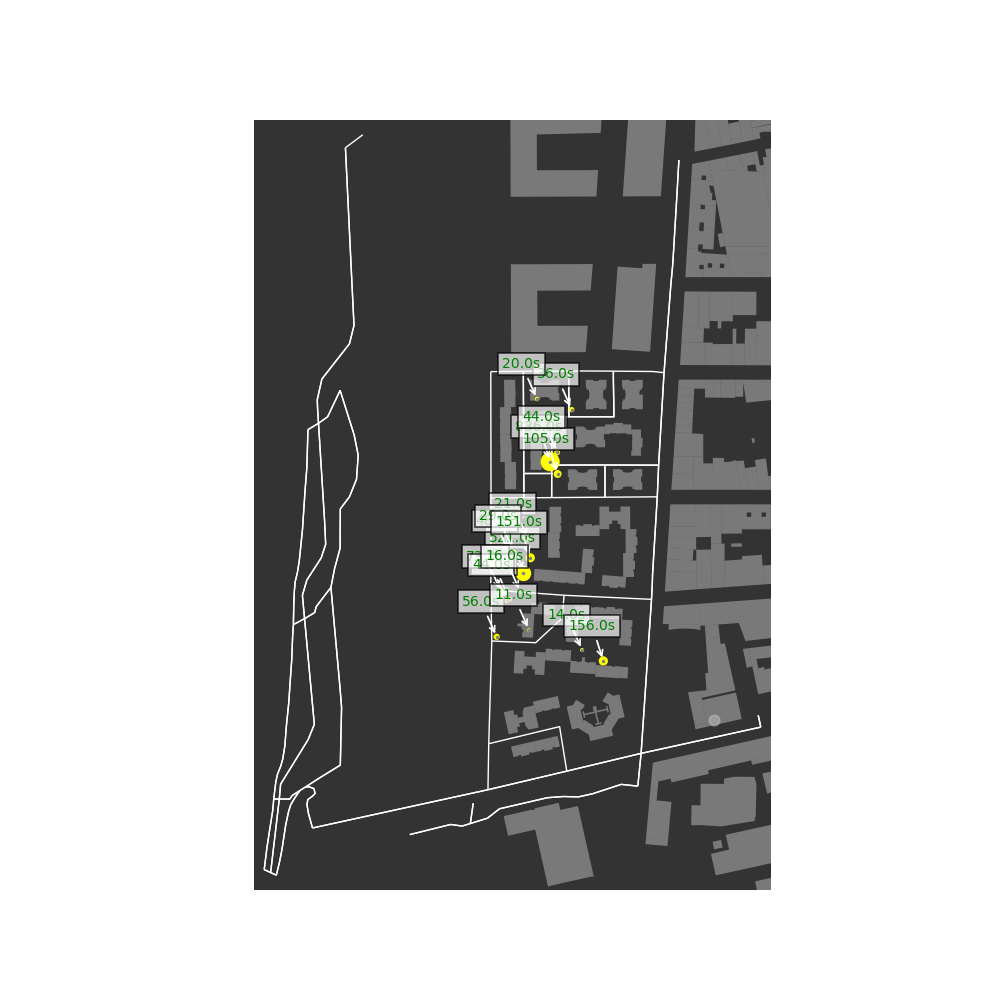

####################################################


UNITATS DACCIÓ

p01:

nombre aturades a la unitat dacció p01: 0
temps total aturada a la unitat daccio p01: 0 s
temps de cada aturada a la unitat daccio p01 [] s

-------------------------------------------------------------------------


c01:

nombre aturades a la unitat dacció c01: 4
temps total aturada a la unitat daccio c01: 1021.0 s
temps de cada aturada a la unitat daccio c01 [836.0, 105.0, 44.0, 36.0] s

-------------------------------------------------------------------------


c02:

nombre aturades a la unitat dacció c02: 0
temps total aturada a la unitat daccio c02: 0 s
temps de cada aturada a la unitat daccio c02 [] s

-------------------------------------------------------------------------


p02:

nombre aturades a la unitat dacció p02: 6
temps total aturada a la unitat daccio p02: 737.0 s
temps de cada aturada a la unitat daccio p02 [27.0, 521.0, 73.0, 56.0, 44.0, 16.0] s

---------------------------------------------

<IPython.core.display.Javascript object>


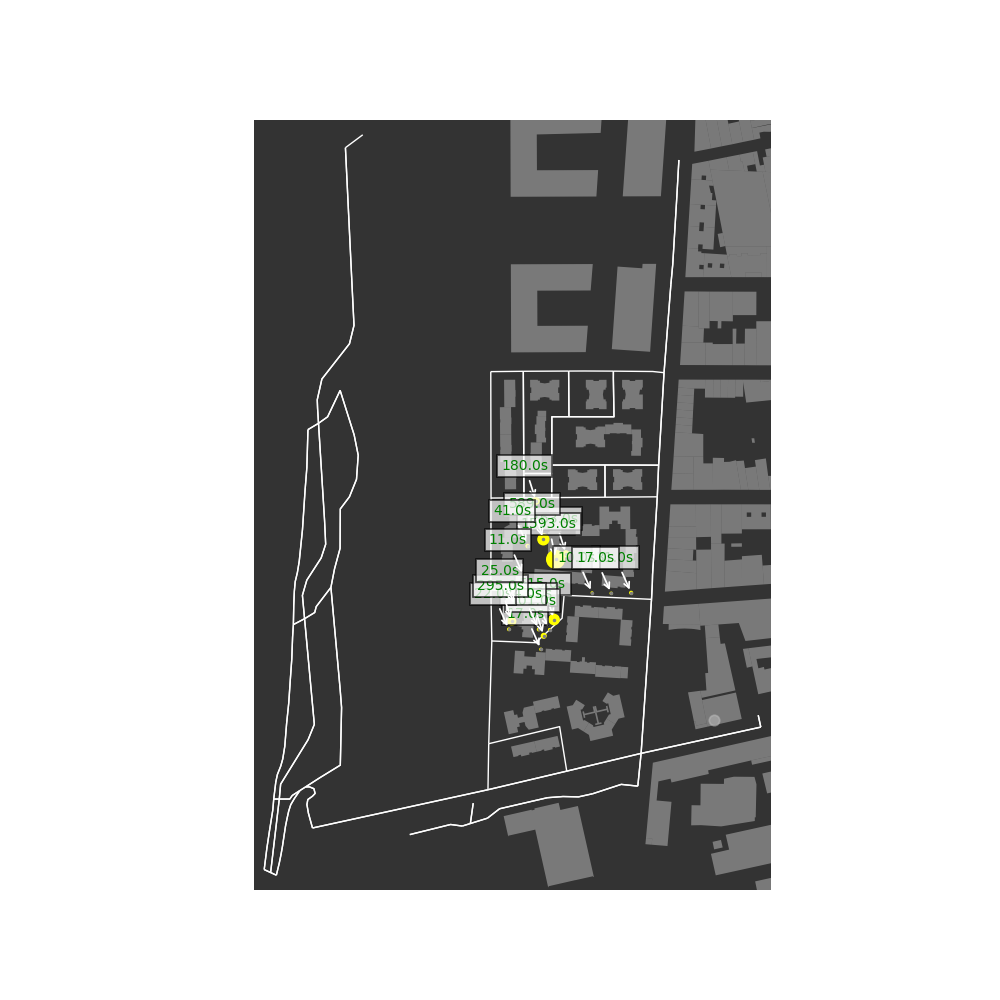

####################################################


UNITATS DACCIÓ

p01:

nombre aturades a la unitat dacció p01: 0
temps total aturada a la unitat daccio p01: 0 s
temps de cada aturada a la unitat daccio p01 [] s

-------------------------------------------------------------------------


c01:

nombre aturades a la unitat dacció c01: 1
temps total aturada a la unitat daccio c01: 180.0 s
temps de cada aturada a la unitat daccio c01 [180.0] s

-------------------------------------------------------------------------


c02:

nombre aturades a la unitat dacció c02: 0
temps total aturada a la unitat daccio c02: 0 s
temps de cada aturada a la unitat daccio c02 [] s

-------------------------------------------------------------------------


p02:

nombre aturades a la unitat dacció p02: 4
temps total aturada a la unitat daccio p02: 353.0 s
temps de cada aturada a la unitat daccio p02 [22.0, 295.0, 25.0, 11.0] s

-------------------------------------------------------------------------


c

<IPython.core.display.Javascript object>


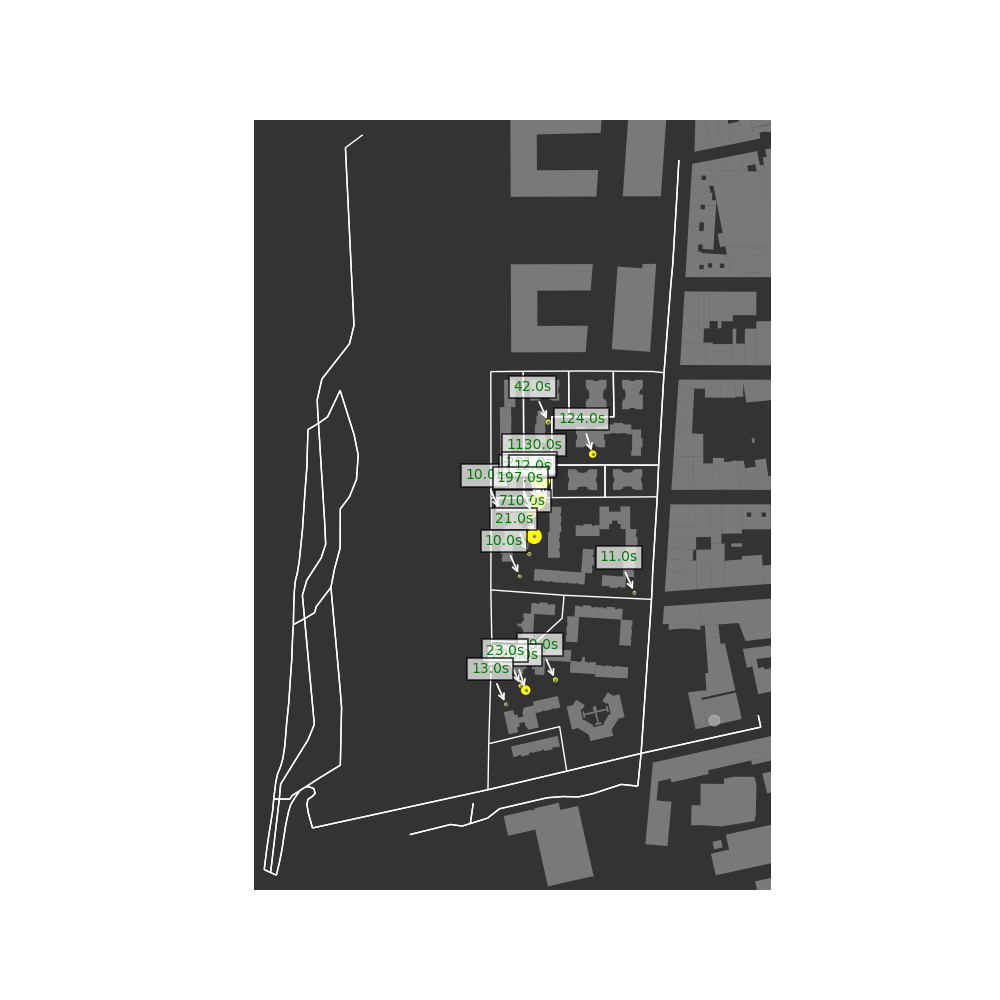

####################################################


UNITATS DACCIÓ

p01:

nombre aturades a la unitat dacció p01: 0
temps total aturada a la unitat daccio p01: 0 s
temps de cada aturada a la unitat daccio p01 [] s

-------------------------------------------------------------------------


c01:

nombre aturades a la unitat dacció c01: 6
temps total aturada a la unitat daccio c01: 2412.0 s
temps de cada aturada a la unitat daccio c01 [42.0, 1130.0, 740.0, 291.0, 12.0, 197.0] s

-------------------------------------------------------------------------


c02:

nombre aturades a la unitat dacció c02: 0
temps total aturada a la unitat daccio c02: 0 s
temps de cada aturada a la unitat daccio c02 [] s

-------------------------------------------------------------------------


p02:

nombre aturades a la unitat dacció p02: 4
temps total aturada a la unitat daccio p02: 272.0 s
temps de cada aturada a la unitat daccio p02 [226.0, 23.0, 13.0, 10.0] s

------------------------------------------

<IPython.core.display.Javascript object>


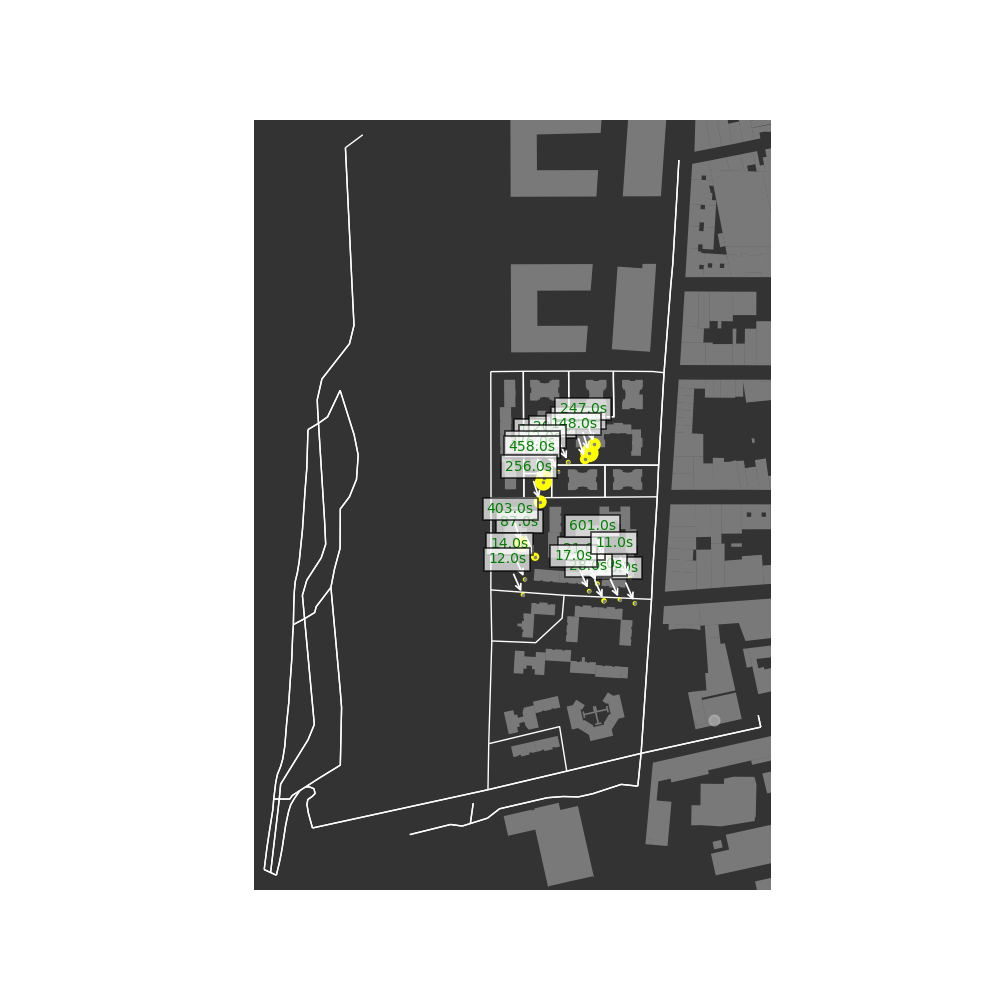

####################################################


UNITATS DACCIÓ

p01:

nombre aturades a la unitat dacció p01: 0
temps total aturada a la unitat daccio p01: 0 s
temps de cada aturada a la unitat daccio p01 [] s

-------------------------------------------------------------------------


c01:

nombre aturades a la unitat dacció c01: 6
temps total aturada a la unitat daccio c01: 1132.0 s
temps de cada aturada a la unitat daccio c01 [10.0, 20.0, 12.0, 376.0, 458.0, 256.0] s

-------------------------------------------------------------------------


c02:

nombre aturades a la unitat dacció c02: 0
temps total aturada a la unitat daccio c02: 0 s
temps de cada aturada a la unitat daccio c02 [] s

-------------------------------------------------------------------------


p02:

nombre aturades a la unitat dacció p02: 2
temps total aturada a la unitat daccio p02: 26.0 s
temps de cada aturada a la unitat daccio p02 [14.0, 12.0] s

----------------------------------------------------------

<IPython.core.display.Javascript object>


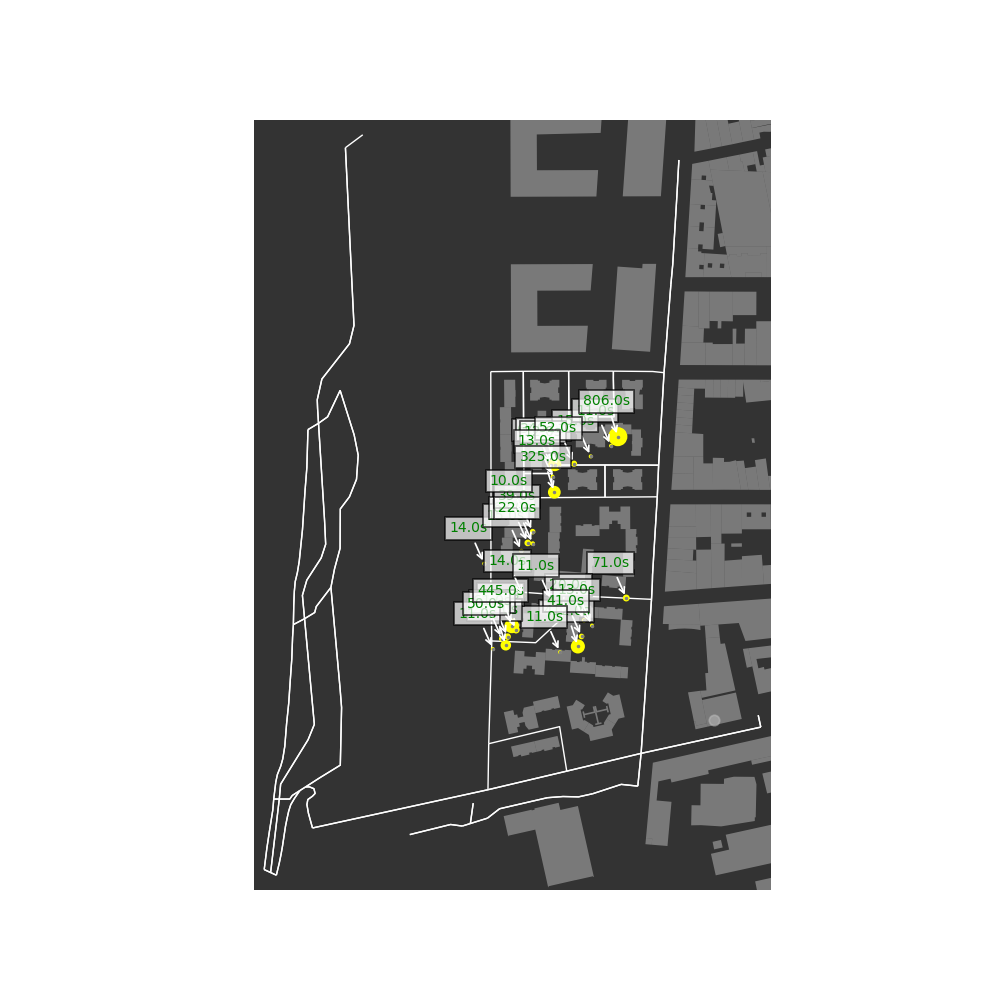

####################################################


UNITATS DACCIÓ

p01:

nombre aturades a la unitat dacció p01: 0
temps total aturada a la unitat daccio p01: 0 s
temps de cada aturada a la unitat daccio p01 [] s

-------------------------------------------------------------------------


c01:

nombre aturades a la unitat dacció c01: 6
temps total aturada a la unitat daccio c01: 803.0 s
temps de cada aturada a la unitat daccio c01 [61.0, 340.0, 12.0, 52.0, 13.0, 325.0] s

-------------------------------------------------------------------------


c02:

nombre aturades a la unitat dacció c02: 2
temps total aturada a la unitat daccio c02: 817.0 s
temps de cada aturada a la unitat daccio c02 [11.0, 806.0] s

-------------------------------------------------------------------------


p02:

nombre aturades a la unitat dacció p02: 8
temps total aturada a la unitat daccio p02: 886.0 s
temps de cada aturada a la unitat daccio p02 [85.0, 206.0, 61.0, 11.0, 50.0, 445.0, 14.0, 14.0] s

------

<IPython.core.display.Javascript object>


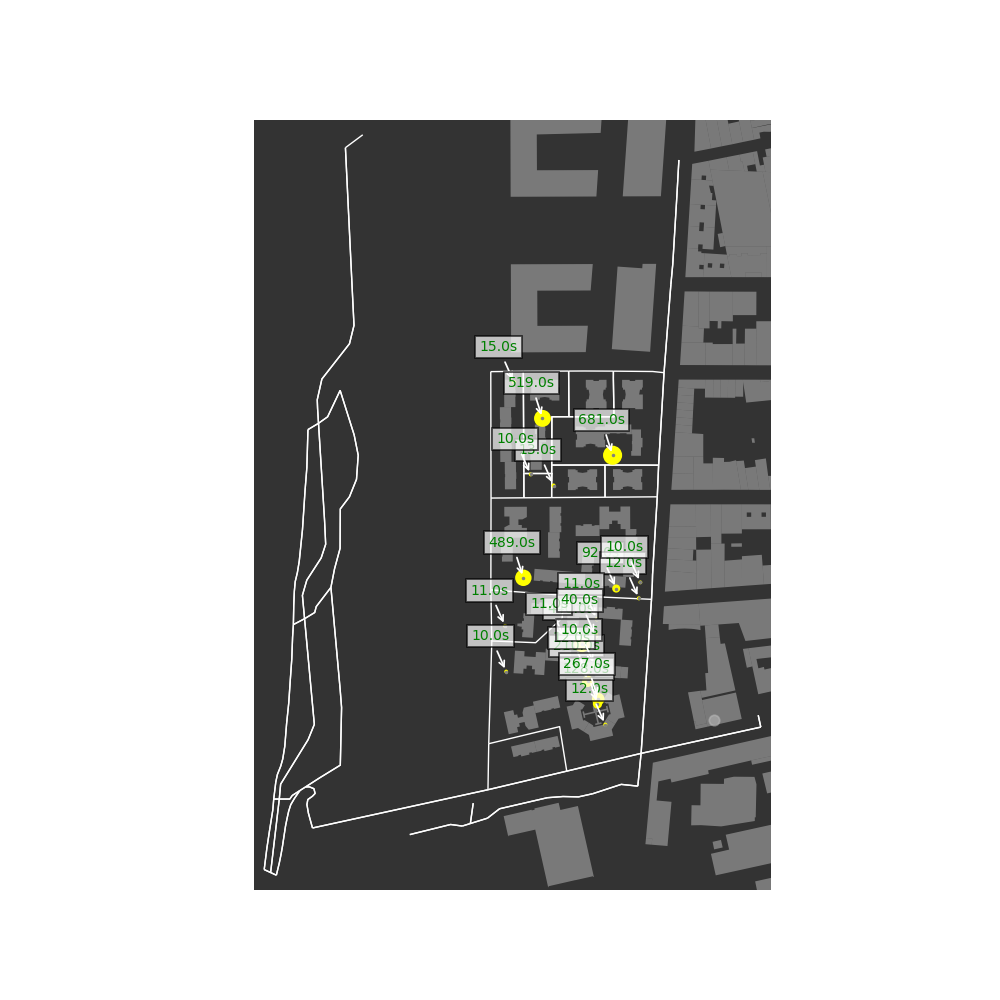

####################################################


UNITATS DACCIÓ

p01:

nombre aturades a la unitat dacció p01: 0
temps total aturada a la unitat daccio p01: 0 s
temps de cada aturada a la unitat daccio p01 [] s

-------------------------------------------------------------------------


c01:

nombre aturades a la unitat dacció c01: 2
temps total aturada a la unitat daccio c01: 23.0 s
temps de cada aturada a la unitat daccio c01 [13.0, 10.0] s

-------------------------------------------------------------------------


c02:

nombre aturades a la unitat dacció c02: 1
temps total aturada a la unitat daccio c02: 681.0 s
temps de cada aturada a la unitat daccio c02 [681.0] s

-------------------------------------------------------------------------


p02:

nombre aturades a la unitat dacció p02: 3
temps total aturada a la unitat daccio p02: 510.0 s
temps de cada aturada a la unitat daccio p02 [489.0, 11.0, 10.0] s

----------------------------------------------------------------------

<IPython.core.display.Javascript object>


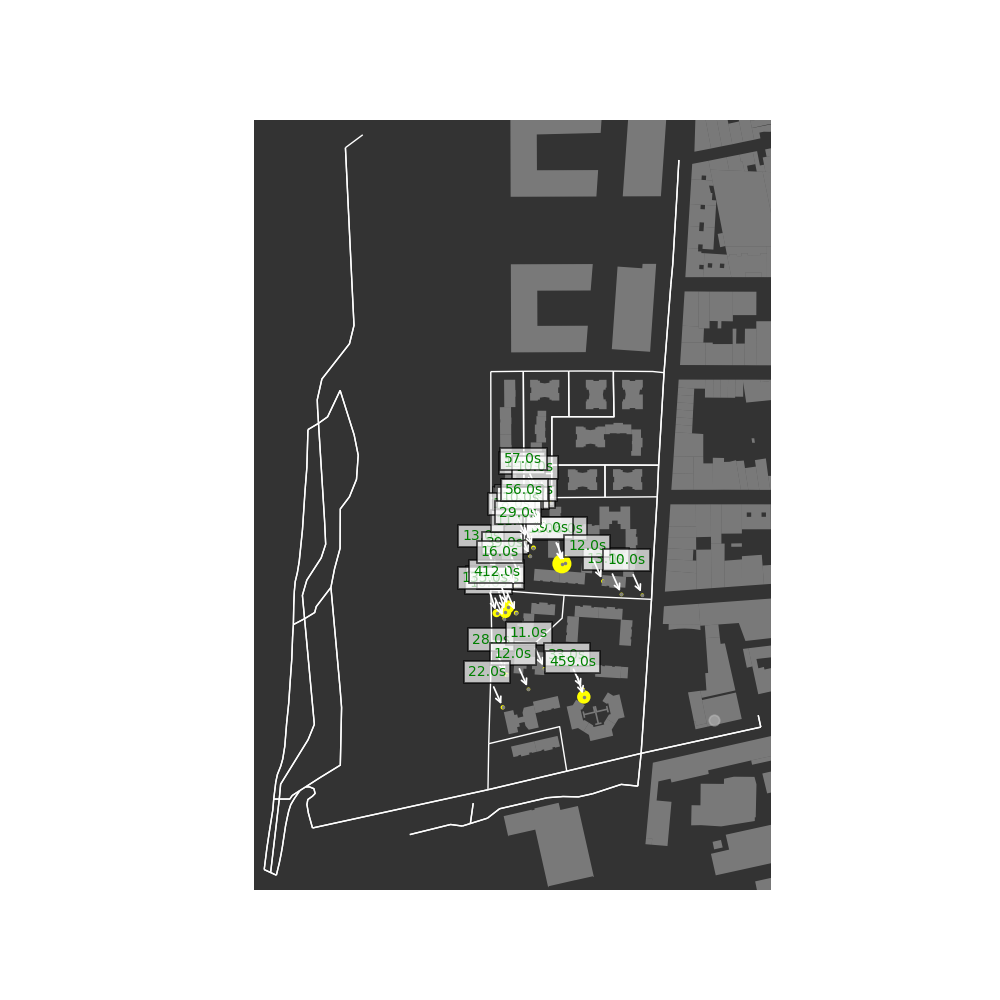

####################################################


UNITATS DACCIÓ

p01:

nombre aturades a la unitat dacció p01: 0
temps total aturada a la unitat daccio p01: 0 s
temps de cada aturada a la unitat daccio p01 [] s

-------------------------------------------------------------------------


c01:

nombre aturades a la unitat dacció c01: 2
temps total aturada a la unitat daccio c01: 69.0 s
temps de cada aturada a la unitat daccio c01 [12.0, 57.0] s

-------------------------------------------------------------------------


c02:

nombre aturades a la unitat dacció c02: 0
temps total aturada a la unitat daccio c02: 0 s
temps de cada aturada a la unitat daccio c02 [] s

-------------------------------------------------------------------------


p02:

nombre aturades a la unitat dacció p02: 10
temps total aturada a la unitat daccio p02: 1045.0 s
temps de cada aturada a la unitat daccio p02 [13.0, 340.0, 10.0, 30.0, 135.0, 39.0, 412.0, 28.0, 22.0, 16.0] s

---------------------------------

<IPython.core.display.Javascript object>


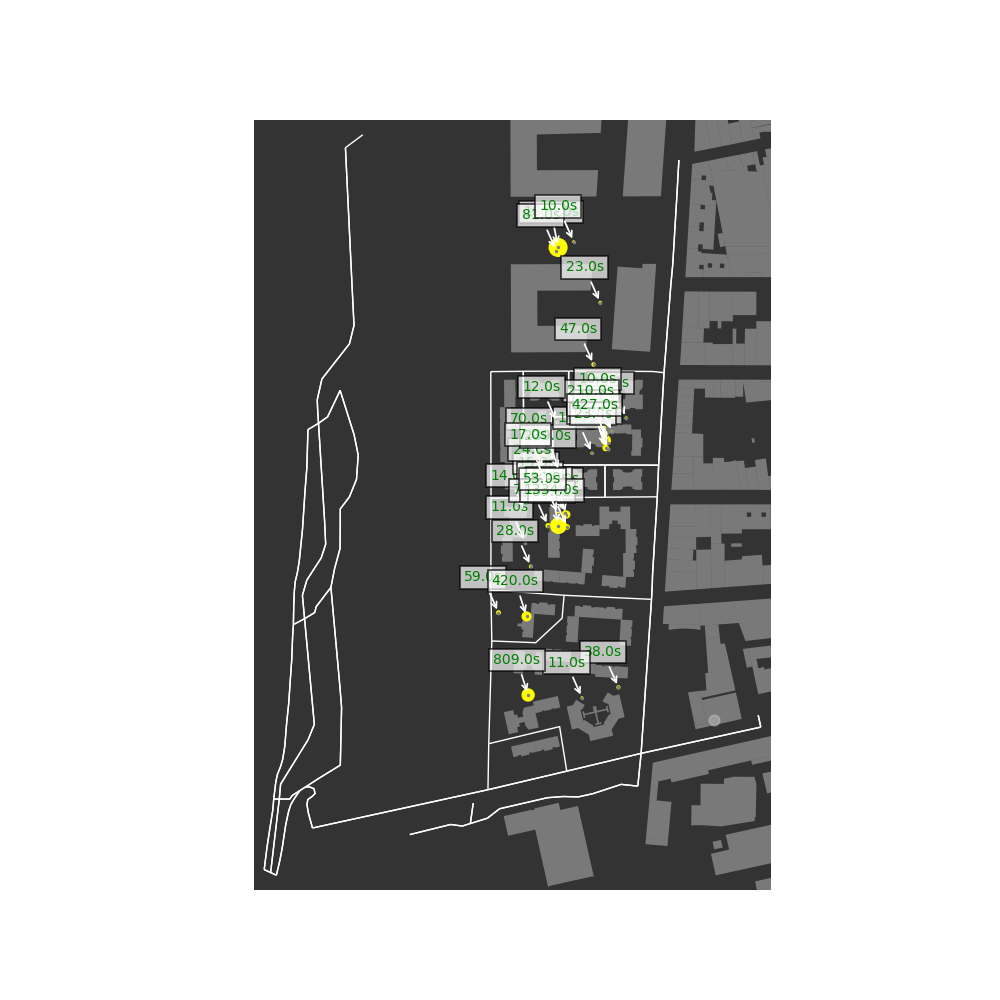

####################################################


UNITATS DACCIÓ

p01:

nombre aturades a la unitat dacció p01: 0
temps total aturada a la unitat daccio p01: 0 s
temps de cada aturada a la unitat daccio p01 [] s

-------------------------------------------------------------------------


c01:

nombre aturades a la unitat dacció c01: 7
temps total aturada a la unitat daccio c01: 631.0 s
temps de cada aturada a la unitat daccio c01 [15.0, 244.0, 80.0, 24.0, 239.0, 17.0, 12.0] s

-------------------------------------------------------------------------


c02:

nombre aturades a la unitat dacció c02: 5
temps total aturada a la unitat daccio c02: 683.0 s
temps de cada aturada a la unitat daccio c02 [35.0, 66.0, 132.0, 23.0, 427.0] s

-------------------------------------------------------------------------


p02:

nombre aturades a la unitat dacció p02: 3
temps total aturada a la unitat daccio p02: 896.0 s
temps de cada aturada a la unitat daccio p02 [809.0, 59.0, 28.0] s

------------

<IPython.core.display.Javascript object>


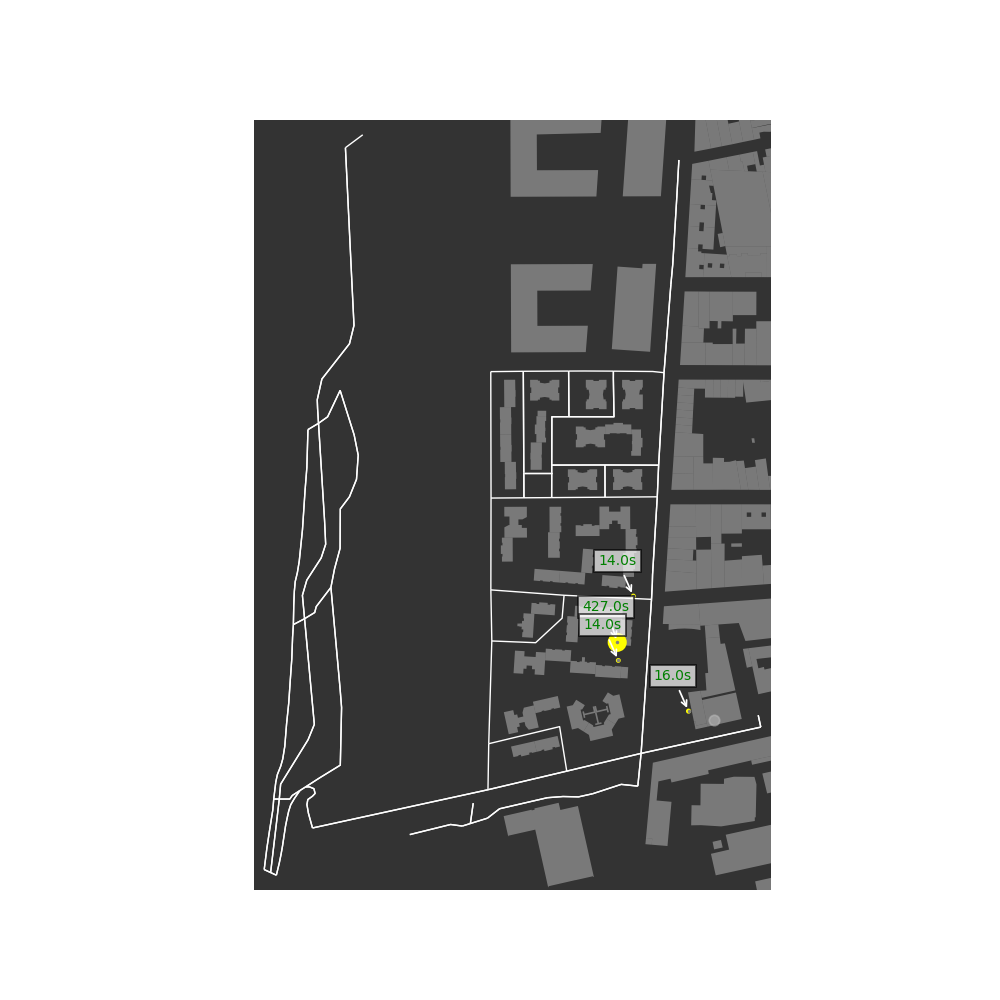

####################################################


UNITATS DACCIÓ

p01:

nombre aturades a la unitat dacció p01: 0
temps total aturada a la unitat daccio p01: 0 s
temps de cada aturada a la unitat daccio p01 [] s

-------------------------------------------------------------------------


c01:

nombre aturades a la unitat dacció c01: 0
temps total aturada a la unitat daccio c01: 0 s
temps de cada aturada a la unitat daccio c01 [] s

-------------------------------------------------------------------------


c02:

nombre aturades a la unitat dacció c02: 0
temps total aturada a la unitat daccio c02: 0 s
temps de cada aturada a la unitat daccio c02 [] s

-------------------------------------------------------------------------


p02:

nombre aturades a la unitat dacció p02: 0
temps total aturada a la unitat daccio p02: 0 s
temps de cada aturada a la unitat daccio p02 [] s

-------------------------------------------------------------------------


c04:

nombre aturades a la unitat dac

<IPython.core.display.Javascript object>


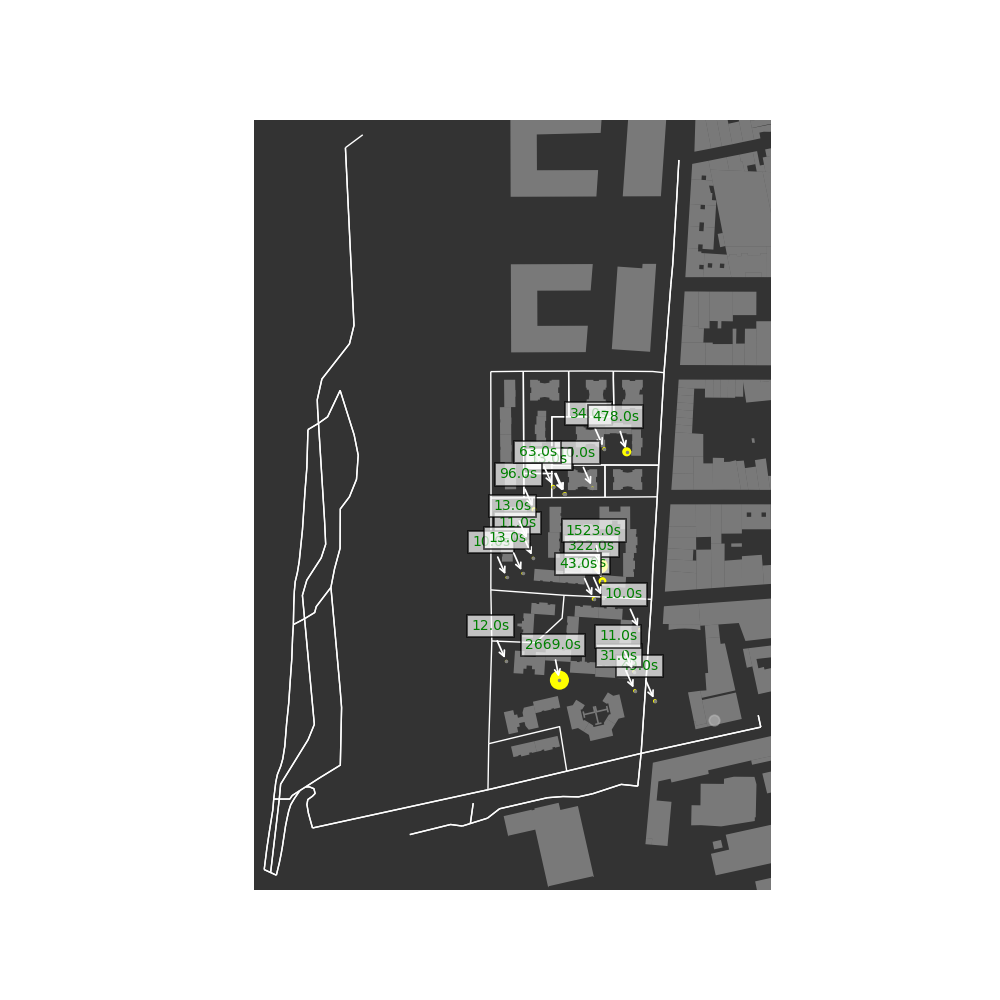

####################################################


UNITATS DACCIÓ

p01:

nombre aturades a la unitat dacció p01: 0
temps total aturada a la unitat daccio p01: 0 s
temps de cada aturada a la unitat daccio p01 [] s

-------------------------------------------------------------------------


c01:

nombre aturades a la unitat dacció c01: 4
temps total aturada a la unitat daccio c01: 207.0 s
temps de cada aturada a la unitat daccio c01 [35.0, 13.0, 96.0, 63.0] s

-------------------------------------------------------------------------


c02:

nombre aturades a la unitat dacció c02: 2
temps total aturada a la unitat daccio c02: 512.0 s
temps de cada aturada a la unitat daccio c02 [34.0, 478.0] s

-------------------------------------------------------------------------


p02:

nombre aturades a la unitat dacció p02: 3
temps total aturada a la unitat daccio p02: 35.0 s
temps de cada aturada a la unitat daccio p02 [12.0, 10.0, 13.0] s

-----------------------------------------------------

<IPython.core.display.Javascript object>


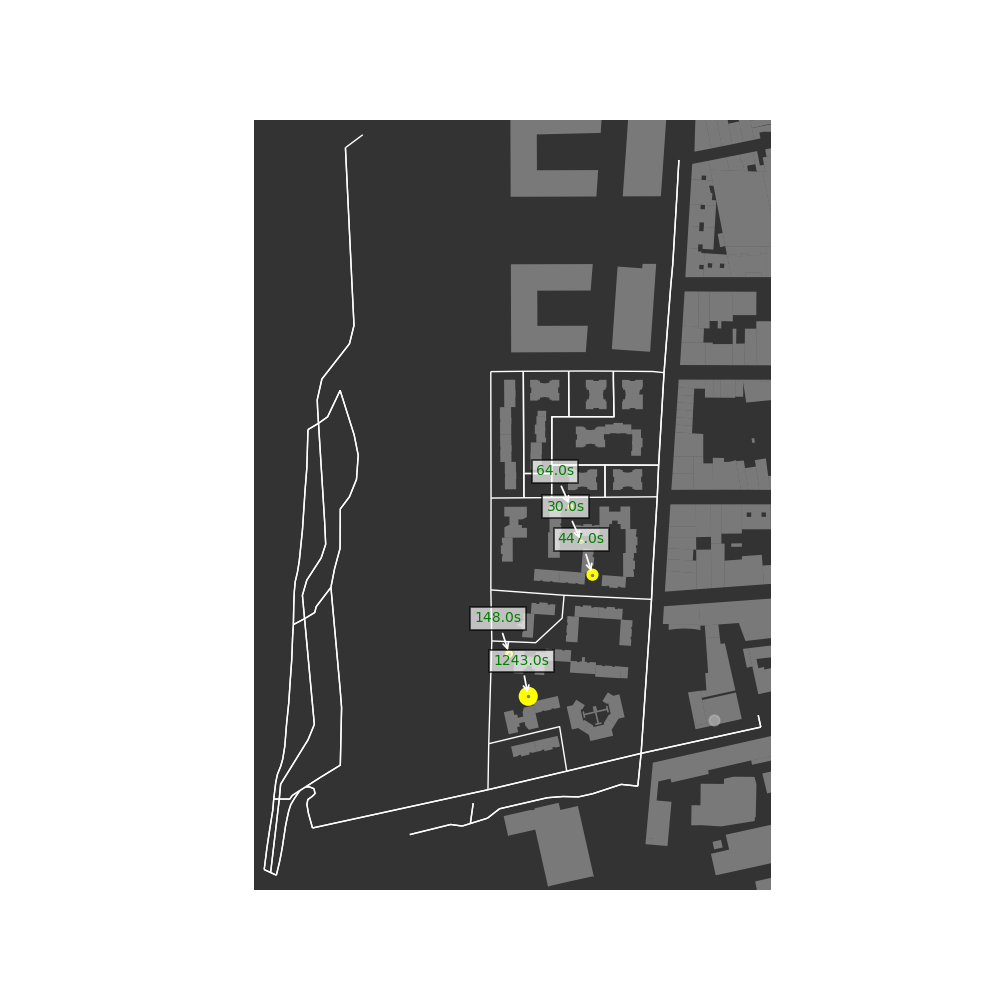

####################################################


UNITATS DACCIÓ

p01:

nombre aturades a la unitat dacció p01: 0
temps total aturada a la unitat daccio p01: 0 s
temps de cada aturada a la unitat daccio p01 [] s

-------------------------------------------------------------------------


c01:

nombre aturades a la unitat dacció c01: 1
temps total aturada a la unitat daccio c01: 64.0 s
temps de cada aturada a la unitat daccio c01 [64.0] s

-------------------------------------------------------------------------


c02:

nombre aturades a la unitat dacció c02: 0
temps total aturada a la unitat daccio c02: 0 s
temps de cada aturada a la unitat daccio c02 [] s

-------------------------------------------------------------------------


p02:

nombre aturades a la unitat dacció p02: 2
temps total aturada a la unitat daccio p02: 1391.0 s
temps de cada aturada a la unitat daccio p02 [1243.0, 148.0] s

-------------------------------------------------------------------------


c04:

nombre

<IPython.core.display.Javascript object>


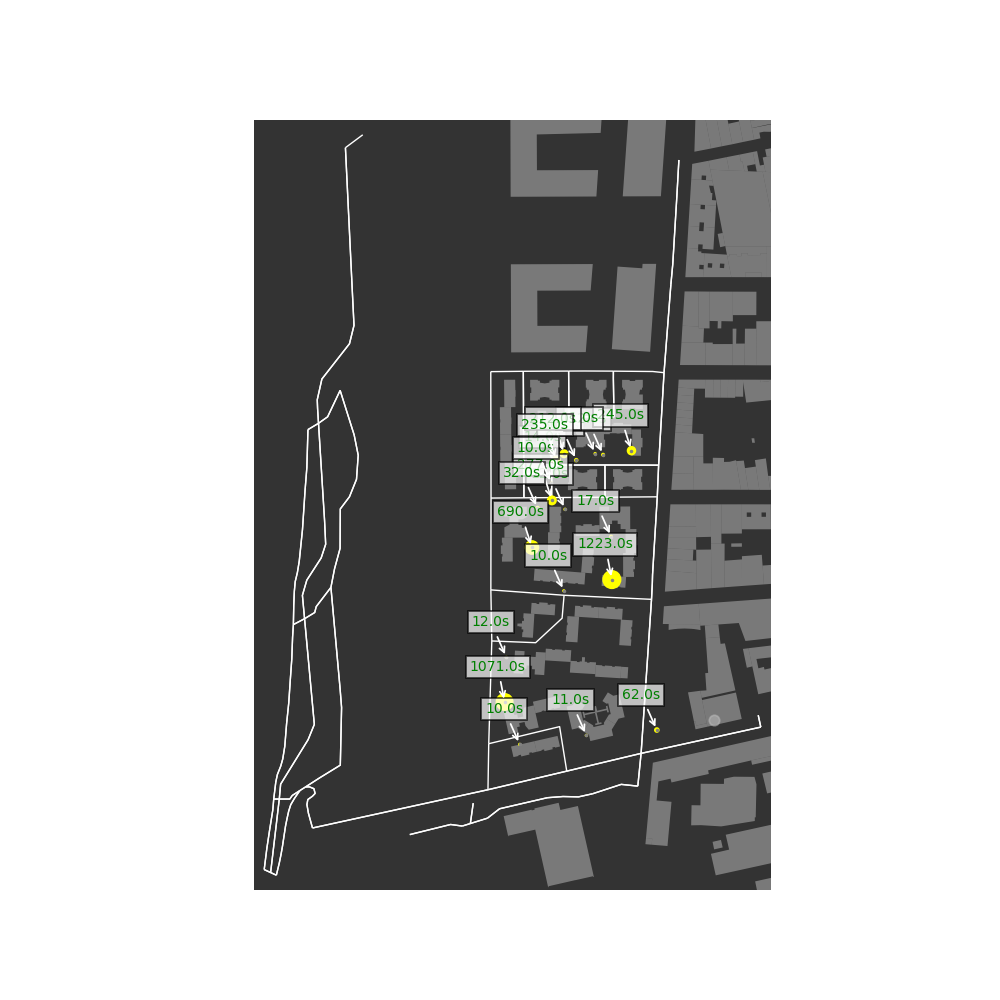

####################################################


UNITATS DACCIÓ

p01:

nombre aturades a la unitat dacció p01: 0
temps total aturada a la unitat daccio p01: 0 s
temps de cada aturada a la unitat daccio p01 [] s

-------------------------------------------------------------------------


c01:

nombre aturades a la unitat dacció c01: 7
temps total aturada a la unitat daccio c01: 792.0 s
temps de cada aturada a la unitat daccio c01 [12.0, 14.0, 212.0, 277.0, 32.0, 10.0, 235.0] s

-------------------------------------------------------------------------


c02:

nombre aturades a la unitat dacció c02: 2
temps total aturada a la unitat daccio c02: 267.0 s
temps de cada aturada a la unitat daccio c02 [22.0, 245.0] s

-------------------------------------------------------------------------


p02:

nombre aturades a la unitat dacció p02: 2
temps total aturada a la unitat daccio p02: 1083.0 s
temps de cada aturada a la unitat daccio p02 [1071.0, 12.0] s

----------------------------------

<IPython.core.display.Javascript object>


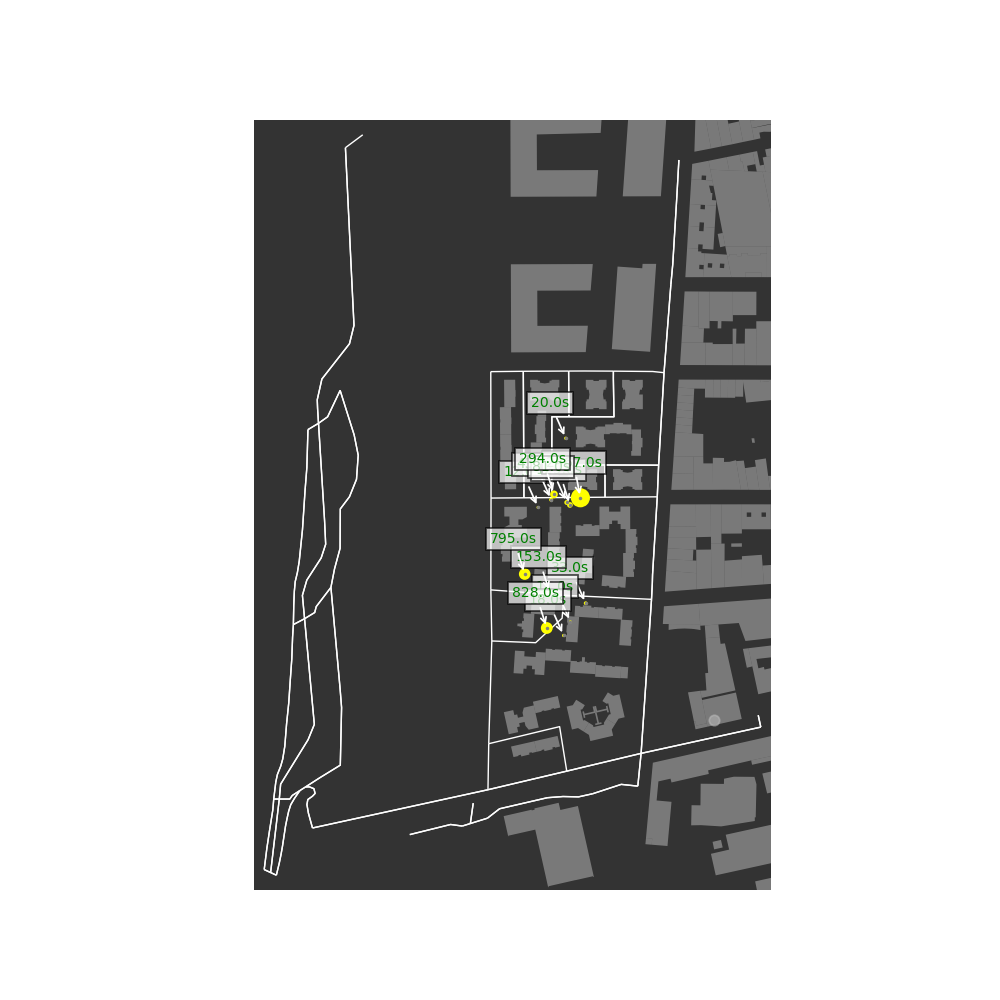

####################################################


UNITATS DACCIÓ

p01:

nombre aturades a la unitat dacció p01: 0
temps total aturada a la unitat daccio p01: 0 s
temps de cada aturada a la unitat daccio p01 [] s

-------------------------------------------------------------------------


c01:

nombre aturades a la unitat dacció c01: 6
temps total aturada a la unitat daccio c01: 579.0 s
temps de cada aturada a la unitat daccio c01 [12.0, 43.0, 129.0, 81.0, 294.0, 20.0] s

-------------------------------------------------------------------------


c02:

nombre aturades a la unitat dacció c02: 0
temps total aturada a la unitat daccio c02: 0 s
temps de cada aturada a la unitat daccio c02 [] s

-------------------------------------------------------------------------


p02:

nombre aturades a la unitat dacció p02: 1
temps total aturada a la unitat daccio p02: 795.0 s
temps de cada aturada a la unitat daccio p02 [795.0] s

----------------------------------------------------------------

<IPython.core.display.Javascript object>


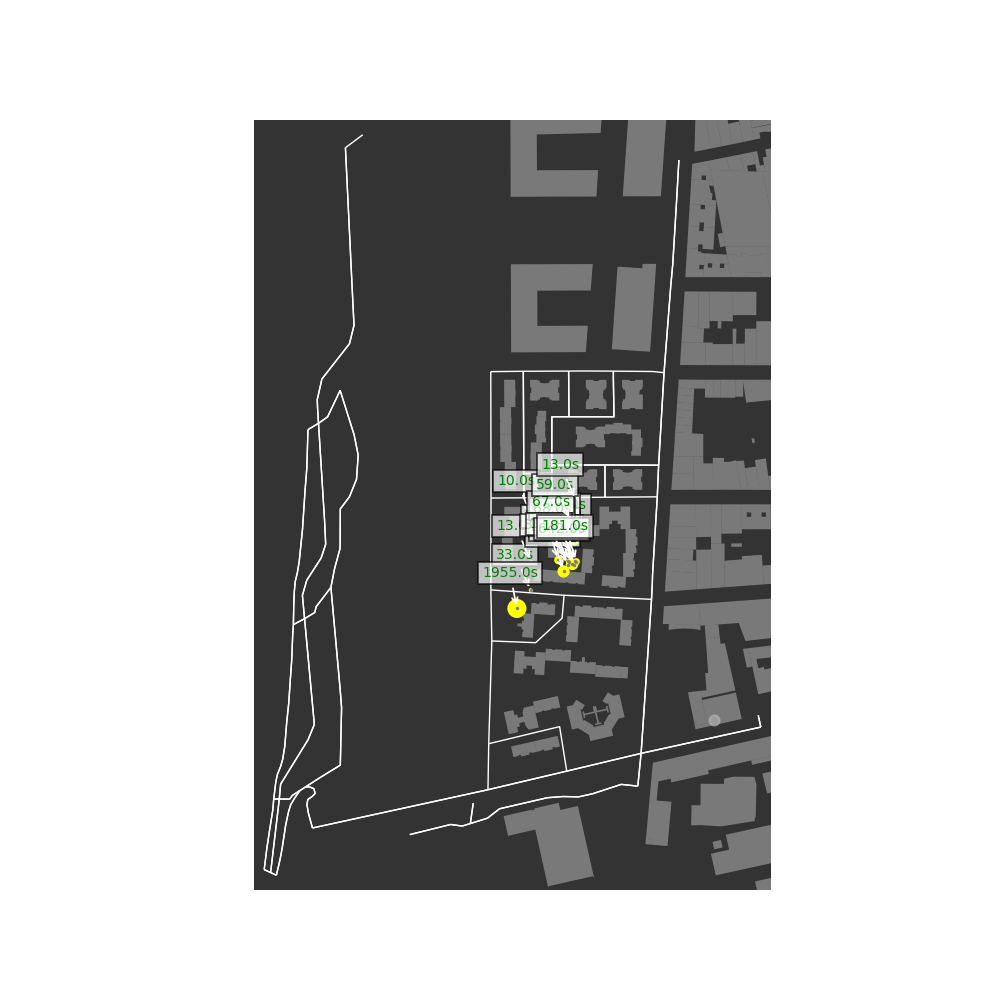

####################################################


UNITATS DACCIÓ

p01:

nombre aturades a la unitat dacció p01: 0
temps total aturada a la unitat daccio p01: 0 s
temps de cada aturada a la unitat daccio p01 [] s

-------------------------------------------------------------------------


c01:

nombre aturades a la unitat dacció c01: 1
temps total aturada a la unitat daccio c01: 59.0 s
temps de cada aturada a la unitat daccio c01 [59.0] s

-------------------------------------------------------------------------


c02:

nombre aturades a la unitat dacció c02: 0
temps total aturada a la unitat daccio c02: 0 s
temps de cada aturada a la unitat daccio c02 [] s

-------------------------------------------------------------------------


p02:

nombre aturades a la unitat dacció p02: 3
temps total aturada a la unitat daccio p02: 2001.0 s
temps de cada aturada a la unitat daccio p02 [33.0, 1955.0, 13.0] s

-------------------------------------------------------------------------


c04:

n

<IPython.core.display.Javascript object>


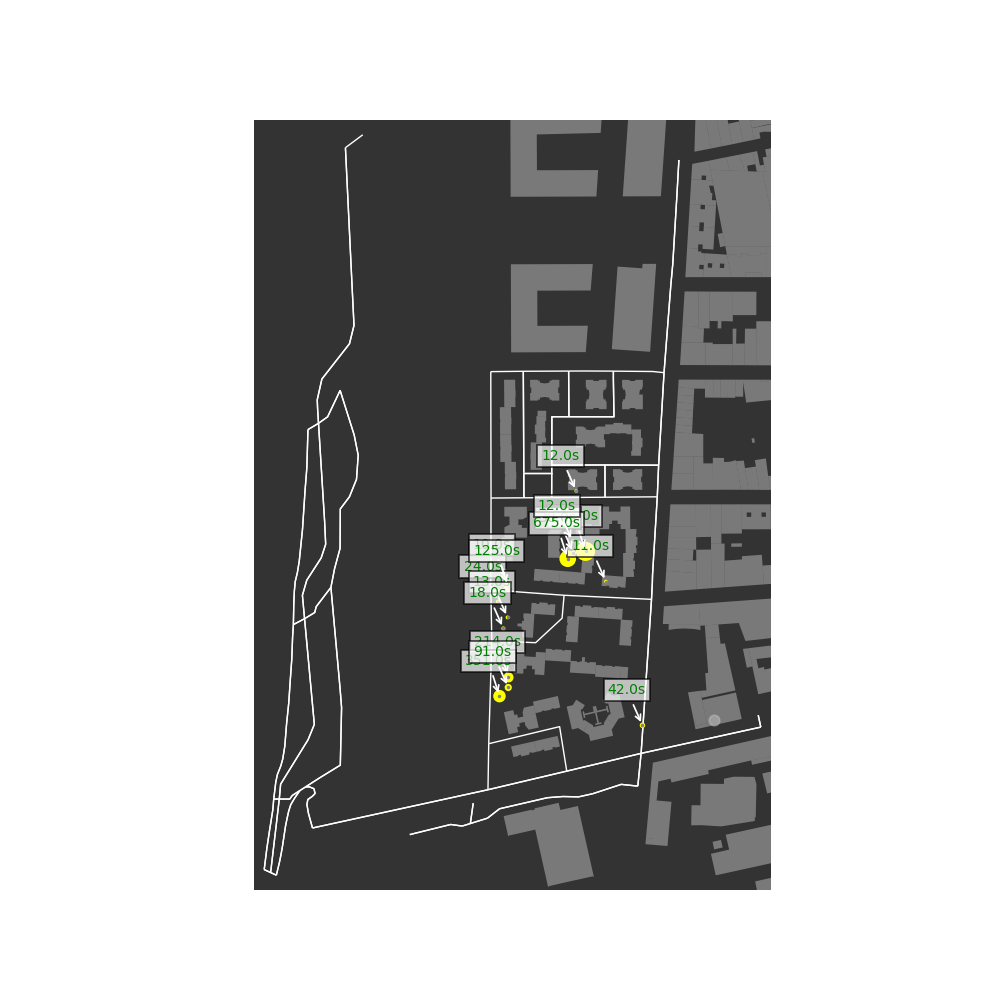

####################################################


UNITATS DACCIÓ

p01:

nombre aturades a la unitat dacció p01: 0
temps total aturada a la unitat daccio p01: 0 s
temps de cada aturada a la unitat daccio p01 [] s

-------------------------------------------------------------------------


c01:

nombre aturades a la unitat dacció c01: 0
temps total aturada a la unitat daccio c01: 0 s
temps de cada aturada a la unitat daccio c01 [] s

-------------------------------------------------------------------------


c02:

nombre aturades a la unitat dacció c02: 0
temps total aturada a la unitat daccio c02: 0 s
temps de cada aturada a la unitat daccio c02 [] s

-------------------------------------------------------------------------


p02:

nombre aturades a la unitat dacció p02: 8
temps total aturada a la unitat daccio p02: 846.0 s
temps de cada aturada a la unitat daccio p02 [10.0, 24.0, 13.0, 214.0, 351.0, 91.0, 18.0, 125.0] s

------------------------------------------------------------

<IPython.core.display.Javascript object>


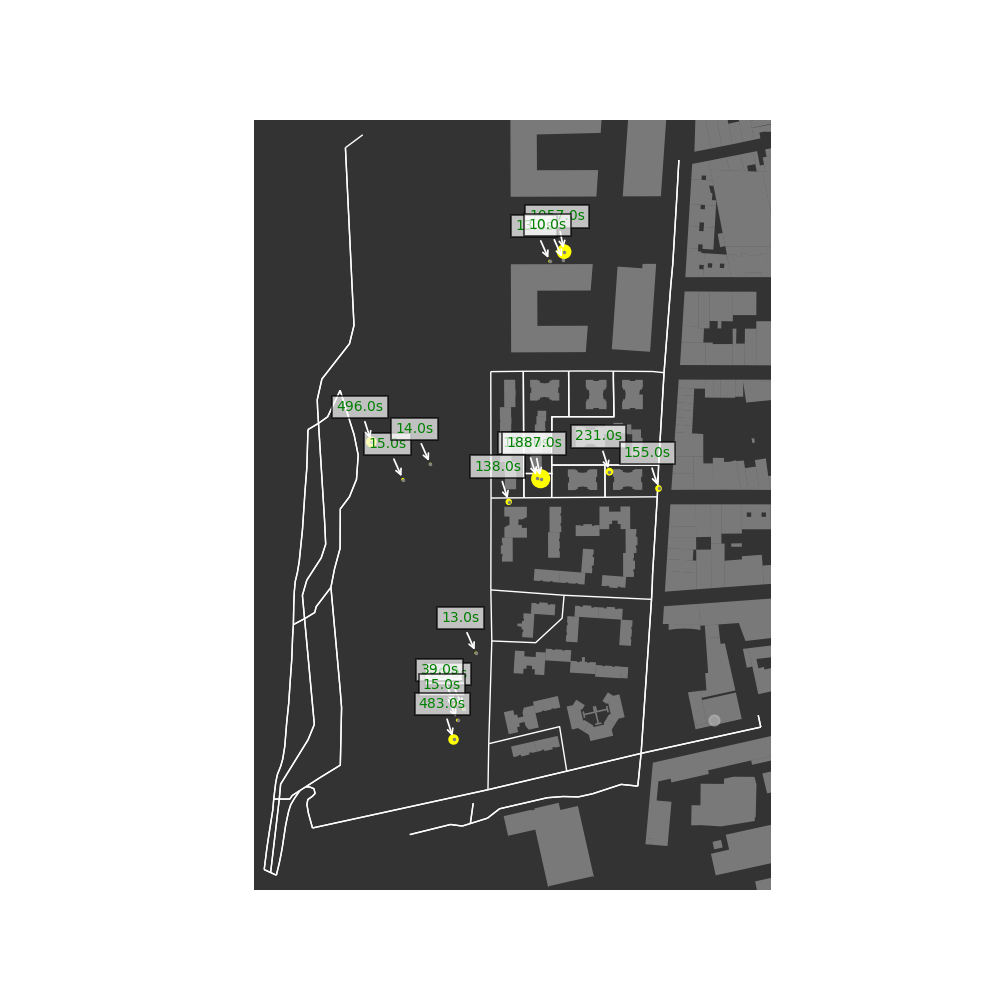

####################################################


UNITATS DACCIÓ

p01:

nombre aturades a la unitat dacció p01: 0
temps total aturada a la unitat daccio p01: 0 s
temps de cada aturada a la unitat daccio p01 [] s

-------------------------------------------------------------------------


c01:

nombre aturades a la unitat dacció c01: 2
temps total aturada a la unitat daccio c01: 2013.0 s
temps de cada aturada a la unitat daccio c01 [126.0, 1887.0] s

-------------------------------------------------------------------------


c02:

nombre aturades a la unitat dacció c02: 1
temps total aturada a la unitat daccio c02: 231.0 s
temps de cada aturada a la unitat daccio c02 [231.0] s

-------------------------------------------------------------------------


p02:

nombre aturades a la unitat dacció p02: 0
temps total aturada a la unitat daccio p02: 0 s
temps de cada aturada a la unitat daccio p02 [] s

-------------------------------------------------------------------------


c04:

nomb

<IPython.core.display.Javascript object>


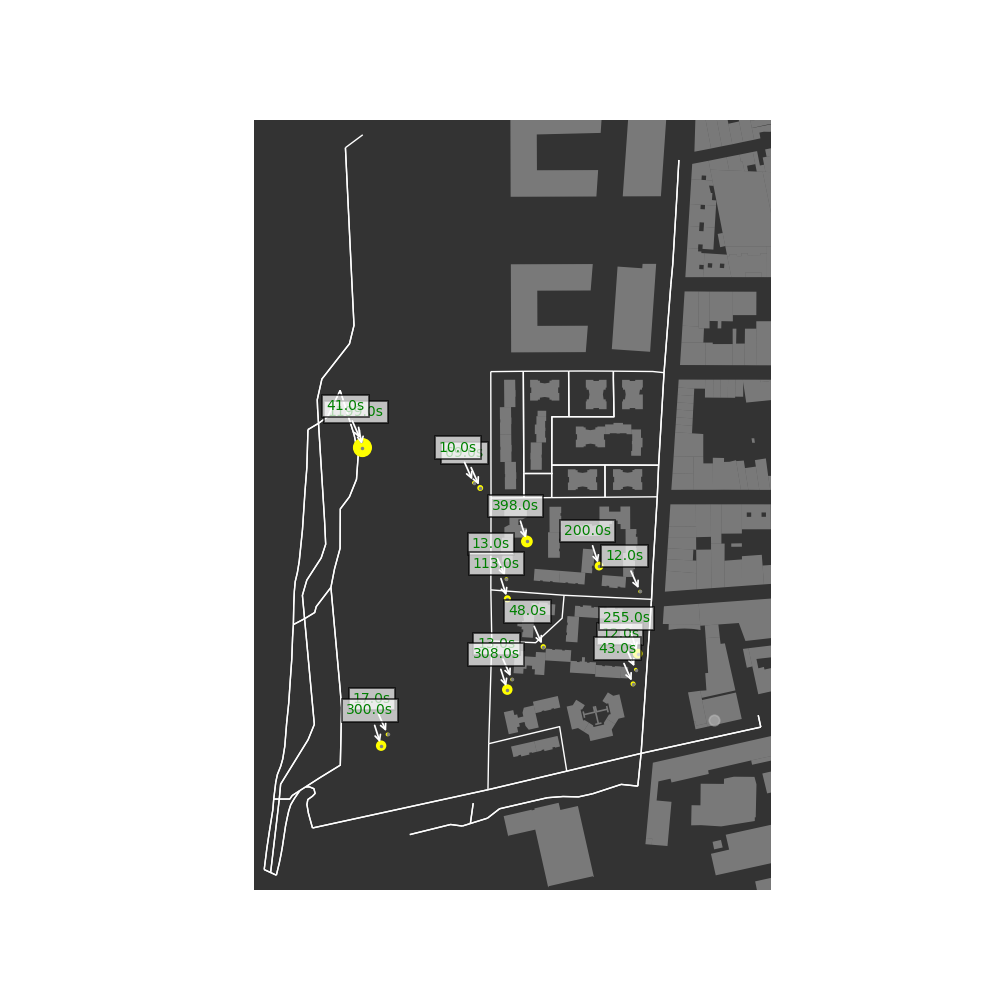

####################################################


UNITATS DACCIÓ

p01:

nombre aturades a la unitat dacció p01: 0
temps total aturada a la unitat daccio p01: 0 s
temps de cada aturada a la unitat daccio p01 [] s

-------------------------------------------------------------------------


c01:

nombre aturades a la unitat dacció c01: 0
temps total aturada a la unitat daccio c01: 0 s
temps de cada aturada a la unitat daccio c01 [] s

-------------------------------------------------------------------------


c02:

nombre aturades a la unitat dacció c02: 0
temps total aturada a la unitat daccio c02: 0 s
temps de cada aturada a la unitat daccio c02 [] s

-------------------------------------------------------------------------


p02:

nombre aturades a la unitat dacció p02: 4
temps total aturada a la unitat daccio p02: 447.0 s
temps de cada aturada a la unitat daccio p02 [13.0, 308.0, 13.0, 113.0] s

-------------------------------------------------------------------------


c04:

nom

<IPython.core.display.Javascript object>


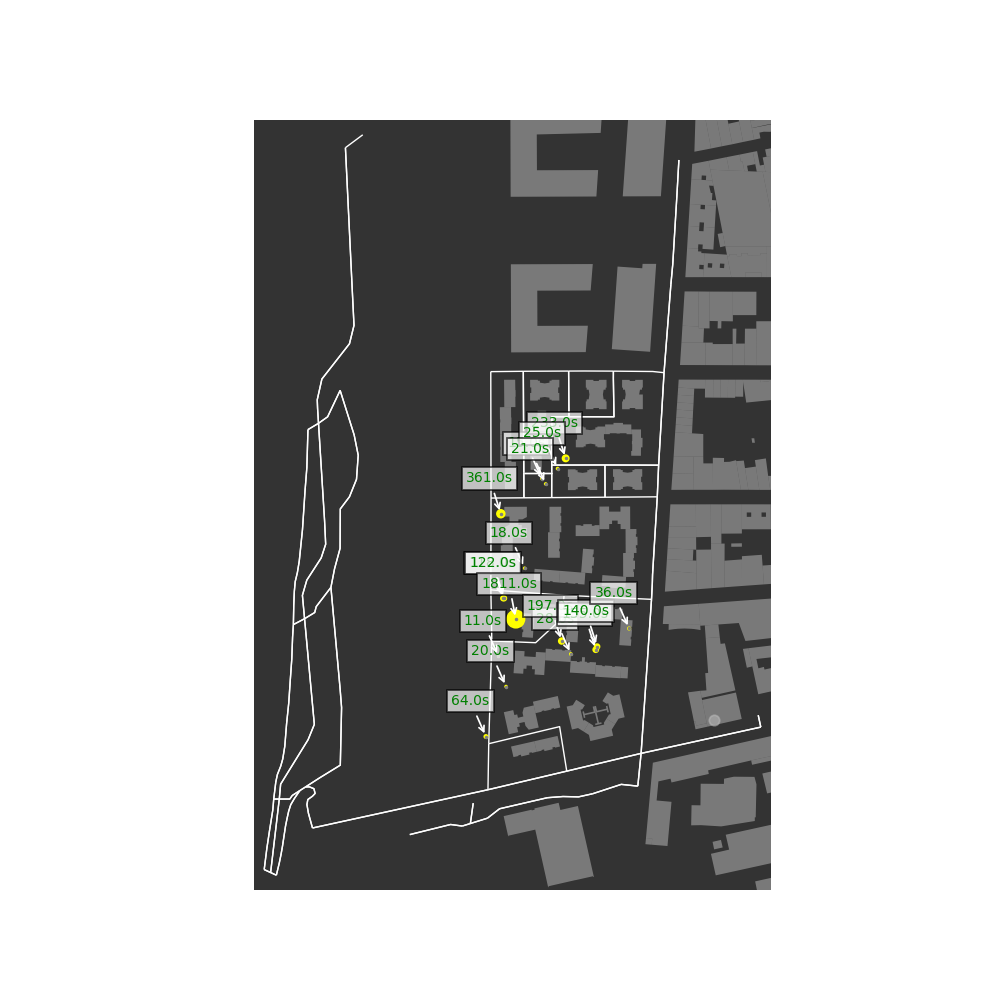

####################################################


UNITATS DACCIÓ

p01:

nombre aturades a la unitat dacció p01: 0
temps total aturada a la unitat daccio p01: 0 s
temps de cada aturada a la unitat daccio p01 [] s

-------------------------------------------------------------------------


c01:

nombre aturades a la unitat dacció c01: 4
temps total aturada a la unitat daccio c01: 294.0 s
temps de cada aturada a la unitat daccio c01 [15.0, 233.0, 25.0, 21.0] s

-------------------------------------------------------------------------


c02:

nombre aturades a la unitat dacció c02: 0
temps total aturada a la unitat daccio c02: 0 s
temps de cada aturada a la unitat daccio c02 [] s

-------------------------------------------------------------------------


p02:

nombre aturades a la unitat dacció p02: 6
temps total aturada a la unitat daccio p02: 2100.0 s
temps de cada aturada a la unitat daccio p02 [118.0, 18.0, 122.0, 1811.0, 20.0, 11.0] s

-------------------------------------------

In [7]:
from gpxcsv import gpxtolist
import pandas as pd
import networkx as nx
import osmnx as ox


import matplotlib.pyplot as plt
import numpy as np
import glob
import os
from math import sin, cos, sqrt, atan2, radians
from mpl_toolkits.axes_grid1.inset_locator import inset_axes
from folium import Map
from folium.plugins import HeatMap, HeatMapWithTime
import utm
from matplotlib.animation import FuncAnimation
import matplotlib.animation as animation
from scipy.stats import gaussian_kde
from shapely.geometry import Point, LineString, Polygon
import folium

#%matplotlib notebook
#%matplotlib inline
ox.config(use_cache=True, log_console=True)
ox.__version__




all_files = glob.glob(os.path.join("*.csv"))

nom_grup=[]
nombre_aturades=[]
temps_total_aturada=[]
temps_promig_aturada=[]

num_p01=[]
t_p01=[]
num_c01=[]
t_c01=[]
num_c02=[]
t_c02=[]
num_p02=[]
t_p02=[]
num_c04=[]
t_c04=[]
num_p04=[]
t_p04=[]
num_p03=[]
t_p03=[]

grupss=['e1','e2','e3','e4','e5','e6','e7','g1','g2','g3','g4','g5','g6','g7','g8','p1','p2','p4']
tt=0
for file in all_files:   # Loop over all gpx files in the folder/directory  
    
    print('GRUP:', file)
    print('')
    
    df = pd.read_csv(file) 
    
    lat=df['lat'].tolist()
    lon=df['lon'].tolist()

    t=df['At'].tolist()

    stops=df['stops']

    At_cs=[]

    lat_stop=[]
    lon_stop=[]

    i=0
    while i < len(stops):

        if stops[i]=='flight':
            i=i+1

        else:
            s=0
            stopss=[]
            while stops[i+s]=='stop':
                stopss.append(t[i+s])
                s=s+1

            At_c=sum(stopss)
            At_cs.append(At_c)

            lat_stop.append(lat[i])
            lon_stop.append(lon[i])


            i=i+s
    
    print('Nombre total daturades:', len(At_cs))
    print('Temps total daturada:', sum(At_cs),'s')
    mean_temps=sum(At_cs)/len(At_cs)
    print('Temps promig daturada:', sum(At_cs)/len(At_cs))
    print('')
    print('')
    
    nom_grup.append(str(file))
    nombre_aturades.append(len(At_cs))
    temps_total_aturada.append(sum(At_cs))
    temps_promig_aturada.append(mean_temps)
    
    
    from shapely.geometry import Point, LineString, Polygon
    fig, ax = map_network2(2.2793534239822613, 41.60640928402908, 2.283956227147247,41.60640126017562,  
                           2.2837951863375023,41.60189263168001,  2.2792784442191962, 41.60145135138418)  # Create the graph from a given latitude and longitude
    

    
    
    from turfpy.measurement import boolean_point_in_polygon
    from geojson import Point, Polygon, Feature
    
    max_At=max(At_cs)
    new_At_cs=[]
    for j in range(len(At_cs)):
        new_At_cs.append(At_cs[j]/max_At)

    new_At_cs2=[]
    for i in range(len(lon_stop)):
        new_At_cs2.append(100*new_At_cs[i])


    print('####################################################')
    print('')
    print('')
    print('UNITATS DACCIÓ')
    print('')

    p01=Polygon([[(2.281903, 41.6047224), (2.2819017, 41.6049109), (2.2817113, 41.6049139), (2.2817193, 41.6054674),
           (2.281439, 41.6054674), (2.2814618, 41.6047274), (2.2818038, 41.6047334), (2.2818038, 41.6047123), 
           (2.2819071, 41.6047143), (2.281903, 41.6047224),]])


    c01=Polygon([[(2.2821551, 41.6047224), (2.2821638, 41.6045846), (2.2820109, 41.6045866), (2.2820083, 41.6045224), 
           (2.2820163, 41.6043559), (2.2820109, 41.6041774), (2.2818741, 41.6041734), (2.2818715, 41.6038846),
           (2.2820324, 41.6038806), (2.2820297, 41.6039588), (2.2821451, 41.6039608), (2.2821451, 41.6038405), 
           (2.2824535, 41.6038445), (2.2824497, 41.603973), (2.2822096, 41.603971), (2.2822092, 41.6040323), 
           (2.2822058, 41.6041707), (2.2822615, 41.6041702), (2.2822604, 41.6044421), (2.2823274, 41.6044406), 
           (2.2823294, 41.604755), (2.2821551, 41.6047565), (2.2821551, 41.6047224),]])

    c02=Polygon([[(2.2824656, 41.6040279), (2.2824669, 41.6040134), (2.2825729, 41.6040139), (2.2825702, 41.6041703),
           (2.2827204, 41.6041703), (2.2827258, 41.6043889), (2.2825032, 41.6043909), (2.2825085, 41.6043027),
           (2.2824549, 41.6043047), (2.2824656, 41.6040279),]])

    p02=Polygon([[(2.2815208, 41.6036047), (2.2814974, 41.6036052), (2.2815235, 41.6026721), (2.2816362, 41.6026962), 
           (2.281722, 41.6027122), (2.2817408, 41.6026741), (2.2818159, 41.6026881), (2.2818051, 41.6027222), 
           (2.2818936, 41.6027343), (2.2818561, 41.6029088), (2.2817542, 41.6029088), (2.2817998, 41.6032999),
           (2.2818749, 41.6032979), (2.2819312, 41.6036027), (2.2815208, 41.6036047),]])

    c04=Polygon([[(2.2820103, 41.6029885), (2.2819996, 41.6027639), (2.2821069, 41.6027799), (2.2821176, 41.6027198), 
           (2.2821688, 41.6027284), (2.2822063, 41.6027625), (2.2822895, 41.6027274), (2.282321, 41.6027349), 
           (2.2823364, 41.6027384), (2.2823585, 41.6027439), (2.2823773, 41.6027475), (2.2824001, 41.6027525), 
           (2.2824222, 41.6027585), (2.2824812, 41.6028196), (2.282563, 41.6027966), (2.2825751, 41.6028989), 
           (2.2824263, 41.6029089), (2.2824102, 41.6029139), (2.2822157, 41.6029219), (2.2822197, 41.6029901),
           (2.2820065, 41.6029981), (2.2820103, 41.6029885),]])

    p04=Polygon([[(2.2828616, 41.6023738), (2.2828965, 41.6026847), (2.2825773, 41.6026446), (2.282513, 41.6025784), 
           (2.2825237, 41.6025403), (2.2823172, 41.6025002), (2.2823037, 41.6025322), (2.2822313, 41.6025844),
           (2.2821643, 41.6025764), (2.282116, 41.6025683), (2.2821509, 41.6024641), (2.2817485, 41.6023959), 
           (2.281719, 41.6024801), (2.2816037, 41.602458), (2.2816037, 41.6022174), (2.2818129, 41.6022575), 
           (2.2818451, 41.6021732), (2.2828616, 41.6023738),]])

    p03=Polygon([[(2.2826815, 41.603516), (2.2826762, 41.6032593), (2.2827566, 41.6032533), (2.2827432, 41.6030928), 
           (2.2826279, 41.6031009), (2.2826333, 41.6032533), (2.2823007, 41.6032633), (2.2822899, 41.6030006),
           (2.282644, 41.6029805), (2.2826413, 41.6029645), (2.28288, 41.6029565), (2.2829015, 41.6032312),
           (2.2829471, 41.6032332), (2.2829471, 41.6034037), (2.2829873, 41.6034077), (2.282982, 41.6035261),
           (2.2826815, 41.603516),]])


    x_p01=[2.281903,2.2819017,2.2817113,2.2817193,2.281439,2.2814618,2.2818038,2.2818038,2.2819071,2.281903]
    y_p01=[41.6047224,41.6049109, 41.6049139, 41.6054674, 41.6054674, 41.6047274, 41.6047334, 41.6047123, 41.6047143, 41.6047224]

    x_c01=[2.2821551,2.2821638,2.2820109,2.2820083,2.2820163,2.2820109,2.2818741,2.2818715,2.2820324,2.2820297,2.2821451,2.2821451,
           2.2824535,2.2824497,2.2822096,2.2822092,2.2822058,2.2822615,2.2822604,2.2823274,2.2823294,2.2821551,2.2821551]
    y_c01=[41.6047224,41.6045846,41.6045866,41.6045224,41.6043559, 41.6041774, 41.6041734, 41.6038846, 41.6038806, 41.6039588,
           41.6039608, 41.6038405, 41.6038445, 41.603973, 41.603971, 41.6040323, 41.6041707, 41.6041702, 41.6044421, 41.6044406, 
           41.604755, 41.6047565, 41.6047224]

    x_c02=[2.2824656,2.2824669,2.2825729,2.2825702,2.2827204,2.2827258,2.2825032,2.2825085,2.2824549,2.2824656]
    y_c02=[41.6040279, 41.6040134, 41.6040139, 41.6041703, 41.6041703, 41.6043889, 41.6043909, 41.6043027, 41.6043047, 41.6040279]

    x_p02=[2.2815208,2.2814974,2.2815235,2.2816362,2.281722,2.2817408,2.2818159,2.2818051,2.2818936,2.2818561,2.2817542,2.2817998,
           2.2818749,2.2819312, 2.2815208]
    y_p02=[41.6036047, 41.6036052, 41.6026721, 41.6026962, 41.6027122, 41.6026741, 41.6026881, 41.6027222, 41.6027343, 41.6029088, 
           41.6029088, 41.6032999, 41.6032979, 41.6036027, 41.6036047]

    x_c04=[2.2820103,2.2819996,2.2821069,2.2821176,2.2821688,2.2822063,2.2822895,2.282321,2.2823364,2.2823585,2.2823773,2.2824001,
           2.2824222,2.2824812,2.282563,2.2825751,2.2824263,2.2824102,2.2822157,2.2822197,2.2820065,2.2820103]
    y_c04=[41.6029885, 41.6027639, 41.6027799, 41.6027198, 41.6027284, 41.6027625, 41.6027274, 41.6027349, 41.6027384, 41.6027439, 
           41.6027475, 41.6027525, 41.6027585, 41.6028196, 41.6027966, 41.6028989, 41.6029089, 41.6029139, 41.6029219, 41.6029901, 
           41.6029981, 41.6029885]

    x_p04=[2.2828616,2.2828965,2.2825773,2.282513,2.2825237,2.2823172,2.2823037,2.2822313,2.2821643,2.282116,2.2821509,2.2817485,
           2.281719,2.2816037,2.2816037,2.2818129,2.2818451,2.2828616]
    y_p04=[41.6023738, 41.6026847, 41.6026446, 41.6025784, 41.6025403, 41.6025002, 41.6025322, 41.6025844, 41.6025764, 41.6025683, 
           41.6024641, 41.6023959, 41.6024801, 41.602458, 41.6022174, 41.6022575, 41.6021732, 41.6023738]

    x_p03=[2.2826815,2.2826762,2.2827566,2.2827432,2.2826279,2.2826333,2.2823007,2.2822899,2.282644,2.2826413,2.28288,2.2829015,
           2.2829471,2.2829471,2.2829873,2.282982,2.2826815]
    y_p03=[41.603516, 41.6032593, 41.6032533, 41.6030928, 41.6031009, 41.6032533, 41.6032633, 41.6030006, 41.6029805, 41.6029645, 
           41.6029565, 41.6032312, 41.6032332, 41.6034037, 41.6034077, 41.6035261, 41.603516]

    #plt.fill(x_p01,y_p01,alpha=0.3,c='dodgerblue')
    #plt.fill(x_c01,y_c01,alpha=0.3,c='dodgerblue')
    #plt.fill(x_c02,y_c02,alpha=0.3,c='dodgerblue')
    #plt.fill(x_p02,y_p02,alpha=0.3,c='dodgerblue')
    #plt.fill(x_c04,y_c04,alpha=0.3,c='dodgerblue')
    #plt.fill(x_p04,y_p04,alpha=0.3,c='dodgerblue')
    #plt.fill(x_p03,y_p03,alpha=0.3,c='dodgerblue') 


    At_cs_inside_p01=[]
    lon_stop_inside_p01=[]
    lat_stop_inside_p01=[]
    At_cs_inside_c01=[]
    lon_stop_inside_c01=[]
    lat_stop_inside_c01=[]
    At_cs_inside_c02=[]
    lon_stop_inside_c02=[]
    lat_stop_inside_c02=[]
    At_cs_inside_p02=[]
    lon_stop_inside_p02=[]
    lat_stop_inside_p02=[]
    At_cs_inside_c04=[]
    lon_stop_inside_c04=[]
    lat_stop_inside_c04=[]
    At_cs_inside_p04=[]
    lon_stop_inside_p04=[]
    lat_stop_inside_p04=[]
    At_cs_inside_p03=[]
    lon_stop_inside_p03=[]
    lat_stop_inside_p03=[]

    for i in range(len(lon_stop)):

        point_p01 = Feature(geometry=Point((lon_stop[i],lat_stop[i])))
        point_c01 = Feature(geometry=Point((lon_stop[i],lat_stop[i])))
        point_c02 = Feature(geometry=Point((lon_stop[i],lat_stop[i])))
        point_p02 = Feature(geometry=Point((lon_stop[i],lat_stop[i])))
        point_c04 = Feature(geometry=Point((lon_stop[i],lat_stop[i])))
        point_p04 = Feature(geometry=Point((lon_stop[i],lat_stop[i])))
        point_p03 = Feature(geometry=Point((lon_stop[i],lat_stop[i])))

        check_p01=boolean_point_in_polygon(point_p01, p01)
        check_c01=boolean_point_in_polygon(point_c01, c01)
        check_c02=boolean_point_in_polygon(point_c02, c02)
        check_p02=boolean_point_in_polygon(point_p02, p02)
        check_c04=boolean_point_in_polygon(point_c04, c04)
        check_p04=boolean_point_in_polygon(point_p04, p04)
        check_p03=boolean_point_in_polygon(point_p03, p03)

        if check_p01==True:
            lon_stop_inside_p01.append(lon_stop[i])
            lat_stop_inside_p01.append(lat_stop[i])
            At_cs_inside_p01.append(At_cs[i])

        if check_c01==True:
            lon_stop_inside_c01.append(lon_stop[i])
            lat_stop_inside_c01.append(lat_stop[i])
            At_cs_inside_c01.append(At_cs[i])

        if check_c02==True:
            lon_stop_inside_c02.append(lon_stop[i])
            lat_stop_inside_c02.append(lat_stop[i])
            At_cs_inside_c02.append(At_cs[i])

        if check_p02==True:
            lon_stop_inside_p02.append(lon_stop[i])
            lat_stop_inside_p02.append(lat_stop[i])
            At_cs_inside_p02.append(At_cs[i])

        if check_c04==True:
            lon_stop_inside_c04.append(lon_stop[i])
            lat_stop_inside_c04.append(lat_stop[i])
            At_cs_inside_c04.append(At_cs[i])

        if check_p04==True:
            lon_stop_inside_p04.append(lon_stop[i])
            lat_stop_inside_p04.append(lat_stop[i])
            At_cs_inside_p04.append(At_cs[i])

        if check_p03==True:
            lon_stop_inside_p03.append(lon_stop[i])
            lat_stop_inside_p03.append(lat_stop[i])
            At_cs_inside_p03.append(At_cs[i])


    print('p01:')
    print('')
    print('nombre aturades a la unitat dacció p01:', len(At_cs_inside_p01))
    print('temps total aturada a la unitat daccio p01:', sum(At_cs_inside_p01),'s' )
    print('temps de cada aturada a la unitat daccio p01', At_cs_inside_p01,'s')
    print('')
    print('-------------------------------------------------------------------------')
    print('')
    print('')
        
    num_p01.append(len(At_cs_inside_p01))
    t_p01.append(sum(At_cs_inside_p01))

    print('c01:')
    print('')
    print('nombre aturades a la unitat dacció c01:', len(At_cs_inside_c01))
    print('temps total aturada a la unitat daccio c01:', sum(At_cs_inside_c01),'s' )
    print('temps de cada aturada a la unitat daccio c01', At_cs_inside_c01,'s')
    print('')
    print('-------------------------------------------------------------------------')
    print('')
    print('')

    num_c01.append(len(At_cs_inside_c01))
    t_c01.append(sum(At_cs_inside_c01))

    print('c02:')
    print('')
    print('nombre aturades a la unitat dacció c02:', len(At_cs_inside_c02))
    print('temps total aturada a la unitat daccio c02:', sum(At_cs_inside_c02),'s' )
    print('temps de cada aturada a la unitat daccio c02', At_cs_inside_c02,'s')
    print('')
    print('-------------------------------------------------------------------------')
    print('')
    print('')

    num_c02.append(len(At_cs_inside_c02))
    t_c02.append(sum(At_cs_inside_c02))
        
    print('p02:')
    print('')
    print('nombre aturades a la unitat dacció p02:', len(At_cs_inside_p02))
    print('temps total aturada a la unitat daccio p02:', sum(At_cs_inside_p02),'s' )
    print('temps de cada aturada a la unitat daccio p02', At_cs_inside_p02,'s')
    print('')
    print('-------------------------------------------------------------------------')
    print('')
    print('')

    num_p02.append(len(At_cs_inside_p02))
    t_p02.append(sum(At_cs_inside_p02))

    print('c04:')
    print('')
    print('nombre aturades a la unitat dacció c04:', len(At_cs_inside_c04))
    print('temps total aturada a la unitat daccio c04:', sum(At_cs_inside_c04),'s' )
    print('temps de cada aturada a la unitat daccio c04', At_cs_inside_c04,'s')
    print('')
    print('-------------------------------------------------------------------------')
    print('')
    print('')

    num_c04.append(len(At_cs_inside_c04))
    t_c04.append(sum(At_cs_inside_c04))

    print('p04:')
    print('')
    print('nombre aturades a la unitat dacció p04:', len(At_cs_inside_p04))
    print('temps total aturada a la unitat daccio p04:', sum(At_cs_inside_p04),'s' )
    print('temps de cada aturada a la unitat daccio p04', At_cs_inside_p04,'s')
    print('')
    print('-------------------------------------------------------------------------')
    print('')
    print('')

    num_p04.append(len(At_cs_inside_p04))
    t_p04.append(sum(At_cs_inside_p04))

    print('p03:')
    print('')
    print('nombre aturades a la unitat dacció p03:', len(At_cs_inside_p03))
    print('temps total aturada a la unitat daccio p03:', sum(At_cs_inside_p03),'s' )
    print('temps de cada aturada a la unitat daccio p03', At_cs_inside_p03,'s')
    print('')
    print('-------------------------------------------------------------------------')
    print('')
    print('')

    num_p03.append(len(At_cs_inside_p03))
    t_p03.append(sum(At_cs_inside_p03))


    sc=plt.scatter(lon_stop,lat_stop,c='yellow',s=new_At_cs2)
    sc=plt.scatter(lon_stop,lat_stop,c='grey',s=1)
    
    bbox_args = dict(boxstyle='square',facecolor='white', edgecolor='k',alpha=0.7)
    arrowprops=dict(arrowstyle = '->', connectionstyle='arc3,rad=0',color='white')
    for iii in range(len(lon_stop)):
        plt.annotate(str(At_cs[iii])+ 's', (lon_stop[iii], lat_stop[iii]),c='green',size=8,
                     bbox=bbox_args,arrowprops=arrowprops, xytext=(-20, 18),textcoords='offset points')
    
    
    
    
    At_cs_names=[]
    for i in range(len(At_cs)):
        At_cs_names.append(str(At_cs[i])+'s')

    names=np.array(At_cs_names)


    #annot = ax.annotate("", xy=(0,0), xytext=(20,20),textcoords="offset points",
                #bbox=dict(boxstyle="round", fc="w"),
                #arrowprops=dict(arrowstyle="->", color='white'),fontsize='large')
    #annot.set_visible(False)

    def update_annot(ind):

        pos = sc.get_offsets()[ind["ind"][0]]
        annot.xy = pos
#text = "{}, {}".format(" ".join(list(map(str,ind["ind"]))), 
                       #" ".join([names[n] for n in ind["ind"]]))

        text = "{}".format(" ".join([names[n] for n in ind["ind"]]))
        annot.set_text(text)
        #annot.get_bbox_patch().set_facecolor(cmap(norm(c[ind["ind"][0]])))
        annot.get_bbox_patch().set_facecolor('limegreen')
        annot.get_bbox_patch().set_alpha(0.7)


    def hover(event):
        vis = annot.get_visible()
        if event.inaxes == ax:
            cont, ind = sc.contains(event)
            if cont:
                update_annot(ind)
                annot.set_visible(True)
                fig.canvas.draw_idle()
            else:
                if vis:
                    annot.set_visible(False)
                    fig.canvas.draw_idle()

    #fig.canvas.mpl_connect("motion_notify_event", hover)
    

    #plt.savefig(grupss[tt]+'_stops_duration'+'.eps')
    plt.show()
    tt=tt+1



    

In [8]:
df_temps_grups=pd.DataFrame()

df_temps_grups['grup']=nom_grup
df_temps_grups['num aturades']=nombre_aturades
df_temps_grups['temps total aturada']=temps_total_aturada
df_temps_grups['temps promig aturada']=temps_promig_aturada
df_temps_grups['num p01']=num_p01
df_temps_grups['temps total p01']=t_p01
df_temps_grups['num c01']=num_c01
df_temps_grups['temps total c01']=t_c01
df_temps_grups['num c02']=num_c02
df_temps_grups['temps total c02']=t_c02
df_temps_grups['num p02']=num_p02
df_temps_grups['temps total p02']=t_p02
df_temps_grups['num c04']=num_c04
df_temps_grups['temps total c04']=t_c04
df_temps_grups['num p04']=num_p04
df_temps_grups['temps total p04']=t_c04
df_temps_grups['num p03']=num_p03
df_temps_grups['temps total p03']=t_p03


df_temps_grups

C:\Users\josep\anaconda3\envs\ox\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,grup,num aturades,temps total aturada,temps promig aturada,num p01,temps total p01,num c01,temps total c01,num c02,temps total c02,num p02,temps total p02,num c04,temps total c04,num p04,temps total p04,num p03,temps total p03
0,e1.csv,18,2208.0,122.666667,0,0,4,1021.0,0,0.0,6,737.0,0,0.0,0,0.0,1,14.0
1,e2.csv,17,3647.0,214.529412,0,0,1,180.0,0,0.0,4,353.0,0,0.0,0,0.0,1,31.0
2,e3.csv,16,3599.0,224.937500,0,0,6,2412.0,0,0.0,4,272.0,1,39.0,0,39.0,1,11.0
3,e4.csv,20,3295.0,164.750000,0,0,6,1132.0,0,0.0,2,26.0,0,0.0,0,0.0,2,27.0
4,e5.csv,29,3249.0,112.034483,0,0,6,803.0,2,817.0,8,886.0,0,0.0,0,0.0,4,145.0
5,e6.csv,21,3003.0,143.000000,0,0,2,23.0,1,681.0,3,510.0,2,222.0,0,222.0,5,513.0
6,e7.csv,32,3178.0,99.312500,0,0,2,69.0,0,0.0,10,1045.0,3,503.0,0,503.0,1,10.0
7,g1.csv,36,6571.0,182.527778,0,0,7,631.0,5,683.0,3,896.0,1,11.0,0,11.0,0,0.0
8,g2.csv,4,471.0,117.750000,0,0,0,0.0,0,0.0,0,0.0,0,0.0,0,0.0,3,455.0
9,g3.csv,21,5458.0,259.904762,0,0,4,207.0,2,512.0,3,35.0,1,2669.0,0,2669.0,1,10.0


In [9]:
df_temps_grups.style.background_gradient(axis=0) 

C:\Users\josep\anaconda3\envs\ox\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,grup,num aturades,temps total aturada,temps promig aturada,num p01,temps total p01,num c01,temps total c01,num c02,temps total c02,num p02,temps total p02,num c04,temps total c04,num p04,temps total p04,num p03,temps total p03
0,e1.csv,18,2208.000000,122.666667,0,0,4,1021.000000,0,0.000000,6,737.000000,0,0.000000,0,0.000000,1,14.000000
1,e2.csv,17,3647.000000,214.529412,0,0,1,180.000000,0,0.000000,4,353.000000,0,0.000000,0,0.000000,1,31.000000
2,e3.csv,16,3599.000000,224.937500,0,0,6,2412.000000,0,0.000000,4,272.000000,1,39.000000,0,39.000000,1,11.000000
3,e4.csv,20,3295.000000,164.750000,0,0,6,1132.000000,0,0.000000,2,26.000000,0,0.000000,0,0.000000,2,27.000000
4,e5.csv,29,3249.000000,112.034483,0,0,6,803.000000,2,817.000000,8,886.000000,0,0.000000,0,0.000000,4,145.000000
5,e6.csv,21,3003.000000,143.000000,0,0,2,23.000000,1,681.000000,3,510.000000,2,222.000000,0,222.000000,5,513.000000
6,e7.csv,32,3178.000000,99.312500,0,0,2,69.000000,0,0.000000,10,1045.000000,3,503.000000,0,503.000000,1,10.000000
7,g1.csv,36,6571.000000,182.527778,0,0,7,631.000000,5,683.000000,3,896.000000,1,11.000000,0,11.000000,0,0.000000
8,g2.csv,4,471.000000,117.750000,0,0,0,0.000000,0,0.000000,0,0.000000,0,0.000000,0,0.000000,3,455.000000
9,g3.csv,21,5458.000000,259.904762,0,0,4,207.000000,2,512.000000,3,35.000000,1,2669.000000,0,2669.000000,1,10.000000


# 3. Missions of each group.
We use the locations of the misions in this link (from the videos they recorded):

https://www.google.com/maps/d/u/0/edit?mid=1lroCj5JDv9YVo4a3eolDFiLmePjYL6Dd&ll=41.60312274114557%2C2.284456534082313&z=17

Then we overlap the locations with the map of the experimental data (stops) in order to assign a duration time to each mission. 

## 3.1- GRUP E1

GRUP E1
Nombre total daturades: 18
Temps total daturada: 2208.0 s
Temps promig daturada: 122.66666666666667
[27.0, 521.0, 836.0, 105.0, 44.0, 36.0, 20.0, 21.0, 48.0, 29.0, 151.0, 73.0, 56.0, 44.0, 16.0, 11.0, 14.0, 156.0]




<IPython.core.display.Javascript object>


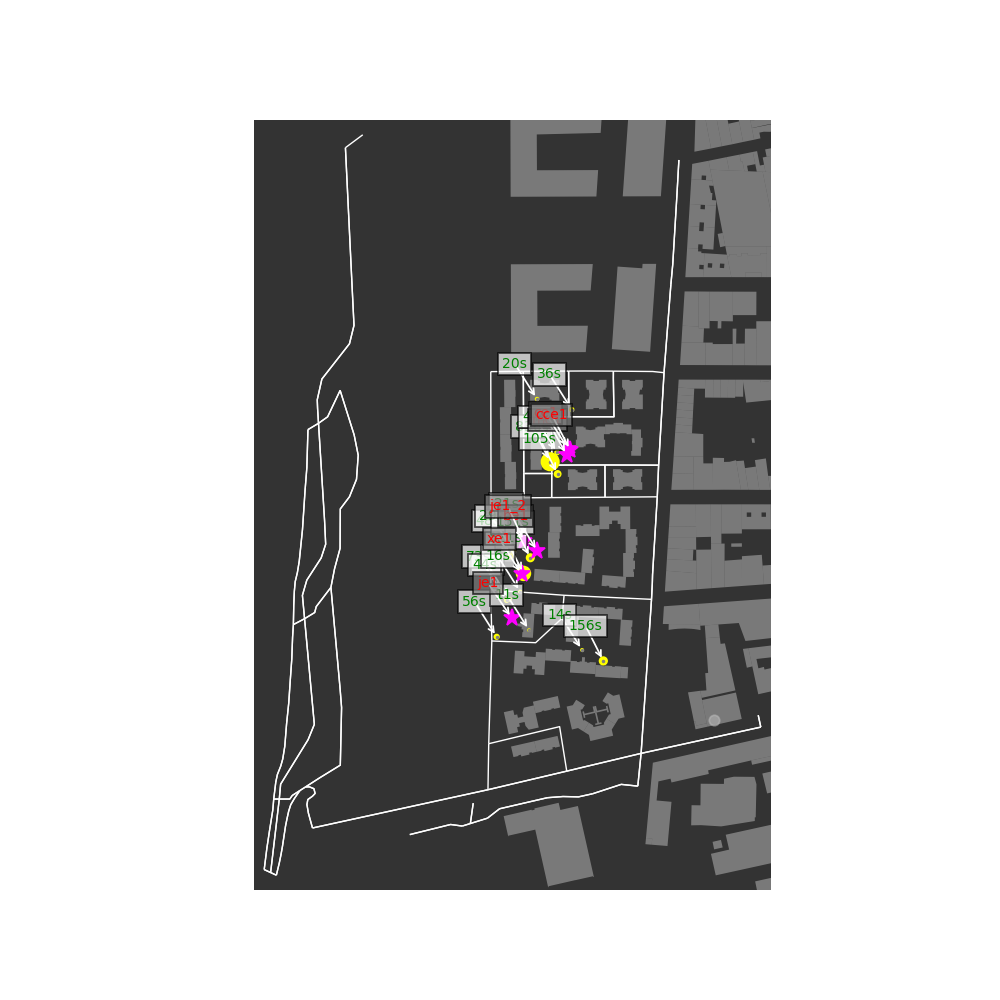

In [4]:
from gpxcsv import gpxtolist
import pandas as pd
import networkx as nx
import osmnx as ox


import matplotlib.pyplot as plt
import numpy as np
import glob
import os
from math import sin, cos, sqrt, atan2, radians
from mpl_toolkits.axes_grid1.inset_locator import inset_axes
from folium import Map
from folium.plugins import HeatMap, HeatMapWithTime
import utm
from matplotlib.animation import FuncAnimation
import matplotlib.animation as animation
from scipy.stats import gaussian_kde
from shapely.geometry import Point, LineString, Polygon
import folium

%matplotlib notebook
#%matplotlib inline
ox.config(use_cache=True, log_console=True)
ox.__version__

print('GRUP E1')
df = pd.read_csv('e1.csv') 

lat=df['lat'].tolist()
lon=df['lon'].tolist()

t=df['At'].tolist()

stops=df['stops']

At_cs=[]

lat_stop=[]
lon_stop=[]

i=0
while i < len(stops):

    if stops[i]=='flight':
        i=i+1

    else:
        s=0
        stopss=[]
        while stops[i+s]=='stop':
            stopss.append(t[i+s])
            s=s+1

        At_c=sum(stopss)
        At_cs.append(At_c)

        lat_stop.append(lat[i])
        lon_stop.append(lon[i])


        i=i+s

print('Nombre total daturades:', len(At_cs))
print('Temps total daturada:', sum(At_cs),'s')
mean_temps=sum(At_cs)/len(At_cs)
print('Temps promig daturada:', sum(At_cs)/len(At_cs))
print(At_cs)
print('')
print('')



from shapely.geometry import Point, LineString, Polygon
fig, ax = map_network2(2.2793534239822613, 41.60640928402908, 2.283956227147247,41.60640126017562,  
                       2.2837951863375023,41.60189263168001,  2.2792784442191962, 41.60145135138418)  # Create the graph from a given latitude and longitude




from turfpy.measurement import boolean_point_in_polygon
from geojson import Point, Polygon, Feature

max_At=max(At_cs)
new_At_cs=[]
for j in range(len(At_cs)):
    new_At_cs.append(At_cs[j]/max_At)

new_At_cs2=[]
for i in range(len(lon_stop)):
    new_At_cs2.append(100*new_At_cs[i])


je1=[41.60325, 2.28174]
xe1=[41.60352, 2.28182]
be1=[41.60366, 2.28195]
je1_2=[41.60372, 2.28184]
me1=[41.60425, 2.28219]
ce1=[41.60429, 2.2822]
cce1=[41.60428, 2.28222]

lon_accions=[je1[1], xe1[1], be1[1], je1_2[1], me1[1], ce1[1], cce1[1]]
lat_accions=[je1[0], xe1[0], be1[0], je1_2[0], me1[0], ce1[0], cce1[0]]

plt.plot(je1[1],je1[0],'*',c='magenta',markersize=10)
plt.plot(xe1[1],xe1[0],'*',c='magenta',markersize=10)
plt.plot(be1[1],be1[0],'*',c='magenta',markersize=10)
plt.plot(je1_2[1],je1_2[0],'*',c='magenta',markersize=10)
plt.plot(me1[1],me1[0],'*',c='magenta',markersize=10)
plt.plot(ce1[1],ce1[0],'*',c='magenta',markersize=10)
plt.plot(cce1[1],cce1[0],'*',c='magenta',markersize=10)

list_accions=['je1','xe1','be1','je1_2','me1','ce1','cce1']

plt.scatter(lon_stop,lat_stop,c='yellow',s=new_At_cs2)
plt.scatter(lon_stop,lat_stop,c='grey',s=1)

bbox_args = dict(boxstyle='square',facecolor='white', edgecolor='k',alpha=0.7)
arrowprops=dict(arrowstyle = '->', connectionstyle='arc3,rad=0',color='white')
for iii in range(len(lon_stop)):
    if At_cs[iii]>9:
        plt.annotate(str(int(At_cs[iii]))+ 's', (lon_stop[iii], lat_stop[iii]),c='green',size=8,
                     bbox=bbox_args,arrowprops=arrowprops, xytext=(-20, 18),textcoords='offset points')


bbox_args2 = dict(boxstyle='square',facecolor='grey', edgecolor='k',alpha=0.7)
arrowprops2=dict(arrowstyle = '->', connectionstyle='arc3,rad=0',color='white')
for iiii in range(len(list_accions)):
    plt.annotate(list_accions[iiii], (lon_accions[iiii], lat_accions[iiii]),c='red',size=8,
                     bbox=bbox_args2,arrowprops=arrowprops2, xytext=(-20, 18),textcoords='offset points')    
    

At_cs_names=[]
for i in range(len(At_cs)):
    At_cs_names.append(str(At_cs[i])+'s')

names=np.array(At_cs_names)


#annot = ax.annotate("", xy=(0,0), xytext=(20,20),textcoords="offset points",
            #bbox=dict(boxstyle="round", fc="w"),
            #arrowprops=dict(arrowstyle="->", color='white'),fontsize='large')
#annot.set_visible(False)

def update_annot(ind):

    pos = sc.get_offsets()[ind["ind"][0]]
    annot.xy = pos
#text = "{}, {}".format(" ".join(list(map(str,ind["ind"]))), 
                   #" ".join([names[n] for n in ind["ind"]]))

    text = "{}".format(" ".join([names[n] for n in ind["ind"]]))
    annot.set_text(text)
    #annot.get_bbox_patch().set_facecolor(cmap(norm(c[ind["ind"][0]])))
    annot.get_bbox_patch().set_facecolor('limegreen')
    annot.get_bbox_patch().set_alpha(0.7)


def hover(event):
    vis = annot.get_visible()
    if event.inaxes == ax:
        cont, ind = sc.contains(event)
        if cont:
            update_annot(ind)
            annot.set_visible(True)
            fig.canvas.draw_idle()
        else:
            if vis:
                annot.set_visible(False)
                fig.canvas.draw_idle()

#fig.canvas.mpl_connect("motion_notify_event", hover)


#plt.savefig('e1_durada_accions.eps')
plt.show()



    

C:\Users\josep\anaconda3\envs\ox\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


ce1, cce1, me1:
836.0 105.0 44.0  --->  985.0

xe1:
521.0

je1:
56.0 44.0  --->  100.0

je1:
21.0 48.0 29.0  --->  98.0

be1:
151.0



<IPython.core.display.Javascript object>


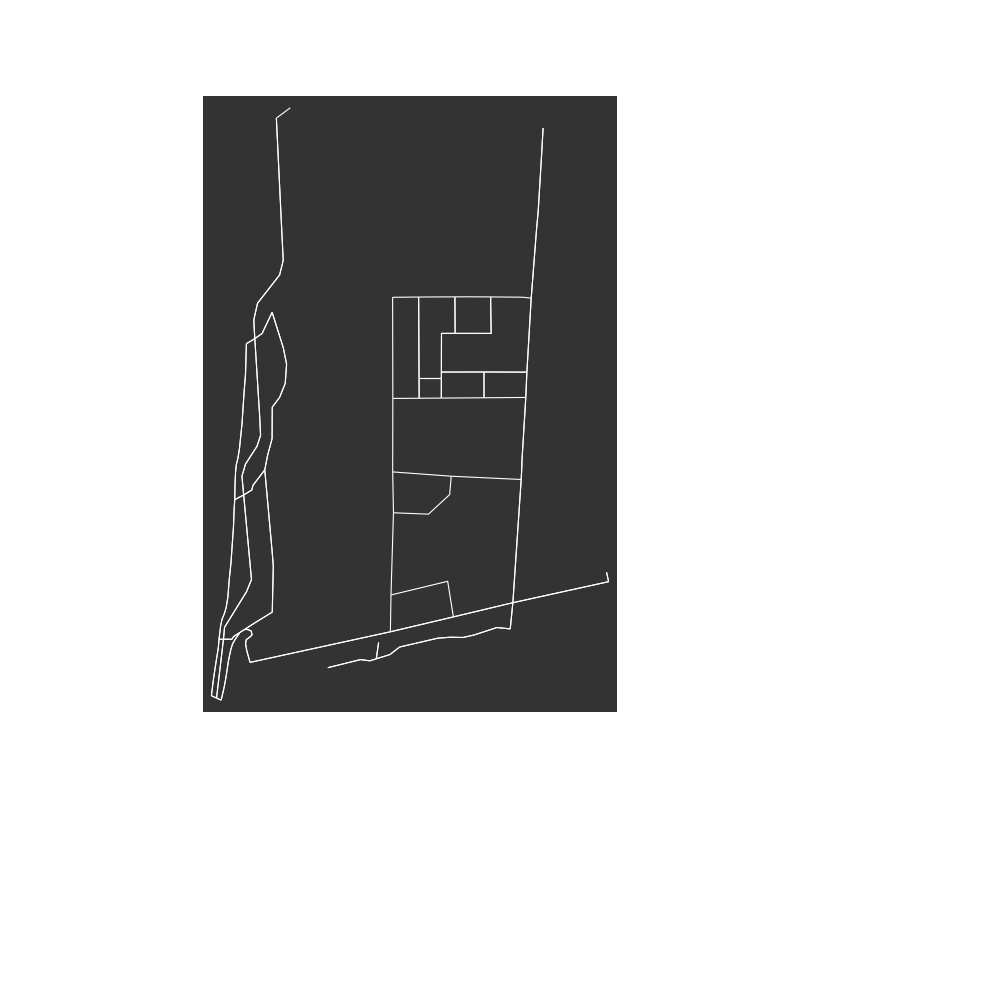

In [5]:
print('ce1, cce1, me1:')
print(At_cs[2], At_cs[3], At_cs[4], '', '--->','', At_cs[2]+At_cs[3]+At_cs[4])
suma_At=At_cs[2]+At_cs[3]+At_cs[4]
mean_lon=(lon_stop[2]+lon_stop[3]+lon_stop[4])/3.
mean_lat=(lat_stop[2]+lat_stop[3]+lat_stop[4])/3.
print('')

print('xe1:')
print(At_cs[1])
print('')

print('je1:')
print(At_cs[12], At_cs[13], '', '--->','', At_cs[12]+At_cs[13])
suma_At2=At_cs[12]+At_cs[13]
mean_lon2=(lon_stop[12]+lon_stop[13])/2.
mean_lat2=(lat_stop[12]+lat_stop[13])/2.
print('')

print('je1:')
print(At_cs[7], At_cs[8],At_cs[9], '', '--->','', At_cs[7]+At_cs[8]+At_cs[9])
suma_At3=At_cs[7]+At_cs[8]+At_cs[9]+At_cs[10]
mean_lon3=(lon_stop[7]+lon_stop[8]+lon_stop[9])/3.
mean_lat3=(lat_stop[7]+lat_stop[8]+lat_stop[9])/3.
print('')

print('be1:')
print(At_cs[10])
print('')

accions_e1=['Ce1+CCe1+Me1', 'Xe1', 'Je1', 'Je1', 'Be1']
colors_e1=['seagreen','darkblue','m','m','red']
temps_accions_e1=[suma_At,At_cs[1],suma_At2,suma_At3,At_cs[10]]
lon_accions_e1=[mean_lon,lon_stop[1],mean_lon2,mean_lon3,lon_stop[10]]
lat_accions_e1=[mean_lat,lat_stop[1],mean_lat2,mean_lat3,lat_stop[10]]

max_temps_accions_e1=max(temps_accions_e1)
new_temps_accions_e1=[]
for j in range(len(temps_accions_e1)):
    new_temps_accions_e1.append(temps_accions_e1[j]/max_temps_accions_e1)

new_temps_accions_e1_2=[]
for i in range(len(temps_accions_e1)):
    new_temps_accions_e1_2.append(100*new_temps_accions_e1[i])

    
    

from shapely.geometry import Point, LineString, Polygon
fig, ax = map_network2(2.2793534239822613, 41.60640928402908, 2.283956227147247,41.60640126017562,  
                       2.2837951863375023,41.60189263168001,  2.2792784442191962, 41.60145135138418)

plt.scatter(lon_accions_e1,lat_accions_e1,c='yellow',s=new_temps_accions_e1_2)
plt.scatter(lon_accions_e1,lat_accions_e1,c=colors_e1,s=1)

bbox_args = dict(boxstyle='square',facecolor='white', edgecolor='k',alpha=0.8)
arrowprops=dict(arrowstyle = '->', connectionstyle='arc3,rad=0',color='white')
for iii in range(len(lon_accions_e1)):
    plt.annotate(str(int(temps_accions_e1[iii]))+ 's'+' '+accions_e1[iii], (lon_accions_e1[iii], lat_accions_e1[iii]),c=colors_e1[iii],size=5,
                 bbox=bbox_args,arrowprops=arrowprops, xytext=(-20, 18),textcoords='offset points')

    
#plt.savefig('e1_durada_accions.eps')

plt.show()

## 3.2- GRUP E2

C:\Users\josep\anaconda3\envs\ox\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


GRUP E2
Nombre total daturades: 17
Temps total daturada: 3647.0 s
Temps promig daturada: 214.52941176470588
[31.0, 515.0, 13.0, 17.0, 101.0, 24.0, 22.0, 295.0, 25.0, 180.0, 163.0, 1593.0, 589.0, 41.0, 11.0, 10.0, 17.0]




<IPython.core.display.Javascript object>


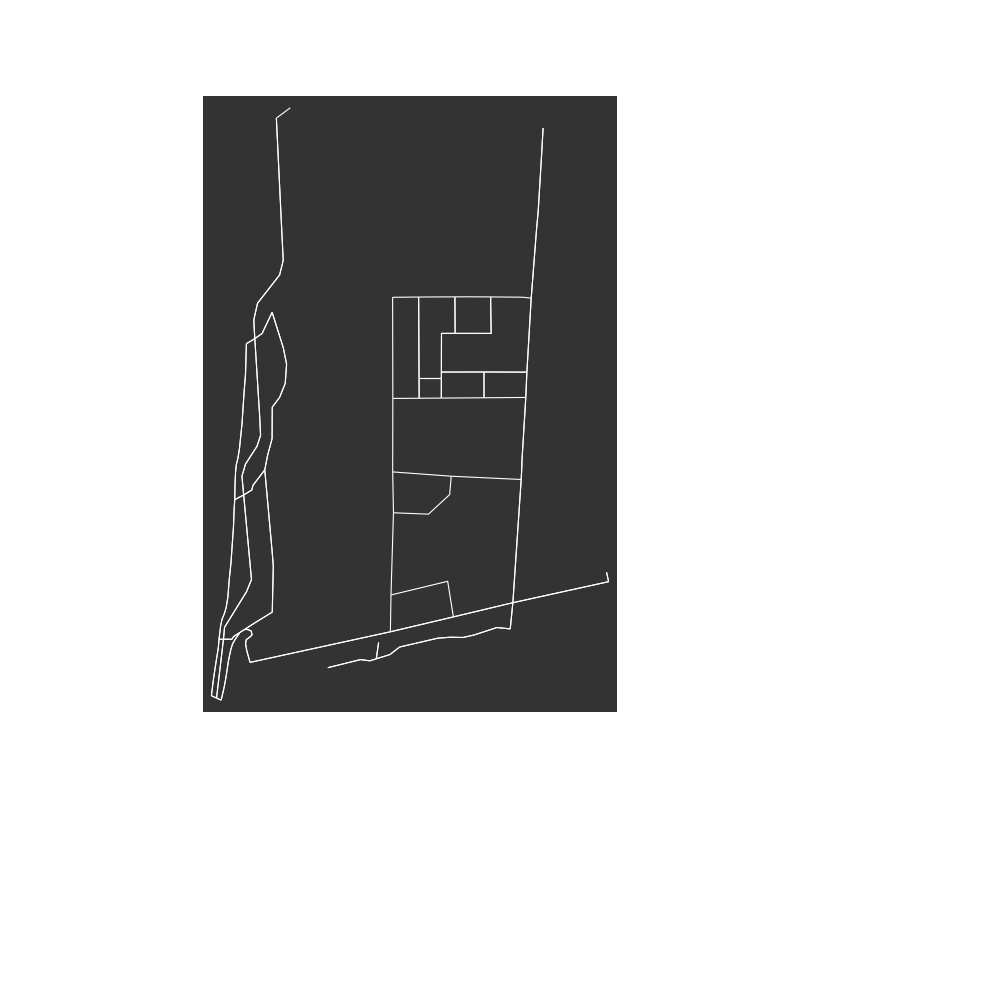

In [6]:
from gpxcsv import gpxtolist
import pandas as pd
import networkx as nx
import osmnx as ox


import matplotlib.pyplot as plt
import numpy as np
import glob
import os
from math import sin, cos, sqrt, atan2, radians
from mpl_toolkits.axes_grid1.inset_locator import inset_axes
from folium import Map
from folium.plugins import HeatMap, HeatMapWithTime
import utm
from matplotlib.animation import FuncAnimation
import matplotlib.animation as animation
from scipy.stats import gaussian_kde
from shapely.geometry import Point, LineString, Polygon
import folium

%matplotlib notebook
#%matplotlib inline
ox.config(use_cache=True, log_console=True)
ox.__version__


df = pd.read_csv('e2.csv') 
print('GRUP E2')
lat=df['lat'].tolist()
lon=df['lon'].tolist()

t=df['At'].tolist()

stops=df['stops']

At_cs=[]

lat_stop=[]
lon_stop=[]

i=0
while i < len(stops):

    if stops[i]=='flight':
        i=i+1

    else:
        s=0
        stopss=[]
        while stops[i+s]=='stop':
            stopss.append(t[i+s])
            s=s+1

        At_c=sum(stopss)
        At_cs.append(At_c)

        lat_stop.append(lat[i])
        lon_stop.append(lon[i])


        i=i+s

print('Nombre total daturades:', len(At_cs))
print('Temps total daturada:', sum(At_cs),'s')
mean_temps=sum(At_cs)/len(At_cs)
print('Temps promig daturada:', sum(At_cs)/len(At_cs))
print(At_cs)
print('')
print('')



from shapely.geometry import Point, LineString, Polygon
fig, ax = map_network2(2.2793534239822613, 41.60640928402908, 2.283956227147247,41.60640126017562,  
                       2.2837951863375023,41.60189263168001,  2.2792784442191962, 41.60145135138418)  # Create the graph from a given latitude and longitude




from turfpy.measurement import boolean_point_in_polygon
from geojson import Point, Polygon, Feature

max_At=max(At_cs)
new_At_cs=[]
for j in range(len(At_cs)):
    new_At_cs.append(At_cs[j]/max_At)

new_At_cs2=[]
for i in range(len(lon_stop)):
    new_At_cs2.append(100*new_At_cs[i])


je2=[41.60323, 2.28173]
xe2=[41.60361, 2.28221]
be2=[41.60323, 2.28197]
me2=[41.60362, 2.28224]
ce2=[41.6036, 2.28225]
cce2=[41.60361, 2.28221]

lon_accions=[je2[1], xe2[1], be2[1], me2[1], ce2[1], cce2[1]]
lat_accions=[je2[0], xe2[0], be2[0], me2[0], ce2[0], cce2[0]]

plt.plot(je2[1],je2[0],'*',c='magenta',markersize=10)
plt.plot(xe2[1],xe2[0],'*',c='magenta',markersize=10)
plt.plot(be2[1],be2[0],'*',c='magenta',markersize=10)
plt.plot(me2[1],me2[0],'*',c='magenta',markersize=10)
plt.plot(ce2[1],ce2[0],'*',c='magenta',markersize=10)
plt.plot(cce2[1],cce2[0],'*',c='magenta',markersize=10)

list_accions=['je2','xe2','be2','me2','ce2','cce2']

plt.scatter(lon_stop,lat_stop,c='yellow',s=new_At_cs2)
plt.scatter(lon_stop,lat_stop,c='grey',s=1)

bbox_args = dict(boxstyle='square',facecolor='white', edgecolor='k',alpha=0.7)
arrowprops=dict(arrowstyle = '->', connectionstyle='arc3,rad=0',color='white')
for iii in range(len(lon_stop)):
    if At_cs[iii]>9:
        plt.annotate(str(int(At_cs[iii]))+ 's', (lon_stop[iii], lat_stop[iii]),c='green',size=8,
                     bbox=bbox_args,arrowprops=arrowprops, xytext=(-20, 18),textcoords='offset points')


bbox_args2 = dict(boxstyle='square',facecolor='grey', edgecolor='k',alpha=0.7)
arrowprops2=dict(arrowstyle = '->', connectionstyle='arc3,rad=0',color='white')
for iiii in range(len(list_accions)):
    plt.annotate(list_accions[iiii], (lon_accions[iiii], lat_accions[iiii]),c='red',size=8,
                     bbox=bbox_args2,arrowprops=arrowprops2, xytext=(-20, 18),textcoords='offset points')    
    

At_cs_names=[]
for i in range(len(At_cs)):
    At_cs_names.append(str(At_cs[i])+'s')

names=np.array(At_cs_names)


#annot = ax.annotate("", xy=(0,0), xytext=(20,20),textcoords="offset points",
            #bbox=dict(boxstyle="round", fc="w"),
            #arrowprops=dict(arrowstyle="->", color='white'),fontsize='large')
#annot.set_visible(False)

def update_annot(ind):

    pos = sc.get_offsets()[ind["ind"][0]]
    annot.xy = pos
#text = "{}, {}".format(" ".join(list(map(str,ind["ind"]))), 
                   #" ".join([names[n] for n in ind["ind"]]))

    text = "{}".format(" ".join([names[n] for n in ind["ind"]]))
    annot.set_text(text)
    #annot.get_bbox_patch().set_facecolor(cmap(norm(c[ind["ind"][0]])))
    annot.get_bbox_patch().set_facecolor('limegreen')
    annot.get_bbox_patch().set_alpha(0.7)


def hover(event):
    vis = annot.get_visible()
    if event.inaxes == ax:
        cont, ind = sc.contains(event)
        if cont:
            update_annot(ind)
            annot.set_visible(True)
            fig.canvas.draw_idle()
        else:
            if vis:
                annot.set_visible(False)
                fig.canvas.draw_idle()

#fig.canvas.mpl_connect("motion_notify_event", hover)


#plt.savefig(grupss[tt]+'_stops_duration'+'.eps')
plt.show()



    


C:\Users\josep\anaconda3\envs\ox\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


be2:
515.0 13.0 17.0 101.0 24.0  --->  670.0

je2:
22.0 295.0 25.0  --->  342.0

xe2, me2, ce2, cce2:
163.0 1593.0 589.0  --->  2345.0



<IPython.core.display.Javascript object>


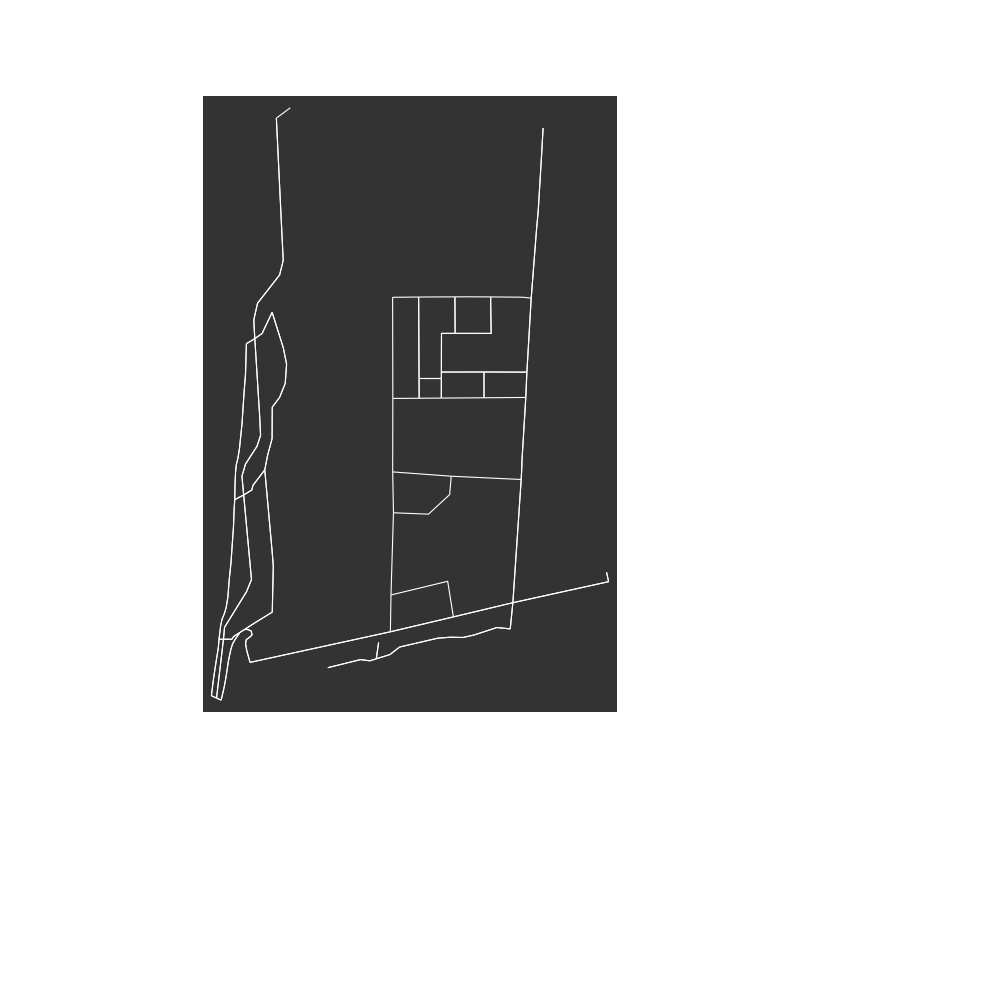

In [7]:
print('be2:')
print(At_cs[1], At_cs[2], At_cs[3], At_cs[4], At_cs[5] ,'', '--->','', At_cs[1]+At_cs[2]+At_cs[3]+At_cs[4]+At_cs[5])
suma_At=At_cs[1]+At_cs[2]+At_cs[3]+At_cs[4]+At_cs[5]
mean_lon=(lon_stop[1]+lon_stop[2]+lon_stop[3]+lon_stop[4]+lon_stop[5])/5.
mean_lat=(lat_stop[1]+lat_stop[2]+lat_stop[3]+lat_stop[4]+lat_stop[5])/5.
print('')

print('je2:')
print(At_cs[6], At_cs[7], At_cs[8],'', '--->','',At_cs[6]+At_cs[7]+At_cs[8])
suma_At2=At_cs[6]+At_cs[7]+At_cs[8]
mean_lon2=(lon_stop[6]+lon_stop[7]+lon_stop[8])/3.
mean_lat2=(lat_stop[6]+lat_stop[7]+lat_stop[8])/3.
print('')

print('xe2, me2, ce2, cce2:')
print(At_cs[10], At_cs[11], At_cs[12],'', '--->','',At_cs[10]+At_cs[11]+At_cs[12])
suma_At3=At_cs[10]+At_cs[11]+At_cs[12]
mean_lon3=(lon_stop[10]+lon_stop[11]+lon_stop[12])/3.
mean_lat3=(lat_stop[10]+lat_stop[11]+lat_stop[12])/3.
print('')



accions_e2=['Be2','Je2', 'Xe2+Me2+Ce2+CCe2']
colors_e2=['red','m','seagreen']
temps_accions_e2=[suma_At,suma_At2,suma_At3]
lon_accions_e2=[mean_lon,mean_lon2,mean_lon3]
lat_accions_e2=[mean_lat,mean_lat2,mean_lat3]

max_temps_accions_e2=max(temps_accions_e2)
new_temps_accions_e2=[]
for j in range(len(temps_accions_e2)):
    new_temps_accions_e2.append(temps_accions_e2[j]/max_temps_accions_e2)

new_temps_accions_e2_2=[]
for i in range(len(temps_accions_e2)):
    new_temps_accions_e2_2.append(100*new_temps_accions_e2[i])

    
    

from shapely.geometry import Point, LineString, Polygon
fig, ax = map_network2(2.2793534239822613, 41.60640928402908, 2.283956227147247,41.60640126017562,  
                       2.2837951863375023,41.60189263168001,  2.2792784442191962, 41.60145135138418)

plt.scatter(lon_accions_e2,lat_accions_e2,c='yellow',s=new_temps_accions_e2_2)
plt.scatter(lon_accions_e2,lat_accions_e2,c=colors_e2,s=1)

bbox_args = dict(boxstyle='square',facecolor='white', edgecolor='k',alpha=0.8)
arrowprops=dict(arrowstyle = '->', connectionstyle='arc3,rad=0',color='white')
for iii in range(len(lon_accions_e2)):
    plt.annotate(str(int(temps_accions_e2[iii]))+ 's'+' '+accions_e2[iii], (lon_accions_e2[iii], lat_accions_e2[iii]),c=colors_e2[iii],size=5,
                 bbox=bbox_args,arrowprops=arrowprops, xytext=(-20, 18),textcoords='offset points')

    
    
#plt.savefig('e2_durada_accions.eps')

plt.show()

## 3.3- GRUP E3

C:\Users\josep\anaconda3\envs\ox\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


GRUP E3
Nombre total daturades: 16
Temps total daturada: 3599.0 s
Temps promig daturada: 224.9375
[710.0, 21.0, 39.0, 226.0, 23.0, 13.0, 10.0, 42.0, 1130.0, 124.0, 740.0, 291.0, 12.0, 197.0, 10.0, 11.0]




<IPython.core.display.Javascript object>


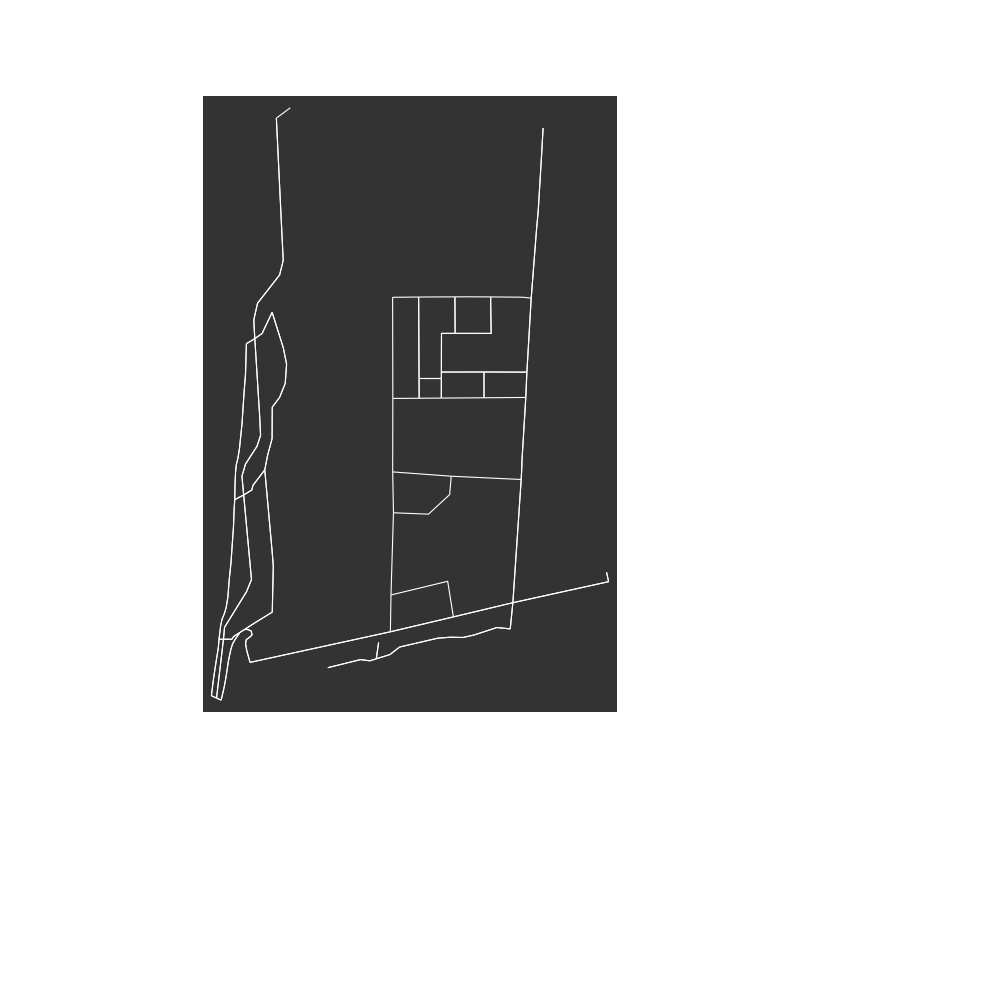

In [8]:
from gpxcsv import gpxtolist
import pandas as pd
import networkx as nx
import osmnx as ox


import matplotlib.pyplot as plt
import numpy as np
import glob
import os
from math import sin, cos, sqrt, atan2, radians
from mpl_toolkits.axes_grid1.inset_locator import inset_axes
from folium import Map
from folium.plugins import HeatMap, HeatMapWithTime
import utm
from matplotlib.animation import FuncAnimation
import matplotlib.animation as animation
from scipy.stats import gaussian_kde
from shapely.geometry import Point, LineString, Polygon
import folium

%matplotlib notebook
#%matplotlib inline
ox.config(use_cache=True, log_console=True)
ox.__version__


df = pd.read_csv('e3.csv') 
print('GRUP E3')

lat=df['lat'].tolist()
lon=df['lon'].tolist()

t=df['At'].tolist()

stops=df['stops']

At_cs=[]

lat_stop=[]
lon_stop=[]

i=0
while i < len(stops):

    if stops[i]=='flight':
        i=i+1

    else:
        s=0
        stopss=[]
        while stops[i+s]=='stop':
            stopss.append(t[i+s])
            s=s+1

        At_c=sum(stopss)
        At_cs.append(At_c)

        lat_stop.append(lat[i])
        lon_stop.append(lon[i])


        i=i+s

print('Nombre total daturades:', len(At_cs))
print('Temps total daturada:', sum(At_cs),'s')
mean_temps=sum(At_cs)/len(At_cs)
print('Temps promig daturada:', sum(At_cs)/len(At_cs))
print(At_cs)
print('')
print('')


from shapely.geometry import Point, LineString, Polygon
fig, ax = map_network2(2.2793534239822613, 41.60640928402908, 2.283956227147247,41.60640126017562,  
                       2.2837951863375023,41.60189263168001,  2.2792784442191962, 41.60145135138418)  # Create the graph from a given latitude and longitude




from turfpy.measurement import boolean_point_in_polygon
from geojson import Point, Polygon, Feature

max_At=max(At_cs)
new_At_cs=[]
for j in range(len(At_cs)):
    new_At_cs.append(At_cs[j]/max_At)

new_At_cs2=[]
for i in range(len(lon_stop)):
    new_At_cs2.append(100*new_At_cs[i])


je3=[41.6028, 2.28175]
xe3=[41.60284, 2.2822]
be3=[41.60412, 2.28204]
me3=[41.60368, 2.2818]
ce3=[41.6037, 2.28185]
cce3=[41.60393, 2.28194]

lon_accions=[je3[1], xe3[1], be3[1], me3[1], ce3[1], cce3[1]]
lat_accions=[je3[0], xe3[0], be3[0], me3[0], ce3[0], cce3[0]]

plt.plot(je3[1],je3[0],'*',c='magenta',markersize=10)
plt.plot(xe3[1],xe3[0],'*',c='magenta',markersize=10)
plt.plot(be3[1],be3[0],'*',c='magenta',markersize=10)
plt.plot(me3[1],me3[0],'*',c='magenta',markersize=10)
plt.plot(ce3[1],ce3[0],'*',c='magenta',markersize=10)
plt.plot(cce3[1],cce3[0],'*',c='magenta',markersize=10)

list_accions=['je3','xe3','be3','me3','ce3','cce3']

plt.scatter(lon_stop,lat_stop,c='yellow',s=new_At_cs2)
plt.scatter(lon_stop,lat_stop,c='grey',s=1)

bbox_args = dict(boxstyle='square',facecolor='white', edgecolor='k',alpha=0.7)
arrowprops=dict(arrowstyle = '->', connectionstyle='arc3,rad=0',color='white')
for iii in range(len(lon_stop)):
    if At_cs[iii]>9:
        plt.annotate(str(int(At_cs[iii]))+ 's', (lon_stop[iii], lat_stop[iii]),c='green',size=8,
                     bbox=bbox_args,arrowprops=arrowprops, xytext=(-20, 18),textcoords='offset points')


bbox_args2 = dict(boxstyle='square',facecolor='grey', edgecolor='k',alpha=0.7)
arrowprops2=dict(arrowstyle = '->', connectionstyle='arc3,rad=0',color='white')
for iiii in range(len(list_accions)):
    plt.annotate(list_accions[iiii], (lon_accions[iiii], lat_accions[iiii]),c='red',size=8,
                     bbox=bbox_args2,arrowprops=arrowprops2, xytext=(-20, 18),textcoords='offset points')    
    

At_cs_names=[]
for i in range(len(At_cs)):
    At_cs_names.append(str(At_cs[i])+'s')

names=np.array(At_cs_names)


#annot = ax.annotate("", xy=(0,0), xytext=(20,20),textcoords="offset points",
            #bbox=dict(boxstyle="round", fc="w"),
            #arrowprops=dict(arrowstyle="->", color='white'),fontsize='large')
#annot.set_visible(False)

def update_annot(ind):

    pos = sc.get_offsets()[ind["ind"][0]]
    annot.xy = pos
#text = "{}, {}".format(" ".join(list(map(str,ind["ind"]))), 
                   #" ".join([names[n] for n in ind["ind"]]))

    text = "{}".format(" ".join([names[n] for n in ind["ind"]]))
    annot.set_text(text)
    #annot.get_bbox_patch().set_facecolor(cmap(norm(c[ind["ind"][0]])))
    annot.get_bbox_patch().set_facecolor('limegreen')
    annot.get_bbox_patch().set_alpha(0.7)


def hover(event):
    vis = annot.get_visible()
    if event.inaxes == ax:
        cont, ind = sc.contains(event)
        if cont:
            update_annot(ind)
            annot.set_visible(True)
            fig.canvas.draw_idle()
        else:
            if vis:
                annot.set_visible(False)
                fig.canvas.draw_idle()

#fig.canvas.mpl_connect("motion_notify_event", hover)


#plt.savefig(grupss[tt]+'_stops_duration'+'.eps')
plt.show()



    


C:\Users\josep\anaconda3\envs\ox\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


je3:
226.0 23.0 13.0  --->  262.0

xe3:
39.0

be3:
1130.0

cce3:
740.0 291.0 12.0 197.0  --->  1240.0

me3, ce3:
710.0 21.0  --->  731.0



<IPython.core.display.Javascript object>


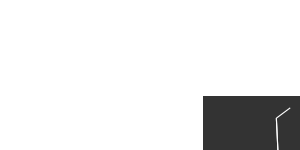

In [9]:
print('je3:')
print(At_cs[3], At_cs[4], At_cs[5], '', '--->','', At_cs[3]+At_cs[4]+At_cs[5])
suma_At=At_cs[3]+At_cs[4]+At_cs[5]
mean_lon=(lon_stop[3]+lon_stop[4]+lon_stop[5])/3.
mean_lat=(lat_stop[3]+lat_stop[4]+lat_stop[5])/3.
print('')

print('xe3:')
print(At_cs[2])
print('')

print('be3:')
print(At_cs[8])
print('')

print('cce3:')
print(At_cs[10], At_cs[11],At_cs[12],At_cs[13], '', '--->','', At_cs[10]+At_cs[11]+At_cs[12]+At_cs[13])
suma_At2=At_cs[10]+At_cs[11]+At_cs[12]+At_cs[13]
mean_lon2=(lon_stop[10]+lon_stop[11]+lon_stop[12]+lon_stop[13])/4.
mean_lat2=(lat_stop[10]+lat_stop[11]+lat_stop[12]+lat_stop[13])/4.
print('')

print('me3, ce3:')
print(At_cs[0], At_cs[1], '', '--->','', At_cs[0]+At_cs[1])
suma_At3=At_cs[0]+At_cs[1]
mean_lon3=(lon_stop[0]+lon_stop[1])/2.
mean_lat3=(lat_stop[0]+lat_stop[1])/2.
print('')

accions_e3=['Je3', 'Xe3', 'Be3', 'CCe3','Me3+Ce3']
colors_e3=['m','darkblue','red','darkcyan','seagreen']
temps_accions_e3=[suma_At,At_cs[2],At_cs[8],suma_At2,suma_At3]
lon_accions_e3=[mean_lon,lon_stop[2],lon_stop[8],mean_lon2,mean_lon3]
lat_accions_e3=[mean_lat,lat_stop[2],lat_stop[8],mean_lat2,mean_lat3]

max_temps_accions_e3=max(temps_accions_e3)
new_temps_accions_e3=[]
for j in range(len(temps_accions_e3)):
    new_temps_accions_e3.append(temps_accions_e3[j]/max_temps_accions_e3)

new_temps_accions_e3_2=[]
for i in range(len(temps_accions_e3)):
    new_temps_accions_e3_2.append(100*new_temps_accions_e3[i])

    
    

from shapely.geometry import Point, LineString, Polygon
fig, ax = map_network2(2.2793534239822613, 41.60640928402908, 2.283956227147247,41.60640126017562,  
                       2.2837951863375023,41.60189263168001,  2.2792784442191962, 41.60145135138418)

plt.scatter(lon_accions_e3,lat_accions_e3,c='yellow',s=new_temps_accions_e3_2)
plt.scatter(lon_accions_e3,lat_accions_e3,c=colors_e3,s=1)

bbox_args = dict(boxstyle='square',facecolor='white', edgecolor='k',alpha=0.8)
arrowprops=dict(arrowstyle = '->', connectionstyle='arc3,rad=0',color='white')
for iii in range(len(lon_accions_e3)):
    plt.annotate(str(int(temps_accions_e3[iii]))+ 's'+' '+accions_e3[iii], (lon_accions_e3[iii], lat_accions_e3[iii]),c=colors_e3[iii],size=5,
                 bbox=bbox_args,arrowprops=arrowprops, xytext=(-20, 18),textcoords='offset points')

    
    
#plt.savefig('e3_durada_accions.eps')

plt.show()

## 3.4- GRUP E4

C:\Users\josep\anaconda3\envs\ox\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


GRUP E4
Nombre total daturades: 20
Temps total daturada: 3295.0 s
Temps promig daturada: 164.75
[16.0, 10.0, 28.0, 21.0, 601.0, 87.0, 403.0, 10.0, 20.0, 548.0, 247.0, 148.0, 12.0, 376.0, 458.0, 256.0, 14.0, 12.0, 17.0, 11.0]




<IPython.core.display.Javascript object>


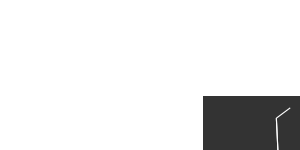

In [10]:
from gpxcsv import gpxtolist
import pandas as pd
import networkx as nx
import osmnx as ox


import matplotlib.pyplot as plt
import numpy as np
import glob
import os
from math import sin, cos, sqrt, atan2, radians
from mpl_toolkits.axes_grid1.inset_locator import inset_axes
from folium import Map
from folium.plugins import HeatMap, HeatMapWithTime
import utm
from matplotlib.animation import FuncAnimation
import matplotlib.animation as animation
from scipy.stats import gaussian_kde
from shapely.geometry import Point, LineString, Polygon
import folium

%matplotlib notebook
#%matplotlib inline
ox.config(use_cache=True, log_console=True)
ox.__version__


df = pd.read_csv('e4.csv') 
print('GRUP E4')
lat=df['lat'].tolist()
lon=df['lon'].tolist()

t=df['At'].tolist()

stops=df['stops']

At_cs=[]

lat_stop=[]
lon_stop=[]

i=0
while i < len(stops):

    if stops[i]=='flight':
        i=i+1

    else:
        s=0
        stopss=[]
        while stops[i+s]=='stop':
            stopss.append(t[i+s])
            s=s+1

        At_c=sum(stopss)
        At_cs.append(At_c)

        lat_stop.append(lat[i])
        lon_stop.append(lon[i])


        i=i+s

print('Nombre total daturades:', len(At_cs))
print('Temps total daturada:', sum(At_cs),'s')
mean_temps=sum(At_cs)/len(At_cs)
print('Temps promig daturada:', sum(At_cs)/len(At_cs))
print(At_cs)
print('')
print('')


from shapely.geometry import Point, LineString, Polygon
fig, ax = map_network2(2.2793534239822613, 41.60640928402908, 2.283956227147247,41.60640126017562,  
                       2.2837951863375023,41.60189263168001,  2.2792784442191962, 41.60145135138418)  # Create the graph from a given latitude and longitude




from turfpy.measurement import boolean_point_in_polygon
from geojson import Point, Polygon, Feature

max_At=max(At_cs)
new_At_cs=[]
for j in range(len(At_cs)):
    new_At_cs.append(At_cs[j]/max_At)

new_At_cs2=[]
for i in range(len(lon_stop)):
    new_At_cs2.append(100*new_At_cs[i])


je4=[41.6036, 2.28248]
xe4=[41.60372, 2.28178]
be4=[41.60361, 2.28248]
be4_2=[41.60364, 2.28197]
je4_2=[41.60373, 2.28179]
me4=[41.60419, 2.28233]
ce4=[41.60408, 2.28197]
cce4=[41.60408, 2.28195]

lon_accions=[je4[1], xe4[1], be4[1], be4_2[1], je4_2[1], me4[1], ce4[1], cce4[1]]
lat_accions=[je4[0], xe4[0], be4[0], be4_2[0], je4_2[0], me4[0], ce4[0], cce4[0]]

plt.plot(je4[1],je4[0],'*',c='magenta',markersize=10)
plt.plot(xe4[1],xe4[0],'*',c='magenta',markersize=10)
plt.plot(be4[1],be4[0],'*',c='magenta',markersize=10)
plt.plot(be4_2[1],be4_2[0],'*',c='magenta',markersize=10)
plt.plot(je4_2[1],je4_2[0],'*',c='magenta',markersize=10)
plt.plot(me4[1],me4[0],'*',c='magenta',markersize=10)
plt.plot(ce4[1],ce4[0],'*',c='magenta',markersize=10)
plt.plot(cce4[1],cce4[0],'*',c='magenta',markersize=10)

list_accions=['je4','xe4','be4','be4_2','je4_2','me4','ce4','cce4']

plt.scatter(lon_stop,lat_stop,c='yellow',s=new_At_cs2)
plt.scatter(lon_stop,lat_stop,c='grey',s=1)

bbox_args = dict(boxstyle='square',facecolor='white', edgecolor='k',alpha=0.7)
arrowprops=dict(arrowstyle = '->', connectionstyle='arc3,rad=0',color='white')
for iii in range(len(lon_stop)):
    if At_cs[iii]>9:
        plt.annotate(str(int(At_cs[iii]))+ 's', (lon_stop[iii], lat_stop[iii]),c='green',size=8,
                     bbox=bbox_args,arrowprops=arrowprops, xytext=(-20, 18),textcoords='offset points')


bbox_args2 = dict(boxstyle='square',facecolor='grey', edgecolor='k',alpha=0.7)
arrowprops2=dict(arrowstyle = '->', connectionstyle='arc3,rad=0',color='white')
for iiii in range(len(list_accions)):
    plt.annotate(list_accions[iiii], (lon_accions[iiii], lat_accions[iiii]),c='red',size=8,
                     bbox=bbox_args2,arrowprops=arrowprops2, xytext=(-20, 18),textcoords='offset points')    
    

At_cs_names=[]
for i in range(len(At_cs)):
    At_cs_names.append(str(At_cs[i])+'s')

names=np.array(At_cs_names)


#annot = ax.annotate("", xy=(0,0), xytext=(20,20),textcoords="offset points",
            #bbox=dict(boxstyle="round", fc="w"),
            #arrowprops=dict(arrowstyle="->", color='white'),fontsize='large')
#annot.set_visible(False)

def update_annot(ind):

    pos = sc.get_offsets()[ind["ind"][0]]
    annot.xy = pos
#text = "{}, {}".format(" ".join(list(map(str,ind["ind"]))), 
                   #" ".join([names[n] for n in ind["ind"]]))

    text = "{}".format(" ".join([names[n] for n in ind["ind"]]))
    annot.set_text(text)
    #annot.get_bbox_patch().set_facecolor(cmap(norm(c[ind["ind"][0]])))
    annot.get_bbox_patch().set_facecolor('limegreen')
    annot.get_bbox_patch().set_alpha(0.7)


def hover(event):
    vis = annot.get_visible()
    if event.inaxes == ax:
        cont, ind = sc.contains(event)
        if cont:
            update_annot(ind)
            annot.set_visible(True)
            fig.canvas.draw_idle()
        else:
            if vis:
                annot.set_visible(False)
                fig.canvas.draw_idle()

#fig.canvas.mpl_connect("motion_notify_event", hover)


#plt.savefig(grupss[tt]+'_stops_duration'+'.eps')
plt.show()



    


C:\Users\josep\anaconda3\envs\ox\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


be4, je4:
601.0

me4:
20.0 548.0 247.0 148.0  --->  963.0

xe4,je4:
403.0

be4:
87.0

ce4, cce4:
376.0 458.0 256.0  --->  1090.0



<IPython.core.display.Javascript object>


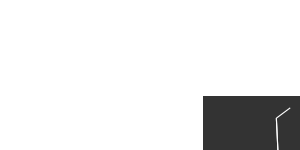

In [11]:
print('be4, je4:')
print(At_cs[4])
print('')

print('me4:')
print(At_cs[8], At_cs[9],At_cs[10],At_cs[11], '', '--->','', At_cs[8]+At_cs[9]+At_cs[10]+At_cs[11])
suma_At=At_cs[8]+At_cs[9]+At_cs[10]+At_cs[11]
mean_lon=(lon_stop[8]+lon_stop[9]+lon_stop[10]+lon_stop[11])/4.
mean_lat=(lat_stop[8]+lat_stop[9]+lat_stop[10]+lat_stop[11])/4.
print('')

print('xe4,je4:')
print(At_cs[6])
print('')

print('be4:')
print(At_cs[5])
print('')

print('ce4, cce4:')
print(At_cs[13], At_cs[14],At_cs[15], '', '--->','', At_cs[13]+At_cs[14]+At_cs[15])
suma_At3=At_cs[13]+At_cs[14]+At_cs[15]
mean_lon3=(lon_stop[13]+lon_stop[14]+lon_stop[15])/3.
mean_lat3=(lat_stop[13]+lat_stop[14]+lat_stop[15])/3.
print('')



accions_e4=['Be4+Je4', 'Me4', 'Xe4+Je4', 'Be4', 'Ce4+CCe4']
colors_e4=['m', 'darkorange','darkblue','red','seagreen']
temps_accions_e4=[At_cs[4],suma_At,At_cs[6],At_cs[5],suma_At3]
lon_accions_e4=[lon_stop[4],mean_lon,lon_stop[6],lon_stop[5],mean_lon3]
lat_accions_e4=[lat_stop[4],mean_lat,lat_stop[6],lat_stop[5],mean_lat3]

max_temps_accions_e4=max(temps_accions_e4)
new_temps_accions_e4=[]
for j in range(len(temps_accions_e4)):
    new_temps_accions_e4.append(temps_accions_e4[j]/max_temps_accions_e4)

new_temps_accions_e4_2=[]
for i in range(len(temps_accions_e4)):
    new_temps_accions_e4_2.append(100*new_temps_accions_e4[i])

    
    

from shapely.geometry import Point, LineString, Polygon
fig, ax = map_network2(2.2793534239822613, 41.60640928402908, 2.283956227147247,41.60640126017562,  
                       2.2837951863375023,41.60189263168001,  2.2792784442191962, 41.60145135138418)

plt.scatter(lon_accions_e4,lat_accions_e4,c='yellow',s=new_temps_accions_e4_2)
plt.scatter(lon_accions_e4,lat_accions_e4,c=colors_e4,s=1)

bbox_args = dict(boxstyle='square',facecolor='white', edgecolor='k',alpha=0.8)
arrowprops=dict(arrowstyle = '->', connectionstyle='arc3,rad=0',color='white')
for iii in range(len(lon_accions_e4)):
    plt.annotate(str(int(temps_accions_e4[iii]))+ 's'+' '+accions_e4[iii], (lon_accions_e4[iii], lat_accions_e4[iii]),c=colors_e4[iii],size=5,
                 bbox=bbox_args,arrowprops=arrowprops, xytext=(-20, 18),textcoords='offset points')

    
    
#plt.savefig('e4_durada_accions.eps')

plt.show()

## 3.5- GRUP E5

C:\Users\josep\anaconda3\envs\ox\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


GRUP E5
Nombre total daturades: 29
Temps total daturada: 3249.0 s
Temps promig daturada: 112.03448275862068
[71.0, 412.0, 20.0, 13.0, 41.0, 11.0, 85.0, 206.0, 61.0, 11.0, 50.0, 445.0, 14.0, 15.0, 63.0, 39.0, 10.0, 61.0, 340.0, 15.0, 11.0, 806.0, 12.0, 52.0, 13.0, 325.0, 22.0, 14.0, 11.0]




<IPython.core.display.Javascript object>


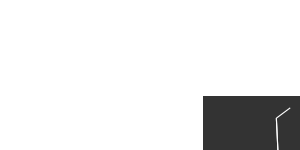

In [12]:
from gpxcsv import gpxtolist
import pandas as pd
import networkx as nx
import osmnx as ox


import matplotlib.pyplot as plt
import numpy as np
import glob
import os
from math import sin, cos, sqrt, atan2, radians
from mpl_toolkits.axes_grid1.inset_locator import inset_axes
from folium import Map
from folium.plugins import HeatMap, HeatMapWithTime
import utm
from matplotlib.animation import FuncAnimation
import matplotlib.animation as animation
from scipy.stats import gaussian_kde
from shapely.geometry import Point, LineString, Polygon
import folium

%matplotlib notebook
#%matplotlib inline
ox.config(use_cache=True, log_console=True)
ox.__version__


df = pd.read_csv('e5.csv') 
print('GRUP E5')
lat=df['lat'].tolist()
lon=df['lon'].tolist()

t=df['At'].tolist()

stops=df['stops']

At_cs=[]

lat_stop=[]
lon_stop=[]

i=0
while i < len(stops):

    if stops[i]=='flight':
        i=i+1

    else:
        s=0
        stopss=[]
        while stops[i+s]=='stop':
            stopss.append(t[i+s])
            s=s+1

        At_c=sum(stopss)
        At_cs.append(At_c)

        lat_stop.append(lat[i])
        lon_stop.append(lon[i])


        i=i+s

print('Nombre total daturades:', len(At_cs))
print('Temps total daturada:', sum(At_cs),'s')
mean_temps=sum(At_cs)/len(At_cs)
print('Temps promig daturada:', sum(At_cs)/len(At_cs))
print(At_cs)
print('')
print('')


from shapely.geometry import Point, LineString, Polygon
fig, ax = map_network2(2.2793534239822613, 41.60640928402908, 2.283956227147247,41.60640126017562,  
                       2.2837951863375023,41.60189263168001,  2.2792784442191962, 41.60145135138418)  # Create the graph from a given latitude and longitude




from turfpy.measurement import boolean_point_in_polygon
from geojson import Point, Polygon, Feature

max_At=max(At_cs)
new_At_cs=[]
for j in range(len(At_cs)):
    new_At_cs.append(At_cs[j]/max_At)

new_At_cs2=[]
for i in range(len(lon_stop)):
    new_At_cs2.append(100*new_At_cs[i])


je5=[41.60312, 2.28241]
xe5=[41.60435, 2.28259]
be5=[41.60311, 2.28237]
je5_2=[41.60369, 2.28183]
me5=[41.60319, 2.28171]
ce5=[41.60321, 2.28168]
cce5=[41.60321, 2.28168]

lon_accions=[je5[1], xe5[1], be5[1], je5_2[1], me5[1], ce5[1], cce5[1]]
lat_accions=[je5[0], xe5[0], be5[0], je5_2[0], me5[0], ce5[0], cce5[0]]

plt.plot(je5[1],je5[0],'*',c='magenta',markersize=10)
plt.plot(xe5[1],xe5[0],'*',c='magenta',markersize=10)
plt.plot(be5[1],be5[0],'*',c='magenta',markersize=10)
plt.plot(je5_2[1],je5_2[0],'*',c='magenta',markersize=10)
plt.plot(me5[1],me5[0],'*',c='magenta',markersize=10)
plt.plot(ce5[1],ce5[0],'*',c='magenta',markersize=10)
plt.plot(cce5[1],cce5[0],'*',c='magenta',markersize=10)

list_accions=['je5','xe5','be5','je5_2','me5','ce5','cce5']

plt.scatter(lon_stop,lat_stop,c='yellow',s=new_At_cs2)
plt.scatter(lon_stop,lat_stop,c='grey',s=1)

bbox_args = dict(boxstyle='square',facecolor='white', edgecolor='k',alpha=0.7)
arrowprops=dict(arrowstyle = '->', connectionstyle='arc3,rad=0',color='white')
for iii in range(len(lon_stop)):
    if At_cs[iii]>9:
        plt.annotate(str(int(At_cs[iii]))+ 's', (lon_stop[iii], lat_stop[iii]),c='green',size=8,
                     bbox=bbox_args,arrowprops=arrowprops, xytext=(-20, 18),textcoords='offset points')


bbox_args2 = dict(boxstyle='square',facecolor='grey', edgecolor='k',alpha=0.7)
arrowprops2=dict(arrowstyle = '->', connectionstyle='arc3,rad=0',color='white')
for iiii in range(len(list_accions)):
    plt.annotate(list_accions[iiii], (lon_accions[iiii], lat_accions[iiii]),c='red',size=8,
                     bbox=bbox_args2,arrowprops=arrowprops2, xytext=(-20, 18),textcoords='offset points')    
    

At_cs_names=[]
for i in range(len(At_cs)):
    At_cs_names.append(str(At_cs[i])+'s')

names=np.array(At_cs_names)


#annot = ax.annotate("", xy=(0,0), xytext=(20,20),textcoords="offset points",
            #bbox=dict(boxstyle="round", fc="w"),
            #arrowprops=dict(arrowstyle="->", color='white'),fontsize='large')
#annot.set_visible(False)

def update_annot(ind):

    pos = sc.get_offsets()[ind["ind"][0]]
    annot.xy = pos
#text = "{}, {}".format(" ".join(list(map(str,ind["ind"]))), 
                   #" ".join([names[n] for n in ind["ind"]]))

    text = "{}".format(" ".join([names[n] for n in ind["ind"]]))
    annot.set_text(text)
    #annot.get_bbox_patch().set_facecolor(cmap(norm(c[ind["ind"][0]])))
    annot.get_bbox_patch().set_facecolor('limegreen')
    annot.get_bbox_patch().set_alpha(0.7)


def hover(event):
    vis = annot.get_visible()
    if event.inaxes == ax:
        cont, ind = sc.contains(event)
        if cont:
            update_annot(ind)
            annot.set_visible(True)
            fig.canvas.draw_idle()
        else:
            if vis:
                annot.set_visible(False)
                fig.canvas.draw_idle()

#fig.canvas.mpl_connect("motion_notify_event", hover)


#plt.savefig(grupss[tt]+'_stops_duration'+'.eps')
plt.show()



    


C:\Users\josep\anaconda3\envs\ox\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


be5, je5:
412.0 20.0 13.0 41.0  --->  486.0

me5,ce5,cce5:
85.0 206.0 61.0 11.0 50.0 445.0  --->  858.0

je5:
15.0 63.0 39.0  --->  117.0

xe5:
11.0 806.0  --->  817.0



<IPython.core.display.Javascript object>


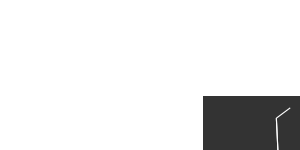

In [13]:
print('be5, je5:')
print(At_cs[1], At_cs[2],At_cs[3],At_cs[4], '', '--->','', At_cs[1]+At_cs[2]+At_cs[3]+At_cs[4])
suma_At=At_cs[1]+At_cs[2]+At_cs[3]+At_cs[4]
mean_lon=(lon_stop[1]+lon_stop[2]+lon_stop[3]+lon_stop[4])/4.
mean_lat=(lat_stop[1]+lat_stop[2]+lat_stop[3]+lat_stop[4])/4.
print('')

print('me5,ce5,cce5:')
print(At_cs[6], At_cs[7],At_cs[8],At_cs[9], At_cs[10], At_cs[11],  '', '--->','', At_cs[6]+At_cs[7]+At_cs[8]+At_cs[9]+At_cs[10]+At_cs[11])
suma_At2=At_cs[6]+At_cs[7]+At_cs[8]+At_cs[9]+At_cs[10]+At_cs[11]
mean_lon2=(lon_stop[6]+lon_stop[7]+lon_stop[8]+lon_stop[9]+lon_stop[10]+lon_stop[11])/6.
mean_lat2=(lat_stop[6]+lat_stop[7]+lat_stop[8]+lat_stop[9]+lat_stop[10]+lat_stop[11])/6.
print('')

print('je5:')
print(At_cs[13], At_cs[14],At_cs[15],  '', '--->','', At_cs[13]+At_cs[14]+At_cs[15])
suma_At3=At_cs[13]+At_cs[14]+At_cs[15]
mean_lon3=(lon_stop[13]+lon_stop[14]+lon_stop[15])/3.
mean_lat3=(lat_stop[13]+lat_stop[14]+lat_stop[15])/3.
print('')

print('xe5:')
print(At_cs[20], At_cs[21],  '', '--->','', At_cs[20]+At_cs[21])
suma_At4=At_cs[20]+At_cs[21]
mean_lon4=(lon_stop[20]+lon_stop[21])/2.
mean_lat4=(lat_stop[20]+lat_stop[21])/2.
print('')

accions_e5=['Be5+Je5', 'Me5+Ce5+CCe5', 'Je5', 'Xe5']
colors_e5=['red', 'seagreen','m','darkblue']
temps_accions_e5=[suma_At,suma_At2,suma_At3,suma_At4]
lon_accions_e5=[mean_lon,mean_lon2,mean_lon3,mean_lon4]
lat_accions_e5=[mean_lat,mean_lat2,mean_lat3,mean_lat4]

max_temps_accions_e5=max(temps_accions_e5)
new_temps_accions_e5=[]
for j in range(len(temps_accions_e5)):
    new_temps_accions_e5.append(temps_accions_e5[j]/max_temps_accions_e5)

new_temps_accions_e5_2=[]
for i in range(len(temps_accions_e5)):
    new_temps_accions_e5_2.append(100*new_temps_accions_e5[i])

    
from shapely.geometry import Point, LineString, Polygon
fig, ax = map_network2(2.2793534239822613, 41.60640928402908, 2.283956227147247,41.60640126017562,  
                       2.2837951863375023,41.60189263168001,  2.2792784442191962, 41.60145135138418)

plt.scatter(lon_accions_e5,lat_accions_e5,c='yellow',s=new_temps_accions_e5_2)
plt.scatter(lon_accions_e5,lat_accions_e5,c=colors_e5,s=1)

bbox_args = dict(boxstyle='square',facecolor='white', edgecolor='k',alpha=0.8)
arrowprops=dict(arrowstyle = '->', connectionstyle='arc3,rad=0',color='white')
for iii in range(len(lon_accions_e5)):
    plt.annotate(str(int(temps_accions_e5[iii]))+ 's'+' '+accions_e5[iii], (lon_accions_e5[iii], lat_accions_e5[iii]),c=colors_e5[iii],size=5,
                 bbox=bbox_args,arrowprops=arrowprops, xytext=(-20, 18),textcoords='offset points')

      
#plt.savefig('e5_durada_accions.eps')

plt.show()  


## 3.6- GRUP E6

C:\Users\josep\anaconda3\envs\ox\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


GRUP E6
Nombre total daturades: 21
Temps total daturada: 3003.0 s
Temps promig daturada: 143.0
[92.0, 12.0, 10.0, 681.0, 13.0, 489.0, 11.0, 440.0, 11.0, 10.0, 210.0, 12.0, 10.0, 12.0, 128.0, 11.0, 40.0, 267.0, 15.0, 10.0, 519.0]




<IPython.core.display.Javascript object>


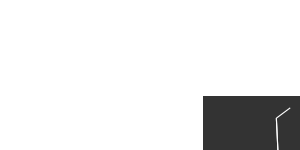

In [14]:
from gpxcsv import gpxtolist
import pandas as pd
import networkx as nx
import osmnx as ox


import matplotlib.pyplot as plt
import numpy as np
import glob
import os
from math import sin, cos, sqrt, atan2, radians
from mpl_toolkits.axes_grid1.inset_locator import inset_axes
from folium import Map
from folium.plugins import HeatMap, HeatMapWithTime
import utm
from matplotlib.animation import FuncAnimation
import matplotlib.animation as animation
from scipy.stats import gaussian_kde
from shapely.geometry import Point, LineString, Polygon
import folium

%matplotlib notebook
#%matplotlib inline
ox.config(use_cache=True, log_console=True)
ox.__version__


df = pd.read_csv('e6.csv') 
print('GRUP E6')
lat=df['lat'].tolist()
lon=df['lon'].tolist()

t=df['At'].tolist()

stops=df['stops']

At_cs=[]

lat_stop=[]
lon_stop=[]

i=0
while i < len(stops):

    if stops[i]=='flight':
        i=i+1

    else:
        s=0
        stopss=[]
        while stops[i+s]=='stop':
            stopss.append(t[i+s])
            s=s+1

        At_c=sum(stopss)
        At_cs.append(At_c)

        lat_stop.append(lat[i])
        lon_stop.append(lon[i])


        i=i+s

print('Nombre total daturades:', len(At_cs))
print('Temps total daturada:', sum(At_cs),'s')
mean_temps=sum(At_cs)/len(At_cs)
print('Temps promig daturada:', sum(At_cs)/len(At_cs))
print(At_cs)
print('')
print('')


from shapely.geometry import Point, LineString, Polygon
fig, ax = map_network2(2.2793534239822613, 41.60640928402908, 2.283956227147247,41.60640126017562,  
                       2.2837951863375023,41.60189263168001,  2.2792784442191962, 41.60145135138418)  # Create the graph from a given latitude and longitude




from turfpy.measurement import boolean_point_in_polygon
from geojson import Point, Polygon, Feature

max_At=max(At_cs)
new_At_cs=[]
for j in range(len(At_cs)):
    new_At_cs.append(At_cs[j]/max_At)

new_At_cs2=[]
for i in range(len(lon_stop)):
    new_At_cs2.append(100*new_At_cs[i])


je6=[41.60309, 2.28239]
xe6=[41.60454, 2.28212]
be6=[41.60278, 2.28234]
me6=[41.60421, 2.28258]
ce6=[41.60361, 2.28191]
cce6=[41.60361, 2.28189]

lon_accions=[je6[1], xe6[1], be6[1], me6[1], ce6[1], cce6[1]]
lat_accions=[je6[0], xe6[0], be6[0], me6[0], ce6[0], cce6[0]]

plt.plot(je6[1],je6[0],'*',c='magenta',markersize=10)
plt.plot(xe6[1],xe6[0],'*',c='magenta',markersize=10)
plt.plot(be6[1],be6[0],'*',c='magenta',markersize=10)
plt.plot(me6[1],me6[0],'*',c='magenta',markersize=10)
plt.plot(ce6[1],ce6[0],'*',c='magenta',markersize=10)
plt.plot(cce6[1],cce6[0],'*',c='magenta',markersize=10)

list_accions=['je6','xe6','be6','me6','ce6','cce6']

plt.scatter(lon_stop,lat_stop,c='yellow',s=new_At_cs2)
plt.scatter(lon_stop,lat_stop,c='grey',s=1)

bbox_args = dict(boxstyle='square',facecolor='white', edgecolor='k',alpha=0.7)
arrowprops=dict(arrowstyle = '->', connectionstyle='arc3,rad=0',color='white')
for iii in range(len(lon_stop)):
    if At_cs[iii]>9:
        plt.annotate(str(int(At_cs[iii]))+ 's', (lon_stop[iii], lat_stop[iii]),c='green',size=8,
                     bbox=bbox_args,arrowprops=arrowprops, xytext=(-20, 18),textcoords='offset points')


bbox_args2 = dict(boxstyle='square',facecolor='grey', edgecolor='k',alpha=0.7)
arrowprops2=dict(arrowstyle = '->', connectionstyle='arc3,rad=0',color='white')
for iiii in range(len(list_accions)):
    plt.annotate(list_accions[iiii], (lon_accions[iiii], lat_accions[iiii]),c='red',size=8,
                     bbox=bbox_args2,arrowprops=arrowprops2, xytext=(-20, 18),textcoords='offset points')    
    

At_cs_names=[]
for i in range(len(At_cs)):
    At_cs_names.append(str(At_cs[i])+'s')

names=np.array(At_cs_names)


#annot = ax.annotate("", xy=(0,0), xytext=(20,20),textcoords="offset points",
            #bbox=dict(boxstyle="round", fc="w"),
            #arrowprops=dict(arrowstyle="->", color='white'),fontsize='large')
#annot.set_visible(False)

def update_annot(ind):

    pos = sc.get_offsets()[ind["ind"][0]]
    annot.xy = pos
#text = "{}, {}".format(" ".join(list(map(str,ind["ind"]))), 
                   #" ".join([names[n] for n in ind["ind"]]))

    text = "{}".format(" ".join([names[n] for n in ind["ind"]]))
    annot.set_text(text)
    #annot.get_bbox_patch().set_facecolor(cmap(norm(c[ind["ind"][0]])))
    annot.get_bbox_patch().set_facecolor('limegreen')
    annot.get_bbox_patch().set_alpha(0.7)


def hover(event):
    vis = annot.get_visible()
    if event.inaxes == ax:
        cont, ind = sc.contains(event)
        if cont:
            update_annot(ind)
            annot.set_visible(True)
            fig.canvas.draw_idle()
        else:
            if vis:
                annot.set_visible(False)
                fig.canvas.draw_idle()

#fig.canvas.mpl_connect("motion_notify_event", hover)


#plt.savefig(grupss[tt]+'_stops_duration'+'.eps')
plt.show()



    


C:\Users\josep\anaconda3\envs\ox\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


be6:
210.0 128.0 267.0  --->  605.0

ce6,cce6:
489.0

je6:
440.0

me6:
681.0

xe6:
519.0



<IPython.core.display.Javascript object>


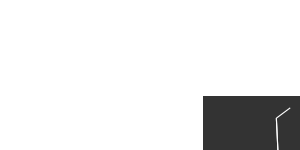

In [15]:
print('be6:')
print(At_cs[10], At_cs[14],At_cs[17], '', '--->','', At_cs[10]+At_cs[14]+At_cs[17])
suma_At=At_cs[10]+At_cs[14]+At_cs[17]
mean_lon=(lon_stop[10]+lon_stop[14]+lon_stop[17])/3.
mean_lat=(lat_stop[10]+lat_stop[14]+lat_stop[17])/3.
print('')

print('ce6,cce6:')
print(At_cs[5])
print('')

print('je6:')
print(At_cs[7])
print('')

print('me6:')
print(At_cs[3])
print('')

print('xe6:')
print(At_cs[20])
print('')

accions_e6=['Be6','Ce6+CCe6','Je6','Me6','Xe6']
colors_e6=['red', 'seagreen','m', 'darkorange','darkblue']
temps_accions_e6=[suma_At,At_cs[5],At_cs[7],At_cs[3],At_cs[20]]
lon_accions_e6=[mean_lon,lon_stop[5],lon_stop[7],lon_stop[3],lon_stop[20]]
lat_accions_e6=[mean_lat,lat_stop[5],lat_stop[7],lat_stop[3],lat_stop[20]]

max_temps_accions_e6=max(temps_accions_e6)
new_temps_accions_e6=[]
for j in range(len(temps_accions_e6)):
    new_temps_accions_e6.append(temps_accions_e6[j]/max_temps_accions_e6)

new_temps_accions_e6_2=[]
for i in range(len(temps_accions_e6)):
    new_temps_accions_e6_2.append(100*new_temps_accions_e6[i])

    
from shapely.geometry import Point, LineString, Polygon
fig, ax = map_network2(2.2793534239822613, 41.60640928402908, 2.283956227147247,41.60640126017562,  
                       2.2837951863375023,41.60189263168001,  2.2792784442191962, 41.60145135138418)

plt.scatter(lon_accions_e6,lat_accions_e6,c='yellow',s=new_temps_accions_e6_2)
plt.scatter(lon_accions_e6,lat_accions_e6,c=colors_e6,s=1)

bbox_args = dict(boxstyle='square',facecolor='white', edgecolor='k',alpha=0.8)
arrowprops=dict(arrowstyle = '->', connectionstyle='arc3,rad=0',color='white')
for iii in range(len(lon_accions_e6)):
    plt.annotate(str(int(temps_accions_e6[iii]))+ 's'+' '+accions_e6[iii], (lon_accions_e6[iii], lat_accions_e6[iii]),c=colors_e6[iii],size=5,
                 bbox=bbox_args,arrowprops=arrowprops, xytext=(-20, 18),textcoords='offset points')

    
    
#plt.savefig('e6_durada_accions.eps')

plt.show()

## 3.7- GRUP E7

C:\Users\josep\anaconda3\envs\ox\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


GRUP E7
Nombre total daturades: 32
Temps total daturada: 3178.0 s
Temps promig daturada: 99.3125
[13.0, 13.0, 340.0, 10.0, 30.0, 135.0, 39.0, 412.0, 28.0, 11.0, 33.0, 459.0, 12.0, 22.0, 11.0, 15.0, 12.0, 10.0, 1006.0, 59.0, 12.0, 57.0, 266.0, 12.0, 10.0, 18.0, 10.0, 29.0, 56.0, 16.0, 12.0, 10.0]




<IPython.core.display.Javascript object>


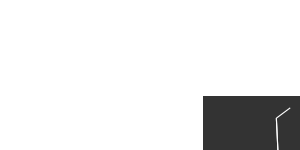

In [16]:
from gpxcsv import gpxtolist
import pandas as pd
import networkx as nx
import osmnx as ox


import matplotlib.pyplot as plt
import numpy as np
import glob
import os
from math import sin, cos, sqrt, atan2, radians
from mpl_toolkits.axes_grid1.inset_locator import inset_axes
from folium import Map
from folium.plugins import HeatMap, HeatMapWithTime
import utm
from matplotlib.animation import FuncAnimation
import matplotlib.animation as animation
from scipy.stats import gaussian_kde
from shapely.geometry import Point, LineString, Polygon
import folium

%matplotlib notebook
#%matplotlib inline
ox.config(use_cache=True, log_console=True)
ox.__version__


df = pd.read_csv('e7.csv') 
print('GRUP E7')
lat=df['lat'].tolist()
lon=df['lon'].tolist()

t=df['At'].tolist()

stops=df['stops']

At_cs=[]

lat_stop=[]
lon_stop=[]

i=0
while i < len(stops):

    if stops[i]=='flight':
        i=i+1

    else:
        s=0
        stopss=[]
        while stops[i+s]=='stop':
            stopss.append(t[i+s])
            s=s+1

        At_c=sum(stopss)
        At_cs.append(At_c)

        lat_stop.append(lat[i])
        lon_stop.append(lon[i])


        i=i+s

print('Nombre total daturades:', len(At_cs))
print('Temps total daturada:', sum(At_cs),'s')
mean_temps=sum(At_cs)/len(At_cs)
print('Temps promig daturada:', sum(At_cs)/len(At_cs))
print(At_cs)
print('')
print('')


from shapely.geometry import Point, LineString, Polygon
fig, ax = map_network2(2.2793534239822613, 41.60640928402908, 2.283956227147247,41.60640126017562,  
                       2.2837951863375023,41.60189263168001,  2.2792784442191962, 41.60145135138418)  # Create the graph from a given latitude and longitude




from turfpy.measurement import boolean_point_in_polygon
from geojson import Point, Polygon, Feature

max_At=max(At_cs)
new_At_cs=[]
for j in range(len(At_cs)):
    new_At_cs.append(At_cs[j]/max_At)

new_At_cs2=[]
for i in range(len(lon_stop)):
    new_At_cs2.append(100*new_At_cs[i])


je7=[41.60334, 2.28165]
xe7=[41.60277, 2.28232]
be7=[41.60382, 2.2819]
be7_2=[41.60334, 2.28164]
me7=[41.60385, 2.28188]
ce7=[41.60359, 2.28222]
cce7=[41.6036, 2.28225]

lon_accions=[je7[1], xe7[1], be7[1], be7_2[1], me7[1], ce7[1], cce7[1]]
lat_accions=[je7[0], xe7[0], be7[0], be7_2[0], me7[0], ce7[0], cce7[0]]

plt.plot(je7[1],je7[0],'*',c='magenta',markersize=10)
plt.plot(xe7[1],xe7[0],'*',c='magenta',markersize=10)
plt.plot(be7[1],be7[0],'*',c='magenta',markersize=10)
plt.plot(be7_2[1],be7_2[0],'*',c='magenta',markersize=10)
plt.plot(me7[1],me7[0],'*',c='magenta',markersize=10)
plt.plot(ce7[1],ce7[0],'*',c='magenta',markersize=10)
plt.plot(cce7[1],cce7[0],'*',c='magenta',markersize=10)

list_accions=['je7','xe7','be7','be7_2','me7','ce7','cce7']

plt.scatter(lon_stop,lat_stop,c='yellow',s=new_At_cs2)
plt.scatter(lon_stop,lat_stop,c='grey',s=1)

bbox_args = dict(boxstyle='square',facecolor='white', edgecolor='k',alpha=0.7)
arrowprops=dict(arrowstyle = '->', connectionstyle='arc3,rad=0',color='white')
for iii in range(len(lon_stop)):
    if At_cs[iii]>9:
        plt.annotate(str(int(At_cs[iii]))+ 's', (lon_stop[iii], lat_stop[iii]),c='green',size=5,
                     bbox=bbox_args,arrowprops=arrowprops, xytext=(-20, 18),textcoords='offset points')


bbox_args2 = dict(boxstyle='square',facecolor='grey', edgecolor='k',alpha=0.7)
arrowprops2=dict(arrowstyle = '->', connectionstyle='arc3,rad=0',color='white')
for iiii in range(len(list_accions)):
    plt.annotate(list_accions[iiii], (lon_accions[iiii], lat_accions[iiii]),c='red',size=8,
                     bbox=bbox_args2,arrowprops=arrowprops2, xytext=(-20, 18),textcoords='offset points')    
    

At_cs_names=[]
for i in range(len(At_cs)):
    At_cs_names.append(str(At_cs[i])+'s')

names=np.array(At_cs_names)


#annot = ax.annotate("", xy=(0,0), xytext=(20,20),textcoords="offset points",
            #bbox=dict(boxstyle="round", fc="w"),
            #arrowprops=dict(arrowstyle="->", color='white'),fontsize='large')
#annot.set_visible(False)

def update_annot(ind):

    pos = sc.get_offsets()[ind["ind"][0]]
    annot.xy = pos
#text = "{}, {}".format(" ".join(list(map(str,ind["ind"]))), 
                   #" ".join([names[n] for n in ind["ind"]]))

    text = "{}".format(" ".join([names[n] for n in ind["ind"]]))
    annot.set_text(text)
    #annot.get_bbox_patch().set_facecolor(cmap(norm(c[ind["ind"][0]])))
    annot.get_bbox_patch().set_facecolor('limegreen')
    annot.get_bbox_patch().set_alpha(0.7)


def hover(event):
    vis = annot.get_visible()
    if event.inaxes == ax:
        cont, ind = sc.contains(event)
        if cont:
            update_annot(ind)
            annot.set_visible(True)
            fig.canvas.draw_idle()
        else:
            if vis:
                annot.set_visible(False)
                fig.canvas.draw_idle()

#fig.canvas.mpl_connect("motion_notify_event", hover)


#plt.savefig(grupss[tt]+'_stops_duration'+'.eps')
plt.show()



    


C:\Users\josep\anaconda3\envs\ox\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


xe7:
33.0 459.0  --->  492.0

je7, be7:
340.0 10.0 30.0 135.0 412.0  --->  927.0

ce7, cce7:
1006.0 59.0  --->  1065.0

me7, be7:
266.0 56.0  --->  322.0



<IPython.core.display.Javascript object>


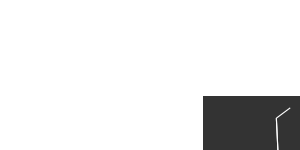

In [17]:
print('xe7:')
print(At_cs[10], At_cs[11], '', '--->','', At_cs[10]+At_cs[11])
suma_At=At_cs[10]+At_cs[11]
mean_lon=(lon_stop[10]+lon_stop[11])/2.
mean_lat=(lat_stop[10]+lat_stop[11])/2.
print('')

print('je7, be7:')
print(At_cs[2], At_cs[3],At_cs[4],At_cs[5],At_cs[7], '', '--->','', At_cs[2]+At_cs[3]+At_cs[4]+At_cs[5]+At_cs[7])
suma_At2=At_cs[2]+At_cs[3]+At_cs[4]+At_cs[5]+At_cs[7]
mean_lon2=(lon_stop[2]+lon_stop[3]+lon_stop[4]+lon_stop[5]+lon_stop[7])/5.
mean_lat2=(lat_stop[2]+lat_stop[3]+lat_stop[4]+lat_stop[5]+lat_stop[7])/5.
print('')

print('ce7, cce7:')
print(At_cs[18], At_cs[19], '', '--->','', At_cs[18]+At_cs[19])
suma_At3=At_cs[18]+At_cs[19]
mean_lon3=(lon_stop[18]+lon_stop[19])/2.
mean_lat3=(lat_stop[18]+lat_stop[19])/2.
print('')

print('me7, be7:')
print(At_cs[22], At_cs[28], '', '--->','', At_cs[22]+At_cs[28])
suma_At4=At_cs[22]+At_cs[28]
mean_lon4=(lon_stop[22]+lon_stop[28])/2.
mean_lat4=(lat_stop[22]+lat_stop[28])/2.
print('')

accions_e7=['Xe7','Je7+Be7','Ce7+CCe7','Me7+Be7']
colors_e7=['darkblue','m', 'seagreen','red']
temps_accions_e7=[suma_At,suma_At2,suma_At3,suma_At4]
lon_accions_e7=[mean_lon,mean_lon2,mean_lon3,mean_lon4]
lat_accions_e7=[mean_lat,mean_lat2,mean_lat3,mean_lat4]

max_temps_accions_e7=max(temps_accions_e7)
new_temps_accions_e7=[]
for j in range(len(temps_accions_e7)):
    new_temps_accions_e7.append(temps_accions_e7[j]/max_temps_accions_e7)

new_temps_accions_e7_2=[]
for i in range(len(temps_accions_e7)):
    new_temps_accions_e7_2.append(100*new_temps_accions_e7[i])

    
from shapely.geometry import Point, LineString, Polygon
fig, ax = map_network2(2.2793534239822613, 41.60640928402908, 2.283956227147247,41.60640126017562,  
                       2.2837951863375023,41.60189263168001,  2.2792784442191962, 41.60145135138418)

plt.scatter(lon_accions_e7,lat_accions_e7,c='yellow',s=new_temps_accions_e7_2)
plt.scatter(lon_accions_e7,lat_accions_e7,c=colors_e7,s=1)

bbox_args = dict(boxstyle='square',facecolor='white', edgecolor='k',alpha=0.8)
arrowprops=dict(arrowstyle = '->', connectionstyle='arc3,rad=0',color='white')
for iii in range(len(lon_accions_e7)):
    plt.annotate(str(int(temps_accions_e7[iii]))+ 's'+' '+accions_e7[iii], (lon_accions_e7[iii], lat_accions_e7[iii]),c=colors_e7[iii],size=5,
                 bbox=bbox_args,arrowprops=arrowprops, xytext=(-20, 18),textcoords='offset points')

    
    
#plt.savefig('e7_durada_accions.eps')

plt.show()

## 3.8- GRUP P1

C:\Users\josep\anaconda3\envs\ox\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


GRUP P1
Nombre total daturades: 16
Temps total daturada: 4712.0 s
Temps promig daturada: 294.5
[13.0, 20.0, 39.0, 15.0, 483.0, 15.0, 14.0, 496.0, 126.0, 1887.0, 138.0, 231.0, 1057.0, 13.0, 10.0, 155.0]




<IPython.core.display.Javascript object>


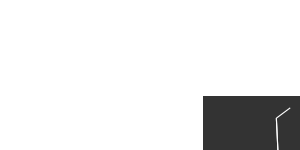

In [18]:
from gpxcsv import gpxtolist
import pandas as pd
import networkx as nx
import osmnx as ox


import matplotlib.pyplot as plt
import numpy as np
import glob
import os
from math import sin, cos, sqrt, atan2, radians
from mpl_toolkits.axes_grid1.inset_locator import inset_axes
from folium import Map
from folium.plugins import HeatMap, HeatMapWithTime
import utm
from matplotlib.animation import FuncAnimation
import matplotlib.animation as animation
from scipy.stats import gaussian_kde
from shapely.geometry import Point, LineString, Polygon
import folium

%matplotlib notebook
#%matplotlib inline
ox.config(use_cache=True, log_console=True)
ox.__version__


df = pd.read_csv('p1.csv') 
print('GRUP P1')
lat=df['lat'].tolist()
lon=df['lon'].tolist()

t=df['At'].tolist()

stops=df['stops']

At_cs=[]

lat_stop=[]
lon_stop=[]

i=0
while i < len(stops):

    if stops[i]=='flight':
        i=i+1

    else:
        s=0
        stopss=[]
        while stops[i+s]=='stop':
            stopss.append(t[i+s])
            s=s+1

        At_c=sum(stopss)
        At_cs.append(At_c)

        lat_stop.append(lat[i])
        lon_stop.append(lon[i])


        i=i+s

print('Nombre total daturades:', len(At_cs))
print('Temps total daturada:', sum(At_cs),'s')
mean_temps=sum(At_cs)/len(At_cs)
print('Temps promig daturada:', sum(At_cs)/len(At_cs))
print(At_cs)
print('')
print('')


from shapely.geometry import Point, LineString, Polygon
fig, ax = map_network2(2.2793534239822613, 41.60640928402908, 2.283956227147247,41.60640126017562,  
                       2.2837951863375023,41.60189263168001,  2.2792784442191962, 41.60145135138418)  # Create the graph from a given latitude and longitude




from turfpy.measurement import boolean_point_in_polygon
from geojson import Point, Polygon, Feature

max_At=max(At_cs)
new_At_cs=[]
for j in range(len(At_cs)):
    new_At_cs.append(At_cs[j]/max_At)

new_At_cs2=[]
for i in range(len(lon_stop)):
    new_At_cs2.append(100*new_At_cs[i])


jp1=[41.60395, 2.28156]
xp1=[41.60401, 2.28049]
bp1=[41.60283, 2.28124]
jp1_2=[41.6042, 2.28263]
mp1=[41.60404, 2.28052]

lon_accions=[jp1[1], xp1[1], bp1[1], jp1_2[1], mp1[1]]
lat_accions=[jp1[0], xp1[0], bp1[0], jp1_2[0], mp1[0]]

plt.plot(jp1[1],jp1[0],'*',c='magenta',markersize=10)
plt.plot(xp1[1],xp1[0],'*',c='magenta',markersize=10)
plt.plot(bp1[1],bp1[0],'*',c='magenta',markersize=10)
plt.plot(mp1[1],mp1[0],'*',c='magenta',markersize=10)


list_accions=['jp1','xp1','bp1','jp1_2','mp1']

plt.scatter(lon_stop,lat_stop,c='yellow',s=new_At_cs2)
plt.scatter(lon_stop,lat_stop,c='grey',s=1)

bbox_args = dict(boxstyle='square',facecolor='white', edgecolor='k',alpha=0.7)
arrowprops=dict(arrowstyle = '->', connectionstyle='arc3,rad=0',color='white')
for iii in range(len(lon_stop)):
    if At_cs[iii]>9:
        plt.annotate(str(int(At_cs[iii]))+ 's', (lon_stop[iii], lat_stop[iii]),c='green',size=8,
                     bbox=bbox_args,arrowprops=arrowprops, xytext=(-20, 18),textcoords='offset points')


bbox_args2 = dict(boxstyle='square',facecolor='grey', edgecolor='k',alpha=0.7)
arrowprops2=dict(arrowstyle = '->', connectionstyle='arc3,rad=0',color='white')
for iiii in range(len(list_accions)):
    plt.annotate(list_accions[iiii], (lon_accions[iiii], lat_accions[iiii]),c='red',size=8,
                     bbox=bbox_args2,arrowprops=arrowprops2, xytext=(-20, 18),textcoords='offset points')    
    

At_cs_names=[]
for i in range(len(At_cs)):
    At_cs_names.append(str(At_cs[i])+'s')

names=np.array(At_cs_names)


#annot = ax.annotate("", xy=(0,0), xytext=(20,20),textcoords="offset points",
            #bbox=dict(boxstyle="round", fc="w"),
            #arrowprops=dict(arrowstyle="->", color='white'),fontsize='large')
#annot.set_visible(False)

def update_annot(ind):

    pos = sc.get_offsets()[ind["ind"][0]]
    annot.xy = pos
#text = "{}, {}".format(" ".join(list(map(str,ind["ind"]))), 
                   #" ".join([names[n] for n in ind["ind"]]))

    text = "{}".format(" ".join([names[n] for n in ind["ind"]]))
    annot.set_text(text)
    #annot.get_bbox_patch().set_facecolor(cmap(norm(c[ind["ind"][0]])))
    annot.get_bbox_patch().set_facecolor('limegreen')
    annot.get_bbox_patch().set_alpha(0.7)


def hover(event):
    vis = annot.get_visible()
    if event.inaxes == ax:
        cont, ind = sc.contains(event)
        if cont:
            update_annot(ind)
            annot.set_visible(True)
            fig.canvas.draw_idle()
        else:
            if vis:
                annot.set_visible(False)
                fig.canvas.draw_idle()

#fig.canvas.mpl_connect("motion_notify_event", hover)


#plt.savefig(grupss[tt]+'_stops_duration'+'.eps')
plt.show()



    


C:\Users\josep\anaconda3\envs\ox\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


bp1:
20.0 39.0 15.0 483.0  --->  557.0

xp1, mp1:
15.0 14.0 496.0  --->  525.0

jp1:
126.0 1887.0 138.0  --->  2151.0

jp1:
231.0


<IPython.core.display.Javascript object>


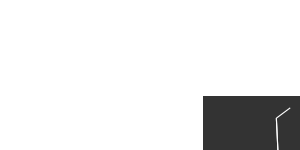

In [19]:
print('bp1:')
print(At_cs[1], At_cs[2],At_cs[3],At_cs[4], '', '--->','', At_cs[1]+At_cs[2]+At_cs[3]+At_cs[4])
suma_At=At_cs[1]+At_cs[2]+At_cs[3]+At_cs[4]
mean_lon=(lon_stop[1]+lon_stop[2]+lon_stop[3]+lon_stop[4])/4.
mean_lat=(lat_stop[1]+lat_stop[2]+lat_stop[3]+lat_stop[4])/4.
print('')

print('xp1, mp1:')
print(At_cs[5], At_cs[6],At_cs[7], '', '--->','', At_cs[5]+At_cs[6]+At_cs[7])
suma_At2=At_cs[5]+At_cs[6]+At_cs[7]
mean_lon2=(lon_stop[5]+lon_stop[6]+lon_stop[7])/3.
mean_lat2=(lat_stop[5]+lat_stop[6]+lat_stop[7])/3.
print('')

print('jp1:')
print(At_cs[8], At_cs[9],At_cs[10], '', '--->','', At_cs[8]+At_cs[9]+At_cs[10])
suma_At3=At_cs[8]+At_cs[9]+At_cs[10]
mean_lon3=(lon_stop[8]+lon_stop[9]+lon_stop[10])/3.
mean_lat3=(lat_stop[8]+lat_stop[9]+lat_stop[10])/3.
print('')

print('jp1:')
print(At_cs[11])

accions_p1=['Bp1', 'Xp1+Mp1', 'Jp1', 'Jp1']
colors_p1=['red', 'darkblue','m','m']
temps_accions_p1=[suma_At,suma_At2,suma_At3,At_cs[11]]
lon_accions_p1=[mean_lon,mean_lon2,mean_lon3,lon_stop[11]]
lat_accions_p1=[mean_lat,mean_lat2,mean_lat3,lat_stop[11]]

max_temps_accions_p1=max(temps_accions_p1)
new_temps_accions_p1=[]
for j in range(len(temps_accions_p1)):
    new_temps_accions_p1.append(temps_accions_p1[j]/max_temps_accions_p1)

new_temps_accions_p1_2=[]
for i in range(len(temps_accions_p1)):
    new_temps_accions_p1_2.append(100*new_temps_accions_p1[i])

    
from shapely.geometry import Point, LineString, Polygon
fig, ax = map_network2(2.2793534239822613, 41.60640928402908, 2.283956227147247,41.60640126017562,  
                       2.2837951863375023,41.60189263168001,  2.2792784442191962, 41.60145135138418)

plt.scatter(lon_accions_p1,lat_accions_p1,c='yellow',s=new_temps_accions_p1_2)
plt.scatter(lon_accions_p1,lat_accions_p1,c=colors_p1,s=1)

bbox_args = dict(boxstyle='square',facecolor='white', edgecolor='k',alpha=0.8)
arrowprops=dict(arrowstyle = '->', connectionstyle='arc3,rad=0',color='white')
for iii in range(len(lon_accions_p1)):
    plt.annotate(str(int(temps_accions_p1[iii]))+ 's'+' '+accions_p1[iii], (lon_accions_p1[iii], lat_accions_p1[iii]),c=colors_p1[iii],size=5,
                 bbox=bbox_args,arrowprops=arrowprops, xytext=(-20, 18),textcoords='offset points')

      
#plt.savefig('p1_durada_accions.eps')

plt.show()  


## 3.9- GRUP P2

C:\Users\josep\anaconda3\envs\ox\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


GRUP P2
Nombre total daturades: 17
Temps total daturada: 3051.0 s
Temps promig daturada: 179.47058823529412
[12.0, 12.0, 255.0, 43.0, 13.0, 308.0, 13.0, 398.0, 200.0, 113.0, 69.0, 10.0, 1199.0, 41.0, 17.0, 300.0, 48.0]




<IPython.core.display.Javascript object>


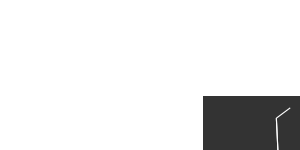

In [20]:
from gpxcsv import gpxtolist
import pandas as pd
import networkx as nx
import osmnx as ox


import matplotlib.pyplot as plt
import numpy as np
import glob
import os
from math import sin, cos, sqrt, atan2, radians
from mpl_toolkits.axes_grid1.inset_locator import inset_axes
from folium import Map
from folium.plugins import HeatMap, HeatMapWithTime
import utm
from matplotlib.animation import FuncAnimation
import matplotlib.animation as animation
from scipy.stats import gaussian_kde
from shapely.geometry import Point, LineString, Polygon
import folium

%matplotlib notebook
#%matplotlib inline
ox.config(use_cache=True, log_console=True)
ox.__version__


df = pd.read_csv('p2.csv') 
print('GRUP P2')
lat=df['lat'].tolist()
lon=df['lon'].tolist()

t=df['At'].tolist()

stops=df['stops']

At_cs=[]

lat_stop=[]
lon_stop=[]

i=0
while i < len(stops):

    if stops[i]=='flight':
        i=i+1

    else:
        s=0
        stopss=[]
        while stops[i+s]=='stop':
            stopss.append(t[i+s])
            s=s+1

        At_c=sum(stopss)
        At_cs.append(At_c)

        lat_stop.append(lat[i])
        lon_stop.append(lon[i])


        i=i+s

print('Nombre total daturades:', len(At_cs))
print('Temps total daturada:', sum(At_cs),'s')
mean_temps=sum(At_cs)/len(At_cs)
print('Temps promig daturada:', sum(At_cs)/len(At_cs))
print(At_cs)
print('')
print('')


from shapely.geometry import Point, LineString, Polygon
fig, ax = map_network2(2.2793534239822613, 41.60640928402908, 2.283956227147247,41.60640126017562,  
                       2.2837951863375023,41.60189263168001,  2.2792784442191962, 41.60145135138418)  # Create the graph from a given latitude and longitude




from turfpy.measurement import boolean_point_in_polygon
from geojson import Point, Polygon, Feature

max_At=max(At_cs)
new_At_cs=[]
for j in range(len(At_cs)):
    new_At_cs.append(At_cs[j]/max_At)

new_At_cs2=[]
for i in range(len(lon_stop)):
    new_At_cs2.append(100*new_At_cs[i])


jp2=[41.60329, 2.28165]
xp2=[41.6036, 2.28261]
bp2=[41.60277, 2.28174]
mp2=[41.6027, 2.28081]
cp2=[41.60416, 2.28051]
ccp2=[41.60416, 2.28054]

lon_accions=[jp2[1], xp2[1], bp2[1], mp2[1], cp2[1], ccp2[1]]
lat_accions=[jp2[0], xp2[0], bp2[0], mp2[0], cp2[0], ccp2[0]]

plt.plot(jp2[1],jp2[0],'*',c='magenta',markersize=10)
plt.plot(xp2[1],xp2[0],'*',c='magenta',markersize=10)
plt.plot(bp2[1],bp2[0],'*',c='magenta',markersize=10)
plt.plot(mp2[1],mp2[0],'*',c='magenta',markersize=10)
plt.plot(cp2[1],cp2[0],'*',c='magenta',markersize=10)
plt.plot(ccp2[1],ccp2[0],'*',c='magenta',markersize=10)

list_accions=['jp2','xp2','bp2','mp2','cp2','ccp2']

plt.scatter(lon_stop,lat_stop,c='yellow',s=new_At_cs2)
plt.scatter(lon_stop,lat_stop,c='grey',s=1)

bbox_args = dict(boxstyle='square',facecolor='white', edgecolor='k',alpha=0.7)
arrowprops=dict(arrowstyle = '->', connectionstyle='arc3,rad=0',color='white')
for iii in range(len(lon_stop)):
    if At_cs[iii]>9:
        plt.annotate(str(int(At_cs[iii]))+ 's', (lon_stop[iii], lat_stop[iii]),c='green',size=8,
                     bbox=bbox_args,arrowprops=arrowprops, xytext=(-20, 18),textcoords='offset points')


bbox_args2 = dict(boxstyle='square',facecolor='grey', edgecolor='k',alpha=0.7)
arrowprops2=dict(arrowstyle = '->', connectionstyle='arc3,rad=0',color='white')
for iiii in range(len(list_accions)):
    plt.annotate(list_accions[iiii], (lon_accions[iiii], lat_accions[iiii]),c='red',size=8,
                     bbox=bbox_args2,arrowprops=arrowprops2, xytext=(-20, 18),textcoords='offset points')    
    

At_cs_names=[]
for i in range(len(At_cs)):
    At_cs_names.append(str(At_cs[i])+'s')

names=np.array(At_cs_names)


#annot = ax.annotate("", xy=(0,0), xytext=(20,20),textcoords="offset points",
            #bbox=dict(boxstyle="round", fc="w"),
            #arrowprops=dict(arrowstyle="->", color='white'),fontsize='large')
#annot.set_visible(False)

def update_annot(ind):

    pos = sc.get_offsets()[ind["ind"][0]]
    annot.xy = pos
#text = "{}, {}".format(" ".join(list(map(str,ind["ind"]))), 
                   #" ".join([names[n] for n in ind["ind"]]))

    text = "{}".format(" ".join([names[n] for n in ind["ind"]]))
    annot.set_text(text)
    #annot.get_bbox_patch().set_facecolor(cmap(norm(c[ind["ind"][0]])))
    annot.get_bbox_patch().set_facecolor('limegreen')
    annot.get_bbox_patch().set_alpha(0.7)


def hover(event):
    vis = annot.get_visible()
    if event.inaxes == ax:
        cont, ind = sc.contains(event)
        if cont:
            update_annot(ind)
            annot.set_visible(True)
            fig.canvas.draw_idle()
        else:
            if vis:
                annot.set_visible(False)
                fig.canvas.draw_idle()

#fig.canvas.mpl_connect("motion_notify_event", hover)


#plt.savefig(grupss[tt]+'_stops_duration'+'.eps')
plt.show()



    


C:\Users\josep\anaconda3\envs\ox\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


mp2:
17.0 300.0  --->  317.0

bp2:
308.0

xp2:
200.0

cp2, ccp2:
1199.0 41.0  --->  1240.0

jp2:
113.0


<IPython.core.display.Javascript object>


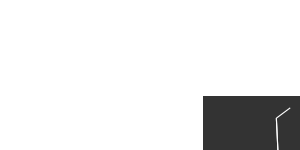

In [21]:
print('mp2:')
print(At_cs[14], At_cs[15], '', '--->','', At_cs[14]+At_cs[15])
suma_At=At_cs[14]+At_cs[15]
mean_lon=(lon_stop[14]+lon_stop[15])/2.
mean_lat=(lat_stop[14]+lat_stop[15])/2.
print('')

print('bp2:')
print(At_cs[5])
print('')

print('xp2:')
print(At_cs[8])
print('')

print('cp2, ccp2:')
print(At_cs[12], At_cs[13], '', '--->','', At_cs[12]+At_cs[13])
suma_At2=At_cs[12]+At_cs[13]
mean_lon2=(lon_stop[12]+lon_stop[13])/2.
mean_lat2=(lat_stop[12]+lat_stop[13])/2.
print('')

print('jp2:')
print(At_cs[9])

accions_p2=['Mp2', 'Bp2', 'Xp2', 'Cp2+CCp2', 'Jp2']
colors_p2=['darkorange','red','darkblue','seagreen','m']

temps_accions_p2=[suma_At,At_cs[5],At_cs[8],suma_At2,At_cs[9]]
lon_accions_p2=[mean_lon,lon_stop[5],lon_stop[8],mean_lon2,lon_stop[9]]
lat_accions_p2=[mean_lat,lat_stop[5],lat_stop[8],mean_lat2,lat_stop[9]]

max_temps_accions_p2=max(temps_accions_p2)
new_temps_accions_p2=[]
for j in range(len(temps_accions_p2)):
    new_temps_accions_p2.append(temps_accions_p2[j]/max_temps_accions_p2)

new_temps_accions_p2_2=[]
for i in range(len(temps_accions_p2)):
    new_temps_accions_p2_2.append(100*new_temps_accions_p2[i])

    
from shapely.geometry import Point, LineString, Polygon
fig, ax = map_network2(2.2793534239822613, 41.60640928402908, 2.283956227147247,41.60640126017562,  
                       2.2837951863375023,41.60189263168001,  2.2792784442191962, 41.60145135138418)

plt.scatter(lon_accions_p2,lat_accions_p2,c='yellow',s=new_temps_accions_p2_2)
plt.scatter(lon_accions_p2,lat_accions_p2,c=colors_p2,s=1)

bbox_args = dict(boxstyle='square',facecolor='white', edgecolor='k',alpha=0.8)
arrowprops=dict(arrowstyle = '->', connectionstyle='arc3,rad=0',color='white')
for iii in range(len(lon_accions_p2)):
    plt.annotate(str(int(temps_accions_p2[iii]))+ 's'+' '+accions_p2[iii], (lon_accions_p2[iii], lat_accions_p2[iii]),c=colors_p2[iii],size=5,
                 bbox=bbox_args,arrowprops=arrowprops, xytext=(-20, 18),textcoords='offset points')

      
#plt.savefig('p2_durada_accions.eps')

plt.show()  


##  3.10- GRUP P3

C:\Users\josep\anaconda3\envs\ox\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


GRUP P3


<IPython.core.display.Javascript object>


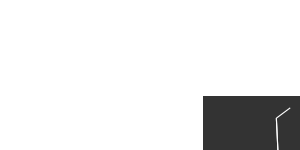

In [22]:
from gpxcsv import gpxtolist
import pandas as pd
import networkx as nx
import osmnx as ox


import matplotlib.pyplot as plt
import numpy as np
import glob
import os
from math import sin, cos, sqrt, atan2, radians
from mpl_toolkits.axes_grid1.inset_locator import inset_axes
from folium import Map
from folium.plugins import HeatMap, HeatMapWithTime
import utm
from matplotlib.animation import FuncAnimation
import matplotlib.animation as animation
from scipy.stats import gaussian_kde
from shapely.geometry import Point, LineString, Polygon
import folium

%matplotlib notebook
#%matplotlib inline
ox.config(use_cache=True, log_console=True)
ox.__version__



print('GRUP P3')



from shapely.geometry import Point, LineString, Polygon
fig, ax = map_network2(2.2793534239822613, 41.60640928402908, 2.283956227147247,41.60640126017562,  
                       2.2837951863375023,41.60189263168001,  2.2792784442191962, 41.60145135138418)  # Create the graph from a given latitude and longitude




from turfpy.measurement import boolean_point_in_polygon
from geojson import Point, Polygon, Feature



jp3=[41.60496, 2.28073]
xp3=[41.60432, 2.28134]
bp3=[41.60402, 2.28082]
mp3=[41.60498, 2.28072]
cp3=[41.60448, 2.2807]
ccp3=[41.6045, 2.28075]

lon_accions=[jp3[1], xp3[1], bp3[1], mp3[1], cp3[1], ccp3[1]]
lat_accions=[jp3[0], xp3[0], bp3[0], mp3[0], cp3[0], ccp3[0]]

plt.plot(jp3[1],jp3[0],'*',c='magenta',markersize=10)
plt.plot(xp3[1],xp3[0],'*',c='magenta',markersize=10)
plt.plot(bp3[1],bp3[0],'*',c='magenta',markersize=10)
plt.plot(mp3[1],mp3[0],'*',c='magenta',markersize=10)
plt.plot(cp3[1],cp3[0],'*',c='magenta',markersize=10)
plt.plot(ccp3[1],ccp3[0],'*',c='magenta',markersize=10)

list_accions=['jp3','xp3','bp3','mp3','cp3','ccp3']


bbox_args2 = dict(boxstyle='square',facecolor='grey', edgecolor='k',alpha=0.7)
arrowprops2=dict(arrowstyle = '->', connectionstyle='arc3,rad=0',color='white')
for iiii in range(len(list_accions)):
    plt.annotate(list_accions[iiii], (lon_accions[iiii], lat_accions[iiii]),c='red',size=8,
                     bbox=bbox_args2,arrowprops=arrowprops2, xytext=(-20, 18),textcoords='offset points')    
    


#annot = ax.annotate("", xy=(0,0), xytext=(20,20),textcoords="offset points",
            #bbox=dict(boxstyle="round", fc="w"),
            #arrowprops=dict(arrowstyle="->", color='white'),fontsize='large')
#annot.set_visible(False)

def update_annot(ind):

    pos = sc.get_offsets()[ind["ind"][0]]
    annot.xy = pos
#text = "{}, {}".format(" ".join(list(map(str,ind["ind"]))), 
                   #" ".join([names[n] for n in ind["ind"]]))

    text = "{}".format(" ".join([names[n] for n in ind["ind"]]))
    annot.set_text(text)
    #annot.get_bbox_patch().set_facecolor(cmap(norm(c[ind["ind"][0]])))
    annot.get_bbox_patch().set_facecolor('limegreen')
    annot.get_bbox_patch().set_alpha(0.7)


def hover(event):
    vis = annot.get_visible()
    if event.inaxes == ax:
        cont, ind = sc.contains(event)
        if cont:
            update_annot(ind)
            annot.set_visible(True)
            fig.canvas.draw_idle()
        else:
            if vis:
                annot.set_visible(False)
                fig.canvas.draw_idle()

#fig.canvas.mpl_connect("motion_notify_event", hover)


#plt.savefig(grupss[tt]+'_stops_duration'+'.eps')
plt.show()



    


C:\Users\josep\anaconda3\envs\ox\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


cp3, ccp3:
120

mp3, jp3:
1060

xp3:
330

bp3:
166



<IPython.core.display.Javascript object>


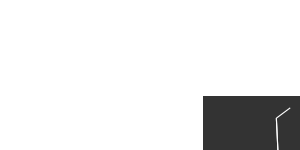

In [23]:
print('cp3, ccp3:')
print(120)
print('')

print('mp3, jp3:')
print(1060)
print('')

print('xp3:')
print(330)
print('')

print('bp3:')
print(166)
print('')

accions_p3=['Cp3+CCp3', 'Mp3+Jp3', 'Xp3', 'Bp3']
colors_p3=['seagreen', 'm', 'darkblue', 'red']

lon_accions=[jp3[1], xp3[1], bp3[1], mp3[1], cp3[1], ccp3[1]]
lat_accions=[jp3[0], xp3[0], bp3[0], mp3[0], cp3[0], ccp3[0]]

temps_accions_p3=[120, 1060, 330, 166]
lon_accions_p3=[cp3[1],mp3[1],xp3[1],bp3[1]]
lat_accions_p3=[cp3[0],mp3[0],xp3[0],bp3[0]]

max_temps_accions_p3=max(temps_accions_p3)
new_temps_accions_p3=[]
for j in range(len(temps_accions_p3)):
    new_temps_accions_p3.append(temps_accions_p3[j]/max_temps_accions_p3)

new_temps_accions_p3_2=[]
for i in range(len(temps_accions_p3)):
    new_temps_accions_p3_2.append(100*new_temps_accions_p3[i])

    
from shapely.geometry import Point, LineString, Polygon
fig, ax = map_network2(2.2793534239822613, 41.60640928402908, 2.283956227147247,41.60640126017562,  
                       2.2837951863375023,41.60189263168001,  2.2792784442191962, 41.60145135138418)

plt.scatter(lon_accions_p3,lat_accions_p3,c='yellow',s=new_temps_accions_p3_2)
plt.scatter(lon_accions_p3,lat_accions_p3,c=colors_p3,s=1)

bbox_args = dict(boxstyle='square',facecolor='white', edgecolor='k',alpha=0.8)
arrowprops=dict(arrowstyle = '->', connectionstyle='arc3,rad=0',color='white')
for iii in range(len(lon_accions_p3)):
    plt.annotate(str(int(temps_accions_p3[iii]))+ 's'+' '+accions_p3[iii], (lon_accions_p3[iii], lat_accions_p3[iii]),c=colors_p3[iii],size=5,
                 bbox=bbox_args,arrowprops=arrowprops, xytext=(-20, 18),textcoords='offset points')

     
#plt.savefig('p3_durada_accions.eps')

plt.show()   


## 3.11- GRUP P4

C:\Users\josep\anaconda3\envs\ox\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


GRUP P4
Nombre total daturades: 17
Temps total daturada: 3375.0 s
Temps promig daturada: 198.52941176470588
[118.0, 18.0, 15.0, 233.0, 25.0, 21.0, 361.0, 122.0, 1811.0, 64.0, 20.0, 11.0, 28.0, 197.0, 155.0, 140.0, 36.0]




<IPython.core.display.Javascript object>


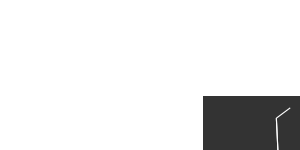

In [24]:
from gpxcsv import gpxtolist
import pandas as pd
import networkx as nx
import osmnx as ox


import matplotlib.pyplot as plt
import numpy as np
import glob
import os
from math import sin, cos, sqrt, atan2, radians
from mpl_toolkits.axes_grid1.inset_locator import inset_axes
from folium import Map
from folium.plugins import HeatMap, HeatMapWithTime
import utm
from matplotlib.animation import FuncAnimation
import matplotlib.animation as animation
from scipy.stats import gaussian_kde
from shapely.geometry import Point, LineString, Polygon
import folium

%matplotlib notebook
#%matplotlib inline
ox.config(use_cache=True, log_console=True)
ox.__version__


df = pd.read_csv('p4.csv') 
print('GRUP P4')
lat=df['lat'].tolist()
lon=df['lon'].tolist()

t=df['At'].tolist()

stops=df['stops']

At_cs=[]

lat_stop=[]
lon_stop=[]

i=0
while i < len(stops):

    if stops[i]=='flight':
        i=i+1

    else:
        s=0
        stopss=[]
        while stops[i+s]=='stop':
            stopss.append(t[i+s])
            s=s+1

        At_c=sum(stopss)
        At_cs.append(At_c)

        lat_stop.append(lat[i])
        lon_stop.append(lon[i])


        i=i+s

print('Nombre total daturades:', len(At_cs))
print('Temps total daturada:', sum(At_cs),'s')
mean_temps=sum(At_cs)/len(At_cs)
print('Temps promig daturada:', sum(At_cs)/len(At_cs))
print(At_cs)
print('')
print('')


from shapely.geometry import Point, LineString, Polygon
fig, ax = map_network2(2.2793534239822613, 41.60640928402908, 2.283956227147247,41.60640126017562,  
                       2.2837951863375023,41.60189263168001,  2.2792784442191962, 41.60145135138418)  # Create the graph from a given latitude and longitude




from turfpy.measurement import boolean_point_in_polygon
from geojson import Point, Polygon, Feature

max_At=max(At_cs)
new_At_cs=[]
for j in range(len(At_cs)):
    new_At_cs.append(At_cs[j]/max_At)

new_At_cs2=[]
for i in range(len(lon_stop)):
    new_At_cs2.append(100*new_At_cs[i])


jp4=[41.60316, 2.28209]
xp4=[41.60313, 2.28254]
bp4=[41.6042, 2.28224]
mp4=[41.60318, 2.28173]
cp4=[41.60394, 2.28164]
ccp4=[41.60392, 2.28163]

lon_accions=[jp4[1], xp4[1], bp4[1], mp4[1], cp4[1], ccp4[1]]
lat_accions=[jp4[0], xp4[0], bp4[0], mp4[0], cp4[0], ccp4[0]]

plt.plot(jp4[1],jp4[0],'*',c='magenta',markersize=10)
plt.plot(xp4[1],xp4[0],'*',c='magenta',markersize=10)
plt.plot(bp4[1],bp4[0],'*',c='magenta',markersize=10)
plt.plot(mp4[1],mp4[0],'*',c='magenta',markersize=10)
plt.plot(cp4[1],cp4[0],'*',c='magenta',markersize=10)
plt.plot(ccp4[1],ccp4[0],'*',c='magenta',markersize=10)

list_accions=['jp4','xp4','bp4','mp4','cp4','ccp4']

plt.scatter(lon_stop,lat_stop,c='yellow',s=new_At_cs2)
plt.scatter(lon_stop,lat_stop,c='grey',s=1)

bbox_args = dict(boxstyle='square',facecolor='white', edgecolor='k',alpha=0.7)
arrowprops=dict(arrowstyle = '->', connectionstyle='arc3,rad=0',color='white')
for iii in range(len(lon_stop)):
    if At_cs[iii]>9:
        plt.annotate(str(int(At_cs[iii]))+ 's', (lon_stop[iii], lat_stop[iii]),c='green',size=8,
                     bbox=bbox_args,arrowprops=arrowprops, xytext=(-20, 18),textcoords='offset points')


bbox_args2 = dict(boxstyle='square',facecolor='grey', edgecolor='k',alpha=0.7)
arrowprops2=dict(arrowstyle = '->', connectionstyle='arc3,rad=0',color='white')
for iiii in range(len(list_accions)):
    plt.annotate(list_accions[iiii], (lon_accions[iiii], lat_accions[iiii]),c='red',size=8,
                     bbox=bbox_args2,arrowprops=arrowprops2, xytext=(-20, 18),textcoords='offset points')    
    

At_cs_names=[]
for i in range(len(At_cs)):
    At_cs_names.append(str(At_cs[i])+'s')

names=np.array(At_cs_names)


#annot = ax.annotate("", xy=(0,0), xytext=(20,20),textcoords="offset points",
            #bbox=dict(boxstyle="round", fc="w"),
            #arrowprops=dict(arrowstyle="->", color='white'),fontsize='large')
#annot.set_visible(False)

def update_annot(ind):

    pos = sc.get_offsets()[ind["ind"][0]]
    annot.xy = pos
#text = "{}, {}".format(" ".join(list(map(str,ind["ind"]))), 
                   #" ".join([names[n] for n in ind["ind"]]))

    text = "{}".format(" ".join([names[n] for n in ind["ind"]]))
    annot.set_text(text)
    #annot.get_bbox_patch().set_facecolor(cmap(norm(c[ind["ind"][0]])))
    annot.get_bbox_patch().set_facecolor('limegreen')
    annot.get_bbox_patch().set_alpha(0.7)


def hover(event):
    vis = annot.get_visible()
    if event.inaxes == ax:
        cont, ind = sc.contains(event)
        if cont:
            update_annot(ind)
            annot.set_visible(True)
            fig.canvas.draw_idle()
        else:
            if vis:
                annot.set_visible(False)
                fig.canvas.draw_idle()

#fig.canvas.mpl_connect("motion_notify_event", hover)


#plt.savefig(grupss[tt]+'_stops_duration'+'.eps')
plt.show()



    


C:\Users\josep\anaconda3\envs\ox\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


cp4, ccp4:
361.0

jp4:
197.0

mp4:
1811.0

xp4:
155.0 140.0  --->  295.0

bp4:
233.0 25.0  --->  258.0



<IPython.core.display.Javascript object>


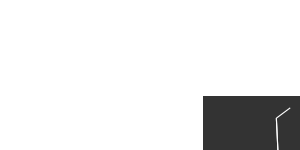

In [25]:
print('cp4, ccp4:')
print(At_cs[6])
print('')

print('jp4:')
print(At_cs[13])
print('')

print('mp4:')
print(At_cs[8])
print('')

print('xp4:')
print(At_cs[14], At_cs[15], '', '--->','', At_cs[14]+At_cs[15])
suma_At=At_cs[14]+At_cs[15]
mean_lon=(lon_stop[14]+lon_stop[15])/2.
mean_lat=(lat_stop[14]+lat_stop[15])/2.
print('')

print('bp4:')
print(At_cs[3], At_cs[4], '', '--->','', At_cs[3]+At_cs[4])
suma_At2=At_cs[3]+At_cs[4]
mean_lon2=(lon_stop[3]+lon_stop[4])/2.
mean_lat2=(lat_stop[3]+lat_stop[4])/2.
print('')

accions_p4=['Cp4+CCp4', 'Jp4', 'Mp4', 'Xp4', 'Bp4']
colors_p4=['seagreen', 'm', 'darkorange', 'darkblue', 'red']

temps_accions_p4=[At_cs[6],At_cs[13],At_cs[8],suma_At,suma_At2]
lon_accions_p4=[lon_stop[6],lon_stop[13],lon_stop[8],mean_lon,mean_lon2]
lat_accions_p4=[lat_stop[6],lat_stop[13],lat_stop[8],mean_lat,mean_lat2]

max_temps_accions_p4=max(temps_accions_p4)
new_temps_accions_p4=[]
for j in range(len(temps_accions_p4)):
    new_temps_accions_p4.append(temps_accions_p4[j]/max_temps_accions_p4)

new_temps_accions_p4_2=[]
for i in range(len(temps_accions_p4)):
    new_temps_accions_p4_2.append(100*new_temps_accions_p4[i])

    
from shapely.geometry import Point, LineString, Polygon
fig, ax = map_network2(2.2793534239822613, 41.60640928402908, 2.283956227147247,41.60640126017562,  
                       2.2837951863375023,41.60189263168001,  2.2792784442191962, 41.60145135138418)

plt.scatter(lon_accions_p4,lat_accions_p4,c='yellow',s=new_temps_accions_p4_2)
plt.scatter(lon_accions_p4,lat_accions_p4,c=colors_p4,s=1)

bbox_args = dict(boxstyle='square',facecolor='white', edgecolor='k',alpha=0.8)
arrowprops=dict(arrowstyle = '->', connectionstyle='arc3,rad=0',color='white')
for iii in range(len(lon_accions_p4)):
    plt.annotate(str(int(temps_accions_p4[iii]))+ 's'+' '+accions_p4[iii], (lon_accions_p4[iii], lat_accions_p4[iii]),c=colors_p4[iii],size=5,
                 bbox=bbox_args,arrowprops=arrowprops, xytext=(-20, 18),textcoords='offset points')

     
#plt.savefig('p4_durada_accions.eps')

plt.show()   


## 3.12- GRUP G1

C:\Users\josep\anaconda3\envs\ox\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


GRUP G1
Nombre total daturades: 36
Temps total daturada: 6571.0 s
Temps promig daturada: 182.52777777777777
[38.0, 11.0, 809.0, 59.0, 420.0, 28.0, 11.0, 14.0, 15.0, 244.0, 11.0, 71.0, 80.0, 89.0, 1334.0, 53.0, 24.0, 70.0, 239.0, 17.0, 18.0, 35.0, 66.0, 132.0, 19.0, 23.0, 16.0, 10.0, 210.0, 427.0, 12.0, 23.0, 1805.0, 81.0, 10.0, 47.0]




<IPython.core.display.Javascript object>


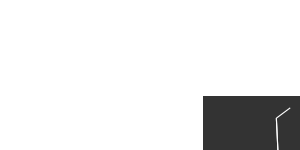

In [26]:
from gpxcsv import gpxtolist
import pandas as pd
import networkx as nx
import osmnx as ox


import matplotlib.pyplot as plt
import numpy as np
import glob
import os
from math import sin, cos, sqrt, atan2, radians
from mpl_toolkits.axes_grid1.inset_locator import inset_axes
from folium import Map
from folium.plugins import HeatMap, HeatMapWithTime
import utm
from matplotlib.animation import FuncAnimation
import matplotlib.animation as animation
from scipy.stats import gaussian_kde
from shapely.geometry import Point, LineString, Polygon
import folium

%matplotlib notebook
#%matplotlib inline
ox.config(use_cache=True, log_console=True)
ox.__version__


df = pd.read_csv('g1.csv') 
print('GRUP G1')
lat=df['lat'].tolist()
lon=df['lon'].tolist()

t=df['At'].tolist()

stops=df['stops']

At_cs=[]

lat_stop=[]
lon_stop=[]

i=0
while i < len(stops):

    if stops[i]=='flight':
        i=i+1

    else:
        s=0
        stopss=[]
        while stops[i+s]=='stop':
            stopss.append(t[i+s])
            s=s+1

        At_c=sum(stopss)
        At_cs.append(At_c)

        lat_stop.append(lat[i])
        lon_stop.append(lon[i])


        i=i+s

print('Nombre total daturades:', len(At_cs))
print('Temps total daturada:', sum(At_cs),'s')
mean_temps=sum(At_cs)/len(At_cs)
print('Temps promig daturada:', sum(At_cs)/len(At_cs))
print(At_cs)
print('')
print('')


from shapely.geometry import Point, LineString, Polygon
fig, ax = map_network2(2.2793534239822613, 41.60640928402908, 2.283956227147247,41.60640126017562,  
                       2.2837951863375023,41.60189263168001,  2.2792784442191962, 41.60145135138418)  # Create the graph from a given latitude and longitude




from turfpy.measurement import boolean_point_in_polygon
from geojson import Point, Polygon, Feature

max_At=max(At_cs)
new_At_cs=[]
for j in range(len(At_cs)):
    new_At_cs.append(At_cs[j]/max_At)

new_At_cs2=[]
for i in range(len(lon_stop)):
    new_At_cs2.append(100*new_At_cs[i])


jg1=[41.60326, 2.2817]
jg1_2=[41.60384, 2.28199]
jg1_3=[41.60425, 2.28264]
xg1=[41.60278, 2.28169]
xg1_2=[41.60565, 2.28236]
bg1=[41.60414, 2.28251]
bg1_2=[41.60426, 2.28255]
mg1=[41.60283, 2.28168]
cg1=[41.60282, 2.28167]

lon_accions=[jg1[1], jg1_2[1], jg1_3[1], xg1[1], xg1_2[1], bg1[1], bg1_2[1], mg1[1], cg1[1]]
lat_accions=[jg1[0], jg1_2[0], jg1_3[0], xg1[0], xg1_2[0], bg1[0], bg1_2[0], mg1[0], cg1[0]]

plt.plot(jg1[1],jg1[0],'*',c='magenta',markersize=10)
plt.plot(jg1_2[1],jg1_2[0],'*',c='magenta',markersize=10)
plt.plot(jg1_3[1],jg1_3[0],'*',c='magenta',markersize=10)
plt.plot(xg1[1],xg1[0],'*',c='magenta',markersize=10)
plt.plot(xg1_2[1],xg1_2[0],'*',c='magenta',markersize=10)
plt.plot(bg1[1],bg1[0],'*',c='magenta',markersize=10)
plt.plot(bg1_2[1],bg1_2[0],'*',c='magenta',markersize=10)
plt.plot(mg1[1],mg1[0],'*',c='magenta',markersize=10)
plt.plot(cg1[1],cg1[0],'*',c='magenta',markersize=10)

list_accions=['jg1','jg1_2','jg1_3','xg1','xg1_2','bg1','bg1_2','mg1','cg1']

plt.scatter(lon_stop,lat_stop,c='yellow',s=new_At_cs2)
plt.scatter(lon_stop,lat_stop,c='grey',s=1)

bbox_args = dict(boxstyle='square',facecolor='white', edgecolor='k',alpha=0.7)
arrowprops=dict(arrowstyle = '->', connectionstyle='arc3,rad=0',color='white')
for iii in range(len(lon_stop)):
    if At_cs[iii]>9:
        plt.annotate(str(int(At_cs[iii]))+ 's', (lon_stop[iii], lat_stop[iii]),c='green',size=8,
                     bbox=bbox_args,arrowprops=arrowprops, xytext=(-20, 18),textcoords='offset points')


bbox_args2 = dict(boxstyle='square',facecolor='grey', edgecolor='k',alpha=0.7)
arrowprops2=dict(arrowstyle = '->', connectionstyle='arc3,rad=0',color='white')
for iiii in range(len(list_accions)):
    plt.annotate(list_accions[iiii], (lon_accions[iiii], lat_accions[iiii]),c='red',size=8,
                     bbox=bbox_args2,arrowprops=arrowprops2, xytext=(-20, 18),textcoords='offset points')    
    

At_cs_names=[]
for i in range(len(At_cs)):
    At_cs_names.append(str(At_cs[i])+'s')

names=np.array(At_cs_names)


#annot = ax.annotate("", xy=(0,0), xytext=(20,20),textcoords="offset points",
            #bbox=dict(boxstyle="round", fc="w"),
            #arrowprops=dict(arrowstyle="->", color='white'),fontsize='large')
#annot.set_visible(False)

def update_annot(ind):

    pos = sc.get_offsets()[ind["ind"][0]]
    annot.xy = pos
#text = "{}, {}".format(" ".join(list(map(str,ind["ind"]))), 
                   #" ".join([names[n] for n in ind["ind"]]))

    text = "{}".format(" ".join([names[n] for n in ind["ind"]]))
    annot.set_text(text)
    #annot.get_bbox_patch().set_facecolor(cmap(norm(c[ind["ind"][0]])))
    annot.get_bbox_patch().set_facecolor('limegreen')
    annot.get_bbox_patch().set_alpha(0.7)


def hover(event):
    vis = annot.get_visible()
    if event.inaxes == ax:
        cont, ind = sc.contains(event)
        if cont:
            update_annot(ind)
            annot.set_visible(True)
            fig.canvas.draw_idle()
        else:
            if vis:
                annot.set_visible(False)
                fig.canvas.draw_idle()

#fig.canvas.mpl_connect("motion_notify_event", hover)


#plt.savefig(grupss[tt]+'_stops_duration'+'.eps')
plt.show()



    


C:\Users\josep\anaconda3\envs\ox\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


xg1_2:
1805.0 81.0 10.0  --->  1896.0

mg1, cg1, xg1:
809.0

jg1:
59.0 420.0  --->  479.0

jg1_2:
244.0 11.0 71.0 80.0 89.0 1334.0 53.0  --->  1882.0

bg1_2, jg1_3:
35.0 66.0 132.0 23.0 16.0 210.0 427.0  --->  909.0

bg1, ccg1
100



<IPython.core.display.Javascript object>


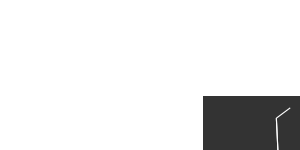

In [27]:
print('xg1_2:')
print(At_cs[32], At_cs[33], At_cs[34], '', '--->','', At_cs[32]+At_cs[33]+At_cs[34])
suma_At=At_cs[32]+At_cs[33]+At_cs[34]
mean_lon=(lon_stop[32]+lon_stop[33]+lon_stop[34])/3.
mean_lat=(lat_stop[32]+lat_stop[33]+lat_stop[34])/3.
print('')


print('mg1, cg1, xg1:')
print(At_cs[2])
print('')

print('jg1:')
print(At_cs[3], At_cs[4], '', '--->','', At_cs[3]+At_cs[4])
suma_At2=At_cs[3]+At_cs[4]
mean_lon2=(lon_stop[3]+lon_stop[4])/2.
mean_lat2=(lat_stop[3]+lat_stop[4])/2.
print('')

print('jg1_2:')
print(At_cs[9], At_cs[10],At_cs[11], At_cs[12],At_cs[13], At_cs[14],At_cs[15], '', '--->','',At_cs[9]+At_cs[10]+At_cs[11]+At_cs[12]+At_cs[13]+At_cs[14]+At_cs[15])
suma_At3=At_cs[9]+At_cs[10]+At_cs[11]+At_cs[12]+At_cs[13]+At_cs[14]+At_cs[15]
mean_lon3=(lon_stop[9]+lon_stop[10]+lon_stop[11]+lon_stop[12]+lon_stop[13]+lon_stop[14]+lon_stop[15])/7.
mean_lat3=(lat_stop[9]+lat_stop[10]+lat_stop[11]+lat_stop[12]+lat_stop[13]+lat_stop[14]+lat_stop[15])/7.
print('')

print('bg1_2, jg1_3:')
print(At_cs[21], At_cs[22],At_cs[23], At_cs[25],At_cs[26], At_cs[28],At_cs[29], '', '--->','',At_cs[21]+At_cs[22]+At_cs[23]+At_cs[25]+At_cs[26]+At_cs[28]+At_cs[29])
suma_At4=At_cs[21]+At_cs[22]+At_cs[23]+At_cs[25]+At_cs[26]+At_cs[28]+At_cs[29]
mean_lon4=(lon_stop[21]+lon_stop[22]+lon_stop[23]+lon_stop[25]+lon_stop[26]+lon_stop[28]+lon_stop[29])/7.
mean_lat4=(lat_stop[21]+lat_stop[22]+lat_stop[23]+lat_stop[25]+lat_stop[26]+lat_stop[28]+lat_stop[29])/7.
print('')

print('bg1, ccg1')
print(100)
print('')

accions_g1=['Xg1', 'Mg1+Cg1+Xg1', 'Jg1', 'Jg1', 'Bg1+Jg1', 'Bg1+CCg1']
colors_g1=['darkblue', 'darkorange', 'm', 'm', 'red', 'red']

temps_accions_g1=[suma_At,At_cs[2],suma_At2,suma_At3,suma_At4, 100]
lon_accions_g1=[mean_lon,lon_stop[2],mean_lon2,mean_lon3,mean_lon4, bg1[1]]
lat_accions_g1=[mean_lat,lat_stop[2],mean_lat2,mean_lat3,mean_lat4, bg1[0]]

max_temps_accions_g1=max(temps_accions_g1)
new_temps_accions_g1=[]
for j in range(len(temps_accions_g1)):
    new_temps_accions_g1.append(temps_accions_g1[j]/max_temps_accions_g1)

new_temps_accions_g1_2=[]
for i in range(len(temps_accions_g1)):
    new_temps_accions_g1_2.append(100*new_temps_accions_g1[i])

    
from shapely.geometry import Point, LineString, Polygon
fig, ax = map_network2(2.2793534239822613, 41.60640928402908, 2.283956227147247,41.60640126017562,  
                       2.2837951863375023,41.60189263168001,  2.2792784442191962, 41.60145135138418)

plt.scatter(lon_accions_g1,lat_accions_g1,c='yellow',s=new_temps_accions_g1_2)
plt.scatter(lon_accions_g1,lat_accions_g1,c=colors_g1,s=1)

bbox_args = dict(boxstyle='square',facecolor='white', edgecolor='k',alpha=0.8)
arrowprops=dict(arrowstyle = '->', connectionstyle='arc3,rad=0',color='white')
for iii in range(len(lon_accions_g1)):
    plt.annotate(str(int(temps_accions_g1[iii]))+ 's'+' '+accions_g1[iii], (lon_accions_g1[iii], lat_accions_g1[iii]),c=colors_g1[iii],size=5,
                 bbox=bbox_args,arrowprops=arrowprops, xytext=(-20, 18),textcoords='offset points')

      
#plt.savefig('g1_durada_accions.eps')

plt.show()  


## 3.13- GRUP G2

C:\Users\josep\anaconda3\envs\ox\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


GRUP G2
Nombre total daturades: 4
Temps total daturada: 471.0 s
Temps promig daturada: 117.75
[14.0, 427.0, 16.0, 14.0]




<IPython.core.display.Javascript object>


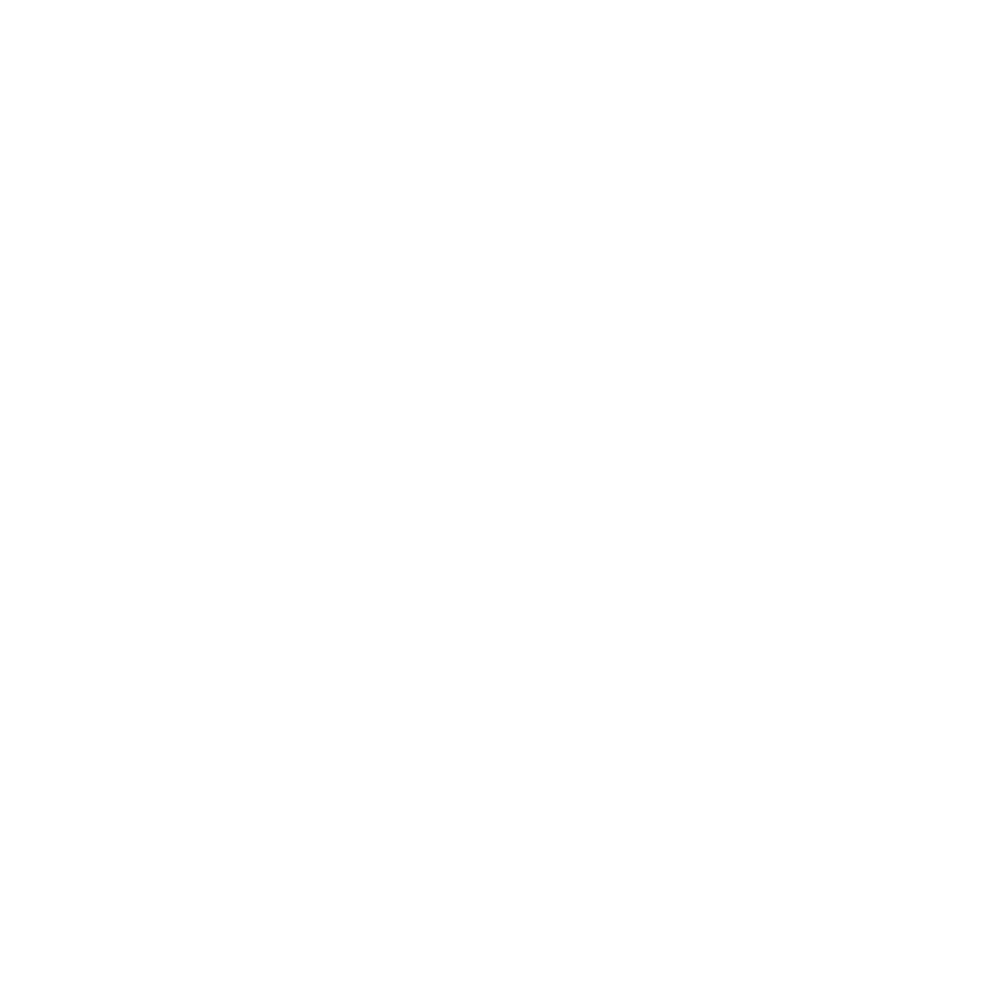

In [28]:
from gpxcsv import gpxtolist
import pandas as pd
import networkx as nx
import osmnx as ox


import matplotlib.pyplot as plt
import numpy as np
import glob
import os
from math import sin, cos, sqrt, atan2, radians
from mpl_toolkits.axes_grid1.inset_locator import inset_axes
from folium import Map
from folium.plugins import HeatMap, HeatMapWithTime
import utm
from matplotlib.animation import FuncAnimation
import matplotlib.animation as animation
from scipy.stats import gaussian_kde
from shapely.geometry import Point, LineString, Polygon
import folium

%matplotlib notebook
#%matplotlib inline
ox.config(use_cache=True, log_console=True)
ox.__version__


df = pd.read_csv('g2.csv') 
print('GRUP G2')
lat=df['lat'].tolist()
lon=df['lon'].tolist()

t=df['At'].tolist()

stops=df['stops']

At_cs=[]

lat_stop=[]
lon_stop=[]

i=0
while i < len(stops):

    if stops[i]=='flight':
        i=i+1

    else:
        s=0
        stopss=[]
        while stops[i+s]=='stop':
            stopss.append(t[i+s])
            s=s+1

        At_c=sum(stopss)
        At_cs.append(At_c)

        lat_stop.append(lat[i])
        lon_stop.append(lon[i])


        i=i+s

print('Nombre total daturades:', len(At_cs))
print('Temps total daturada:', sum(At_cs),'s')
mean_temps=sum(At_cs)/len(At_cs)
print('Temps promig daturada:', sum(At_cs)/len(At_cs))
print(At_cs)
print('')
print('')


from shapely.geometry import Point, LineString, Polygon
fig, ax = map_network2(2.2793534239822613, 41.60640928402908, 2.283956227147247,41.60640126017562,  
                       2.2837951863375023,41.60189263168001,  2.2792784442191962, 41.60145135138418)  # Create the graph from a given latitude and longitude




from turfpy.measurement import boolean_point_in_polygon
from geojson import Point, Polygon, Feature

max_At=max(At_cs)
new_At_cs=[]
for j in range(len(At_cs)):
    new_At_cs.append(At_cs[j]/max_At)

new_At_cs2=[]
for i in range(len(lon_stop)):
    new_At_cs2.append(100*new_At_cs[i])


jg2=[41.60408, 2.28134]
xg2=[41.60367, 2.28257]
bg2=[41.6032, 2.28247]
mg2=[41.6034, 2.28041]
cg2=[41.60286, 2.2813]
ccg2=[41.60404, 2.28135]

lon_accions=[jg2[1], xg2[1], bg2[1], mg2[1], cg2[1], ccg2[1]]
lat_accions=[jg2[0], xg2[0], bg2[0], mg2[0], cg2[0], ccg2[0]]

plt.plot(jg2[1],jg2[0],'*',c='magenta',markersize=10)
plt.plot(xg2[1],xg2[0],'*',c='magenta',markersize=10)
plt.plot(bg2[1],bg2[0],'*',c='magenta',markersize=10)
plt.plot(mg2[1],mg2[0],'*',c='magenta',markersize=10)
plt.plot(cg2[1],cg2[0],'*',c='magenta',markersize=10)
plt.plot(ccg2[1],ccg2[0],'*',c='magenta',markersize=10)

list_accions=['jg2','xg2','bg2','mg2','cg2','ccg2']

plt.scatter(lon_stop,lat_stop,c='yellow',s=new_At_cs2)
plt.scatter(lon_stop,lat_stop,c='grey',s=1)

bbox_args = dict(boxstyle='square',facecolor='white', edgecolor='k',alpha=0.7)
arrowprops=dict(arrowstyle = '->', connectionstyle='arc3,rad=0',color='white')
for iii in range(len(lon_stop)):
    if At_cs[iii]>9:
        plt.annotate(str(int(At_cs[iii]))+ 's', (lon_stop[iii], lat_stop[iii]),c='green',size=8,
                     bbox=bbox_args,arrowprops=arrowprops, xytext=(-20, 18),textcoords='offset points')


bbox_args2 = dict(boxstyle='square',facecolor='grey', edgecolor='k',alpha=0.7)
arrowprops2=dict(arrowstyle = '->', connectionstyle='arc3,rad=0',color='white')
for iiii in range(len(list_accions)):
    plt.annotate(list_accions[iiii], (lon_accions[iiii], lat_accions[iiii]),c='red',size=8,
                     bbox=bbox_args2,arrowprops=arrowprops2, xytext=(-20, 18),textcoords='offset points')    
    

At_cs_names=[]
for i in range(len(At_cs)):
    At_cs_names.append(str(At_cs[i])+'s')

names=np.array(At_cs_names)


#annot = ax.annotate("", xy=(0,0), xytext=(20,20),textcoords="offset points",
            #bbox=dict(boxstyle="round", fc="w"),
            #arrowprops=dict(arrowstyle="->", color='white'),fontsize='large')
#annot.set_visible(False)

def update_annot(ind):

    pos = sc.get_offsets()[ind["ind"][0]]
    annot.xy = pos
#text = "{}, {}".format(" ".join(list(map(str,ind["ind"]))), 
                   #" ".join([names[n] for n in ind["ind"]]))

    text = "{}".format(" ".join([names[n] for n in ind["ind"]]))
    annot.set_text(text)
    #annot.get_bbox_patch().set_facecolor(cmap(norm(c[ind["ind"][0]])))
    annot.get_bbox_patch().set_facecolor('limegreen')
    annot.get_bbox_patch().set_alpha(0.7)


def hover(event):
    vis = annot.get_visible()
    if event.inaxes == ax:
        cont, ind = sc.contains(event)
        if cont:
            update_annot(ind)
            annot.set_visible(True)
            fig.canvas.draw_idle()
        else:
            if vis:
                annot.set_visible(False)
                fig.canvas.draw_idle()

#fig.canvas.mpl_connect("motion_notify_event", hover)


#plt.savefig(grupss[tt]+'_stops_duration'+'.eps')
plt.show()



    


C:\Users\josep\anaconda3\envs\ox\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


bg2:
427.0

jg2:
400

cg2:
677

ccg2:
82

mg2:
946

xg2:
360



<IPython.core.display.Javascript object>


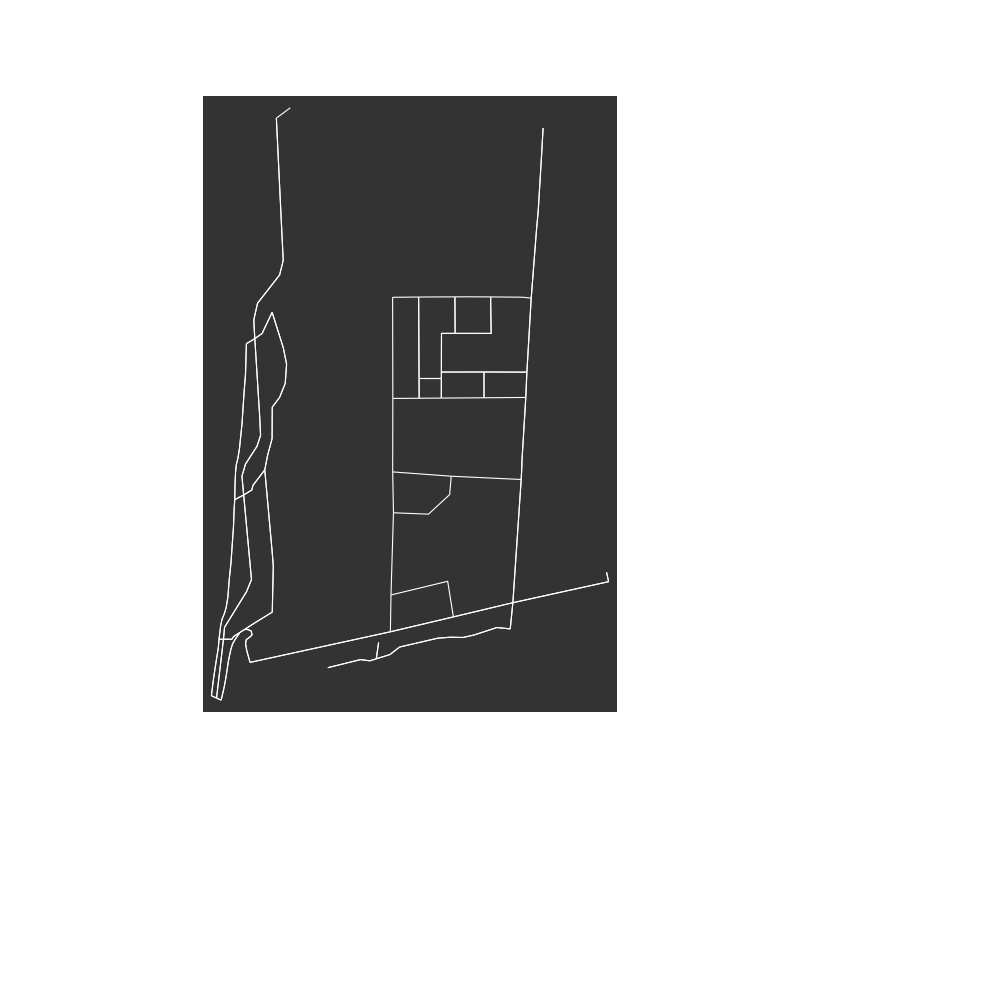

In [29]:
print('bg2:')
print(At_cs[1])
print('')

print('jg2:')
print(400)
print('')

print('cg2:')
print(677)
print('')

print('ccg2:')
print(82)
print('')

print('mg2:')
print(946)
print('')

print('xg2:')
print(360)
print('')


accions_g2=['Bg2', 'Jg2', 'Cg2', 'CCg2', 'Mg2', 'Xg2']
colors_g2=['red', 'm', 'seagreen' , 'darkcyan', 'darkorange', 'darkblue']

temps_accions_g2=[At_cs[1], 400, 677, 82, 946, 360]
lon_accions_g2=[lon_stop[1], jg2[1], cg2[1], ccg2[1], mg2[1], xg2[1]]
lat_accions_g2=[lat_stop[1], jg2[0], cg2[0], ccg2[0], mg2[0], xg2[0]]

max_temps_accions_g2=max(temps_accions_g2)
new_temps_accions_g2=[]
for j in range(len(temps_accions_g2)):
    new_temps_accions_g2.append(temps_accions_g2[j]/max_temps_accions_g2)

new_temps_accions_g2_2=[]
for i in range(len(temps_accions_g2)):
    new_temps_accions_g2_2.append(100*new_temps_accions_g2[i])

    
from shapely.geometry import Point, LineString, Polygon
fig, ax = map_network2(2.2793534239822613, 41.60640928402908, 2.283956227147247,41.60640126017562,  
                       2.2837951863375023,41.60189263168001,  2.2792784442191962, 41.60145135138418)

plt.scatter(lon_accions_g2,lat_accions_g2,c='yellow',s=new_temps_accions_g2_2)
plt.scatter(lon_accions_g2,lat_accions_g2,c=colors_g2,s=1)

bbox_args = dict(boxstyle='square',facecolor='white', edgecolor='k',alpha=0.8)
arrowprops=dict(arrowstyle = '->', connectionstyle='arc3,rad=0',color='white')
for iii in range(len(lon_accions_g2)):
    plt.annotate(str(int(temps_accions_g2[iii]))+ 's'+' '+accions_g2[iii], (lon_accions_g2[iii], lat_accions_g2[iii]),c=colors_g2[iii],size=5,
                 bbox=bbox_args,arrowprops=arrowprops, xytext=(-20, 18),textcoords='offset points')
    
#plt.savefig('g2_durada_accions.eps')

plt.show()
    


## 3.14- GRUP G3

C:\Users\josep\anaconda3\envs\ox\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


GRUP G3
Nombre total daturades: 21
Temps total daturada: 5458.0 s
Temps promig daturada: 259.9047619047619
[49.0, 31.0, 11.0, 10.0, 12.0, 322.0, 1523.0, 43.0, 35.0, 34.0, 478.0, 10.0, 13.0, 11.0, 12.0, 2669.0, 10.0, 13.0, 13.0, 96.0, 63.0]




<IPython.core.display.Javascript object>


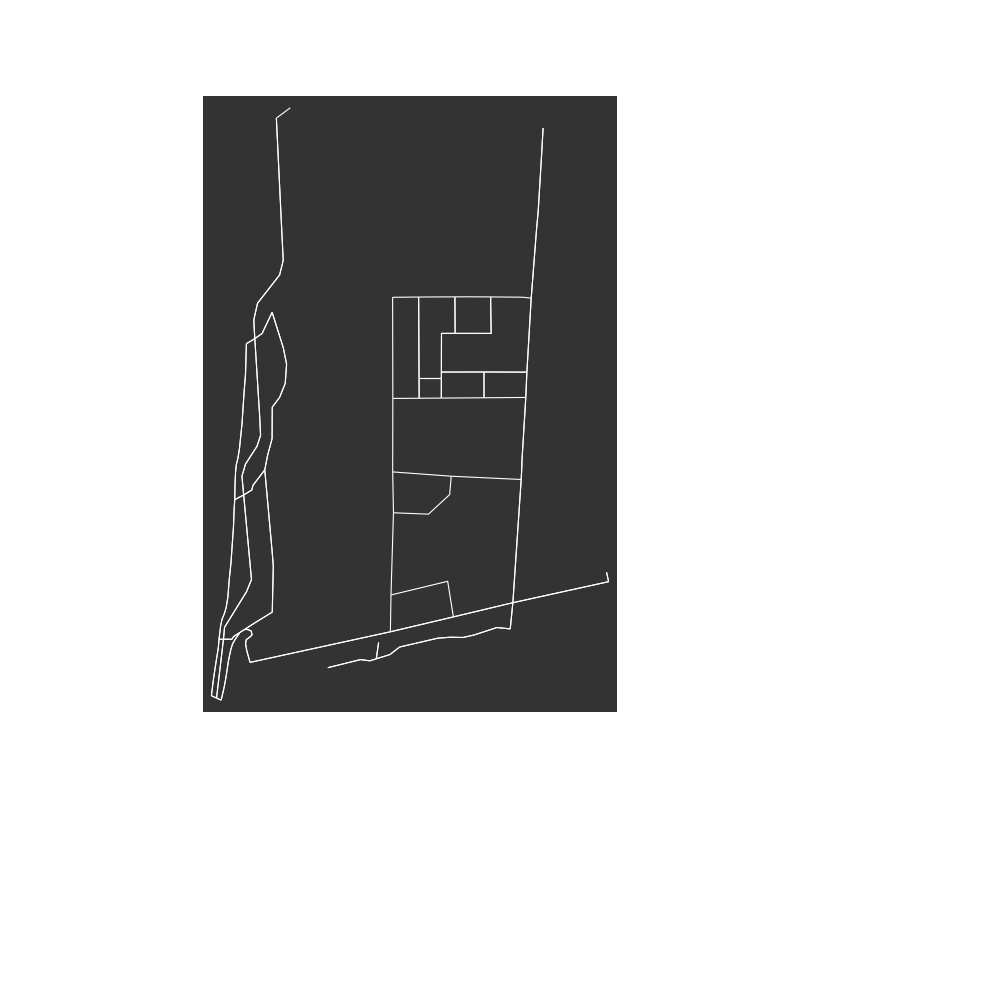

In [30]:
from gpxcsv import gpxtolist
import pandas as pd
import networkx as nx
import osmnx as ox


import matplotlib.pyplot as plt
import numpy as np
import glob
import os
from math import sin, cos, sqrt, atan2, radians
from mpl_toolkits.axes_grid1.inset_locator import inset_axes
from folium import Map
from folium.plugins import HeatMap, HeatMapWithTime
import utm
from matplotlib.animation import FuncAnimation
import matplotlib.animation as animation
from scipy.stats import gaussian_kde
from shapely.geometry import Point, LineString, Polygon
import folium

%matplotlib notebook
#%matplotlib inline
ox.config(use_cache=True, log_console=True)
ox.__version__


df = pd.read_csv('g3.csv') 
print('GRUP G3')
lat=df['lat'].tolist()
lon=df['lon'].tolist()

t=df['At'].tolist()

stops=df['stops']

At_cs=[]

lat_stop=[]
lon_stop=[]

i=0
while i < len(stops):

    if stops[i]=='flight':
        i=i+1

    else:
        s=0
        stopss=[]
        while stops[i+s]=='stop':
            stopss.append(t[i+s])
            s=s+1

        At_c=sum(stopss)
        At_cs.append(At_c)

        lat_stop.append(lat[i])
        lon_stop.append(lon[i])


        i=i+s

print('Nombre total daturades:', len(At_cs))
print('Temps total daturada:', sum(At_cs),'s')
mean_temps=sum(At_cs)/len(At_cs)
print('Temps promig daturada:', sum(At_cs)/len(At_cs))
print(At_cs)
print('')
print('')


from shapely.geometry import Point, LineString, Polygon
fig, ax = map_network2(2.2793534239822613, 41.60640928402908, 2.283956227147247,41.60640126017562,  
                       2.2837951863375023,41.60189263168001,  2.2792784442191962, 41.60145135138418)  # Create the graph from a given latitude and longitude




from turfpy.measurement import boolean_point_in_polygon
from geojson import Point, Polygon, Feature

max_At=max(At_cs)
new_At_cs=[]
for j in range(len(At_cs)):
    new_At_cs.append(At_cs[j]/max_At)

new_At_cs2=[]
for i in range(len(lon_stop)):
    new_At_cs2.append(100*new_At_cs[i])


jg3=[41.60422, 2.28265]
jg3_2=[41.60364, 2.28252]
xg3=[41.60394, 2.28191]
mg3=[41.60363, 2.28253]
cg3=[41.6028, 2.28205]
ccg3=[41.60281, 2.28207]

lon_accions=[jg3[1], jg3_2[1], xg3[1], mg3[1], cg3[1], ccg3[1]]
lat_accions=[jg3[0], jg3_2[0], xg3[0], mg3[0], cg3[0], ccg3[0]]

plt.plot(jg3[1],jg3[0],'*',c='magenta',markersize=10)
plt.plot(jg3_2[1],jg3_2[0],'*',c='magenta',markersize=10)
plt.plot(xg3[1],xg3[0],'*',c='magenta',markersize=10)
plt.plot(mg3[1],mg3[0],'*',c='magenta',markersize=10)
plt.plot(cg3[1],cg3[0],'*',c='magenta',markersize=10)
plt.plot(ccg3[1],ccg3[0],'*',c='magenta',markersize=10)

list_accions=['jg3','jg3_2','xg3','mg3','cg3','ccg3']

plt.scatter(lon_stop,lat_stop,c='yellow',s=new_At_cs2)
plt.scatter(lon_stop,lat_stop,c='grey',s=1)

bbox_args = dict(boxstyle='square',facecolor='white', edgecolor='k',alpha=0.7)
arrowprops=dict(arrowstyle = '->', connectionstyle='arc3,rad=0',color='white')
for iii in range(len(lon_stop)):
    if At_cs[iii]>9:
        plt.annotate(str(int(At_cs[iii]))+ 's', (lon_stop[iii], lat_stop[iii]),c='green',size=8,
                     bbox=bbox_args,arrowprops=arrowprops, xytext=(-20, 18),textcoords='offset points')


bbox_args2 = dict(boxstyle='square',facecolor='grey', edgecolor='k',alpha=0.7)
arrowprops2=dict(arrowstyle = '->', connectionstyle='arc3,rad=0',color='white')
for iiii in range(len(list_accions)):
    plt.annotate(list_accions[iiii], (lon_accions[iiii], lat_accions[iiii]),c='red',size=8,
                     bbox=bbox_args2,arrowprops=arrowprops2, xytext=(-20, 18),textcoords='offset points')    
    

At_cs_names=[]
for i in range(len(At_cs)):
    At_cs_names.append(str(At_cs[i])+'s')

names=np.array(At_cs_names)


#annot = ax.annotate("", xy=(0,0), xytext=(20,20),textcoords="offset points",
            #bbox=dict(boxstyle="round", fc="w"),
            #arrowprops=dict(arrowstyle="->", color='white'),fontsize='large')
#annot.set_visible(False)

def update_annot(ind):

    pos = sc.get_offsets()[ind["ind"][0]]
    annot.xy = pos
#text = "{}, {}".format(" ".join(list(map(str,ind["ind"]))), 
                   #" ".join([names[n] for n in ind["ind"]]))

    text = "{}".format(" ".join([names[n] for n in ind["ind"]]))
    annot.set_text(text)
    #annot.get_bbox_patch().set_facecolor(cmap(norm(c[ind["ind"][0]])))
    annot.get_bbox_patch().set_facecolor('limegreen')
    annot.get_bbox_patch().set_alpha(0.7)


def hover(event):
    vis = annot.get_visible()
    if event.inaxes == ax:
        cont, ind = sc.contains(event)
        if cont:
            update_annot(ind)
            annot.set_visible(True)
            fig.canvas.draw_idle()
        else:
            if vis:
                annot.set_visible(False)
                fig.canvas.draw_idle()

#fig.canvas.mpl_connect("motion_notify_event", hover)


#plt.savefig(grupss[tt]+'_stops_duration'+'.eps')
plt.show()



    


C:\Users\josep\anaconda3\envs\ox\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


cg3, ccg3:
2669.0

jg3_2, mg3:
322.0 1523.0  --->  1845.0

jg3:
34.0 478.0  --->  512.0

xg3
96.0


<IPython.core.display.Javascript object>


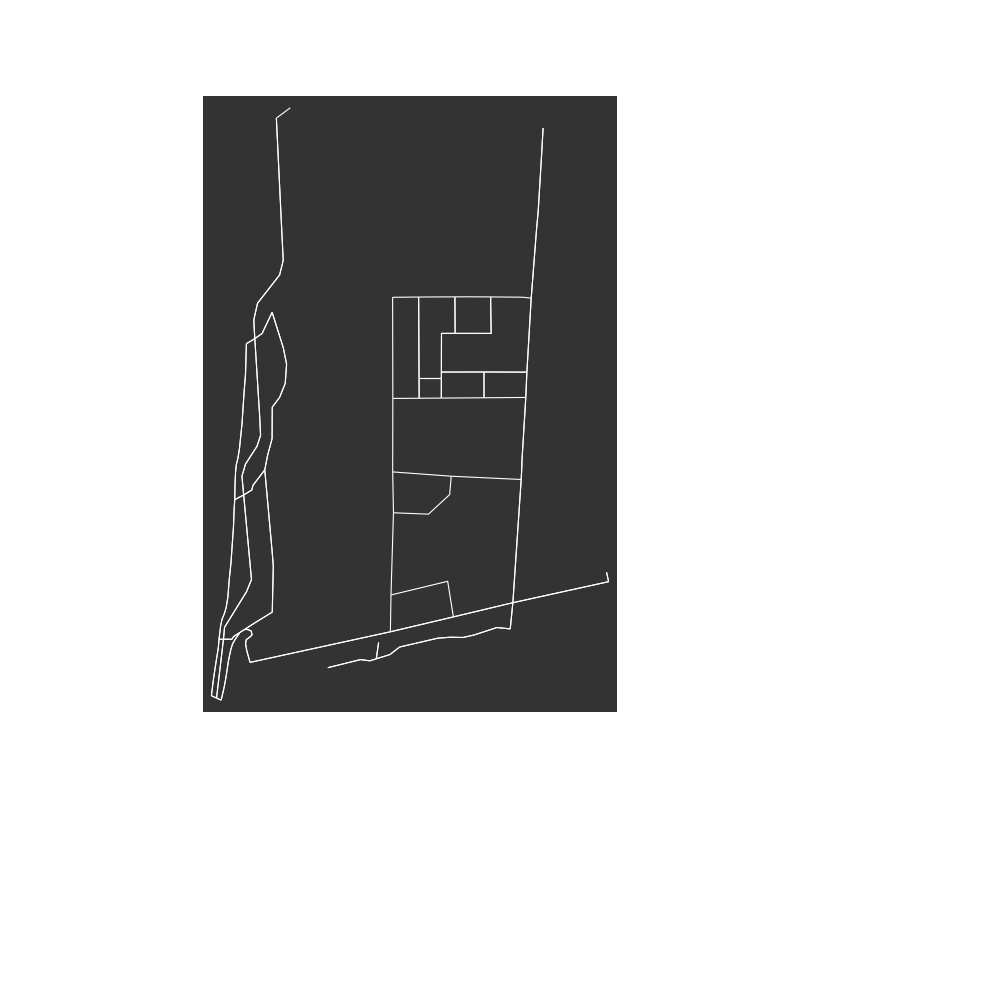

In [31]:
print('cg3, ccg3:')
print(At_cs[15])
print('')

print('jg3_2, mg3:')
print(At_cs[5], At_cs[6], '', '--->','', At_cs[5]+At_cs[6])
suma_At=At_cs[5]+At_cs[6]
mean_lon=(lon_stop[5]+lon_stop[6])/2.
mean_lat=(lat_stop[5]+lat_stop[6])/2.
print('')

print('jg3:')
print(At_cs[9], At_cs[10], '', '--->','', At_cs[9]+At_cs[10])
suma_At2=At_cs[9]+At_cs[10]
mean_lon2=(lon_stop[9]+lon_stop[10])/2.
mean_lat2=(lat_stop[9]+lat_stop[10])/2.
print('')

print('xg3')
print(At_cs[19])

accions_g3=['Cg3+CCg3', 'Jg3+Mg3', 'Jg3', 'Xg3']
colors_g3=['seagreen','darkorange','m','darkblue']

temps_accions_g3=[At_cs[15],suma_At,suma_At2,At_cs[19]]
lon_accions_g3=[lon_stop[15],mean_lon,mean_lon2,lon_stop[19]]
lat_accions_g3=[lat_stop[15],mean_lat,mean_lat2,lat_stop[19]]

max_temps_accions_g3=max(temps_accions_g3)
new_temps_accions_g3=[]
for j in range(len(temps_accions_g3)):
    new_temps_accions_g3.append(temps_accions_g3[j]/max_temps_accions_g3)

new_temps_accions_g3_2=[]
for i in range(len(temps_accions_g3)):
    new_temps_accions_g3_2.append(100*new_temps_accions_g3[i])

    
from shapely.geometry import Point, LineString, Polygon
fig, ax = map_network2(2.2793534239822613, 41.60640928402908, 2.283956227147247,41.60640126017562,  
                       2.2837951863375023,41.60189263168001,  2.2792784442191962, 41.60145135138418)

plt.scatter(lon_accions_g3,lat_accions_g3,c='yellow',s=new_temps_accions_g3_2)
plt.scatter(lon_accions_g3,lat_accions_g3,c=colors_g3,s=1)

bbox_args = dict(boxstyle='square',facecolor='white', edgecolor='k',alpha=0.8)
arrowprops=dict(arrowstyle = '->', connectionstyle='arc3,rad=0',color='white')
for iii in range(len(lon_accions_g3)):
    plt.annotate(str(int(temps_accions_g3[iii]))+ 's'+' '+accions_g3[iii], (lon_accions_g3[iii], lat_accions_g3[iii]),c=colors_g3[iii],size=5,
                 bbox=bbox_args,arrowprops=arrowprops, xytext=(-20, 18),textcoords='offset points')

      
#plt.savefig('g3_durada_accions.eps')

plt.show()  


## 3.15- GRUP G4

C:\Users\josep\anaconda3\envs\ox\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


GRUP G4
Nombre total daturades: 5
Temps total daturada: 1932.0 s
Temps promig daturada: 386.4
[1243.0, 148.0, 447.0, 30.0, 64.0]




<IPython.core.display.Javascript object>


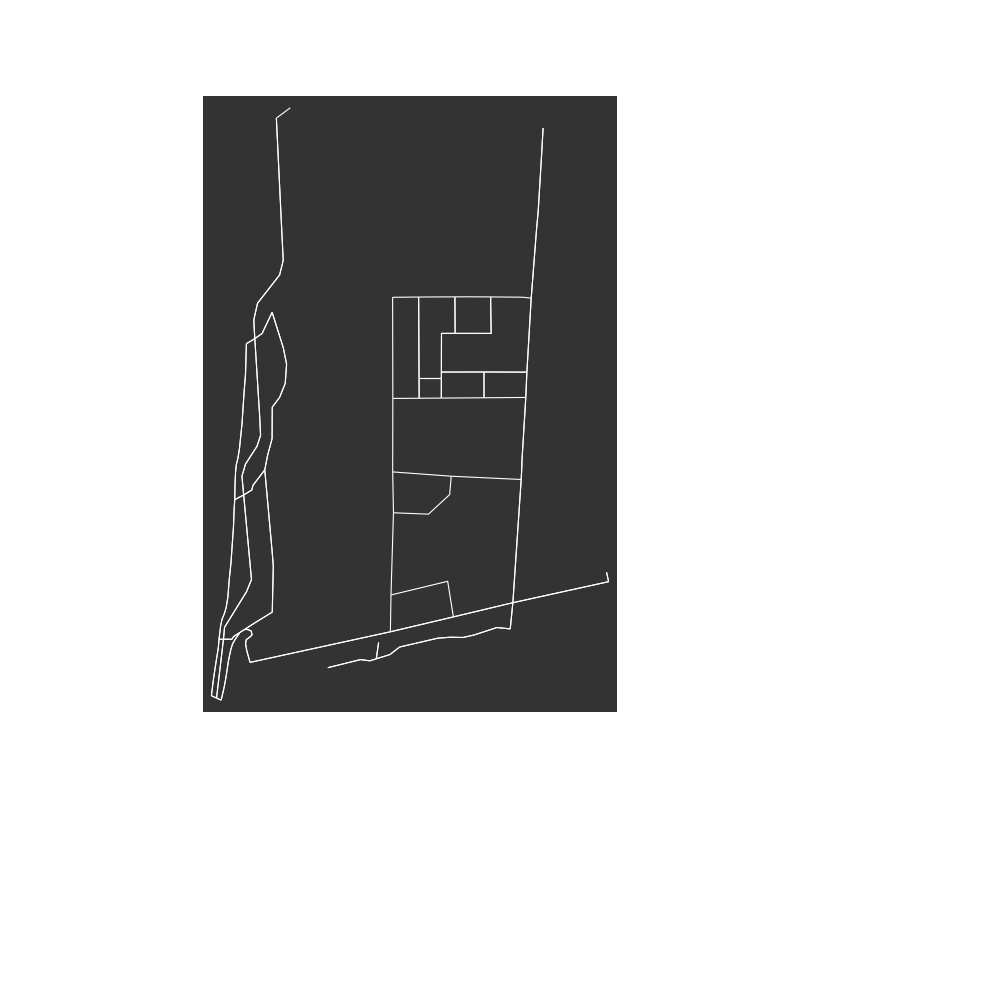

In [32]:
from gpxcsv import gpxtolist
import pandas as pd
import networkx as nx
import osmnx as ox


import matplotlib.pyplot as plt
import numpy as np
import glob
import os
from math import sin, cos, sqrt, atan2, radians
from mpl_toolkits.axes_grid1.inset_locator import inset_axes
from folium import Map
from folium.plugins import HeatMap, HeatMapWithTime
import utm
from matplotlib.animation import FuncAnimation
import matplotlib.animation as animation
from scipy.stats import gaussian_kde
from shapely.geometry import Point, LineString, Polygon
import folium

%matplotlib notebook
#%matplotlib inline
ox.config(use_cache=True, log_console=True)
ox.__version__


df = pd.read_csv('g4.csv') 
print('GRUP G4')
lat=df['lat'].tolist()
lon=df['lon'].tolist()

t=df['At'].tolist()

stops=df['stops']

At_cs=[]

lat_stop=[]
lon_stop=[]

i=0
while i < len(stops):

    if stops[i]=='flight':
        i=i+1

    else:
        s=0
        stopss=[]
        while stops[i+s]=='stop':
            stopss.append(t[i+s])
            s=s+1

        At_c=sum(stopss)
        At_cs.append(At_c)

        lat_stop.append(lat[i])
        lon_stop.append(lon[i])


        i=i+s

print('Nombre total daturades:', len(At_cs))
print('Temps total daturada:', sum(At_cs),'s')
mean_temps=sum(At_cs)/len(At_cs)
print('Temps promig daturada:', sum(At_cs)/len(At_cs))
print(At_cs)
print('')
print('')


from shapely.geometry import Point, LineString, Polygon
fig, ax = map_network2(2.2793534239822613, 41.60640928402908, 2.283956227147247,41.60640126017562,  
                       2.2837951863375023,41.60189263168001,  2.2792784442191962, 41.60145135138418)  # Create the graph from a given latitude and longitude




from turfpy.measurement import boolean_point_in_polygon
from geojson import Point, Polygon, Feature

max_At=max(At_cs)
new_At_cs=[]
for j in range(len(At_cs)):
    new_At_cs.append(At_cs[j]/max_At)

new_At_cs2=[]
for i in range(len(lon_stop)):
    new_At_cs2.append(100*new_At_cs[i])


xg4=[41.60275, 2.28185]
xg4_2=[41.60286, 2.28164]
xg4_3=[41.60277, 2.28167]
mg4=[41.60278, 2.28164]
mg4_2=[41.60276, 2.28165]
cg4=[41.60366, 2.28258]
ccg4=[41.60364, 2.28258]

lon_accions=[xg4[1], xg4_2[1], xg4_3[1], mg4[1], mg4_2[1], cg4[1], ccg4[1]]
lat_accions=[xg4[0], xg4_2[0], xg4_3[0], mg4[0], mg4_2[0], cg4[0], ccg4[0]]

plt.plot(xg4[1],xg4[0],'*',c='magenta',markersize=10)
plt.plot(xg4_2[1],xg4_2[0],'*',c='magenta',markersize=10)
plt.plot(xg4_3[1],xg4_3[0],'*',c='magenta',markersize=10)
plt.plot(mg4[1],mg4[0],'*',c='magenta',markersize=10)
plt.plot(mg4_2[1],mg4_2[0],'*',c='magenta',markersize=10)
plt.plot(cg4[1],cg4[0],'*',c='magenta',markersize=10)
plt.plot(ccg4[1],ccg4[0],'*',c='magenta',markersize=10)

list_accions=['xg4','xg4_2','xg4_3','mg4','mg4_2','cg4','ccg4']

plt.scatter(lon_stop,lat_stop,c='yellow',s=new_At_cs2)
plt.scatter(lon_stop,lat_stop,c='grey',s=1)

bbox_args = dict(boxstyle='square',facecolor='white', edgecolor='k',alpha=0.7)
arrowprops=dict(arrowstyle = '->', connectionstyle='arc3,rad=0',color='white')
for iii in range(len(lon_stop)):
    if At_cs[iii]>9:
        plt.annotate(str(int(At_cs[iii]))+ 's', (lon_stop[iii], lat_stop[iii]),c='green',size=8,
                     bbox=bbox_args,arrowprops=arrowprops, xytext=(-20, 18),textcoords='offset points')


bbox_args2 = dict(boxstyle='square',facecolor='grey', edgecolor='k',alpha=0.7)
arrowprops2=dict(arrowstyle = '->', connectionstyle='arc3,rad=0',color='white')
for iiii in range(len(list_accions)):
    plt.annotate(list_accions[iiii], (lon_accions[iiii], lat_accions[iiii]),c='red',size=8,
                     bbox=bbox_args2,arrowprops=arrowprops2, xytext=(-20, 18),textcoords='offset points')    
    

At_cs_names=[]
for i in range(len(At_cs)):
    At_cs_names.append(str(At_cs[i])+'s')

names=np.array(At_cs_names)


#annot = ax.annotate("", xy=(0,0), xytext=(20,20),textcoords="offset points",
            #bbox=dict(boxstyle="round", fc="w"),
            #arrowprops=dict(arrowstyle="->", color='white'),fontsize='large')
#annot.set_visible(False)

def update_annot(ind):

    pos = sc.get_offsets()[ind["ind"][0]]
    annot.xy = pos
#text = "{}, {}".format(" ".join(list(map(str,ind["ind"]))), 
                   #" ".join([names[n] for n in ind["ind"]]))

    text = "{}".format(" ".join([names[n] for n in ind["ind"]]))
    annot.set_text(text)
    #annot.get_bbox_patch().set_facecolor(cmap(norm(c[ind["ind"][0]])))
    annot.get_bbox_patch().set_facecolor('limegreen')
    annot.get_bbox_patch().set_alpha(0.7)


def hover(event):
    vis = annot.get_visible()
    if event.inaxes == ax:
        cont, ind = sc.contains(event)
        if cont:
            update_annot(ind)
            annot.set_visible(True)
            fig.canvas.draw_idle()
        else:
            if vis:
                annot.set_visible(False)
                fig.canvas.draw_idle()

#fig.canvas.mpl_connect("motion_notify_event", hover)


#plt.savefig(grupss[tt]+'_stops_duration'+'.eps')
plt.show()



    


C:\Users\josep\anaconda3\envs\ox\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


mg4,mg4_2,xg4,xg4_2,xg4_3:
1243.0

cg4,cxg4:
447.0 30.0  --->  477.0



<IPython.core.display.Javascript object>


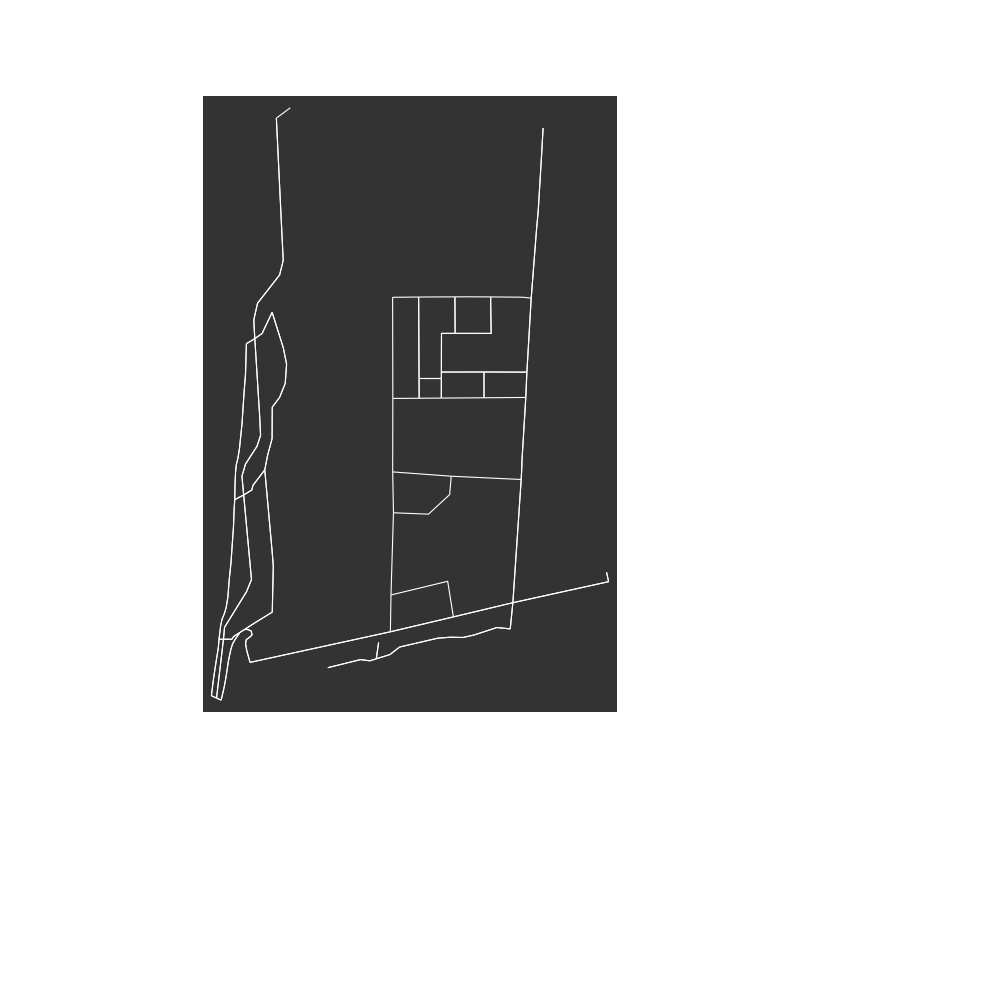

In [33]:
print('mg4,mg4_2,xg4,xg4_2,xg4_3:')
print(At_cs[0])
print('')

print('cg4,cxg4:')
print(At_cs[2], At_cs[3], '', '--->','', At_cs[2]+At_cs[3])
suma_At=At_cs[2]+At_cs[3]
mean_lon=(lon_stop[2]+lon_stop[3])/2.
mean_lat=(lat_stop[2]+lat_stop[3])/2.
print('')


accions_g4=['Mg4+Xg4','Cg4+CCg4']
colors_g4=['darkblue','seagreen']

temps_accions_g4=[At_cs[0],suma_At]
lon_accions_g4=[lon_stop[0],mean_lon]
lat_accions_g4=[lat_stop[0],mean_lat]

max_temps_accions_g4=max(temps_accions_g4)
new_temps_accions_g4=[]
for j in range(len(temps_accions_g4)):
    new_temps_accions_g4.append(temps_accions_g4[j]/max_temps_accions_g4)

new_temps_accions_g4_2=[]
for i in range(len(temps_accions_g4)):
    new_temps_accions_g4_2.append(100*new_temps_accions_g4[i])

    
from shapely.geometry import Point, LineString, Polygon
fig, ax = map_network2(2.2793534239822613, 41.60640928402908, 2.283956227147247,41.60640126017562,  
                       2.2837951863375023,41.60189263168001,  2.2792784442191962, 41.60145135138418)

plt.scatter(lon_accions_g4,lat_accions_g4,c='yellow',s=new_temps_accions_g4_2)
plt.scatter(lon_accions_g4,lat_accions_g4,c=colors_g4,s=1)

bbox_args = dict(boxstyle='square',facecolor='white', edgecolor='k',alpha=0.8)
arrowprops=dict(arrowstyle = '->', connectionstyle='arc3,rad=0',color='white')
for iii in range(len(lon_accions_g4)):
    plt.annotate(str(int(temps_accions_g4[iii]))+ 's'+' '+accions_g4[iii], (lon_accions_g4[iii], lat_accions_g4[iii]),c=colors_g4[iii],size=5,
                 bbox=bbox_args,arrowprops=arrowprops, xytext=(-20, 18),textcoords='offset points')

     
#plt.savefig('g4_durada_accions.eps')

plt.show()   


## 3.16- GRUP G5

C:\Users\josep\anaconda3\envs\ox\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


GRUP G5
Nombre total daturades: 20
Temps total daturada: 4206.0 s
Temps promig daturada: 210.3
[62.0, 11.0, 10.0, 1071.0, 12.0, 10.0, 1223.0, 17.0, 12.0, 14.0, 30.0, 22.0, 245.0, 11.0, 212.0, 277.0, 690.0, 32.0, 10.0, 235.0]




<IPython.core.display.Javascript object>


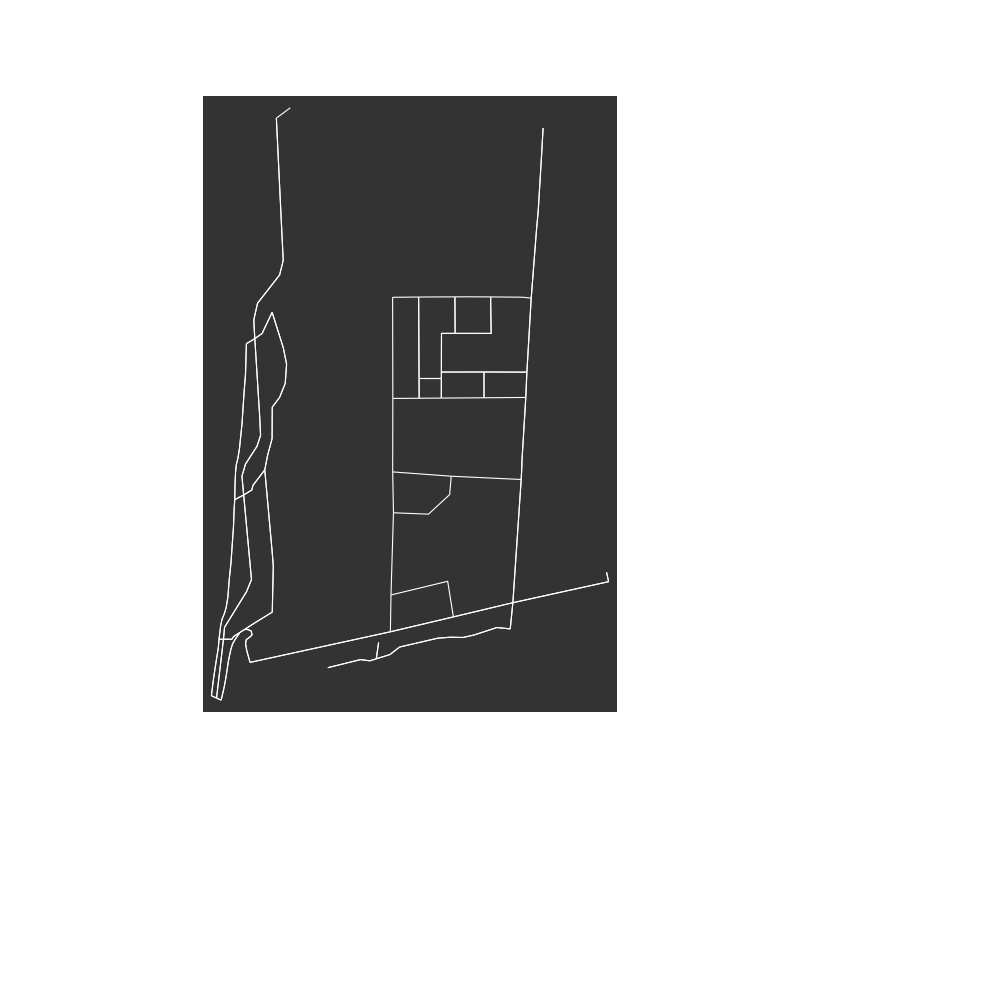

In [34]:
from gpxcsv import gpxtolist
import pandas as pd
import networkx as nx
import osmnx as ox


import matplotlib.pyplot as plt
import numpy as np
import glob
import os
from math import sin, cos, sqrt, atan2, radians
from mpl_toolkits.axes_grid1.inset_locator import inset_axes
from folium import Map
from folium.plugins import HeatMap, HeatMapWithTime
import utm
from matplotlib.animation import FuncAnimation
import matplotlib.animation as animation
from scipy.stats import gaussian_kde
from shapely.geometry import Point, LineString, Polygon
import folium

%matplotlib notebook
#%matplotlib inline
ox.config(use_cache=True, log_console=True)
ox.__version__


df = pd.read_csv('g5.csv') 
print('GRUP G5')
lat=df['lat'].tolist()
lon=df['lon'].tolist()

t=df['At'].tolist()

stops=df['stops']

At_cs=[]

lat_stop=[]
lon_stop=[]

i=0
while i < len(stops):

    if stops[i]=='flight':
        i=i+1

    else:
        s=0
        stopss=[]
        while stops[i+s]=='stop':
            stopss.append(t[i+s])
            s=s+1

        At_c=sum(stopss)
        At_cs.append(At_c)

        lat_stop.append(lat[i])
        lon_stop.append(lon[i])


        i=i+s

print('Nombre total daturades:', len(At_cs))
print('Temps total daturada:', sum(At_cs),'s')
mean_temps=sum(At_cs)/len(At_cs)
print('Temps promig daturada:', sum(At_cs)/len(At_cs))
print(At_cs)
print('')
print('')


from shapely.geometry import Point, LineString, Polygon
fig, ax = map_network2(2.2793534239822613, 41.60640928402908, 2.283956227147247,41.60640126017562,  
                       2.2837951863375023,41.60189263168001,  2.2792784442191962, 41.60145135138418)  # Create the graph from a given latitude and longitude




from turfpy.measurement import boolean_point_in_polygon
from geojson import Point, Polygon, Feature

max_At=max(At_cs)
new_At_cs=[]
for j in range(len(At_cs)):
    new_At_cs.append(At_cs[j]/max_At)

new_At_cs2=[]
for i in range(len(lon_stop)):
    new_At_cs2.append(100*new_At_cs[i])

jg5=[41.60376, 2.28189]
jg5_2=[41.60426, 2.28261]
xg5=[41.60284, 2.28172]
mg5=[41.60285, 2.28172]
bg5=[41.60375, 2.28189]
cg5=[41.6036, 2.28256]
ccg5=[41.60403, 2.28198]

lon_accions=[jg5[1], jg5_2[1], xg5[1], mg5[1], bg5[1], cg5[1], ccg5[1]]
lat_accions=[jg5[0], jg5_2[0], xg5[0], mg5[0], bg5[0], cg5[0], ccg5[0]]

plt.plot(jg5[1],jg5[0],'*',c='magenta',markersize=10)
plt.plot(jg5_2[1],jg5_2[0],'*',c='magenta',markersize=10)
plt.plot(xg5[1],xg5[0],'*',c='magenta',markersize=10)
plt.plot(mg5[1],mg5[0],'*',c='magenta',markersize=10)
plt.plot(bg5[1],bg5[0],'*',c='magenta',markersize=10)
plt.plot(cg5[1],cg5[0],'*',c='magenta',markersize=10)
plt.plot(ccg5[1],ccg5[0],'*',c='magenta',markersize=10)

list_accions=['jg5','jg5_2','xg5','mg5','bg5','cg5','ccg5']

plt.scatter(lon_stop,lat_stop,c='yellow',s=new_At_cs2)
plt.scatter(lon_stop,lat_stop,c='grey',s=1)

bbox_args = dict(boxstyle='square',facecolor='white', edgecolor='k',alpha=0.7)
arrowprops=dict(arrowstyle = '->', connectionstyle='arc3,rad=0',color='white')
for iii in range(len(lon_stop)):
    if At_cs[iii]>9:
        plt.annotate(str(int(At_cs[iii]))+ 's', (lon_stop[iii], lat_stop[iii]),c='green',size=8,
                     bbox=bbox_args,arrowprops=arrowprops, xytext=(-20, 18),textcoords='offset points')


bbox_args2 = dict(boxstyle='square',facecolor='grey', edgecolor='k',alpha=0.7)
arrowprops2=dict(arrowstyle = '->', connectionstyle='arc3,rad=0',color='white')
for iiii in range(len(list_accions)):
    plt.annotate(list_accions[iiii], (lon_accions[iiii], lat_accions[iiii]),c='red',size=8,
                     bbox=bbox_args2,arrowprops=arrowprops2, xytext=(-20, 18),textcoords='offset points')    
    

At_cs_names=[]
for i in range(len(At_cs)):
    At_cs_names.append(str(At_cs[i])+'s')

names=np.array(At_cs_names)


#annot = ax.annotate("", xy=(0,0), xytext=(20,20),textcoords="offset points",
            #bbox=dict(boxstyle="round", fc="w"),
            #arrowprops=dict(arrowstyle="->", color='white'),fontsize='large')
#annot.set_visible(False)

def update_annot(ind):

    pos = sc.get_offsets()[ind["ind"][0]]
    annot.xy = pos
#text = "{}, {}".format(" ".join(list(map(str,ind["ind"]))), 
                   #" ".join([names[n] for n in ind["ind"]]))

    text = "{}".format(" ".join([names[n] for n in ind["ind"]]))
    annot.set_text(text)
    #annot.get_bbox_patch().set_facecolor(cmap(norm(c[ind["ind"][0]])))
    annot.get_bbox_patch().set_facecolor('limegreen')
    annot.get_bbox_patch().set_alpha(0.7)


def hover(event):
    vis = annot.get_visible()
    if event.inaxes == ax:
        cont, ind = sc.contains(event)
        if cont:
            update_annot(ind)
            annot.set_visible(True)
            fig.canvas.draw_idle()
        else:
            if vis:
                annot.set_visible(False)
                fig.canvas.draw_idle()

#fig.canvas.mpl_connect("motion_notify_event", hover)


#plt.savefig(grupss[tt]+'_stops_duration'+'.eps')
plt.show()



    


C:\Users\josep\anaconda3\envs\ox\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


cg5:
1223.0

jg5,bg5:
690.0

ccg5:
277.0

jg5_2:
22.0 245.0  --->  267.0

mg5,xg5
1071.0



<IPython.core.display.Javascript object>


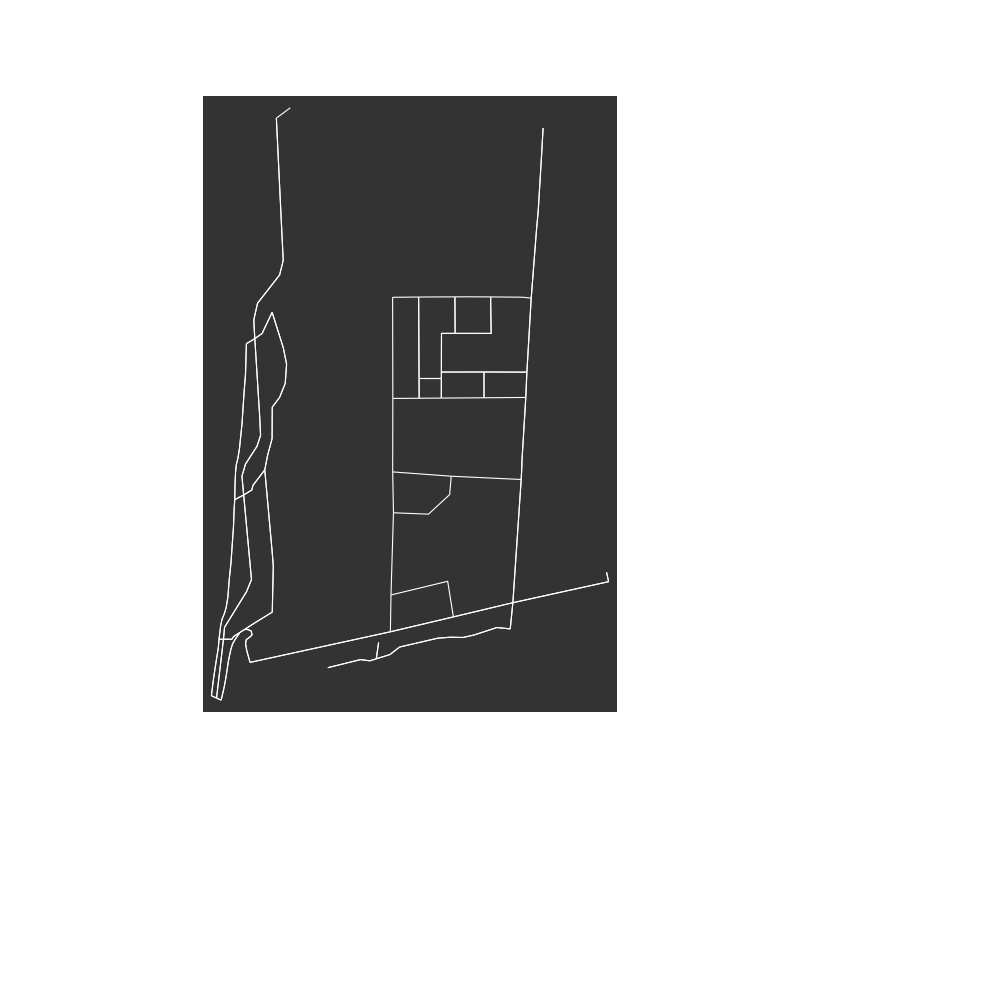

In [35]:
print('cg5:')
print(At_cs[6])
print('')

print('jg5,bg5:')
print(At_cs[16])
print('')

print('ccg5:')
print(At_cs[15])
print('')

print('jg5_2:')
print(At_cs[11], At_cs[12], '', '--->','', At_cs[11]+At_cs[12])
suma_At=At_cs[11]+At_cs[12]
mean_lon=(lon_stop[11]+lon_stop[12])/2.
mean_lat=(lat_stop[11]+lat_stop[12])/2.
print('')

print('mg5,xg5')
print(At_cs[3])
print('')

accions_g5=['Cg5','Jg5+Bg5','CCg5','Jg5', 'Mg5+Xg5']
colors_g5=['seagreen', 'red', 'darkcyan', 'm', 'darkorange']

temps_accions_g5=[At_cs[6],At_cs[16],At_cs[15],suma_At, At_cs[3]]
lon_accions_g5=[lon_stop[6],lon_stop[16],lon_stop[15],mean_lon, lon_stop[3]]
lat_accions_g5=[lat_stop[6],lat_stop[16],lat_stop[15],mean_lat, lat_stop[3]]

max_temps_accions_g5=max(temps_accions_g5)
new_temps_accions_g5=[]
for j in range(len(temps_accions_g5)):
    new_temps_accions_g5.append(temps_accions_g5[j]/max_temps_accions_g5)

new_temps_accions_g5_2=[]
for i in range(len(temps_accions_g5)):
    new_temps_accions_g5_2.append(100*new_temps_accions_g5[i])

    
from shapely.geometry import Point, LineString, Polygon
fig, ax = map_network2(2.2793534239822613, 41.60640928402908, 2.283956227147247,41.60640126017562,  
                       2.2837951863375023,41.60189263168001,  2.2792784442191962, 41.60145135138418)

plt.scatter(lon_accions_g5,lat_accions_g5,c='yellow',s=new_temps_accions_g5_2)
plt.scatter(lon_accions_g5,lat_accions_g5,c=colors_g5,s=1)

bbox_args = dict(boxstyle='square',facecolor='white', edgecolor='k',alpha=0.8)
arrowprops=dict(arrowstyle = '->', connectionstyle='arc3,rad=0',color='white')
for iii in range(len(lon_accions_g5)):
    plt.annotate(str(int(temps_accions_g5[iii]))+ 's'+' '+accions_g5[iii], (lon_accions_g5[iii], lat_accions_g5[iii]),c=colors_g5[iii],size=5,
                 bbox=bbox_args,arrowprops=arrowprops, xytext=(-20, 18),textcoords='offset points')

    
    
#plt.savefig('g5_durada_accions.eps')

plt.show()

## 3.17- GRUP G6

C:\Users\josep\anaconda3\envs\ox\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


GRUP G6
Nombre total daturades: 13
Temps total daturada: 4884.0 s
Temps promig daturada: 375.6923076923077
[33.0, 11.0, 18.0, 828.0, 153.0, 795.0, 12.0, 43.0, 129.0, 2467.0, 81.0, 294.0, 20.0]




<IPython.core.display.Javascript object>


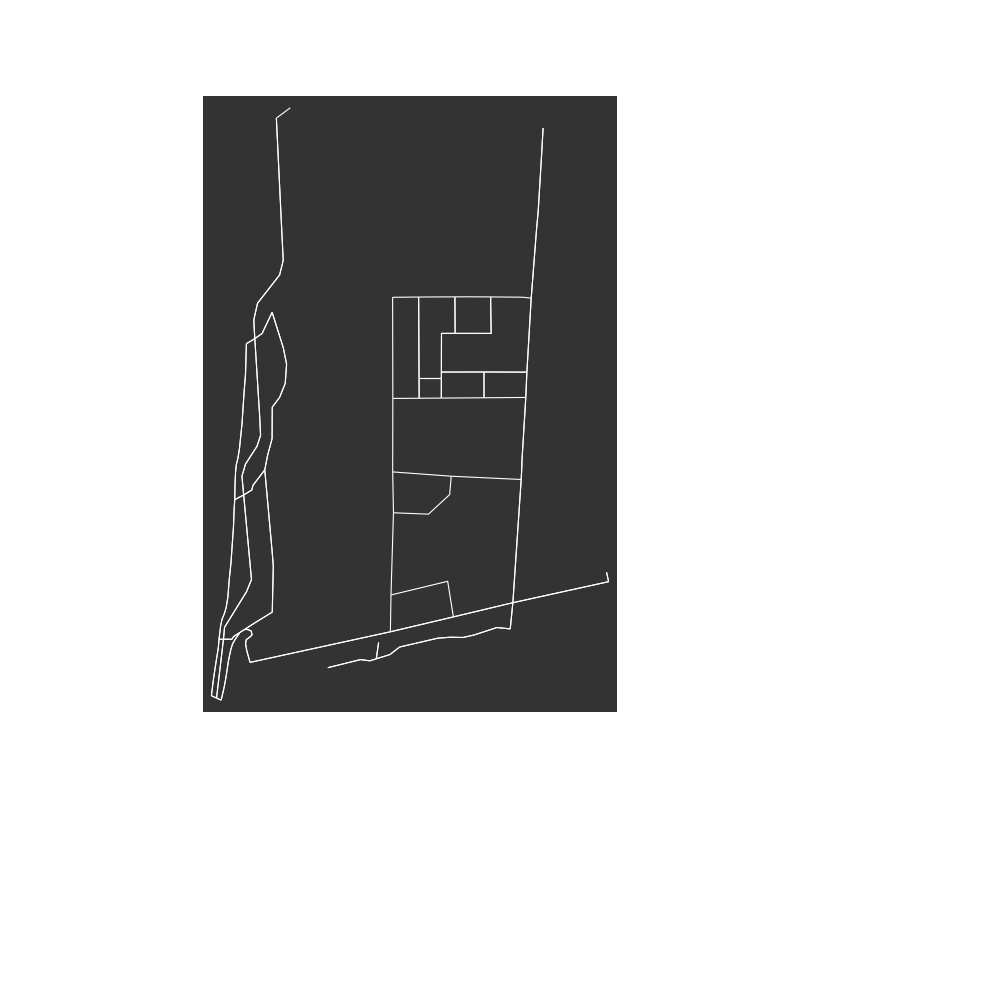

In [36]:
from gpxcsv import gpxtolist
import pandas as pd
import networkx as nx
import osmnx as ox


import matplotlib.pyplot as plt
import numpy as np
import glob
import os
from math import sin, cos, sqrt, atan2, radians
from mpl_toolkits.axes_grid1.inset_locator import inset_axes
from folium import Map
from folium.plugins import HeatMap, HeatMapWithTime
import utm
from matplotlib.animation import FuncAnimation
import matplotlib.animation as animation
from scipy.stats import gaussian_kde
from shapely.geometry import Point, LineString, Polygon
import folium

%matplotlib notebook
#%matplotlib inline
ox.config(use_cache=True, log_console=True)
ox.__version__


df = pd.read_csv('g6.csv') 
print('GRUP G6')
lat=df['lat'].tolist()
lon=df['lon'].tolist()

t=df['At'].tolist()

stops=df['stops']

At_cs=[]

lat_stop=[]
lon_stop=[]

i=0
while i < len(stops):

    if stops[i]=='flight':
        i=i+1

    else:
        s=0
        stopss=[]
        while stops[i+s]=='stop':
            stopss.append(t[i+s])
            s=s+1

        At_c=sum(stopss)
        At_cs.append(At_c)

        lat_stop.append(lat[i])
        lon_stop.append(lon[i])


        i=i+s

print('Nombre total daturades:', len(At_cs))
print('Temps total daturada:', sum(At_cs),'s')
mean_temps=sum(At_cs)/len(At_cs)
print('Temps promig daturada:', sum(At_cs)/len(At_cs))
print(At_cs)
print('')
print('')


from shapely.geometry import Point, LineString, Polygon
fig, ax = map_network2(2.2793534239822613, 41.60640928402908, 2.283956227147247,41.60640126017562,  
                       2.2837951863375023,41.60189263168001,  2.2792784442191962, 41.60145135138418)  # Create the graph from a given latitude and longitude




from turfpy.measurement import boolean_point_in_polygon
from geojson import Point, Polygon, Feature

max_At=max(At_cs)
new_At_cs=[]
for j in range(len(At_cs)):
    new_At_cs.append(At_cs[j]/max_At)

new_At_cs2=[]
for i in range(len(lon_stop)):
    new_At_cs2.append(100*new_At_cs[i])

jg6=[41.60392, 2.2822]
xg6=[41.60349, 2.28187]
mg6=[41.60393, 2.28219]
bg6=[41.6032, 2.28196]
cg6=[41.60347, 2.28185]


lon_accions=[jg6[1], xg6[1], mg6[1], bg6[1], cg6[1]]
lat_accions=[jg6[0], xg6[0], mg6[0], bg6[0], cg6[0]]

plt.plot(jg6[1],jg6[0],'*',c='magenta',markersize=10)
plt.plot(xg6[1],xg6[0],'*',c='magenta',markersize=10)
plt.plot(mg6[1],mg6[0],'*',c='magenta',markersize=10)
plt.plot(bg6[1],bg6[0],'*',c='magenta',markersize=10)
plt.plot(cg6[1],cg6[0],'*',c='magenta',markersize=10)

list_accions=['jg6','xg6','mg6','bg6','cg6']

plt.scatter(lon_stop,lat_stop,c='yellow',s=new_At_cs2)
plt.scatter(lon_stop,lat_stop,c='grey',s=1)

bbox_args = dict(boxstyle='square',facecolor='white', edgecolor='k',alpha=0.7)
arrowprops=dict(arrowstyle = '->', connectionstyle='arc3,rad=0',color='white')
for iii in range(len(lon_stop)):
    if At_cs[iii]>9:
        plt.annotate(str(int(At_cs[iii]))+ 's', (lon_stop[iii], lat_stop[iii]),c='green',size=8,
                     bbox=bbox_args,arrowprops=arrowprops, xytext=(-20, 18),textcoords='offset points')


bbox_args2 = dict(boxstyle='square',facecolor='grey', edgecolor='k',alpha=0.7)
arrowprops2=dict(arrowstyle = '->', connectionstyle='arc3,rad=0',color='white')
for iiii in range(len(list_accions)):
    plt.annotate(list_accions[iiii], (lon_accions[iiii], lat_accions[iiii]),c='red',size=8,
                     bbox=bbox_args2,arrowprops=arrowprops2, xytext=(-20, 18),textcoords='offset points')    
    

At_cs_names=[]
for i in range(len(At_cs)):
    At_cs_names.append(str(At_cs[i])+'s')

names=np.array(At_cs_names)


#annot = ax.annotate("", xy=(0,0), xytext=(20,20),textcoords="offset points",
            #bbox=dict(boxstyle="round", fc="w"),
            #arrowprops=dict(arrowstyle="->", color='white'),fontsize='large')
#annot.set_visible(False)

def update_annot(ind):

    pos = sc.get_offsets()[ind["ind"][0]]
    annot.xy = pos
#text = "{}, {}".format(" ".join(list(map(str,ind["ind"]))), 
                   #" ".join([names[n] for n in ind["ind"]]))

    text = "{}".format(" ".join([names[n] for n in ind["ind"]]))
    annot.set_text(text)
    #annot.get_bbox_patch().set_facecolor(cmap(norm(c[ind["ind"][0]])))
    annot.get_bbox_patch().set_facecolor('limegreen')
    annot.get_bbox_patch().set_alpha(0.7)


def hover(event):
    vis = annot.get_visible()
    if event.inaxes == ax:
        cont, ind = sc.contains(event)
        if cont:
            update_annot(ind)
            annot.set_visible(True)
            fig.canvas.draw_idle()
        else:
            if vis:
                annot.set_visible(False)
                fig.canvas.draw_idle()

#fig.canvas.mpl_connect("motion_notify_event", hover)


#plt.savefig(grupss[tt]+'_stops_duration'+'.eps')
plt.show()



    


C:\Users\josep\anaconda3\envs\ox\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


xg6,cg6:
795.0

bg6:
828.0

mg6,jg6:
129.0 2467.0 81.0  --->  2677.0



<IPython.core.display.Javascript object>


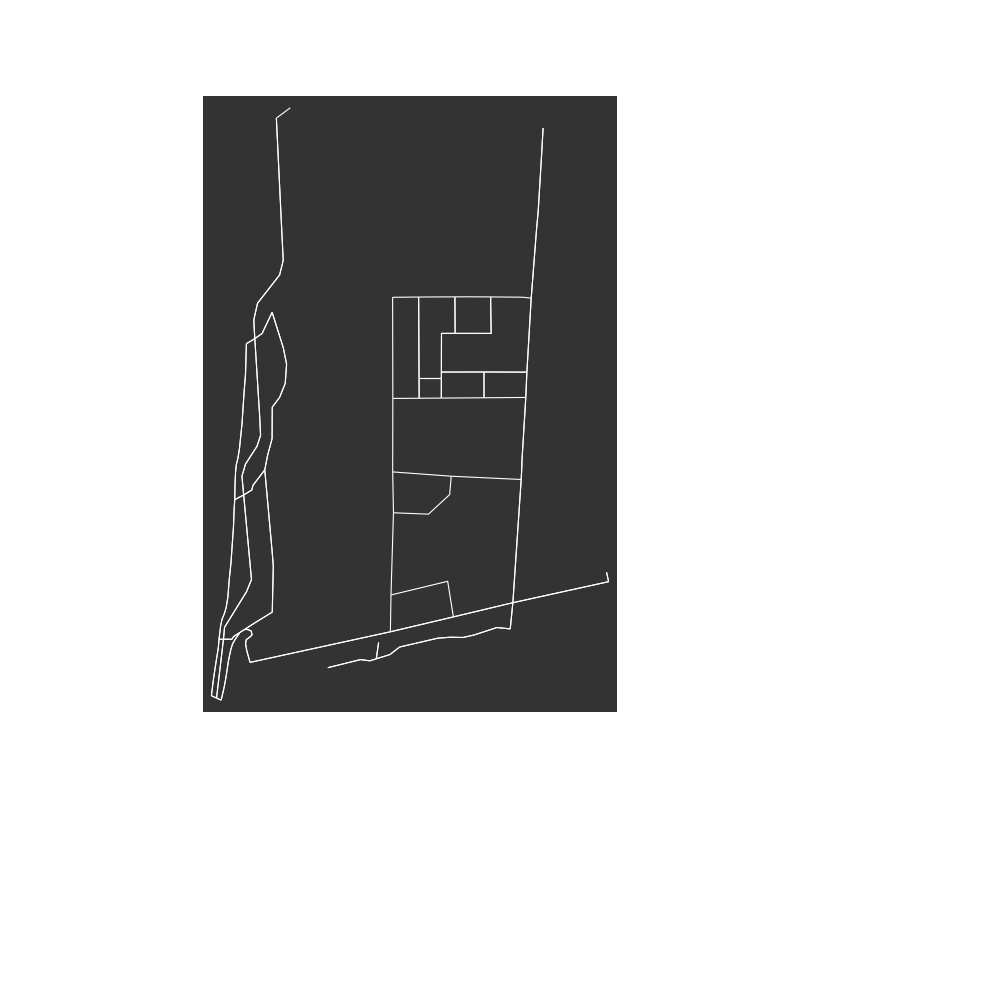

In [37]:
print('xg6,cg6:')
print(At_cs[5])
print('')

print('bg6:')
print(At_cs[3])
print('')

print('mg6,jg6:')
print(At_cs[8], At_cs[9], At_cs[10], '', '--->','', At_cs[8]+At_cs[9]+At_cs[10])
suma_At=At_cs[8]+At_cs[9]+At_cs[10]
mean_lon=(lon_stop[8]+lon_stop[9]+lon_stop[10])/3.
mean_lat=(lat_stop[8]+lat_stop[9]+lat_stop[10])/3.
print('')

accions_g6=['Xg6+Cg6', 'Bg6', 'Mg6+Jg6']
colors_g6=['seagreen', 'red', 'm']

temps_accions_g6=[At_cs[5],At_cs[3],suma_At]
lon_accions_g6=[lon_stop[5],lon_stop[3],mean_lon]
lat_accions_g6=[lat_stop[5],lat_stop[3],mean_lat]

max_temps_accions_g6=max(temps_accions_g6)
new_temps_accions_g6=[]
for j in range(len(temps_accions_g6)):
    new_temps_accions_g6.append(temps_accions_g6[j]/max_temps_accions_g6)

new_temps_accions_g6_2=[]
for i in range(len(temps_accions_g6)):
    new_temps_accions_g6_2.append(100*new_temps_accions_g6[i])

    
from shapely.geometry import Point, LineString, Polygon
fig, ax = map_network2(2.2793534239822613, 41.60640928402908, 2.283956227147247,41.60640126017562,  
                       2.2837951863375023,41.60189263168001,  2.2792784442191962, 41.60145135138418)

plt.scatter(lon_accions_g6,lat_accions_g6,c='yellow',s=new_temps_accions_g6_2)
plt.scatter(lon_accions_g6,lat_accions_g6,c=colors_g6,s=1)

bbox_args = dict(boxstyle='square',facecolor='white', edgecolor='k',alpha=0.8)
arrowprops=dict(arrowstyle = '->', connectionstyle='arc3,rad=0',color='white')
for iii in range(len(lon_accions_g6)):
    plt.annotate(str(int(temps_accions_g6[iii]))+ 's'+' '+accions_g6[iii], (lon_accions_g6[iii], lat_accions_g6[iii]),c=colors_g6[iii],size=5,
                 bbox=bbox_args,arrowprops=arrowprops, xytext=(-20, 18),textcoords='offset points')

    
    
#plt.savefig('g6_durada_accions.eps')

plt.show()

## 3.18- GRUP G7

C:\Users\josep\anaconda3\envs\ox\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


GRUP G7
Nombre total daturades: 22
Temps total daturada: 5213.0 s
Temps promig daturada: 236.95454545454547
[33.0, 1955.0, 13.0, 10.0, 194.0, 723.0, 36.0, 21.0, 35.0, 303.0, 428.0, 89.0, 239.0, 53.0, 41.0, 68.0, 67.0, 10.0, 642.0, 181.0, 59.0, 13.0]




<IPython.core.display.Javascript object>


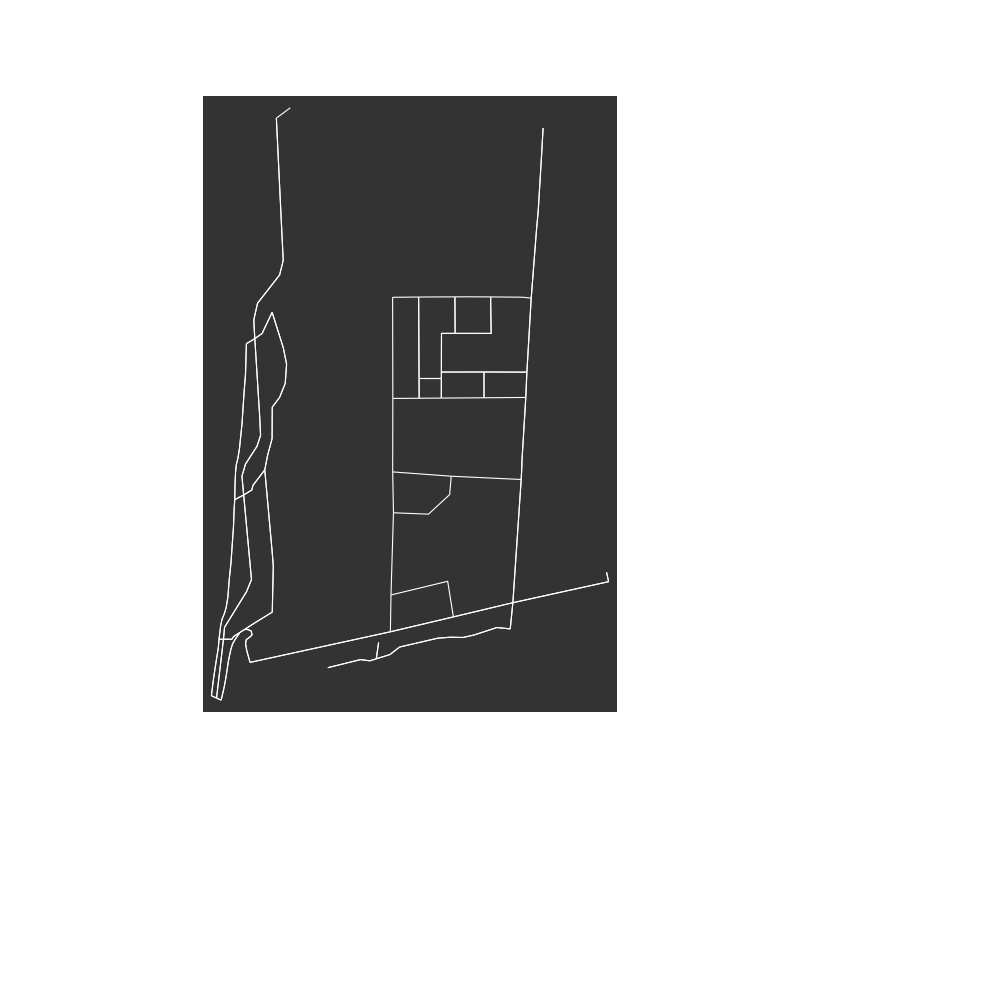

In [38]:
from gpxcsv import gpxtolist
import pandas as pd
import networkx as nx
import osmnx as ox


import matplotlib.pyplot as plt
import numpy as np
import glob
import os
from math import sin, cos, sqrt, atan2, radians
from mpl_toolkits.axes_grid1.inset_locator import inset_axes
from folium import Map
from folium.plugins import HeatMap, HeatMapWithTime
import utm
from matplotlib.animation import FuncAnimation
import matplotlib.animation as animation
from scipy.stats import gaussian_kde
from shapely.geometry import Point, LineString, Polygon
import folium

%matplotlib notebook
#%matplotlib inline
ox.config(use_cache=True, log_console=True)
ox.__version__


df = pd.read_csv('g7.csv') 
print('GRUP G7')
lat=df['lat'].tolist()
lon=df['lon'].tolist()

t=df['At'].tolist()

stops=df['stops']

At_cs=[]

lat_stop=[]
lon_stop=[]

i=0
while i < len(stops):

    if stops[i]=='flight':
        i=i+1

    else:
        s=0
        stopss=[]
        while stops[i+s]=='stop':
            stopss.append(t[i+s])
            s=s+1

        At_c=sum(stopss)
        At_cs.append(At_c)

        lat_stop.append(lat[i])
        lon_stop.append(lon[i])


        i=i+s

print('Nombre total daturades:', len(At_cs))
print('Temps total daturada:', sum(At_cs),'s')
mean_temps=sum(At_cs)/len(At_cs)
print('Temps promig daturada:', sum(At_cs)/len(At_cs))
print(At_cs)
print('')
print('')


from shapely.geometry import Point, LineString, Polygon
fig, ax = map_network2(2.2793534239822613, 41.60640928402908, 2.283956227147247,41.60640126017562,  
                       2.2837951863375023,41.60189263168001,  2.2792784442191962, 41.60145135138418)  # Create the graph from a given latitude and longitude




from turfpy.measurement import boolean_point_in_polygon
from geojson import Point, Polygon, Feature

max_At=max(At_cs)
new_At_cs=[]
for j in range(len(At_cs)):
    new_At_cs.append(At_cs[j]/max_At)

new_At_cs2=[]
for i in range(len(lon_stop)):
    new_At_cs2.append(100*new_At_cs[i])

jg7=[41.60365, 2.28226]
xg7=[41.60366, 2.28224]
mg7=[41.60365, 2.28228]
bg7=[41.60366, 2.28222]
cg7=[41.60367, 2.28225]
ccg7=[41.60333, 2.28171]


lon_accions=[jg7[1], xg7[1], mg7[1], bg7[1], cg7[1], ccg7[1]]
lat_accions=[jg7[0], xg7[0], mg7[0], bg7[0], cg7[0], ccg7[0]]

plt.plot(jg7[1],jg7[0],'*',c='magenta',markersize=10)
plt.plot(xg7[1],xg7[0],'*',c='magenta',markersize=10)
plt.plot(mg7[1],mg7[0],'*',c='magenta',markersize=10)
plt.plot(bg7[1],bg7[0],'*',c='magenta',markersize=10)
plt.plot(cg7[1],cg7[0],'*',c='magenta',markersize=10)
plt.plot(ccg7[1],ccg7[0],'*',c='magenta',markersize=10)

list_accions=['jg7','xg7','mg7','bg7','cg7','ccg7']

plt.scatter(lon_stop,lat_stop,c='yellow',s=new_At_cs2)
plt.scatter(lon_stop,lat_stop,c='grey',s=1)

bbox_args = dict(boxstyle='square',facecolor='white', edgecolor='k',alpha=0.7)
arrowprops=dict(arrowstyle = '->', connectionstyle='arc3,rad=0',color='white')
for iii in range(len(lon_stop)):
    if At_cs[iii]>9:
        plt.annotate(str(int(At_cs[iii]))+ 's', (lon_stop[iii], lat_stop[iii]),c='green',size=8,
                     bbox=bbox_args,arrowprops=arrowprops, xytext=(-20, 18),textcoords='offset points')


bbox_args2 = dict(boxstyle='square',facecolor='grey', edgecolor='k',alpha=0.7)
arrowprops2=dict(arrowstyle = '->', connectionstyle='arc3,rad=0',color='white')
for iiii in range(len(list_accions)):
    plt.annotate(list_accions[iiii], (lon_accions[iiii], lat_accions[iiii]),c='red',size=8,
                     bbox=bbox_args2,arrowprops=arrowprops2, xytext=(-20, 18),textcoords='offset points')    
    

At_cs_names=[]
for i in range(len(At_cs)):
    At_cs_names.append(str(At_cs[i])+'s')

names=np.array(At_cs_names)


#annot = ax.annotate("", xy=(0,0), xytext=(20,20),textcoords="offset points",
            #bbox=dict(boxstyle="round", fc="w"),
            #arrowprops=dict(arrowstyle="->", color='white'),fontsize='large')
#annot.set_visible(False)

def update_annot(ind):

    pos = sc.get_offsets()[ind["ind"][0]]
    annot.xy = pos
#text = "{}, {}".format(" ".join(list(map(str,ind["ind"]))), 
                   #" ".join([names[n] for n in ind["ind"]]))

    text = "{}".format(" ".join([names[n] for n in ind["ind"]]))
    annot.set_text(text)
    #annot.get_bbox_patch().set_facecolor(cmap(norm(c[ind["ind"][0]])))
    annot.get_bbox_patch().set_facecolor('limegreen')
    annot.get_bbox_patch().set_alpha(0.7)


def hover(event):
    vis = annot.get_visible()
    if event.inaxes == ax:
        cont, ind = sc.contains(event)
        if cont:
            update_annot(ind)
            annot.set_visible(True)
            fig.canvas.draw_idle()
        else:
            if vis:
                annot.set_visible(False)
                fig.canvas.draw_idle()

#fig.canvas.mpl_connect("motion_notify_event", hover)


#plt.savefig(grupss[tt]+'_stops_duration'+'.eps')
plt.show()



    


C:\Users\josep\anaconda3\envs\ox\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


ccg7:
1955.0

bg7,cg7,xg7,jg7,mg7:
194.0 723.0 36.0 21.0 35.0 303.0 428.0 89.0 239.0 53.0 41.0 68.0 67.0 10.0 642.0 181.0  --->  3130.0



<IPython.core.display.Javascript object>


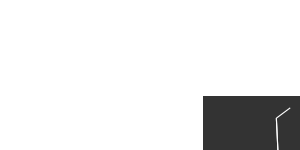

In [39]:
print('ccg7:')
print(At_cs[1])
print('')

print('bg7,cg7,xg7,jg7,mg7:')
print(At_cs[4], At_cs[5], At_cs[6], At_cs[7], At_cs[8],At_cs[9], At_cs[10], At_cs[11], At_cs[12],
      At_cs[13], At_cs[14], At_cs[15], At_cs[16], At_cs[17], At_cs[18], At_cs[19], '', '--->','', 
      At_cs[4]+At_cs[5]+At_cs[6]+At_cs[7]+At_cs[8]+At_cs[9]+At_cs[10]+At_cs[11]+At_cs[12]+At_cs[13]+At_cs[14]+At_cs[15]+At_cs[16]+At_cs[17]+At_cs[18]+At_cs[19])
suma_At=At_cs[4]+At_cs[5]+At_cs[6]+At_cs[7]+At_cs[8]+At_cs[9]+At_cs[10]+At_cs[11]+At_cs[12]+At_cs[13]+At_cs[14]+At_cs[15]+At_cs[16]+At_cs[17]+At_cs[18]+At_cs[19]
mean_lon=(lon_stop[4]+lon_stop[5]+lon_stop[6]+lon_stop[7]+lon_stop[8]+lon_stop[9]+lon_stop[10]+lon_stop[11]+lon_stop[12]+lon_stop[13]+lon_stop[14]+lon_stop[15]+lon_stop[16]+lon_stop[17]+lon_stop[18]+lon_stop[19])/16.
mean_lat=(lat_stop[4]+lat_stop[5]+lat_stop[6]+lat_stop[7]+lat_stop[8]+lat_stop[9]+lat_stop[10]+lat_stop[11]+lat_stop[12]+lat_stop[13]+lat_stop[14]+lat_stop[15]+lat_stop[16]+lat_stop[17]+lat_stop[18]+lat_stop[19])/16.
print('')

accions_g7=['CCg7', 'Bg7+Cg7+Xg7+Jg7+Mg7']
colors_g7=['darkcyan','red']

temps_accions_g7=[At_cs[1],suma_At]
lon_accions_g7=[lon_stop[1],mean_lon]
lat_accions_g7=[lat_stop[1],mean_lat]

max_temps_accions_g7=max(temps_accions_g7)
new_temps_accions_g7=[]
for j in range(len(temps_accions_g7)):
    new_temps_accions_g7.append(temps_accions_g7[j]/max_temps_accions_g7)

new_temps_accions_g7_2=[]
for i in range(len(temps_accions_g7)):
    new_temps_accions_g7_2.append(100*new_temps_accions_g7[i])

    
from shapely.geometry import Point, LineString, Polygon
fig, ax = map_network2(2.2793534239822613, 41.60640928402908, 2.283956227147247,41.60640126017562,  
                       2.2837951863375023,41.60189263168001,  2.2792784442191962, 41.60145135138418)

plt.scatter(lon_accions_g7,lat_accions_g7,c='yellow',s=new_temps_accions_g7_2)
plt.scatter(lon_accions_g7,lat_accions_g7,c=colors_g7,s=1)

bbox_args = dict(boxstyle='square',facecolor='white', edgecolor='k',alpha=0.8)
arrowprops=dict(arrowstyle = '->', connectionstyle='arc3,rad=0',color='white')
for iii in range(len(lon_accions_g7)):
    plt.annotate(str(int(temps_accions_g7[iii]))+ 's'+' '+accions_g7[iii], (lon_accions_g7[iii], lat_accions_g7[iii]),c=colors_g7[iii],size=5,
                 bbox=bbox_args,arrowprops=arrowprops, xytext=(-20, 18),textcoords='offset points')

    
    
#plt.savefig('g7_durada_accions.eps')

plt.show()

## 3.19- GRUP G8

C:\Users\josep\anaconda3\envs\ox\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


GRUP G8
Nombre total daturades: 15
Temps total daturada: 2554.0 s
Temps promig daturada: 170.26666666666668
[42.0, 11.0, 918.0, 38.0, 675.0, 12.0, 12.0, 10.0, 24.0, 13.0, 214.0, 351.0, 91.0, 18.0, 125.0]




<IPython.core.display.Javascript object>


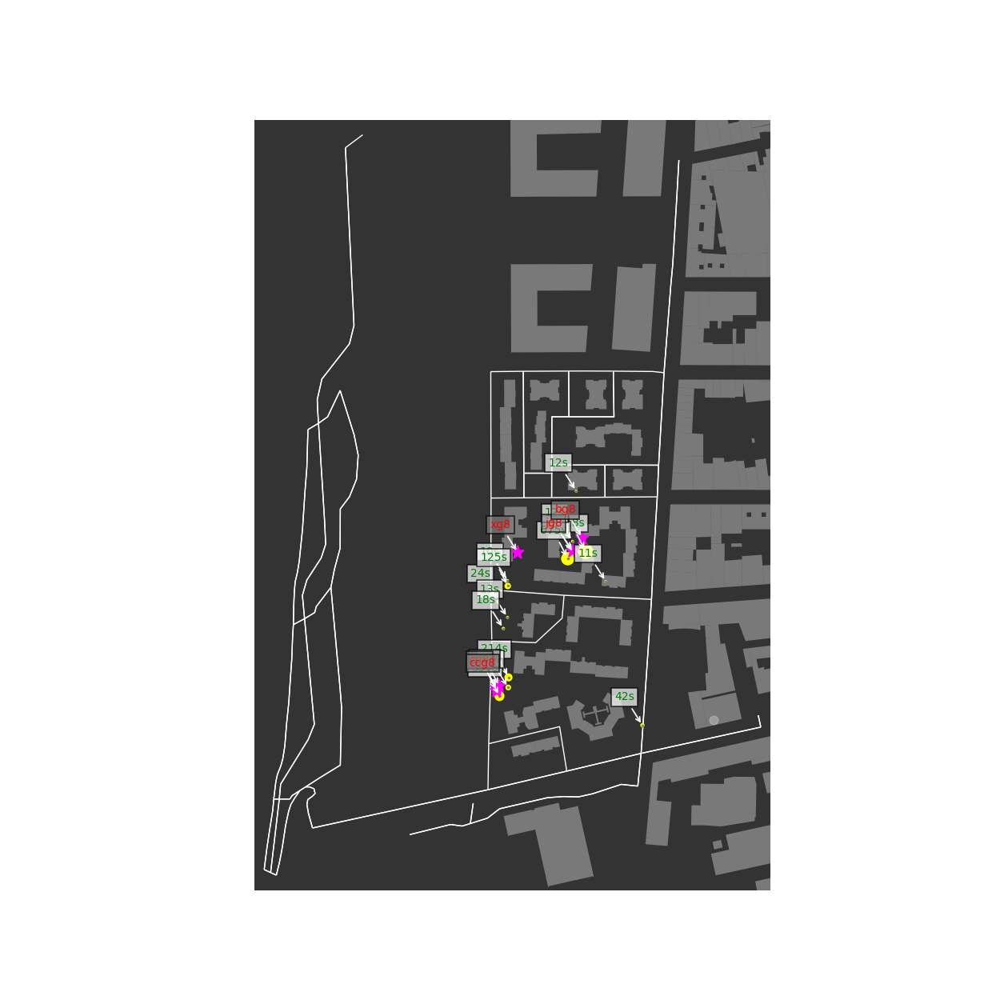

In [40]:
from gpxcsv import gpxtolist
import pandas as pd
import networkx as nx
import osmnx as ox


import matplotlib.pyplot as plt
import numpy as np
import glob
import os
from math import sin, cos, sqrt, atan2, radians
from mpl_toolkits.axes_grid1.inset_locator import inset_axes
from folium import Map
from folium.plugins import HeatMap, HeatMapWithTime
import utm
from matplotlib.animation import FuncAnimation
import matplotlib.animation as animation
from scipy.stats import gaussian_kde
from shapely.geometry import Point, LineString, Polygon
import folium

%matplotlib notebook
#%matplotlib inline
ox.config(use_cache=True, log_console=True)
ox.__version__


df = pd.read_csv('g8.csv') 
print('GRUP G8')
lat=df['lat'].tolist()
lon=df['lon'].tolist()

t=df['At'].tolist()

stops=df['stops']

At_cs=[]

lat_stop=[]
lon_stop=[]

i=0
while i < len(stops):

    if stops[i]=='flight':
        i=i+1

    else:
        s=0
        stopss=[]
        while stops[i+s]=='stop':
            stopss.append(t[i+s])
            s=s+1

        At_c=sum(stopss)
        At_cs.append(At_c)

        lat_stop.append(lat[i])
        lon_stop.append(lon[i])


        i=i+s

print('Nombre total daturades:', len(At_cs))
print('Temps total daturada:', sum(At_cs),'s')
mean_temps=sum(At_cs)/len(At_cs)
print('Temps promig daturada:', sum(At_cs)/len(At_cs))
print(At_cs)
print('')
print('')


from shapely.geometry import Point, LineString, Polygon
fig, ax = map_network2(2.2793534239822613, 41.60640928402908, 2.283956227147247,41.60640126017562,  
                       2.2837951863375023,41.60189263168001,  2.2792784442191962, 41.60145135138418)  # Create the graph from a given latitude and longitude




from turfpy.measurement import boolean_point_in_polygon
from geojson import Point, Polygon, Feature

max_At=max(At_cs)
new_At_cs=[]
for j in range(len(At_cs)):
    new_At_cs.append(At_cs[j]/max_At)

new_At_cs2=[]
for i in range(len(lon_stop)):
    new_At_cs2.append(100*new_At_cs[i])

jg8=[41.60366, 2.28224]
xg8=[41.60365, 2.28179]
mg8=[41.60283, 2.28164]
bg8=[41.60374, 2.28232]
cg8=[41.60282, 2.28162]
ccg8=[41.6028, 2.28162]


lon_accions=[jg8[1], xg8[1], mg8[1], bg8[1], cg8[1], ccg8[1]]
lat_accions=[jg8[0], xg8[0], mg8[0], bg8[0], cg8[0], ccg8[0]]

plt.plot(jg8[1],jg8[0],'*',c='magenta',markersize=10)
plt.plot(xg8[1],xg8[0],'*',c='magenta',markersize=10)
plt.plot(mg8[1],mg8[0],'*',c='magenta',markersize=10)
plt.plot(bg8[1],bg8[0],'*',c='magenta',markersize=10)
plt.plot(cg8[1],cg8[0],'*',c='magenta',markersize=10)
plt.plot(ccg8[1],ccg8[0],'*',c='magenta',markersize=10)

list_accions=['jg8','xg8','mg8','bg8','cg8','ccg8']

plt.scatter(lon_stop,lat_stop,c='yellow',s=new_At_cs2)
plt.scatter(lon_stop,lat_stop,c='grey',s=1)

bbox_args = dict(boxstyle='square',facecolor='white', edgecolor='k',alpha=0.7)
arrowprops=dict(arrowstyle = '->', connectionstyle='arc3,rad=0',color='white')
for iii in range(len(lon_stop)):
    if At_cs[iii]>9:
        plt.annotate(str(int(At_cs[iii]))+ 's', (lon_stop[iii], lat_stop[iii]),c='green',size=8,
                     bbox=bbox_args,arrowprops=arrowprops, xytext=(-20, 18),textcoords='offset points')


bbox_args2 = dict(boxstyle='square',facecolor='grey', edgecolor='k',alpha=0.7)
arrowprops2=dict(arrowstyle = '->', connectionstyle='arc3,rad=0',color='white')
for iiii in range(len(list_accions)):
    plt.annotate(list_accions[iiii], (lon_accions[iiii], lat_accions[iiii]),c='red',size=8,
                     bbox=bbox_args2,arrowprops=arrowprops2, xytext=(-20, 18),textcoords='offset points')    
    

At_cs_names=[]
for i in range(len(At_cs)):
    At_cs_names.append(str(At_cs[i])+'s')

names=np.array(At_cs_names)


#annot = ax.annotate("", xy=(0,0), xytext=(20,20),textcoords="offset points",
            #bbox=dict(boxstyle="round", fc="w"),
            #arrowprops=dict(arrowstyle="->", color='white'),fontsize='large')
#annot.set_visible(False)

def update_annot(ind):

    pos = sc.get_offsets()[ind["ind"][0]]
    annot.xy = pos
#text = "{}, {}".format(" ".join(list(map(str,ind["ind"]))), 
                   #" ".join([names[n] for n in ind["ind"]]))

    text = "{}".format(" ".join([names[n] for n in ind["ind"]]))
    annot.set_text(text)
    #annot.get_bbox_patch().set_facecolor(cmap(norm(c[ind["ind"][0]])))
    annot.get_bbox_patch().set_facecolor('limegreen')
    annot.get_bbox_patch().set_alpha(0.7)


def hover(event):
    vis = annot.get_visible()
    if event.inaxes == ax:
        cont, ind = sc.contains(event)
        if cont:
            update_annot(ind)
            annot.set_visible(True)
            fig.canvas.draw_idle()
        else:
            if vis:
                annot.set_visible(False)
                fig.canvas.draw_idle()

#fig.canvas.mpl_connect("motion_notify_event", hover)


#plt.savefig(grupss[tt]+'_stops_duration'+'.eps')
plt.show()



    


C:\Users\josep\anaconda3\envs\ox\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


cg8,ccg8,mg8:
214.0 351.0 91.0  --->  656.0

bg8
918.0

jg8:
38.0 675.0  --->  713.0

xg8
400



<IPython.core.display.Javascript object>


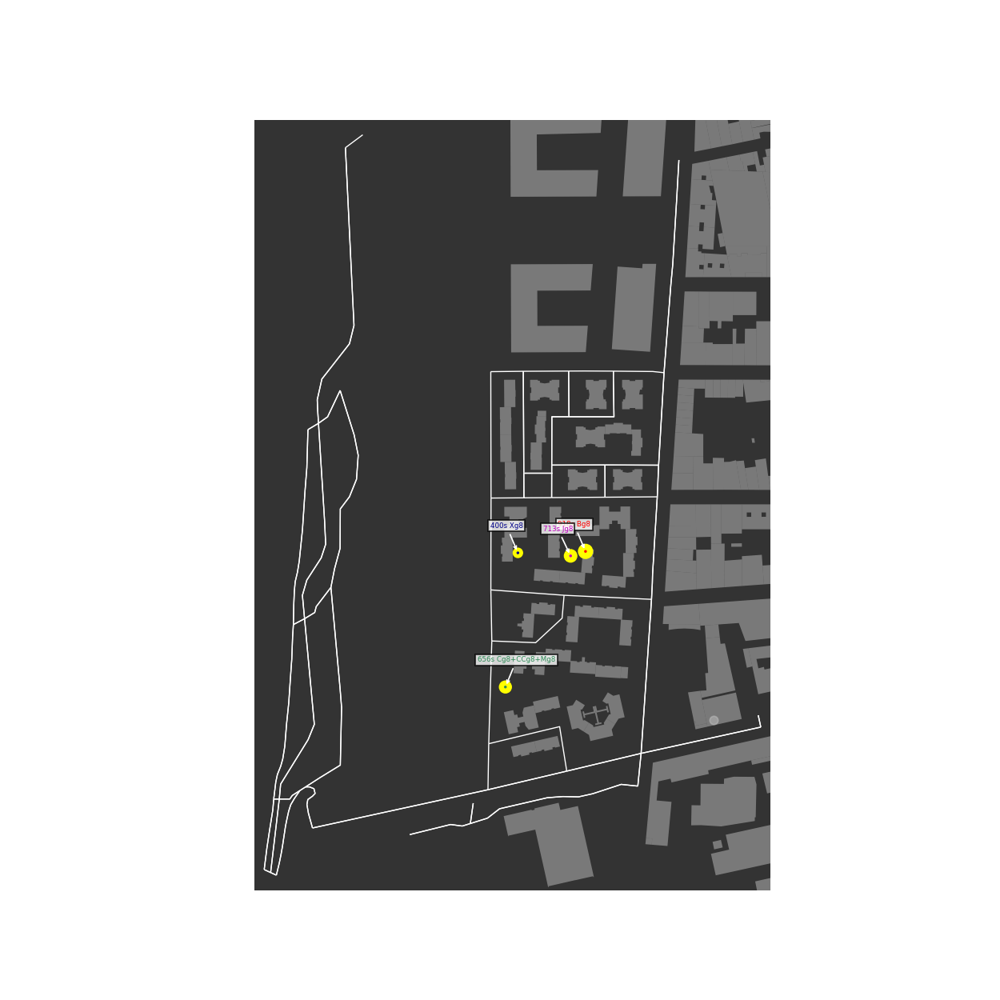

In [41]:
print('cg8,ccg8,mg8:')
print(At_cs[10], At_cs[11], At_cs[12], '', '--->','', At_cs[10]+At_cs[11]+At_cs[12])
suma_At=At_cs[10]+At_cs[11]+At_cs[12]
mean_lon=(lon_stop[10]+lon_stop[11]+lon_stop[12])/3.
mean_lat=(lat_stop[10]+lat_stop[11]+lat_stop[12])/3.
print('')

print('bg8')
print(At_cs[2])
print('')

print('jg8:')
print(At_cs[3], At_cs[4],'', '--->','', At_cs[3]+At_cs[4])
suma_At2=At_cs[3]+At_cs[4]
mean_lon2=(lon_stop[3]+lon_stop[4])/2.
mean_lat2=(lat_stop[3]+lat_stop[4])/2.
print('')

print('xg8')
print(400)
print('')

accions_g8=['Cg8+CCg8+Mg8', 'Bg8', 'Jg8', 'Xg8']
colors_g8=['seagreen','red', 'm', 'darkblue']

temps_accions_g8=[suma_At,At_cs[2],suma_At2, 400]
lon_accions_g8=[mean_lon,lon_stop[2],mean_lon2, xg8[1]]
lat_accions_g8=[mean_lat,lat_stop[2],mean_lat2, xg8[0]]

max_temps_accions_g8=max(temps_accions_g8)
new_temps_accions_g8=[]
for j in range(len(temps_accions_g8)):
    new_temps_accions_g8.append(temps_accions_g8[j]/max_temps_accions_g8)

new_temps_accions_g8_2=[]
for i in range(len(temps_accions_g8)):
    new_temps_accions_g8_2.append(100*new_temps_accions_g8[i])

    
from shapely.geometry import Point, LineString, Polygon
fig, ax = map_network2(2.2793534239822613, 41.60640928402908, 2.283956227147247,41.60640126017562,  
                       2.2837951863375023,41.60189263168001,  2.2792784442191962, 41.60145135138418)

plt.scatter(lon_accions_g8,lat_accions_g8,c='yellow',s=new_temps_accions_g8_2)
plt.scatter(lon_accions_g8,lat_accions_g8,c=colors_g8,s=1)

bbox_args = dict(boxstyle='square',facecolor='white', edgecolor='k',alpha=0.8)
arrowprops=dict(arrowstyle = '->', connectionstyle='arc3,rad=0',color='white')
for iii in range(len(lon_accions_g8)):
    plt.annotate(str(int(temps_accions_g8[iii]))+ 's'+' '+accions_g8[iii], (lon_accions_g8[iii], lat_accions_g8[iii]),c=colors_g8[iii],size=5,
                 bbox=bbox_args,arrowprops=arrowprops, xytext=(-20, 18),textcoords='offset points')

    
    
#plt.savefig('g8_durada_accions.eps')

plt.show()

# 4. Map of missions (all groups)

C:\Users\josep\anaconda3\envs\ox\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


<IPython.core.display.Javascript object>


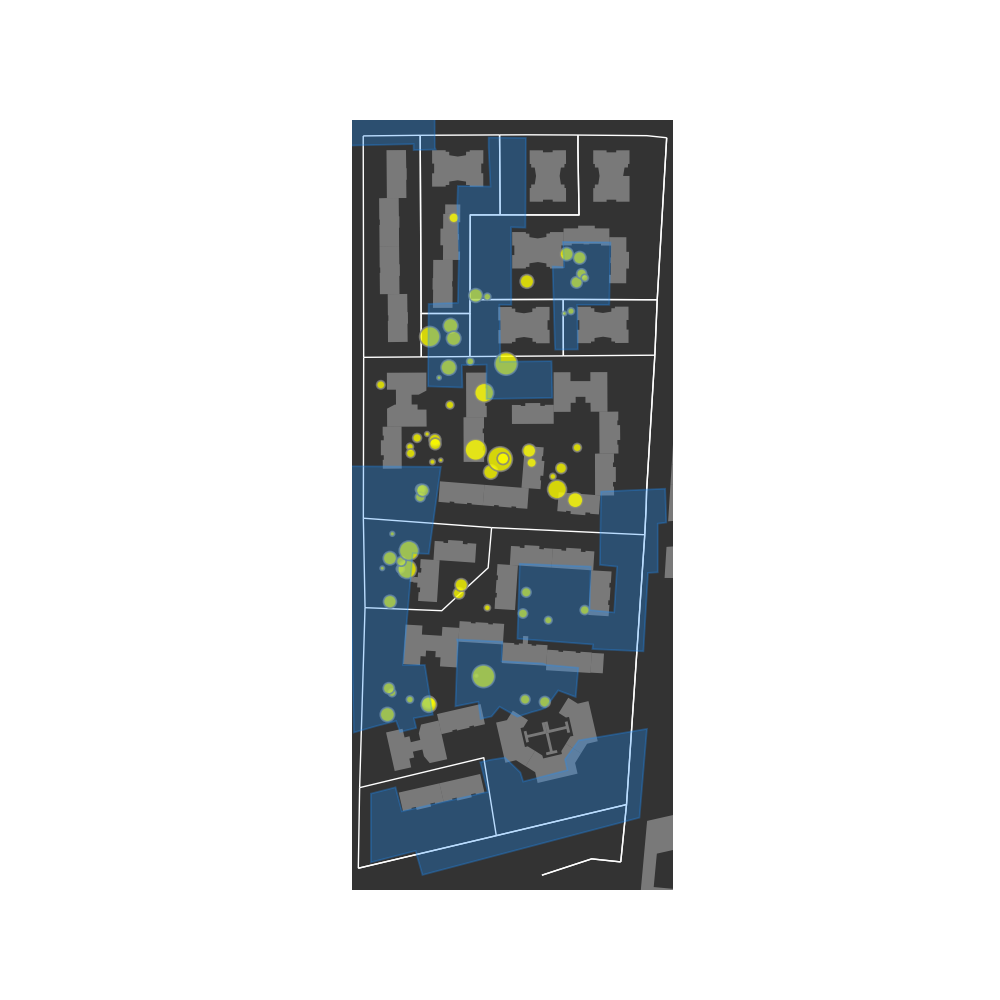

In [43]:
temps_accions_tots=temps_accions_e1+temps_accions_e2+temps_accions_e3+temps_accions_e4+temps_accions_e5+temps_accions_e6+temps_accions_e7+temps_accions_p1+temps_accions_p2+temps_accions_p4+temps_accions_g1+temps_accions_g2+temps_accions_g3+temps_accions_g4+temps_accions_g5+temps_accions_g6+temps_accions_g7+temps_accions_g8
        
lon_accions_tots=lon_accions_e1+lon_accions_e2+lon_accions_e3+lon_accions_e4+lon_accions_e5+lon_accions_e6+lon_accions_e7+lon_accions_p1+lon_accions_p2+lon_accions_p4+lon_accions_g1+lon_accions_g2+lon_accions_g3+lon_accions_g4+lon_accions_g5+lon_accions_g6+lon_accions_g7+lon_accions_g8
        
lat_accions_tots=lat_accions_e1+lat_accions_e2+lat_accions_e3+lat_accions_e4+lat_accions_e5+lat_accions_e6+lat_accions_e7+lat_accions_p1+lat_accions_p2+lat_accions_p4+lat_accions_g1+lat_accions_g2+lat_accions_g3+lat_accions_g4+lat_accions_g5+lat_accions_g6+lat_accions_g7+lat_accions_g8

max_temps_accions_tots=max(temps_accions_tots)
new_temps_accions_tots=[]
for j in range(len(temps_accions_tots)):
    new_temps_accions_tots.append(temps_accions_tots[j]/max_temps_accions_tots)

new_temps_accions_tots_2=[]
for i in range(len(temps_accions_tots)):
    new_temps_accions_tots_2.append(200*new_temps_accions_tots[i])

    
from shapely.geometry import Point, LineString, Polygon
#fig, ax = map_network2(2.2793534239822613, 41.60640928402908, 2.283956227147247,41.60640126017562,  
                       #2.2837951863375023,41.60189263168001,  2.2792784442191962, 41.60145135138418)

fig, ax = map_network2(2.281360214992873, 41.60490094217022,  2.2832446102027033,41.60486739320454,  
                       2.283003587646014,41.602205708124075,  2.281365086042438, 41.60206636619056)

from geojson import Point, Polygon, Feature

p01=Polygon([[(2.281903, 41.6047224), (2.2819017, 41.6049109), (2.2817113, 41.6049139), (2.2817193, 41.6054674),
       (2.281439, 41.6054674), (2.2814618, 41.6047274), (2.2818038, 41.6047334), (2.2818038, 41.6047123), 
       (2.2819071, 41.6047143), (2.281903, 41.6047224),]])


c01=Polygon([[(2.2821551, 41.6047224), (2.2821638, 41.6045846), (2.2820109, 41.6045866), (2.2820083, 41.6045224), 
       (2.2820163, 41.6043559), (2.2820109, 41.6041774), (2.2818741, 41.6041734), (2.2818715, 41.6038846),
       (2.2820324, 41.6038806), (2.2820297, 41.6039588), (2.2821451, 41.6039608), (2.2821451, 41.6038405), 
       (2.2824535, 41.6038445), (2.2824497, 41.603973), (2.2822096, 41.603971), (2.2822092, 41.6040323), 
       (2.2822058, 41.6041707), (2.2822615, 41.6041702), (2.2822604, 41.6044421), (2.2823274, 41.6044406), 
       (2.2823294, 41.604755), (2.2821551, 41.6047565), (2.2821551, 41.6047224),]])

c02=Polygon([[(2.2824656, 41.6040279), (2.2824669, 41.6040134), (2.2825729, 41.6040139), (2.2825702, 41.6041703),
       (2.2827204, 41.6041703), (2.2827258, 41.6043889), (2.2825032, 41.6043909), (2.2825085, 41.6043027),
       (2.2824549, 41.6043047), (2.2824656, 41.6040279),]])

p02=Polygon([[(2.2815208, 41.6036047), (2.2814974, 41.6036052), (2.2815235, 41.6026721), (2.2816362, 41.6026962), 
       (2.281722, 41.6027122), (2.2817408, 41.6026741), (2.2818159, 41.6026881), (2.2818051, 41.6027222), 
       (2.2818936, 41.6027343), (2.2818561, 41.6029088), (2.2817542, 41.6029088), (2.2817998, 41.6032999),
       (2.2818749, 41.6032979), (2.2819312, 41.6036027), (2.2815208, 41.6036047),]])

c04=Polygon([[(2.2820103, 41.6029885), (2.2819996, 41.6027639), (2.2821069, 41.6027799), (2.2821176, 41.6027198), 
       (2.2821688, 41.6027284), (2.2822063, 41.6027625), (2.2822895, 41.6027274), (2.282321, 41.6027349), 
       (2.2823364, 41.6027384), (2.2823585, 41.6027439), (2.2823773, 41.6027475), (2.2824001, 41.6027525), 
       (2.2824222, 41.6027585), (2.2824812, 41.6028196), (2.282563, 41.6027966), (2.2825751, 41.6028989), 
       (2.2824263, 41.6029089), (2.2824102, 41.6029139), (2.2822157, 41.6029219), (2.2822197, 41.6029901),
       (2.2820065, 41.6029981), (2.2820103, 41.6029885),]])

p04=Polygon([[(2.2828616, 41.6023738), (2.2828965, 41.6026847), (2.2825773, 41.6026446), (2.282513, 41.6025784), 
       (2.2825237, 41.6025403), (2.2823172, 41.6025002), (2.2823037, 41.6025322), (2.2822313, 41.6025844),
       (2.2821643, 41.6025764), (2.282116, 41.6025683), (2.2821509, 41.6024641), (2.2817485, 41.6023959), 
       (2.281719, 41.6024801), (2.2816037, 41.602458), (2.2816037, 41.6022174), (2.2818129, 41.6022575), 
       (2.2818451, 41.6021732), (2.2828616, 41.6023738),]])

p03=Polygon([[(2.2826815, 41.603516), (2.2826762, 41.6032593), (2.2827566, 41.6032533), (2.2827432, 41.6030928), 
       (2.2826279, 41.6031009), (2.2826333, 41.6032533), (2.2823007, 41.6032633), (2.2822899, 41.6030006),
       (2.282644, 41.6029805), (2.2826413, 41.6029645), (2.28288, 41.6029565), (2.2829015, 41.6032312),
       (2.2829471, 41.6032332), (2.2829471, 41.6034037), (2.2829873, 41.6034077), (2.282982, 41.6035261),
       (2.2826815, 41.603516),]])


x_p01=[2.281903,2.2819017,2.2817113,2.2817193,2.281439,2.2814618,2.2818038,2.2818038,2.2819071,2.281903]
y_p01=[41.6047224,41.6049109, 41.6049139, 41.6054674, 41.6054674, 41.6047274, 41.6047334, 41.6047123, 41.6047143, 41.6047224]

x_c01=[2.2821551,2.2821638,2.2820109,2.2820083,2.2820163,2.2820109,2.2818741,2.2818715,2.2820324,2.2820297,2.2821451,2.2821451,
       2.2824535,2.2824497,2.2822096,2.2822092,2.2822058,2.2822615,2.2822604,2.2823274,2.2823294,2.2821551,2.2821551]
y_c01=[41.6047224,41.6045846,41.6045866,41.6045224,41.6043559, 41.6041774, 41.6041734, 41.6038846, 41.6038806, 41.6039588,
       41.6039608, 41.6038405, 41.6038445, 41.603973, 41.603971, 41.6040323, 41.6041707, 41.6041702, 41.6044421, 41.6044406, 
       41.604755, 41.6047565, 41.6047224]

x_c02=[2.2824656,2.2824669,2.2825729,2.2825702,2.2827204,2.2827258,2.2825032,2.2825085,2.2824549,2.2824656]
y_c02=[41.6040279, 41.6040134, 41.6040139, 41.6041703, 41.6041703, 41.6043889, 41.6043909, 41.6043027, 41.6043047, 41.6040279]

x_p02=[2.2815208,2.2814974,2.2815235,2.2816362,2.281722,2.2817408,2.2818159,2.2818051,2.2818936,2.2818561,2.2817542,2.2817998,
       2.2818749,2.2819312, 2.2815208]
y_p02=[41.6036047, 41.6036052, 41.6026721, 41.6026962, 41.6027122, 41.6026741, 41.6026881, 41.6027222, 41.6027343, 41.6029088, 
       41.6029088, 41.6032999, 41.6032979, 41.6036027, 41.6036047]

x_c04=[2.2820103,2.2819996,2.2821069,2.2821176,2.2821688,2.2822063,2.2822895,2.282321,2.2823364,2.2823585,2.2823773,2.2824001,
       2.2824222,2.2824812,2.282563,2.2825751,2.2824263,2.2824102,2.2822157,2.2822197,2.2820065,2.2820103]
y_c04=[41.6029885, 41.6027639, 41.6027799, 41.6027198, 41.6027284, 41.6027625, 41.6027274, 41.6027349, 41.6027384, 41.6027439, 
       41.6027475, 41.6027525, 41.6027585, 41.6028196, 41.6027966, 41.6028989, 41.6029089, 41.6029139, 41.6029219, 41.6029901, 
       41.6029981, 41.6029885]

x_p04=[2.2828616,2.2828965,2.2825773,2.282513,2.2825237,2.2823172,2.2823037,2.2822313,2.2821643,2.282116,2.2821509,2.2817485,
       2.281719,2.2816037,2.2816037,2.2818129,2.2818451,2.2828616]
y_p04=[41.6023738, 41.6026847, 41.6026446, 41.6025784, 41.6025403, 41.6025002, 41.6025322, 41.6025844, 41.6025764, 41.6025683, 
       41.6024641, 41.6023959, 41.6024801, 41.602458, 41.6022174, 41.6022575, 41.6021732, 41.6023738]

x_p03=[2.2826815,2.2826762,2.2827566,2.2827432,2.2826279,2.2826333,2.2823007,2.2822899,2.282644,2.2826413,2.28288,2.2829015,
       2.2829471,2.2829471,2.2829873,2.282982,2.2826815]
y_p03=[41.603516, 41.6032593, 41.6032533, 41.6030928, 41.6031009, 41.6032533, 41.6032633, 41.6030006, 41.6029805, 41.6029645, 
       41.6029565, 41.6032312, 41.6032332, 41.6034037, 41.6034077, 41.6035261, 41.603516]

plt.fill(x_p01,y_p01,alpha=0.3,c='dodgerblue')
plt.fill(x_c01,y_c01,alpha=0.3,c='dodgerblue')
plt.fill(x_c02,y_c02,alpha=0.3,c='dodgerblue')
plt.fill(x_p02,y_p02,alpha=0.3,c='dodgerblue')
plt.fill(x_c04,y_c04,alpha=0.3,c='dodgerblue')
plt.fill(x_p04,y_p04,alpha=0.3,c='dodgerblue')
plt.fill(x_p03,y_p03,alpha=0.3,c='dodgerblue') 
    
    
colors_tots=['orangered','orangered','orangered','orangered','orangered','orangered','orangered','orangered','orangered',
             'orangered','orangered','orangered','orangered','orangered','orangered','orangered','orangered','orangered',
             'orangered','orangered','orangered','orangered','orangered','orangered','orangered','orangered','orangered',
             'orangered','orangered','red','red','red','red','red','red','red','red','red','red','red','red','red','red',
             'darkred','darkred','darkred','darkred','darkred','darkred','darkred','darkred','darkred','darkred','darkred',
             'darkred','darkred','darkred','darkred','darkred','darkred','darkred','darkred','darkred','darkred','darkred',
             'darkred']
             

plt.scatter(lon_accions_tots,lat_accions_tots,c='yellow',alpha=0.8,edgecolors= "grey",s=new_temps_accions_tots_2)
#plt.scatter(lon_accions_tots,lat_accions_tots,c=colors_tots,s=1)

#plt.savefig('stops_accions_tots.pdf',format='pdf', bbox_inches='tight')

plt.show()

# 5. New DataFrame for each group

We create a new Dataframe and store it as a .csv with the accion (mission), the GPS location and the duration

In [49]:
df_e1=pd.DataFrame()

coord_accions_e1=[]
for i in range(len(lon_accions_e1)):
    coord_accions_e1.append((lon_accions_e1[i],lat_accions_e1[i]))

df_e1['accio']=accions_e1
df_e1['localitzacio']=coord_accions_e1
df_e1['durada']=temps_accions_e1

##########################################################################

df_e2=pd.DataFrame()

coord_accions_e2=[]
for i in range(len(lon_accions_e2)):
    coord_accions_e2.append((lon_accions_e2[i],lat_accions_e2[i]))

df_e2['accio']=accions_e2
df_e2['localitzacio']=coord_accions_e2
df_e2['durada']=temps_accions_e2

##########################################################################

df_e3=pd.DataFrame()

coord_accions_e3=[]
for i in range(len(lon_accions_e3)):
    coord_accions_e3.append((lon_accions_e3[i],lat_accions_e3[i]))

df_e3['accio']=accions_e3
df_e3['localitzacio']=coord_accions_e3
df_e3['durada']=temps_accions_e3

##########################################################################

df_e4=pd.DataFrame()

coord_accions_e4=[]
for i in range(len(lon_accions_e4)):
    coord_accions_e4.append((lon_accions_e4[i],lat_accions_e4[i]))

df_e4['accio']=accions_e4
df_e4['localitzacio']=coord_accions_e4
df_e4['durada']=temps_accions_e4

##########################################################################

df_e5=pd.DataFrame()

coord_accions_e5=[]
for i in range(len(lon_accions_e5)):
    coord_accions_e5.append((lon_accions_e5[i],lat_accions_e5[i]))

df_e5['accio']=accions_e5
df_e5['localitzacio']=coord_accions_e5
df_e5['durada']=temps_accions_e5

##########################################################################

df_e6=pd.DataFrame()

coord_accions_e6=[]
for i in range(len(lon_accions_e6)):
    coord_accions_e6.append((lon_accions_e6[i],lat_accions_e6[i]))

df_e6['accio']=accions_e6
df_e6['localitzacio']=coord_accions_e6
df_e6['durada']=temps_accions_e6

##########################################################################

df_e7=pd.DataFrame()

coord_accions_e7=[]
for i in range(len(lon_accions_e7)):
    coord_accions_e7.append((lon_accions_e7[i],lat_accions_e7[i]))

df_e7['accio']=accions_e7
df_e7['localitzacio']=coord_accions_e7
df_e7['durada']=temps_accions_e7

##########################################################################

df_p1=pd.DataFrame()

coord_accions_p1=[]
for i in range(len(lon_accions_p1)):
    coord_accions_p1.append((lon_accions_p1[i],lat_accions_p1[i]))

df_p1['accio']=accions_p1
df_p1['localitzacio']=coord_accions_p1
df_p1['durada']=temps_accions_p1

##########################################################################

df_p2=pd.DataFrame()

coord_accions_p2=[]
for i in range(len(lon_accions_p2)):
    coord_accions_p2.append((lon_accions_p2[i],lat_accions_p2[i]))

df_p2['accio']=accions_p2
df_p2['localitzacio']=coord_accions_p2
df_p2['durada']=temps_accions_p2

##########################################################################

df_p3=pd.DataFrame()

coord_accions_p3=[]
for i in range(len(lon_accions_p3)):
    coord_accions_p3.append((lon_accions_p3[i],lat_accions_p3[i]))

df_p3['accio']=accions_p3
df_p3['localitzacio']=coord_accions_p3
df_p3['durada']=temps_accions_p3

##########################################################################

df_p4=pd.DataFrame()

coord_accions_p4=[]
for i in range(len(lon_accions_p4)):
    coord_accions_p4.append((lon_accions_p4[i],lat_accions_p4[i]))

df_p4['accio']=accions_p4
df_p4['localitzacio']=coord_accions_p4
df_p4['durada']=temps_accions_p4

##########################################################################

df_g1=pd.DataFrame()

coord_accions_g1=[]
for i in range(len(lon_accions_g1)):
    coord_accions_g1.append((lon_accions_g1[i],lat_accions_g1[i]))

df_g1['accio']=accions_g1
df_g1['localitzacio']=coord_accions_g1
df_g1['durada']=temps_accions_g1

##########################################################################

df_g2=pd.DataFrame()

coord_accions_g2=[]
for i in range(len(lon_accions_g2)):
    coord_accions_g2.append((lon_accions_g2[i],lat_accions_g2[i]))

df_g2['accio']=accions_g2
df_g2['localitzacio']=coord_accions_g2
df_g2['durada']=temps_accions_g2

##########################################################################

df_g3=pd.DataFrame()

coord_accions_g3=[]
for i in range(len(lon_accions_g3)):
    coord_accions_g3.append((lon_accions_g3[i],lat_accions_g3[i]))

df_g3['accio']=accions_g3
df_g3['localitzacio']=coord_accions_g3
df_g3['durada']=temps_accions_g3

##########################################################################

df_g4=pd.DataFrame()

coord_accions_g4=[]
for i in range(len(lon_accions_g4)):
    coord_accions_g4.append((lon_accions_g4[i],lat_accions_g4[i]))

df_g4['accio']=accions_g4
df_g4['localitzacio']=coord_accions_g4
df_g4['durada']=temps_accions_g4

##########################################################################

df_g5=pd.DataFrame()

coord_accions_g5=[]
for i in range(len(lon_accions_g5)):
    coord_accions_g5.append((lon_accions_g5[i],lat_accions_g5[i]))

df_g5['accio']=accions_g5
df_g5['localitzacio']=coord_accions_g5
df_g5['durada']=temps_accions_g5

##########################################################################

df_g6=pd.DataFrame()

coord_accions_g6=[]
for i in range(len(lon_accions_g6)):
    coord_accions_g6.append((lon_accions_g6[i],lat_accions_g6[i]))

df_g6['accio']=accions_g6
df_g6['localitzacio']=coord_accions_g6
df_g6['durada']=temps_accions_g6

##########################################################################

df_g7=pd.DataFrame()

coord_accions_g7=[]
for i in range(len(lon_accions_g7)):
    coord_accions_g7.append((lon_accions_g7[i],lat_accions_g7[i]))

df_g7['accio']=accions_g7
df_g7['localitzacio']=coord_accions_g7
df_g7['durada']=temps_accions_g7

##########################################################################

df_g8=pd.DataFrame()

coord_accions_g8=[]
for i in range(len(lon_accions_g8)):
    coord_accions_g8.append((lon_accions_g8[i],lat_accions_g8[i]))

df_g8['accio']=accions_g8
df_g8['localitzacio']=coord_accions_g8
df_g8['durada']=temps_accions_g8

C:\Users\josep\anaconda3\envs\ox\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [61]:
df_e1.to_csv('df_e1.csv')
df_e2.to_csv('df_e2.csv')
df_e3.to_csv('df_e3.csv')
df_e4.to_csv('df_e4.csv')
df_e5.to_csv('df_e5.csv')
df_e6.to_csv('df_e6.csv')
df_e7.to_csv('df_e7.csv')

df_p1.to_csv('df_p1.csv')
df_p2.to_csv('df_p2.csv')
df_p3.to_csv('df_p3.csv')
df_p4.to_csv('df_p4.csv')

df_g1.to_csv('df_g1.csv')
df_g2.to_csv('df_g2.csv')
df_g3.to_csv('df_g3.csv')
df_g4.to_csv('df_g4.csv')
df_g5.to_csv('df_g5.csv')
df_g6.to_csv('df_g6.csv')
df_g7.to_csv('df_g7.csv')
df_g8.to_csv('df_g8.csv')

### DataFrame with the information about the action, the localization, the duration... of all groups.

In [50]:
coord_accions_tots=coord_accions_e1+coord_accions_e2+coord_accions_e3+coord_accions_e4+coord_accions_e5+coord_accions_e6+\
                   coord_accions_e7+coord_accions_p1+coord_accions_p2+coord_accions_p3+coord_accions_p4+coord_accions_g1+\
                   coord_accions_g2+coord_accions_g3+coord_accions_g4+coord_accions_g5+coord_accions_g6+coord_accions_g7+\
                   coord_accions_g8

accions_tots=accions_e1+accions_e2+accions_e3+accions_e4+accions_e5+accions_e6+\
                   accions_e7+accions_p1+accions_p2+accions_p3+accions_p4+accions_g1+\
                   accions_g2+accions_g3+accions_g4+accions_g5+accions_g6+accions_g7+\
                   accions_g8

temps_accions_tots=temps_accions_e1+temps_accions_e2+temps_accions_e3+temps_accions_e4+temps_accions_e5+temps_accions_e6+\
                   temps_accions_e7+temps_accions_p1+temps_accions_p2+temps_accions_p3+temps_accions_p4+temps_accions_g1+\
                   temps_accions_g2+temps_accions_g3+temps_accions_g4+temps_accions_g5+temps_accions_g6+temps_accions_g7+\
                   temps_accions_g8

colors_tots=colors_e1+colors_e2+colors_e3+colors_e4+colors_e5+colors_e6+colors_e7+colors_p1+colors_p2+colors_p3+colors_p4+\
             colors_g1+colors_g2+colors_g3+colors_g4+colors_g5+colors_g6+colors_g7+colors_g8


df_tots=pd.DataFrame()

df_tots['accio']=accions_tots
df_tots['color']=colors_tots
df_tots['localitzacio']=coord_accions_tots
df_tots['durada']=temps_accions_tots

#df_tots.to_csv('df_tots.csv')

# 6. Unit actions 

C:\Users\josep\anaconda3\envs\ox\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


<IPython.core.display.Javascript object>


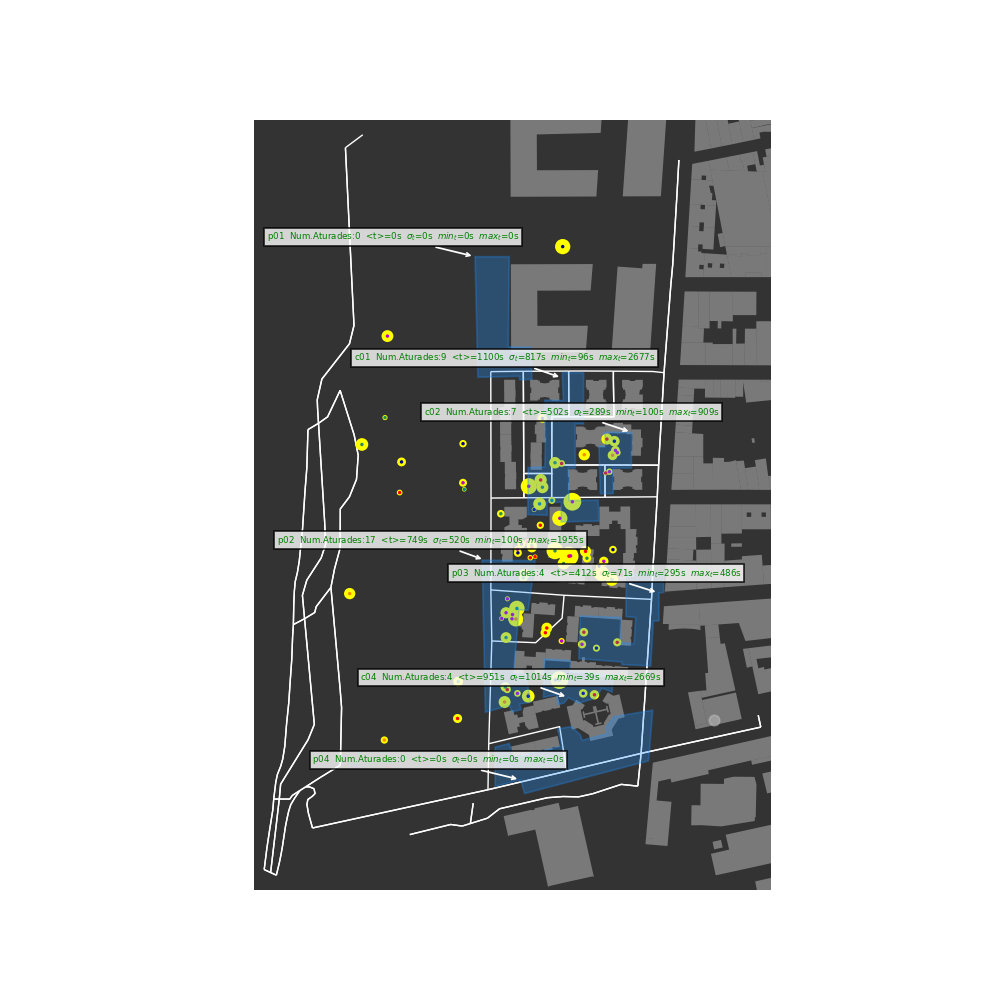

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

TOTS ELS GRUPS:

Nombre total daturades: 81
Temps total daturada: 61376.0 s
Temps promig daturada: 757.7283950617284
Temps més curt daturada: 39.0
Temps més llarg daturada: 3130.0


####################################################


UNITATS DACCIÓ

p01:

nombre aturades a la unitat dacció p01: 0
temps total aturada a la unitat daccio p01: 0 s
temps de cada aturada a la unitat daccio p01 [] s

-------------------------------------------------------------------------


c01:

nombre aturades a la unitat dacció c01: 9
temps total aturada a la unitat daccio c01: 9904.0 s
temps de cada aturada a la unitat daccio c01 [985.0, 1130.0, 1240.0, 1090.0, 2151.0, 258.0, 96.0, 277.0, 2677.0] s
Temps més curt daturada: 96.0
Temps més llarg daturada: 2677.0

-------------------------------------------------------------------------


c02:

nombre aturades a la unitat dacció c02: 7
temps total aturada a la unitat daccio c02: 3517.0 s
temps de cada aturada a la unitat daccio c02 [817.0, 681.0, 231.0, 

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

In [59]:
from gpxcsv import gpxtolist
import pandas as pd
import networkx as nx
import osmnx as ox


import matplotlib.pyplot as plt
import numpy as np
import glob
import os
from math import sin, cos, sqrt, atan2, radians
from mpl_toolkits.axes_grid1.inset_locator import inset_axes
from folium import Map
from folium.plugins import HeatMap, HeatMapWithTime
import utm
from matplotlib.animation import FuncAnimation
import matplotlib.animation as animation
from scipy.stats import gaussian_kde
from shapely.geometry import Point, LineString, Polygon
import folium

%matplotlib notebook
#%matplotlib inline
ox.config(use_cache=True, log_console=True)
ox.__version__



fig, ax = map_network2(2.2793534239822613, 41.60640928402908, 2.283956227147247,41.60640126017562,  
                       2.2837951863375023,41.60189263168001,  2.2792784442191962, 41.60145135138418)  # Create the graph from a given latitude and longitude


from turfpy.measurement import boolean_point_in_polygon
from geojson import Point, Polygon, Feature



df_tots = pd.read_csv('df_tots.csv') 

lat_tots=[] 
lon_tots=[]
for i in range(len(df_tots['durada'])):
    lon_tots.append(coord_accions_tots[i][0])
    lat_tots.append(coord_accions_tots[i][1])
    

At_cs=df_tots['durada']

max_At=max(At_cs)
new_At_cs=[]
for j in range(len(At_cs)):
    new_At_cs.append(At_cs[j]/max_At)
    
new_At_cs2=[]
for i in range(len(new_At_cs)):
    new_At_cs2.append(100*new_At_cs[i])
    
print('TOTS ELS GRUPS:')
print('')
print('Nombre total daturades:', len(At_cs))
print('Temps total daturada:', sum(At_cs),'s')
print('Temps promig daturada:', sum(At_cs)/len(At_cs))
print('Temps més curt daturada:', min(At_cs))
print('Temps més llarg daturada:', max(At_cs))
#print('Tots els temps:', At_cs)
print('')
print('')
print('####################################################')
print('')
print('')
print('UNITATS DACCIÓ')
print('')
    
p01=Polygon([[(2.281903, 41.6047224), (2.2819017, 41.6049109), (2.2817113, 41.6049139), (2.2817193, 41.6054674),
       (2.281439, 41.6054674), (2.2814618, 41.6047274), (2.2818038, 41.6047334), (2.2818038, 41.6047123), 
       (2.2819071, 41.6047143), (2.281903, 41.6047224),]])


c01=Polygon([[(2.2821551, 41.6047224), (2.2821638, 41.6045846), (2.2820109, 41.6045866), (2.2820083, 41.6045224), 
       (2.2820163, 41.6043559), (2.2820109, 41.6041774), (2.2818741, 41.6041734), (2.2818715, 41.6038846),
       (2.2820324, 41.6038806), (2.2820297, 41.6039588), (2.2821451, 41.6039608), (2.2821451, 41.6038405), 
       (2.2824535, 41.6038445), (2.2824497, 41.603973), (2.2822096, 41.603971), (2.2822092, 41.6040323), 
       (2.2822058, 41.6041707), (2.2822615, 41.6041702), (2.2822604, 41.6044421), (2.2823274, 41.6044406), 
       (2.2823294, 41.604755), (2.2821551, 41.6047565), (2.2821551, 41.6047224),]])

c02=Polygon([[(2.2824656, 41.6040279), (2.2824669, 41.6040134), (2.2825729, 41.6040139), (2.2825702, 41.6041703),
       (2.2827204, 41.6041703), (2.2827258, 41.6043889), (2.2825032, 41.6043909), (2.2825085, 41.6043027),
       (2.2824549, 41.6043047), (2.2824656, 41.6040279),]])

p02=Polygon([[(2.2815208, 41.6036047), (2.2814974, 41.6036052), (2.2815235, 41.6026721), (2.2816362, 41.6026962), 
       (2.281722, 41.6027122), (2.2817408, 41.6026741), (2.2818159, 41.6026881), (2.2818051, 41.6027222), 
       (2.2818936, 41.6027343), (2.2818561, 41.6029088), (2.2817542, 41.6029088), (2.2817998, 41.6032999),
       (2.2818749, 41.6032979), (2.2819312, 41.6036027), (2.2815208, 41.6036047),]])

c04=Polygon([[(2.2820103, 41.6029885), (2.2819996, 41.6027639), (2.2821069, 41.6027799), (2.2821176, 41.6027198), 
       (2.2821688, 41.6027284), (2.2822063, 41.6027625), (2.2822895, 41.6027274), (2.282321, 41.6027349), 
       (2.2823364, 41.6027384), (2.2823585, 41.6027439), (2.2823773, 41.6027475), (2.2824001, 41.6027525), 
       (2.2824222, 41.6027585), (2.2824812, 41.6028196), (2.282563, 41.6027966), (2.2825751, 41.6028989), 
       (2.2824263, 41.6029089), (2.2824102, 41.6029139), (2.2822157, 41.6029219), (2.2822197, 41.6029901),
       (2.2820065, 41.6029981), (2.2820103, 41.6029885),]])

p04=Polygon([[(2.2828616, 41.6023738), (2.2828965, 41.6026847), (2.2825773, 41.6026446), (2.282513, 41.6025784), 
       (2.2825237, 41.6025403), (2.2823172, 41.6025002), (2.2823037, 41.6025322), (2.2822313, 41.6025844),
       (2.2821643, 41.6025764), (2.282116, 41.6025683), (2.2821509, 41.6024641), (2.2817485, 41.6023959), 
       (2.281719, 41.6024801), (2.2816037, 41.602458), (2.2816037, 41.6022174), (2.2818129, 41.6022575), 
       (2.2818451, 41.6021732), (2.2828616, 41.6023738),]])

p03=Polygon([[(2.2826815, 41.603516), (2.2826762, 41.6032593), (2.2827566, 41.6032533), (2.2827432, 41.6030928), 
       (2.2826279, 41.6031009), (2.2826333, 41.6032533), (2.2823007, 41.6032633), (2.2822899, 41.6030006),
       (2.282644, 41.6029805), (2.2826413, 41.6029645), (2.28288, 41.6029565), (2.2829015, 41.6032312),
       (2.2829471, 41.6032332), (2.2829471, 41.6034037), (2.2829873, 41.6034077), (2.282982, 41.6035261),
       (2.2826815, 41.603516),]])


x_p01=[2.281903,2.2819017,2.2817113,2.2817193,2.281439,2.2814618,2.2818038,2.2818038,2.2819071,2.281903]
y_p01=[41.6047224,41.6049109, 41.6049139, 41.6054674, 41.6054674, 41.6047274, 41.6047334, 41.6047123, 41.6047143, 41.6047224]

x_c01=[2.2821551,2.2821638,2.2820109,2.2820083,2.2820163,2.2820109,2.2818741,2.2818715,2.2820324,2.2820297,2.2821451,2.2821451,
       2.2824535,2.2824497,2.2822096,2.2822092,2.2822058,2.2822615,2.2822604,2.2823274,2.2823294,2.2821551,2.2821551]
y_c01=[41.6047224,41.6045846,41.6045866,41.6045224,41.6043559, 41.6041774, 41.6041734, 41.6038846, 41.6038806, 41.6039588,
       41.6039608, 41.6038405, 41.6038445, 41.603973, 41.603971, 41.6040323, 41.6041707, 41.6041702, 41.6044421, 41.6044406, 
       41.604755, 41.6047565, 41.6047224]

x_c02=[2.2824656,2.2824669,2.2825729,2.2825702,2.2827204,2.2827258,2.2825032,2.2825085,2.2824549,2.2824656]
y_c02=[41.6040279, 41.6040134, 41.6040139, 41.6041703, 41.6041703, 41.6043889, 41.6043909, 41.6043027, 41.6043047, 41.6040279]

x_p02=[2.2815208,2.2814974,2.2815235,2.2816362,2.281722,2.2817408,2.2818159,2.2818051,2.2818936,2.2818561,2.2817542,2.2817998,
       2.2818749,2.2819312, 2.2815208]
y_p02=[41.6036047, 41.6036052, 41.6026721, 41.6026962, 41.6027122, 41.6026741, 41.6026881, 41.6027222, 41.6027343, 41.6029088, 
       41.6029088, 41.6032999, 41.6032979, 41.6036027, 41.6036047]

x_c04=[2.2820103,2.2819996,2.2821069,2.2821176,2.2821688,2.2822063,2.2822895,2.282321,2.2823364,2.2823585,2.2823773,2.2824001,
       2.2824222,2.2824812,2.282563,2.2825751,2.2824263,2.2824102,2.2822157,2.2822197,2.2820065,2.2820103]
y_c04=[41.6029885, 41.6027639, 41.6027799, 41.6027198, 41.6027284, 41.6027625, 41.6027274, 41.6027349, 41.6027384, 41.6027439, 
       41.6027475, 41.6027525, 41.6027585, 41.6028196, 41.6027966, 41.6028989, 41.6029089, 41.6029139, 41.6029219, 41.6029901, 
       41.6029981, 41.6029885]

x_p04=[2.2828616,2.2828965,2.2825773,2.282513,2.2825237,2.2823172,2.2823037,2.2822313,2.2821643,2.282116,2.2821509,2.2817485,
       2.281719,2.2816037,2.2816037,2.2818129,2.2818451,2.2828616]
y_p04=[41.6023738, 41.6026847, 41.6026446, 41.6025784, 41.6025403, 41.6025002, 41.6025322, 41.6025844, 41.6025764, 41.6025683, 
       41.6024641, 41.6023959, 41.6024801, 41.602458, 41.6022174, 41.6022575, 41.6021732, 41.6023738]

x_p03=[2.2826815,2.2826762,2.2827566,2.2827432,2.2826279,2.2826333,2.2823007,2.2822899,2.282644,2.2826413,2.28288,2.2829015,
       2.2829471,2.2829471,2.2829873,2.282982,2.2826815]
y_p03=[41.603516, 41.6032593, 41.6032533, 41.6030928, 41.6031009, 41.6032533, 41.6032633, 41.6030006, 41.6029805, 41.6029645, 
       41.6029565, 41.6032312, 41.6032332, 41.6034037, 41.6034077, 41.6035261, 41.603516]

plt.fill(x_p01,y_p01,alpha=0.3,c='dodgerblue')
plt.fill(x_c01,y_c01,alpha=0.3,c='dodgerblue')
plt.fill(x_c02,y_c02,alpha=0.3,c='dodgerblue')
plt.fill(x_p02,y_p02,alpha=0.3,c='dodgerblue')
plt.fill(x_c04,y_c04,alpha=0.3,c='dodgerblue')
plt.fill(x_p04,y_p04,alpha=0.3,c='dodgerblue')
plt.fill(x_p03,y_p03,alpha=0.3,c='dodgerblue') 
    
    
At_cs_inside_p01=[]
lon_stop_inside_p01=[]
lat_stop_inside_p01=[]
At_cs_inside_c01=[]
lon_stop_inside_c01=[]
lat_stop_inside_c01=[]
At_cs_inside_c02=[]
lon_stop_inside_c02=[]
lat_stop_inside_c02=[]
At_cs_inside_p02=[]
lon_stop_inside_p02=[]
lat_stop_inside_p02=[]
At_cs_inside_c04=[]
lon_stop_inside_c04=[]
lat_stop_inside_c04=[]
At_cs_inside_p04=[]
lon_stop_inside_p04=[]
lat_stop_inside_p04=[]
At_cs_inside_p03=[]
lon_stop_inside_p03=[]
lat_stop_inside_p03=[]

for i in range(len(lon_tots)):

    point_p01 = Feature(geometry=Point((lon_tots[i],lat_tots[i])))
    point_c01 = Feature(geometry=Point((lon_tots[i],lat_tots[i])))
    point_c02 = Feature(geometry=Point((lon_tots[i],lat_tots[i])))
    point_p02 = Feature(geometry=Point((lon_tots[i],lat_tots[i])))
    point_c04 = Feature(geometry=Point((lon_tots[i],lat_tots[i])))
    point_p04 = Feature(geometry=Point((lon_tots[i],lat_tots[i])))
    point_p03 = Feature(geometry=Point((lon_tots[i],lat_tots[i])))
    
    check_p01=boolean_point_in_polygon(point_p01, p01)
    check_c01=boolean_point_in_polygon(point_c01, c01)
    check_c02=boolean_point_in_polygon(point_c02, c02)
    check_p02=boolean_point_in_polygon(point_p02, p02)
    check_c04=boolean_point_in_polygon(point_c04, c04)
    check_p04=boolean_point_in_polygon(point_p04, p04)
    check_p03=boolean_point_in_polygon(point_p03, p03)
    
    if check_p01==True:
        lon_stop_inside_p01.append(lon_tots[i])
        lat_stop_inside_p01.append(lat_tots[i])
        At_cs_inside_p01.append(At_cs[i])
    
    if check_c01==True:
        lon_stop_inside_c01.append(lon_tots[i])
        lat_stop_inside_c01.append(lat_tots[i])
        At_cs_inside_c01.append(At_cs[i])
        
    if check_c02==True:
        lon_stop_inside_c02.append(lon_tots[i])
        lat_stop_inside_c02.append(lat_tots[i])
        At_cs_inside_c02.append(At_cs[i])
        
    if check_p02==True:
        lon_stop_inside_p02.append(lon_tots[i])
        lat_stop_inside_p02.append(lat_tots[i])
        At_cs_inside_p02.append(At_cs[i])
        
    if check_c04==True:
        lon_stop_inside_c04.append(lon_tots[i])
        lat_stop_inside_c04.append(lat_tots[i])
        At_cs_inside_c04.append(At_cs[i])
        
    if check_p04==True:
        lon_stop_inside_p04.append(lon_tots[i])
        lat_stop_inside_p04.append(lat_tots[i])
        At_cs_inside_p04.append(At_cs[i])
        
    if check_p03==True:
        lon_stop_inside_p03.append(lon_tots[i])
        lat_stop_inside_p03.append(lat_tots[i])
        At_cs_inside_p03.append(At_cs[i])
        
    
print('p01:')
print('')
print('nombre aturades a la unitat dacció p01:', len(At_cs_inside_p01))
print('temps total aturada a la unitat daccio p01:', sum(At_cs_inside_p01),'s' )
print('temps de cada aturada a la unitat daccio p01', At_cs_inside_p01,'s')

if len(At_cs_inside_p01)!=0:
    mean_p01=sum(At_cs_inside_p01)/len(At_cs_inside_p01)
    max_p01=max(At_cs_inside_p01)
    min_p01=min(At_cs_inside_p01)
    print('Temps més curt daturada:', min(At_cs_inside_p01))
    print('Temps més llarg daturada:', max(At_cs_inside_p01))
else:
    mean_p01=0
    max_p01=0
    min_p01=0
print('')
print('-------------------------------------------------------------------------')
print('')
print('')

print('c01:')
print('')
print('nombre aturades a la unitat dacció c01:', len(At_cs_inside_c01))
print('temps total aturada a la unitat daccio c01:', sum(At_cs_inside_c01),'s' )
print('temps de cada aturada a la unitat daccio c01', At_cs_inside_c01,'s')
if len(At_cs_inside_c01)!=0:
    mean_c01=sum(At_cs_inside_c01)/len(At_cs_inside_c01)
    max_c01=max(At_cs_inside_c01)
    min_c01=min(At_cs_inside_c01)
    print('Temps més curt daturada:', min(At_cs_inside_c01))
    print('Temps més llarg daturada:', max(At_cs_inside_c01))
else:
    mean_c01=0
    max_c01=0
    min_c01=0
print('')
print('-------------------------------------------------------------------------')
print('')
print('')

print('c02:')
print('')
print('nombre aturades a la unitat dacció c02:', len(At_cs_inside_c02))
print('temps total aturada a la unitat daccio c02:', sum(At_cs_inside_c02),'s' )
print('temps de cada aturada a la unitat daccio c02', At_cs_inside_c02,'s')
if len(At_cs_inside_c02)!=0:
    mean_c02=sum(At_cs_inside_c02)/len(At_cs_inside_c02)
    max_c02=max(At_cs_inside_c02)
    min_c02=min(At_cs_inside_c02)
    print('Temps més curt daturada:', min(At_cs_inside_c02))
    print('Temps més llarg daturada:', max(At_cs_inside_c02))
else:
    mean_c02=0
    max_c02=0
    min_c02=0
print('')
print('-------------------------------------------------------------------------')
print('')
print('')

print('p02:')
print('')
print('nombre aturades a la unitat dacció p02:', len(At_cs_inside_p02))
print('temps total aturada a la unitat daccio p02:', sum(At_cs_inside_p02),'s' )
print('temps de cada aturada a la unitat daccio p02', At_cs_inside_p02,'s')
if len(At_cs_inside_p02)!=0:
    mean_p02=sum(At_cs_inside_p02)/len(At_cs_inside_p02)
    max_p02=max(At_cs_inside_p02)
    min_p02=min(At_cs_inside_p02)
    print('Temps més curt daturada:', min(At_cs_inside_p02))
    print('Temps més llarg daturada:', max(At_cs_inside_p02))
else:
    mean_p02=0
    max_p02=0
    min_p02=0
print('')
print('-------------------------------------------------------------------------')
print('')
print('')

print('c04:')
print('')
print('nombre aturades a la unitat dacció c04:', len(At_cs_inside_c04))
print('temps total aturada a la unitat daccio c04:', sum(At_cs_inside_c04),'s' )
print('temps de cada aturada a la unitat daccio c04', At_cs_inside_c04,'s')
if len(At_cs_inside_c04)!=0:
    mean_c04=sum(At_cs_inside_c04)/len(At_cs_inside_c04)
    max_c04=max(At_cs_inside_c04)
    min_c04=min(At_cs_inside_c04)
    print('Temps més curt daturada:', min(At_cs_inside_c04))
    print('Temps més llarg daturada:', max(At_cs_inside_c04))
else:
    mean_c04=0
    max_c04=0
    min_c04=0
print('')
print('-------------------------------------------------------------------------')
print('')
print('')

print('p04:')
print('')
print('nombre aturades a la unitat dacció p04:', len(At_cs_inside_p04))
print('temps total aturada a la unitat daccio p04:', sum(At_cs_inside_p04),'s' )
print('temps de cada aturada a la unitat daccio p04', At_cs_inside_p04,'s')
if len(At_cs_inside_p04)!=0:
    mean_p04=sum(At_cs_inside_p04)/len(At_cs_inside_p04)
    max_p04=max(At_cs_inside_p04)
    min_p04=min(At_cs_inside_p04)
    print('Temps més curt daturada:', min(At_cs_inside_p04))
    print('Temps més llarg daturada:', max(At_cs_inside_p04))
else:
    mean_p04=0
    max_p04=0
    min_p04=0
print('')
print('-------------------------------------------------------------------------')
print('')
print('')

print('p03:')
print('')
print('nombre aturades a la unitat dacció p03:', len(At_cs_inside_p03))
print('temps total aturada a la unitat daccio p03:', sum(At_cs_inside_p03),'s' )
print('temps de cada aturada a la unitat daccio p03', At_cs_inside_p03,'s')
if len(At_cs_inside_p03)!=0:
    mean_p03=sum(At_cs_inside_p03)/len(At_cs_inside_p03)
    max_p03=max(At_cs_inside_p03)
    min_p03=min(At_cs_inside_p03)
    print('Temps més curt daturada:', min(At_cs_inside_p03))
    print('Temps més llarg daturada:', max(At_cs_inside_p03))
else:
    mean_p03=0
    max_p03=0
    min_p03=0
print('')
print('-------------------------------------------------------------------------')
print('')
print('')

num=[len(At_cs_inside_p01), len(At_cs_inside_c01), len(At_cs_inside_c02), len(At_cs_inside_p02), len(At_cs_inside_c04),
    len(At_cs_inside_p04),len(At_cs_inside_p03)]

t=[sum(At_cs_inside_p01), sum(At_cs_inside_c01), sum(At_cs_inside_c02), sum(At_cs_inside_p02), sum(At_cs_inside_c04),
    sum(At_cs_inside_p04),sum(At_cs_inside_p03)]

max_t=[0, max(At_cs_inside_c01), max(At_cs_inside_c02), max(At_cs_inside_p02), max(At_cs_inside_c04),0, max(At_cs_inside_p03)]

min_t=[0, min(At_cs_inside_c01),min(At_cs_inside_c02), min(At_cs_inside_p02), min(At_cs_inside_c04),0, min(At_cs_inside_p03)]

mean_t=[mean_p01,mean_c01,mean_c02,mean_p02,mean_c04,mean_p04,mean_p03]

std_t=[0,np.std(At_cs_inside_c01),np.std(At_cs_inside_c02),np.std(At_cs_inside_p02),np.std(At_cs_inside_c04),0,np.std(At_cs_inside_p03)]

unitats=['p01','c01','c02','p02','c04','p04','p03']


colorss=df_tots['color'].tolist()

plt.scatter(lon_tots,lat_tots,c='yellow',s=new_At_cs2)
plt.scatter(lon_tots,lat_tots,c=colorss,s=1)

lon_unitats=[x_p01[4], x_c01[0], x_c02[5], x_p02[0], x_c04[5], x_p04[15], x_p03[13]]
lat_unitats=[y_p01[4], y_c01[0], y_c02[5], y_p02[0], y_c04[5], y_p04[15], y_p03[13]]

bbox_args = dict(boxstyle='square',facecolor='white', edgecolor='k',alpha=0.8)
arrowprops=dict(arrowstyle = '->', connectionstyle='arc3,rad=0',color='white')
for i in range(len(unitats)):
    plt.annotate(str(unitats[i])+' '+' '+'Num.Aturades:'+str(int(num[i]))+' '+' '+'<t>='+str(int(mean_t[i]))+'s'+' '+' '+r'$\sigma_{t}$='+str(int(std_t[i]))+'s'+' '+' '+r'$min_{t}$='+str(int(min_t[i]))+'s'+' '+' '+r'$max_{t}$='+str(int(max_t[i]))+'s', 
                 (lon_unitats[i], lat_unitats[i]),c='green',size=5,bbox=bbox_args,arrowprops=arrowprops,
                 xytext=(-120, 10),textcoords='offset points')

#plt.savefig('unitats_accio.eps')   
    
plt.show()
    

In [210]:
df_temps_unitats=pd.DataFrame()

df_temps_unitats['unitats']=unitats
df_temps_unitats['num aturades']=num
df_temps_unitats['temps total aturades (s)']=t
df_temps_unitats['temps promig aturada (s)']=mean_t
df_temps_unitats['desviació standard aturades (s)']=std_t
df_temps_unitats['temps maxim (s)']=max_t
df_temps_unitats['temps minim (s)']=min_t

#df_temps_unitats.to_csv('df_temps_unitats_accio.csv')

In [209]:
df_temps_unitats.style.background_gradient(axis=0) 

,unitats,num aturades,temps total aturades (s),temps promig aturada (s),desviació standard aturades (s),temps maxim (s),temps minim (s)
0,p01,0,0.000000,0.000000,0.000000,0.000000,0.000000
1,c01,9,9904.000000,1100.444444,817.833331,2677.000000,96.000000
2,c02,7,3517.000000,502.428571,289.650951,909.000000,100.000000
3,p02,17,12739.000000,749.352941,520.373615,1955.000000,100.000000
4,c04,4,3805.000000,951.250000,1014.108568,2669.000000,39.000000
5,p04,0,0.000000,0.000000,0.000000,0.000000,0.000000
6,p03,4,1648.000000,412.000000,71.017603,486.000000,295.000000


In [130]:
pd.set_option('display.max_rows', None)

In [143]:
del df_tots['localitzacio']
df_tots['longitud']=lon_tots
df_tots['latitud']=lat_tots



,Unnamed: 0,accio,color,durada,longitud,latitud
0,0,Ce1+CCe1+Me1,seagreen,985.0,2.282094,41.604203
1,1,Xe1,darkblue,521.0,2.281836,41.603524
2,2,Je1,m,100.0,2.281657,41.603248
3,3,Je1,m,249.0,2.281787,41.603673
4,4,Be1,red,151.0,2.281892,41.603620
5,5,Be2,red,670.0,2.282016,41.603160
6,6,Je2,m,342.0,2.281742,41.603245
7,7,Xe2+Me2+Ce2+CCe2,seagreen,2345.0,2.282094,41.603662
8,8,Je3,m,262.0,2.281786,41.602788
9,9,Xe3,darkblue,39.0,2.282098,41.602871


# 7. Map for each action

In [168]:
jugar=[2,3,6,8,13,15,18,20,24,28,33,34,39,41,45,51,52,53,56,62,63,68,70,74,76,79]
jugar_grups=['e1','e1','e2','e3','e4','e4','e5','e5','e6','e7','p1','p1','p2','p3','p4','g1','g1','g1','g2','g3','g3','g5','g5',
             'g6','g7','g8']

df_jugar=df_tots.iloc[jugar]
df_jugar.reset_index(inplace=True)
del df_jugar['Unnamed: 0']
del df_jugar['index']

C:\Users\josep\anaconda3\envs\ox\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [169]:
ballar=[4,5,10,13,16,18,22,28,30,31,36,43,48,53,54,55,68,73,76,78]
ballar_grups=['e1','e2','e3','e4','e4','e5','e6','e7','e7','p1','p2','p3','p4','g1','g1','g2','g5','g6','g7','g8']

df_ballar=df_tots.iloc[ballar]
df_ballar.reset_index(inplace=True)
del df_ballar['Unnamed: 0']
del df_ballar['index']

In [170]:
xerrar=[1,7,9,15,21,26,27,32,37,42,47,49,50,60,64,65,71,72,76,80]
xerrar_grups=['e1','e2','e3','e4','e5','e6','e7','p1','p2','p3','p4','g1','g1','g2','g3','g4','g5','g6','g7','g8']

df_xerrar=df_tots.iloc[xerrar]
df_xerrar.reset_index(inplace=True)
del df_xerrar['Unnamed: 0']
del df_xerrar['index']

In [171]:
menjar=[0,7,12,14,19,25,30,32,35,41,46,50,59,62,65,71,74,76,77]
menjar_grups=['e1','e2','e3','e4','e5','e6','e7','p1','p2','p3','p4','g1','g2','g3','g4','g5','g6','g7','g8']

df_menjar=df_tots.iloc[menjar]
df_menjar.reset_index(inplace=True)
del df_menjar['Unnamed: 0']
del df_menjar['index']

In [174]:
confeti=[0,7,11,17,19,23,29,38,40,44,54,58,61,66,69,75,77]
confeti_grups=['e1','e2','e3','e4','e5','e6','e7','p2','p3','p4','g1','g2','g3','g4','g5','g7','g8']

df_confeti=df_tots.iloc[confeti]
df_confeti.reset_index(inplace=True)
del df_confeti['Unnamed: 0']
del df_confeti['index']

C:\Users\josep\anaconda3\envs\ox\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [175]:
brindar=[0,7,12,17,19,23,29,38,40,44,50,57,61,66,67,72,76,77]
brindar_grups=['e1','e2','e3','e4','e5','e6','e7','p1','p2','p3','p4','g1','g2','g3','g4','g5','g6','g7','g8']

df_brindar=df_tots.iloc[brindar]
df_brindar.reset_index(inplace=True)
del df_brindar['Unnamed: 0']
del df_brindar['index']

## 7.1- Jugar

C:\Users\josep\anaconda3\envs\ox\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


<IPython.core.display.Javascript object>


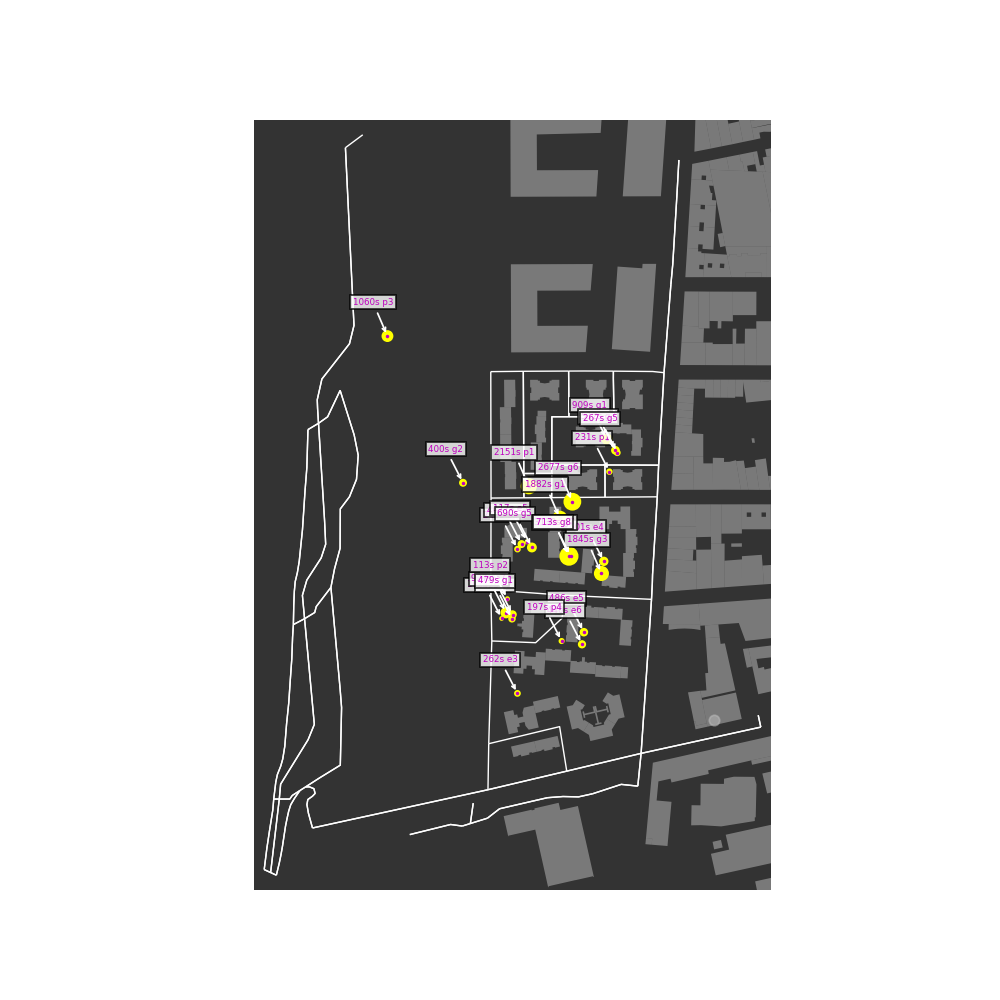

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

In [192]:


temps_accions_jugar=df_jugar['durada'].tolist()
lon_accions_jugar=df_jugar['longitud'].tolist()
lat_accions_jugar=df_jugar['latitud'].tolist()


max_temps_accions_jugar=max(temps_accions_jugar)
new_temps_accions_jugar=[]
for j in range(len(temps_accions_jugar)):
    new_temps_accions_jugar.append(temps_accions_jugar[j]/max_temps_accions_jugar)

new_temps_accions_jugar_2=[]
for i in range(len(temps_accions_jugar)):
    new_temps_accions_jugar_2.append(100*new_temps_accions_jugar[i])

    
from shapely.geometry import Point, LineString, Polygon
fig, ax = map_network2(2.2793534239822613, 41.60640928402908, 2.283956227147247,41.60640126017562,  
                       2.2837951863375023,41.60189263168001,  2.2792784442191962, 41.60145135138418)

plt.scatter(lon_accions_jugar,lat_accions_jugar,c='yellow',s=new_temps_accions_jugar_2)
plt.scatter(lon_accions_jugar,lat_accions_jugar,c='m',s=1)

bbox_args = dict(boxstyle='square',facecolor='white', edgecolor='k',alpha=0.8)
arrowprops=dict(arrowstyle = '->', connectionstyle='arc3,rad=0',color='white')
for iii in range(len(lon_accions_jugar)):
    plt.annotate(str(int(temps_accions_jugar[iii]))+ 's'+' '+jugar_grups[iii], (lon_accions_jugar[iii], lat_accions_jugar[iii]),c='m',size=5,
                 bbox=bbox_args,arrowprops=arrowprops, xytext=(-20, 18),textcoords='offset points')

    
    
#plt.savefig('jugar.eps')

plt.show()

## 7.2- Ballar

C:\Users\josep\anaconda3\envs\ox\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


<IPython.core.display.Javascript object>


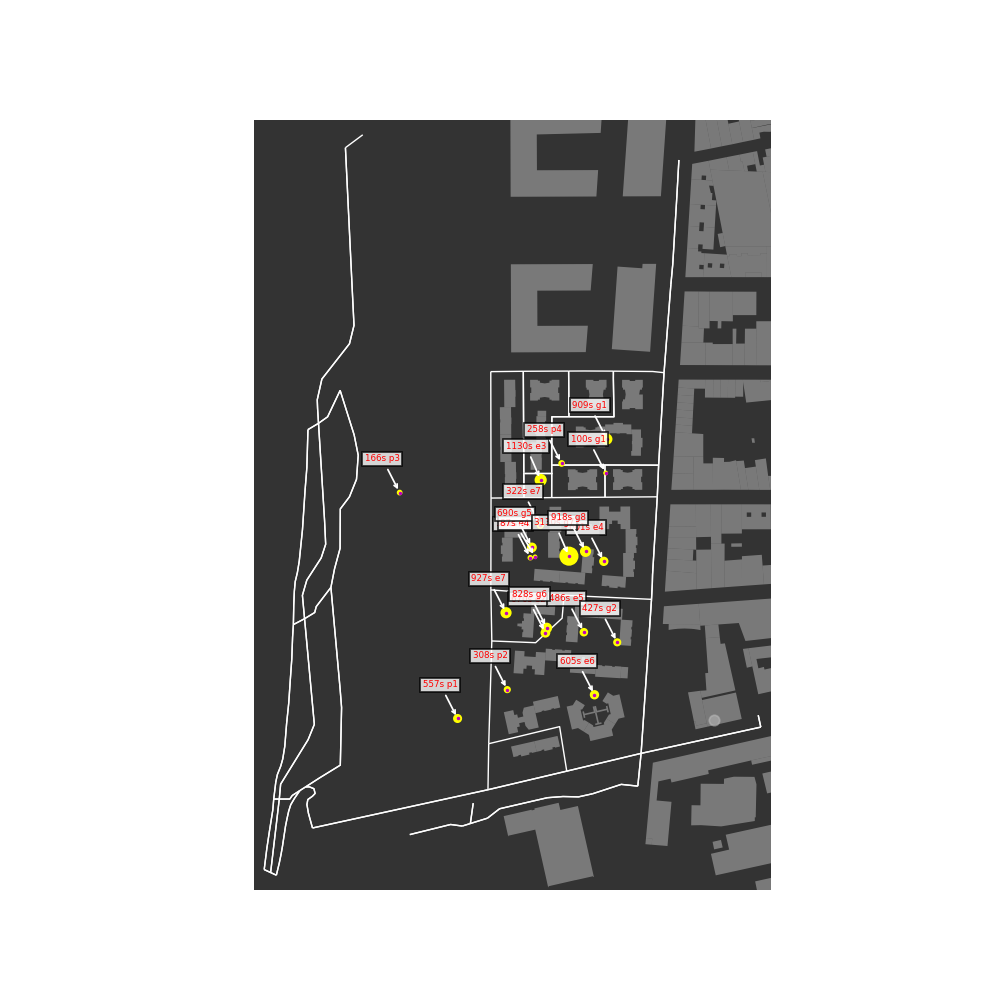

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

In [193]:


temps_accions_ballar=df_ballar['durada'].tolist()
lon_accions_ballar=df_ballar['longitud'].tolist()
lat_accions_ballar=df_ballar['latitud'].tolist()


max_temps_accions_ballar=max(temps_accions_ballar)
new_temps_accions_ballar=[]
for j in range(len(temps_accions_ballar)):
    new_temps_accions_ballar.append(temps_accions_ballar[j]/max_temps_accions_ballar)

new_temps_accions_ballar_2=[]
for i in range(len(temps_accions_ballar)):
    new_temps_accions_ballar_2.append(100*new_temps_accions_ballar[i])

    
from shapely.geometry import Point, LineString, Polygon
fig, ax = map_network2(2.2793534239822613, 41.60640928402908, 2.283956227147247,41.60640126017562,  
                       2.2837951863375023,41.60189263168001,  2.2792784442191962, 41.60145135138418)

plt.scatter(lon_accions_ballar,lat_accions_ballar,c='yellow',s=new_temps_accions_ballar_2)
plt.scatter(lon_accions_ballar,lat_accions_ballar,c='m',s=1)

bbox_args = dict(boxstyle='square',facecolor='white', edgecolor='k',alpha=0.8)
arrowprops=dict(arrowstyle = '->', connectionstyle='arc3,rad=0',color='white')
for iii in range(len(lon_accions_ballar)):
    plt.annotate(str(int(temps_accions_ballar[iii]))+ 's'+' '+ballar_grups[iii], (lon_accions_ballar[iii], lat_accions_ballar[iii]),c='red',size=5,
                 bbox=bbox_args,arrowprops=arrowprops, xytext=(-20, 18),textcoords='offset points')

    
    
#plt.savefig('ballar.eps')

plt.show()

## 7.3- Brindar

C:\Users\josep\anaconda3\envs\ox\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


<IPython.core.display.Javascript object>


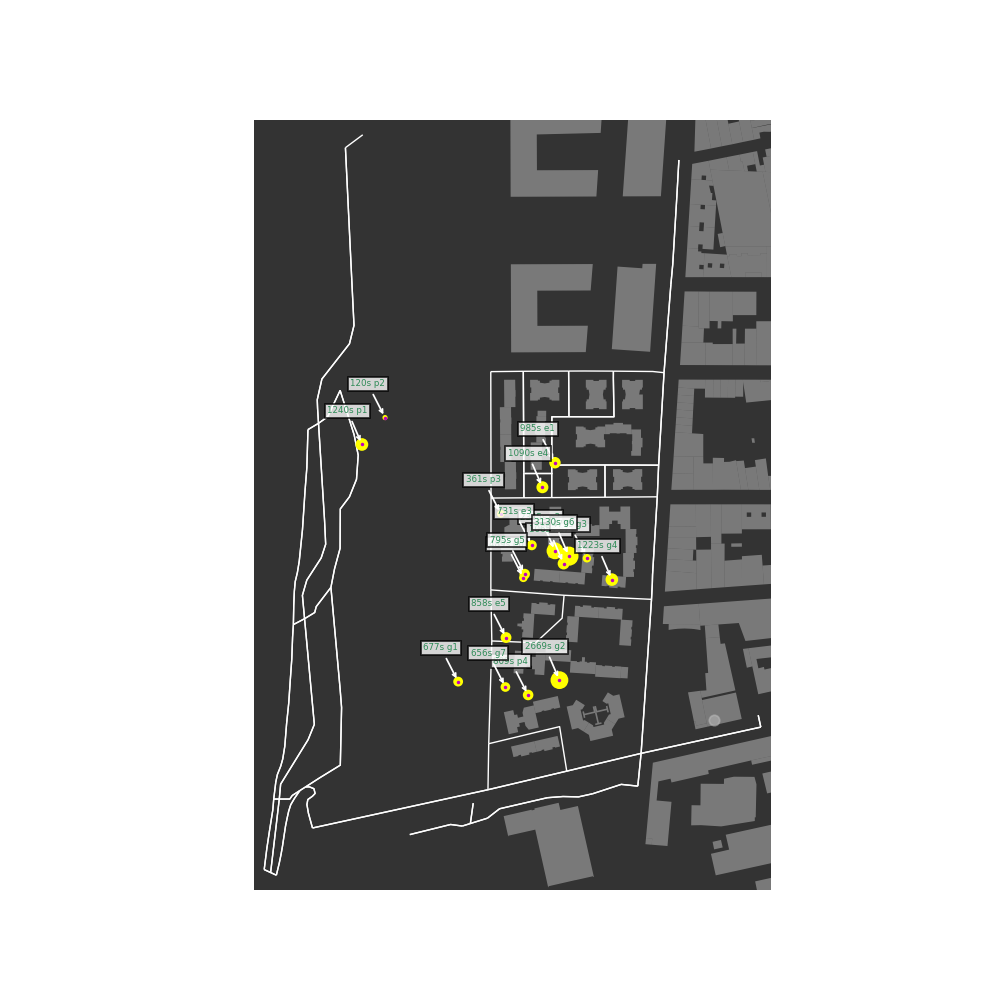

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

In [194]:
temps_accions_brindar=df_brindar['durada'].tolist()
lon_accions_brindar=df_brindar['longitud'].tolist()
lat_accions_brindar=df_brindar['latitud'].tolist()


max_temps_accions_brindar=max(temps_accions_brindar)
new_temps_accions_brindar=[]
for j in range(len(temps_accions_brindar)):
    new_temps_accions_brindar.append(temps_accions_brindar[j]/max_temps_accions_brindar)

new_temps_accions_brindar_2=[]
for i in range(len(temps_accions_brindar)):
    new_temps_accions_brindar_2.append(100*new_temps_accions_brindar[i])

    
from shapely.geometry import Point, LineString, Polygon
fig, ax = map_network2(2.2793534239822613, 41.60640928402908, 2.283956227147247,41.60640126017562,  
                       2.2837951863375023,41.60189263168001,  2.2792784442191962, 41.60145135138418)

plt.scatter(lon_accions_brindar,lat_accions_brindar,c='yellow',s=new_temps_accions_brindar_2)
plt.scatter(lon_accions_brindar,lat_accions_brindar,c='m',s=1)

bbox_args = dict(boxstyle='square',facecolor='white', edgecolor='k',alpha=0.8)
arrowprops=dict(arrowstyle = '->', connectionstyle='arc3,rad=0',color='white')
for iii in range(len(lon_accions_brindar)):
    plt.annotate(str(int(temps_accions_brindar[iii]))+ 's'+' '+brindar_grups[iii], (lon_accions_brindar[iii], lat_accions_brindar[iii]),c='seagreen',size=5,
                 bbox=bbox_args,arrowprops=arrowprops, xytext=(-20, 18),textcoords='offset points')

    
    
#plt.savefig('brindar.eps')

plt.show()

## 7.4- Confeti

C:\Users\josep\anaconda3\envs\ox\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


<IPython.core.display.Javascript object>


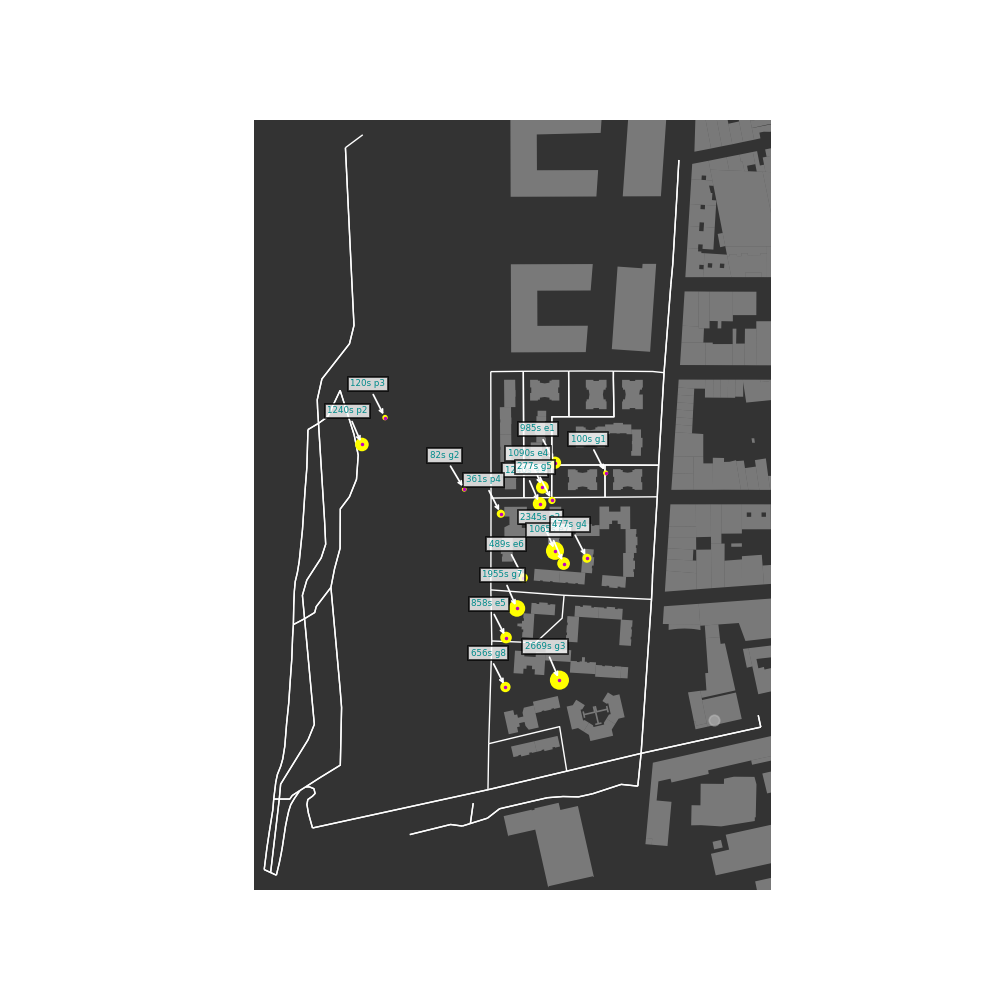

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

In [195]:
temps_accions_confeti=df_confeti['durada'].tolist()
lon_accions_confeti=df_confeti['longitud'].tolist()
lat_accions_confeti=df_confeti['latitud'].tolist()


max_temps_accions_confeti=max(temps_accions_confeti)
new_temps_accions_confeti=[]
for j in range(len(temps_accions_confeti)):
    new_temps_accions_confeti.append(temps_accions_confeti[j]/max_temps_accions_confeti)

new_temps_accions_confeti_2=[]
for i in range(len(temps_accions_confeti)):
    new_temps_accions_confeti_2.append(100*new_temps_accions_confeti[i])

    
from shapely.geometry import Point, LineString, Polygon
fig, ax = map_network2(2.2793534239822613, 41.60640928402908, 2.283956227147247,41.60640126017562,  
                       2.2837951863375023,41.60189263168001,  2.2792784442191962, 41.60145135138418)

plt.scatter(lon_accions_confeti,lat_accions_confeti,c='yellow',s=new_temps_accions_confeti_2)
plt.scatter(lon_accions_confeti,lat_accions_confeti,c='m',s=1)

bbox_args = dict(boxstyle='square',facecolor='white', edgecolor='k',alpha=0.8)
arrowprops=dict(arrowstyle = '->', connectionstyle='arc3,rad=0',color='white')
for iii in range(len(lon_accions_confeti)):
    plt.annotate(str(int(temps_accions_confeti[iii]))+ 's'+' '+confeti_grups[iii], (lon_accions_confeti[iii], lat_accions_confeti[iii]),c='darkcyan',size=5,
                 bbox=bbox_args,arrowprops=arrowprops, xytext=(-20, 18),textcoords='offset points')

    
    
#plt.savefig('confeti.eps')

plt.show()

## 7.5- Xerrar

C:\Users\josep\anaconda3\envs\ox\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


<IPython.core.display.Javascript object>


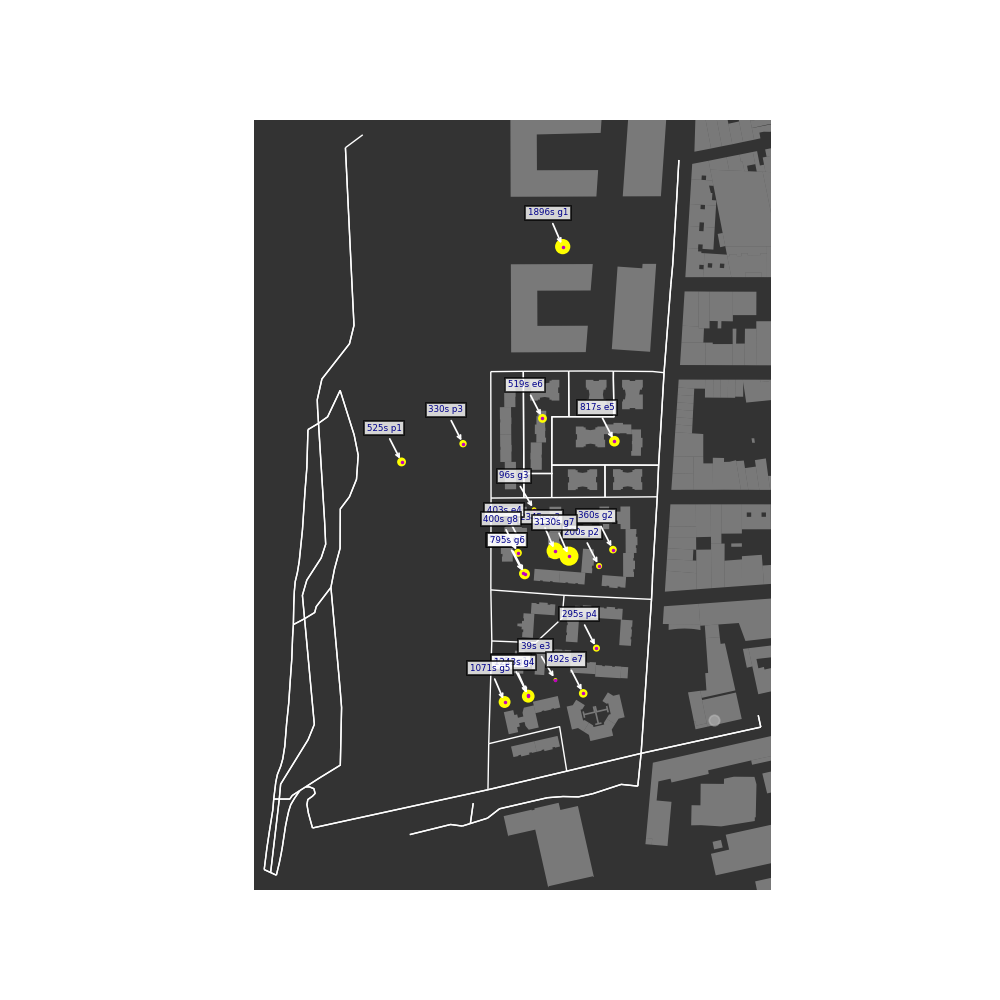

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

In [196]:
temps_accions_xerrar=df_xerrar['durada'].tolist()
lon_accions_xerrar=df_xerrar['longitud'].tolist()
lat_accions_xerrar=df_xerrar['latitud'].tolist()


max_temps_accions_xerrar=max(temps_accions_xerrar)
new_temps_accions_xerrar=[]
for j in range(len(temps_accions_xerrar)):
    new_temps_accions_xerrar.append(temps_accions_xerrar[j]/max_temps_accions_xerrar)

new_temps_accions_xerrar_2=[]
for i in range(len(temps_accions_xerrar)):
    new_temps_accions_xerrar_2.append(100*new_temps_accions_xerrar[i])

    
from shapely.geometry import Point, LineString, Polygon
fig, ax = map_network2(2.2793534239822613, 41.60640928402908, 2.283956227147247,41.60640126017562,  
                       2.2837951863375023,41.60189263168001,  2.2792784442191962, 41.60145135138418)

plt.scatter(lon_accions_xerrar,lat_accions_xerrar,c='yellow',s=new_temps_accions_xerrar_2)
plt.scatter(lon_accions_xerrar,lat_accions_xerrar,c='m',s=1)

bbox_args = dict(boxstyle='square',facecolor='white', edgecolor='k',alpha=0.8)
arrowprops=dict(arrowstyle = '->', connectionstyle='arc3,rad=0',color='white')
for iii in range(len(lon_accions_xerrar)):
    plt.annotate(str(int(temps_accions_xerrar[iii]))+ 's'+' '+xerrar_grups[iii], (lon_accions_xerrar[iii], lat_accions_xerrar[iii]),c='darkblue',size=5,
                 bbox=bbox_args,arrowprops=arrowprops, xytext=(-20, 18),textcoords='offset points')

    
    
#plt.savefig('xerrar.eps')

plt.show()

## 7.6- Menjar

C:\Users\josep\anaconda3\envs\ox\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


<IPython.core.display.Javascript object>


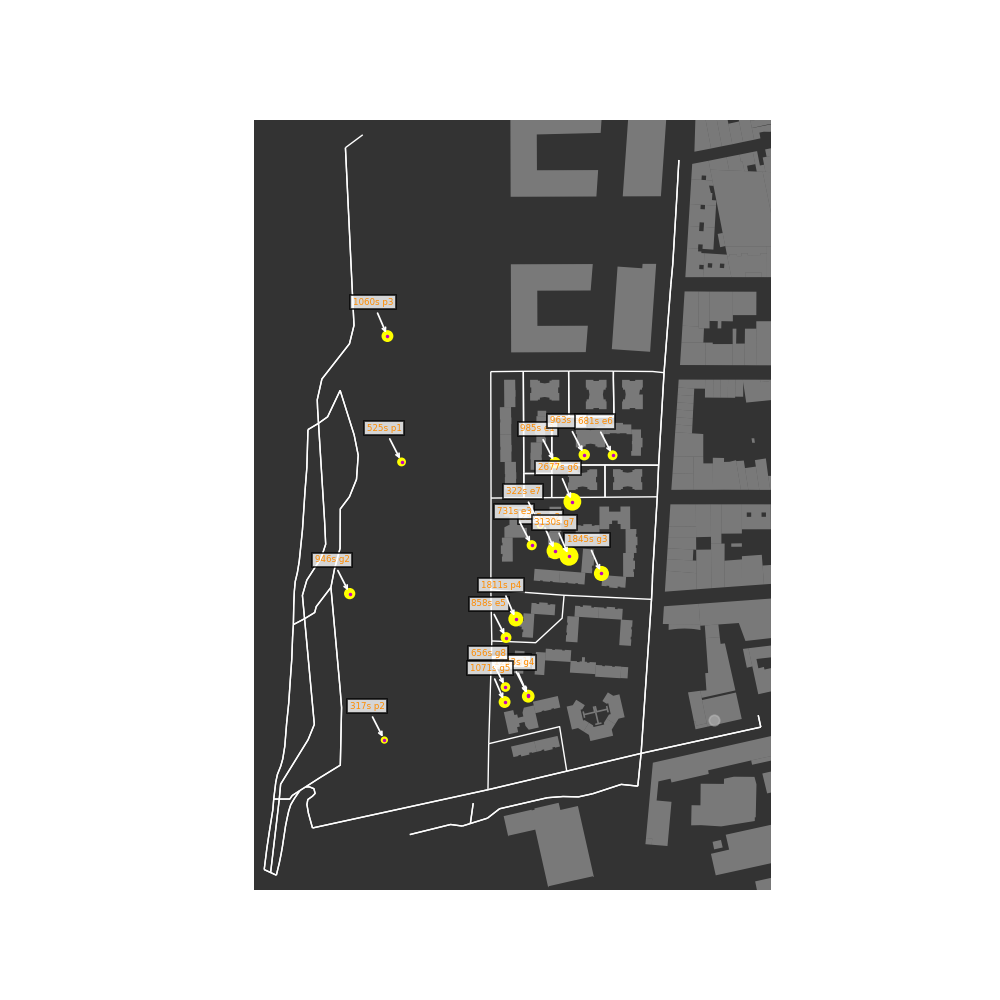

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

In [197]:
temps_accions_menjar=df_menjar['durada'].tolist()
lon_accions_menjar=df_menjar['longitud'].tolist()
lat_accions_menjar=df_menjar['latitud'].tolist()


max_temps_accions_menjar=max(temps_accions_menjar)
new_temps_accions_menjar=[]
for j in range(len(temps_accions_menjar)):
    new_temps_accions_menjar.append(temps_accions_menjar[j]/max_temps_accions_menjar)

new_temps_accions_menjar_2=[]
for i in range(len(temps_accions_menjar)):
    new_temps_accions_menjar_2.append(100*new_temps_accions_menjar[i])

    
from shapely.geometry import Point, LineString, Polygon
fig, ax = map_network2(2.2793534239822613, 41.60640928402908, 2.283956227147247,41.60640126017562,  
                       2.2837951863375023,41.60189263168001,  2.2792784442191962, 41.60145135138418)

plt.scatter(lon_accions_menjar,lat_accions_menjar,c='yellow',s=new_temps_accions_menjar_2)
plt.scatter(lon_accions_menjar,lat_accions_menjar,c='m',s=1)

bbox_args = dict(boxstyle='square',facecolor='white', edgecolor='k',alpha=0.8)
arrowprops=dict(arrowstyle = '->', connectionstyle='arc3,rad=0',color='white')
for iii in range(len(lon_accions_menjar)):
    plt.annotate(str(int(temps_accions_menjar[iii]))+ 's'+' '+menjar_grups[iii], (lon_accions_menjar[iii], lat_accions_menjar[iii]),c='darkorange',size=5,
                 bbox=bbox_args,arrowprops=arrowprops, xytext=(-20, 18),textcoords='offset points')

    
    
#plt.savefig('menjar.eps')

plt.show()

In [188]:
durada_jugar=df_jugar['durada'].tolist()
numero_jugar=len(durada_jugar)
mean_jugar=np.mean(durada_jugar)
std_jugar=np.std(durada_jugar)
min_jugar=min(durada_jugar)
max_jugar=max(durada_jugar)

durada_ballar=df_ballar['durada'].tolist()
numero_ballar=len(durada_ballar)
mean_ballar=np.mean(durada_ballar)
std_ballar=np.std(durada_ballar)
min_ballar=min(durada_ballar)
max_ballar=max(durada_ballar)

durada_menjar=df_menjar['durada'].tolist()
numero_menjar=len(durada_menjar)
mean_menjar=np.mean(durada_menjar)
std_menjar=np.std(durada_menjar)
min_menjar=min(durada_menjar)
max_menjar=max(durada_menjar)

durada_xerrar=df_xerrar['durada'].tolist()
numero_xerrar=len(durada_xerrar)
mean_xerrar=np.mean(durada_xerrar)
std_xerrar=np.std(durada_xerrar)
min_xerrar=min(durada_xerrar)
max_xerrar=max(durada_xerrar)

durada_brindar=df_brindar['durada'].tolist()
numero_brindar=len(durada_brindar)
mean_brindar=np.mean(durada_brindar)
std_brindar=np.std(durada_brindar)
min_brindar=min(durada_brindar)
max_brindar=max(durada_brindar)

durada_confeti=df_confeti['durada'].tolist()
numero_confeti=len(durada_confeti)
mean_confeti=np.mean(durada_confeti)
std_confeti=np.std(durada_confeti)
min_confeti=min(durada_confeti)
max_confeti=max(durada_confeti)

In [189]:
accionss=['jugar','ballar','menjar','xerrar','brindar','confeti']

df_accions=pd.DataFrame()

df_accions['accio']=accionss
df_accions['nombre']=[numero_jugar, numero_ballar, numero_menjar, numero_xerrar, numero_brindar, numero_confeti]
df_accions['durada promig']=[mean_jugar, mean_ballar, mean_menjar, mean_xerrar, mean_brindar, mean_confeti]
df_accions['durada desviacio standard']=[std_jugar, std_ballar, std_menjar, std_xerrar, std_brindar, std_confeti]
df_accions['durada minima']=[min_jugar, min_ballar, min_menjar, min_xerrar, min_brindar, min_confeti]
df_accions['durada maxima']=[max_jugar, max_ballar, max_menjar, max_xerrar, max_brindar, max_confeti]

In [190]:
df_accions

,accio,nombre,durada promig,durada desviacio standard,durada minima,durada maxima
0,jugar,26,814.730769,811.544897,100.0,3130.0
1,ballar,20,663.500000,640.199617,87.0,3130.0
2,menjar,19,1209.210526,770.218327,317.0,3130.0
3,xerrar,20,814.300000,775.638389,39.0,3130.0
4,brindar,18,1095.555556,788.742897,120.0,3130.0
5,confeti,17,941.705882,751.778892,82.0,2669.0


In [198]:
df_accions.style.background_gradient(axis=0) 

C:\Users\josep\anaconda3\envs\ox\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,accio,nombre,durada promig,durada desviacio standard,durada minima,durada maxima
0,jugar,26,814.730769,811.544897,100.000000,3130.000000
1,ballar,20,663.500000,640.199617,87.000000,3130.000000
2,menjar,19,1209.210526,770.218327,317.000000,3130.000000
3,xerrar,20,814.300000,775.638389,39.000000,3130.000000
4,brindar,18,1095.555556,788.742897,120.000000,3130.000000
5,confeti,17,941.705882,751.778892,82.000000,2669.000000


# 8- Stops children

C:\Users\josep\anaconda3\envs\ox\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


<IPython.core.display.Javascript object>


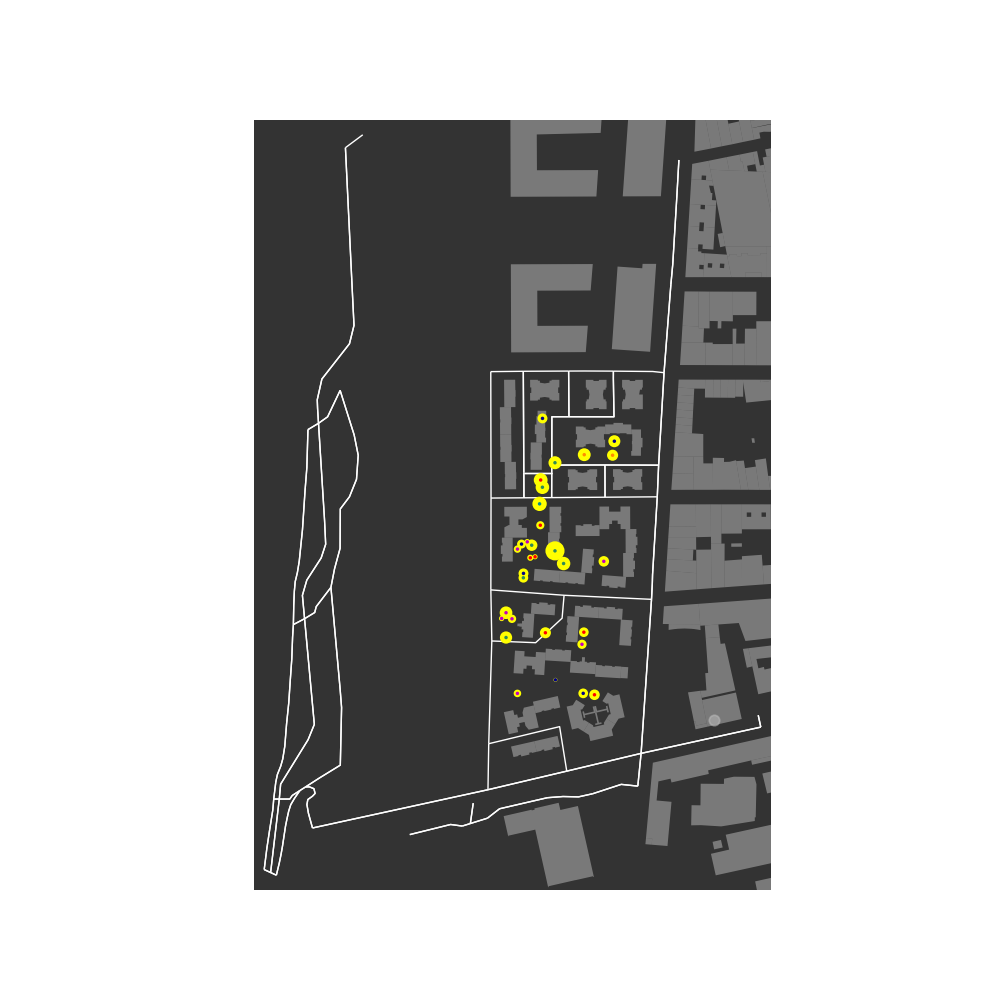

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

In [227]:


lon_accions_nens=lon_accions_e1+lon_accions_e2+lon_accions_e3+lon_accions_e4+lon_accions_e5+lon_accions_e6+lon_accions_e7
lat_accions_nens=lat_accions_e1+lat_accions_e2+lat_accions_e3+lat_accions_e4+lat_accions_e5+lat_accions_e6+lat_accions_e7

accions_nens=accions_e1+accions_e2+accions_e3+accions_e4+accions_e5+accions_e6+accions_e7
colors_nens=colors_e1+colors_e2+colors_e3+colors_e4+colors_e5+colors_e6+colors_e7

temps_nens=temps_accions_e1+temps_accions_e2+temps_accions_e3+temps_accions_e4+temps_accions_e5+temps_accions_e6+temps_accions_e7


max_temps_nens=max(temps_nens)
new_temps_nens=[]
for j in range(len(temps_nens)):
    new_temps_nens.append(temps_nens[j]/max_temps_nens)

new_temps_nens_2=[]
for i in range(len(temps_nens)):
    new_temps_nens_2.append(100*new_temps_nens[i])

    
from shapely.geometry import Point, LineString, Polygon
fig, ax = map_network2(2.2793534239822613, 41.60640928402908, 2.283956227147247,41.60640126017562,  
                       2.2837951863375023,41.60189263168001,  2.2792784442191962, 41.60145135138418)

plt.scatter(lon_accions_nens,lat_accions_nens,c='yellow',s=new_temps_nens_2)
plt.scatter(lon_accions_nens,lat_accions_nens,c=colors_nens,s=1)

#bbox_args = dict(boxstyle='square',facecolor='white', edgecolor='k',alpha=0.8)
#arrowprops=dict(arrowstyle = '->', connectionstyle='arc3,rad=0',color='white')
#for i in range(len(lon_accions_nens)):
    #plt.annotate(str(int(temps_nens[i]))+ 's'+' '+accions_nens[i], (lon_accions_nens[i], lat_accions_nens[i]),c=colors_nens[i],size=5,
                 #bbox=bbox_args,arrowprops=arrowprops, xytext=(-20, 18),textcoords='offset points')

    
    
#plt.savefig('nens.eps')

plt.show()

# 9. Stops (female gender)

C:\Users\josep\anaconda3\envs\ox\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


<IPython.core.display.Javascript object>


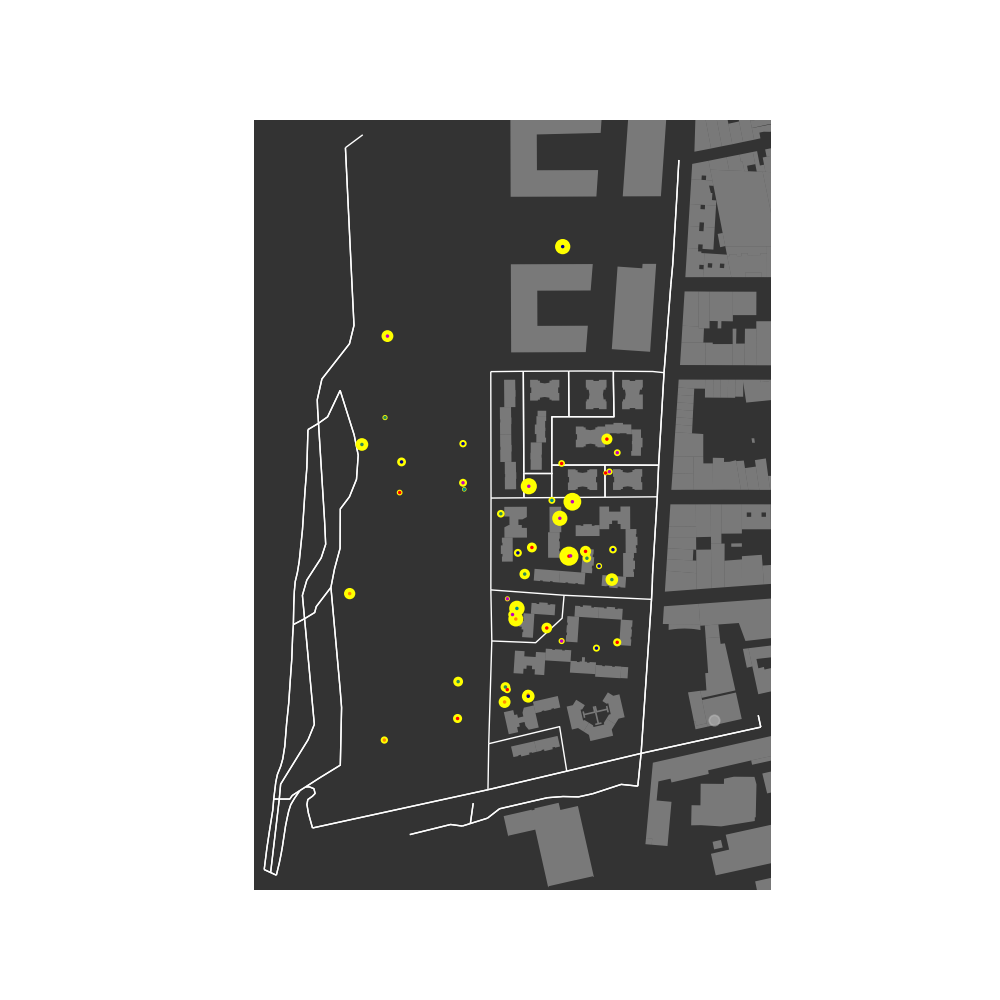

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

In [226]:


lon_accions_dones=lon_accions_p1+lon_accions_p2+lon_accions_p3+lon_accions_p4+lon_accions_g1+lon_accions_g2+lon_accions_g4+\
                  lon_accions_g5+lon_accions_g6+lon_accions_g7+lon_accions_g8

lat_accions_dones=lat_accions_p1+lat_accions_p2+lat_accions_p3+lat_accions_p4+lat_accions_g1+lat_accions_g2+lat_accions_g4+\
                  lat_accions_g5+lat_accions_g6+lat_accions_g7+lat_accions_g8


accions_dones=accions_p1+accions_p2+accions_p3+accions_p4+accions_g1+accions_g2+accions_g4+accions_g5+accions_g6+accions_g7+\
              accions_g8
colors_dones=colors_p1+colors_p2+colors_p3+colors_p4+colors_g1+colors_g2+colors_g4+colors_g5+colors_g6+colors_g7+colors_g8

temps_dones=temps_accions_p1+temps_accions_p2+temps_accions_p3+temps_accions_p4+temps_accions_g1+temps_accions_g2+\
            temps_accions_g4+temps_accions_g5+temps_accions_g6+temps_accions_g7+temps_accions_g8


max_temps_dones=max(temps_dones)
new_temps_dones=[]
for j in range(len(temps_dones)):
    new_temps_dones.append(temps_dones[j]/max_temps_dones)

new_temps_dones_2=[]
for i in range(len(temps_dones)):
    new_temps_dones_2.append(100*new_temps_dones[i])

    
from shapely.geometry import Point, LineString, Polygon
fig, ax = map_network2(2.2793534239822613, 41.60640928402908, 2.283956227147247,41.60640126017562,  
                       2.2837951863375023,41.60189263168001,  2.2792784442191962, 41.60145135138418)

plt.scatter(lon_accions_dones,lat_accions_dones,c='yellow',s=new_temps_dones_2)
plt.scatter(lon_accions_dones,lat_accions_dones,c=colors_dones,s=1)

#bbox_args = dict(boxstyle='square',facecolor='white', edgecolor='k',alpha=0.8)
#arrowprops=dict(arrowstyle = '->', connectionstyle='arc3,rad=0',color='white')
#for i in range(len(lon_accions_nens)):
    #plt.annotate(str(int(temps_nens[i]))+ 's'+' '+accions_nens[i], (lon_accions_nens[i], lat_accions_nens[i]),c=colors_nens[i],size=5,
                 #bbox=bbox_args,arrowprops=arrowprops, xytext=(-20, 18),textcoords='offset points')

    
    
#plt.savefig('dones.eps')

plt.show()

# 10. Stops (male gender)

C:\Users\josep\anaconda3\envs\ox\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


<IPython.core.display.Javascript object>


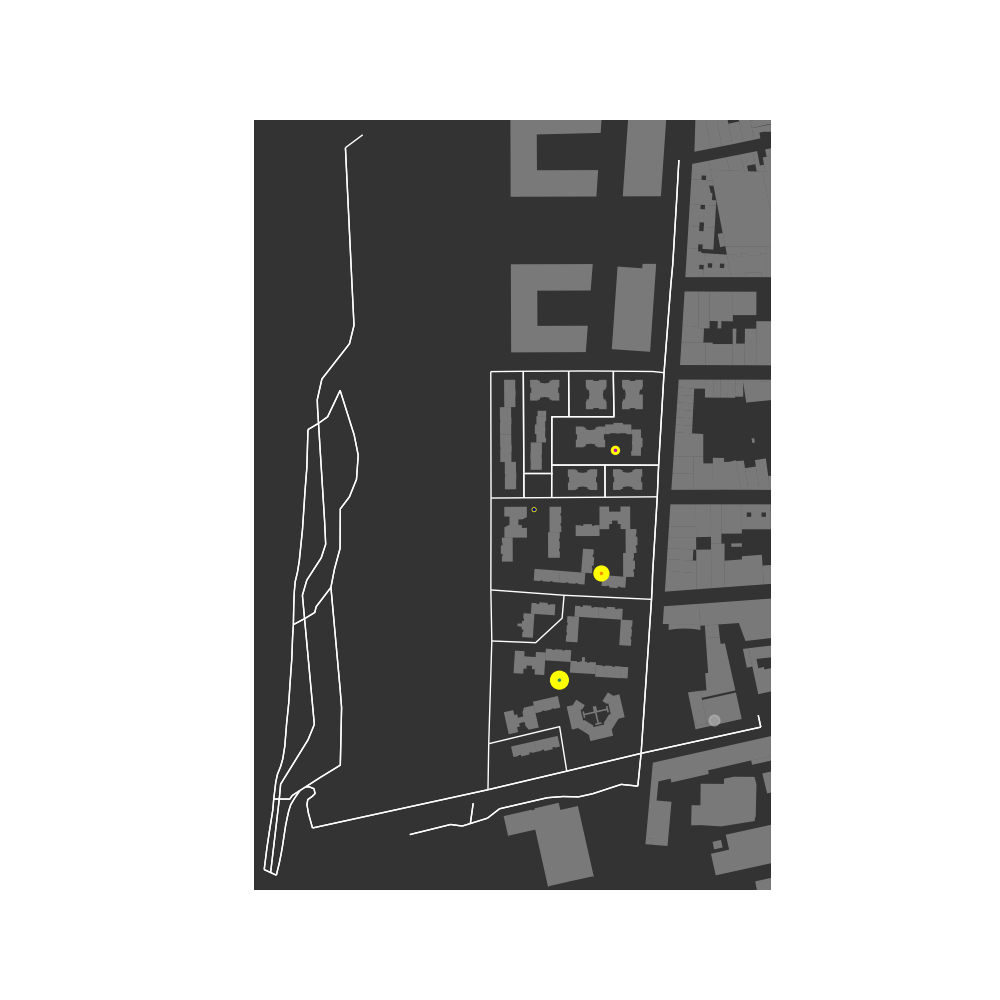

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

In [225]:


lon_accions_homes=lon_accions_g3

lat_accions_homes=lat_accions_g3

accions_homes=accions_g3

colors_homes=colors_g3

temps_homes=temps_accions_g3


max_temps_homes=max(temps_homes)
new_temps_homes=[]
for j in range(len(temps_homes)):
    new_temps_homes.append(temps_homes[j]/max_temps_homes)

new_temps_homes_2=[]
for i in range(len(temps_homes)):
    new_temps_homes_2.append(100*new_temps_homes[i])

    
from shapely.geometry import Point, LineString, Polygon
fig, ax = map_network2(2.2793534239822613, 41.60640928402908, 2.283956227147247,41.60640126017562,  
                       2.2837951863375023,41.60189263168001,  2.2792784442191962, 41.60145135138418)

plt.scatter(lon_accions_homes,lat_accions_homes,c='yellow',s=new_temps_homes_2)
plt.scatter(lon_accions_homes,lat_accions_homes,c=colors_homes,s=1)

#bbox_args = dict(boxstyle='square',facecolor='white', edgecolor='k',alpha=0.8)
#arrowprops=dict(arrowstyle = '->', connectionstyle='arc3,rad=0',color='white')
#for i in range(len(lon_accions_nens)):
    #plt.annotate(str(int(temps_nens[i]))+ 's'+' '+accions_nens[i], (lon_accions_nens[i], lat_accions_nens[i]),c=colors_nens[i],size=5,
                 #bbox=bbox_args,arrowprops=arrowprops, xytext=(-20, 18),textcoords='offset points')

    
    
#plt.savefig('homes.eps')

plt.show()